# Detección de episodios epilépticos en pacientes de 3 a 12 años mediante el análisis de EEGs con algoritmos de clasificación de Machine Learning

La base de datos utilizada para este proyecto contiene segmentos de EEG medidos durante un tiempo determinado, para los cuales se registra inicio y finalización de un episodio epiléptico, en dado caso que haya sucedido. Debido a que el desarrollo cerebral de la persona comprende un factor importante al analizar este tipo de enfermedad neurológica, nos enfocaremos solo en pacientes en su etapa de niñez (3 a 12 años), para un total de 15 sujetos de los 24 que se encuentran en la base de datos adjunta. Para la extracción de características, se encontró que normalmente se analizan la amplitud, frecuencia y morfología del segmento. Lo cual juega un rol crucial para definir los procesos involucrados en la etapa de preprocesamiento de las señales EEG, y será explicado con mayor detalle más adelante.

Para un tratamiento menos complejo de los datos se decidió el uso de 23 canales de señales EEG (Especificados en 'channel_names' más adelante), de modo que se debe verificar que todos los pacientes incluidos dentro de este estudio posean estos 23 canales y eliminar aquellos canales que no se encuentren incluidos. Aquellos segmentos de EEG que no registren alguno de los 23 canales especificados deben eliminarse de la base de datos debido a que dificultan el posterior análisis de características de las señales.

Como primer acercamiento, se seleccionaron únicamente los segmentos de EEG que contienen tanto periodos interictales (Intervalos de tiempo sin crisis epiléptica) como ictales (Intervalos de tiempo con crisis epilépticas activas) de los pacientes y según si es necesario posteriormente durante el entrenamiento y validación del modelo de ML, se decide si es necesaria la incorporación de los segmentos de EEG que sólo contienen periodos interictales con el fin de proporcionar mayor cantidad de datos.

Así, el objetivo final de este proyecto corresponde a la implementación de un sistema clasificador de periodos interictales e ictales en pacientes con epilepsia entre los 3 a 12 años mediante el análisis de segmentos de EEG basándose en técnicas de inteligencia computacional.


## Preprocesamiento de señales EEG

### Juan Diego Cabrera Moncada

### Julián David Taborda Ramírez

### Pablo Francisco Muñoz Burbano

### Instalación de librería para lectura de archivos edf

In [ ]:
# Install the necessary libraries in the same cell where you import and use them
!pip install mne pyedflib

ERROR: Operation cancelled by user


### Definición de centro de estudio del proyecto

Primero, definimos los 23 canales de cada segmento de EEG de cada paciente que vamos a analizar.

Cabe destacar que los nombres de los canales están dispuestos de modo que se agrupan como derivaciones EEG que corresponden a la diferencia de mediciones de pares de electrodos para contrarrestar artefactos y ruido en las señales resultantes. Además, esto permite resaltar cambios eléctricos locales, como actividad epileptiforme o ritmos específicos (Ondas alpha, beta, miu, etc).

In [ ]:
#import mne
from google.colab import drive

drive.mount('/content/drive')

#base_path = '/content/drive/MyDrive/EEG_For_Epileptic_Seizure_Recognition/dataset'

#ruta_edf = '/content/drive/MyDrive/EEG_For_Epileptic_Seizure_Recognition/dataset/chb01/chb01_03.edf' # Archivo edf de prueba

# Pacientes seleccionados de la base de datos (Edad entre 3 a 12 años)
subjects = [
    '01', '02', '05', '08', '09', '10', '11',
    '13', '14', '16', '17', '20', '21', '22', '23'
]

#raw = mne.io.read_raw_edf(ruta_edf, preload=True)

# Canales base a analizar en los segmentos EEG
channel_names = [
    'FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1',
    'FP1-F3', 'F3-C3', 'C3-P3', 'P3-O1',
    'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2',
    'FP2-F8', 'F8-T8', 'T8-P8-0', 'P8-O2',
    'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9',
    'FT9-FT10', 'FT10-T8', 'T8-P8-1', 'T8-P8'
]

Mounted at /content/drive


### **Reducción de dimensionalidad**

#### Por Tasa de muestreo

Desde el archivo edf de cada uno de los segmentos de EEG de cada paciente se pueden leer los canales usados así como la tasa de muestreo de los datos, la cual debe ser de 256 Hz para todos los casos. En dado caso que esta tasa de muestreo sea menor a dicho valor, se procede a descartar este segmento dentro del centro de estudio de este proyecto. Para cualquier otro caso, se ejecuta el remuestreo de las señales del segmento.

Para facilitar la lectura de archivos edf, cada paciente posee un archivo de texto 'chbXX-summary.txt' que especifica aquellos segmentos de EEG que contienen tanto periodos ictales como interictales.

In [ ]:
fs = 256 # Frecuencia de muestreo
from datetime import datetime

seizure_files = {}

def parse_time_to_seconds(time_str):
    h, m, s = map(int, time_str.strip().split(":"))
    return h * 3600 + m * 60 + s

for subject in subjects:
    path_txt = f'{base_path}/chb{subject}/chb{subject}-summary.txt'
    print(f'Procesando: chb{subject}')
    with open(path_txt, 'r') as f:
        lines = f.readlines()

    current_name = None
    start_time = None
    end_time = None
    num_seizures = 0
    seizure_start = None
    seizure_end = None

    for i, line in enumerate(lines):
        line = line.strip()
        if line.startswith("File Name:"):
            current_name = line.split(":")[1].strip()
            current_name = current_name.split(".")[0]
            # Reiniciar variables por seguridad
            start_time = None
            end_time = None
            num_seizures = 0
            seizure_start = None
            seizure_end = None
        elif line.startswith("File Start Time:"):
            start_time = parse_time_to_seconds(line.split(":", 1)[1].strip())
        elif line.startswith("File End Time:"):
            end_time = parse_time_to_seconds(line.split(":", 1)[1].strip())
        elif line.startswith("Number of Seizures in File:"):
            num_seizures = int(line.split(":")[1].strip())

            if num_seizures > 0 and current_name and start_time and end_time:
                # Buscar los tiempos de inicio y fin de la primera seizure
                seizure_starts = []
                seizure_ends = []

                j = i + 1
                while j < len(lines):
                    l = lines[j].strip()
                    if l.startswith("Seizure Start Time:"):
                        start = int(l.split(":")[1].strip().split()[0])
                        seizure_starts.append(start)
                    elif l.startswith("Seizure End Time:"):
                        end = int(l.split(":")[1].strip().split()[0])
                        seizure_ends.append(end)
                    elif l.startswith("File Name:"):
                        break  # siguiente archivo
                    j += 1
                # Calcular duración
                duration = end_time - start_time
                # Guardar en el diccionario
                key = f'chb{subject}/{current_name}'
                print(key)
                print(num_seizures)
                print(seizure_starts)
                print(seizure_ends)
                seizure_files[key] = {
                    'path': key,
                    'duration': duration,
                    'num_seizures': num_seizures,
                    'subject': subject
                }
                # Agregar cada seizure individualmente
                for idx, (s_start, s_end) in enumerate(zip(seizure_starts, seizure_ends), start=1):
                    seizure_files[key][f'seizure_{idx}_start'] = s_start
                    seizure_files[key][f'seizure_{idx}_end'] = s_end


Procesando: chb01
chb01/chb01_03
1
[2996]
[3036]
chb01/chb01_04
1
[1467]
[1494]
chb01/chb01_15
1
[1732]
[1772]
chb01/chb01_16
1
[1015]
[1066]
chb01/chb01_18
1
[1720]
[1810]
chb01/chb01_21
1
[327]
[420]
chb01/chb01_26
1
[1862]
[1963]
Procesando: chb02
chb02/chb02_16
1
[130]
[212]
chb02/chb02_16+
1
[2972]
[3053]
chb02/chb02_19
1
[3369]
[3378]
Procesando: chb05
chb05/chb05_06
1
[417]
[532]
chb05/chb05_13
1
[1086]
[1196]
chb05/chb05_16
1
[2317]
[2413]
chb05/chb05_17
1
[2451]
[2571]
chb05/chb05_22
1
[2348]
[2465]
Procesando: chb08
chb08/chb08_02
1
[2670]
[2841]
chb08/chb08_05
1
[2856]
[3046]
chb08/chb08_11
1
[2988]
[3122]
chb08/chb08_13
1
[2417]
[2577]
chb08/chb08_21
1
[2083]
[2347]
Procesando: chb09
chb09/chb09_06
1
[12231]
[12295]
chb09/chb09_08
2
[2951, 9196]
[3030, 9267]
chb09/chb09_19
1
[5299]
[5361]
Procesando: chb10
chb10/chb10_12
1
[6313]
[6348]
chb10/chb10_20
1
[6888]
[6958]
chb10/chb10_27
1
[2382]
[2447]
chb10/chb10_30
1
[3021]
[3079]
chb10/chb10_31
1
[3801]
[3877]
chb10/chb10_38


In [ ]:
isResampleNeeded = False
isAnyChannelDeleted = False

# Verificar tasa de muestreo de archivos EDF y hacer resampling si es necesario
for info in seizure_files.values():
    path = info['path']

    # Cargar archivo EDF
    edf_path = f'{base_path}/{path}.edf'
    raw = mne.io.read_raw_edf(edf_path, preload=True, verbose=False)

    # Obtener la frecuencia de muestreo (sampling rate)
    sfreq = raw.info['sfreq']
    print(f"Archivo: {path} → Sampling Rate: {sfreq} Hz")

    # Verificar si la tasa de muestreo es menor a 50 Hz
    if sfreq < 256:
        print(f"AVISO: El archivo {path} tiene una tasa de muestreo inferior a 256 Hz y no sirve para el estudio.")
        isAnyChannelDeleted = True
    # Si la tasa de muestreo no es 256 Hz, pero es mayor a 50 Hz, hacer resample
    elif sfreq > 256:
        print(f"El archivo {path} tiene una tasa de muestreo {sfreq} Hz. Se realizará un resampling a 256 Hz.")
        raw.resample(256, npad="auto")  # Resample a 256 Hz automáticamente
        isResampleNeeded = True
    else:
        print(f"El archivo {path} ya tiene una tasa de muestreo de 256 Hz.")

    # Opcional: Guardar el archivo resampleado si es necesario
    # raw.save(f'{base_path}/{path}_resampled.fif', overwrite=True)  # Guardar el archivo como .fif resampleado

if(isResampleNeeded):
    print("Se han realizado resamples");
else:
    print("No se han realizado resamples");

if(isAnyChannelDeleted):
    print("Se han eliminado canales");
else:
    print("No se han eliminado canales");
if(~isResampleNeeded & ~isAnyChannelDeleted):
  print("Como todos los segmentos de EEG de todos los pacientes registran 256 Hz de tasa de muestreo no se requieren modificaciones debido a este factor.")

<ipython-input-5-fbf04d936d0a>:10: RuntimeWarning: Channel names are not unique, found duplicates for: {'T8-P8'}. Applying running numbers for duplicates.
  raw = mne.io.read_raw_edf(edf_path, preload=True, verbose=False)


Archivo: chb01/chb01_03 → Sampling Rate: 256.0 Hz
El archivo chb01/chb01_03 ya tiene una tasa de muestreo de 256 Hz.


<ipython-input-5-fbf04d936d0a>:10: RuntimeWarning: Channel names are not unique, found duplicates for: {'T8-P8'}. Applying running numbers for duplicates.
  raw = mne.io.read_raw_edf(edf_path, preload=True, verbose=False)


Archivo: chb01/chb01_04 → Sampling Rate: 256.0 Hz
El archivo chb01/chb01_04 ya tiene una tasa de muestreo de 256 Hz.


<ipython-input-5-fbf04d936d0a>:10: RuntimeWarning: Channel names are not unique, found duplicates for: {'T8-P8'}. Applying running numbers for duplicates.
  raw = mne.io.read_raw_edf(edf_path, preload=True, verbose=False)


Archivo: chb01/chb01_15 → Sampling Rate: 256.0 Hz
El archivo chb01/chb01_15 ya tiene una tasa de muestreo de 256 Hz.


<ipython-input-5-fbf04d936d0a>:10: RuntimeWarning: Channel names are not unique, found duplicates for: {'T8-P8'}. Applying running numbers for duplicates.
  raw = mne.io.read_raw_edf(edf_path, preload=True, verbose=False)


Archivo: chb01/chb01_16 → Sampling Rate: 256.0 Hz
El archivo chb01/chb01_16 ya tiene una tasa de muestreo de 256 Hz.


<ipython-input-5-fbf04d936d0a>:10: RuntimeWarning: Channel names are not unique, found duplicates for: {'T8-P8'}. Applying running numbers for duplicates.
  raw = mne.io.read_raw_edf(edf_path, preload=True, verbose=False)


Archivo: chb01/chb01_18 → Sampling Rate: 256.0 Hz
El archivo chb01/chb01_18 ya tiene una tasa de muestreo de 256 Hz.


<ipython-input-5-fbf04d936d0a>:10: RuntimeWarning: Channel names are not unique, found duplicates for: {'T8-P8'}. Applying running numbers for duplicates.
  raw = mne.io.read_raw_edf(edf_path, preload=True, verbose=False)


Archivo: chb01/chb01_21 → Sampling Rate: 256.0 Hz
El archivo chb01/chb01_21 ya tiene una tasa de muestreo de 256 Hz.


<ipython-input-5-fbf04d936d0a>:10: RuntimeWarning: Channel names are not unique, found duplicates for: {'T8-P8'}. Applying running numbers for duplicates.
  raw = mne.io.read_raw_edf(edf_path, preload=True, verbose=False)


Archivo: chb01/chb01_26 → Sampling Rate: 256.0 Hz
El archivo chb01/chb01_26 ya tiene una tasa de muestreo de 256 Hz.


<ipython-input-5-fbf04d936d0a>:10: RuntimeWarning: Channel names are not unique, found duplicates for: {'T8-P8'}. Applying running numbers for duplicates.
  raw = mne.io.read_raw_edf(edf_path, preload=True, verbose=False)


Archivo: chb02/chb02_16 → Sampling Rate: 256.0 Hz
El archivo chb02/chb02_16 ya tiene una tasa de muestreo de 256 Hz.


<ipython-input-5-fbf04d936d0a>:10: RuntimeWarning: Channel names are not unique, found duplicates for: {'T8-P8'}. Applying running numbers for duplicates.
  raw = mne.io.read_raw_edf(edf_path, preload=True, verbose=False)


Archivo: chb02/chb02_16+ → Sampling Rate: 256.0 Hz
El archivo chb02/chb02_16+ ya tiene una tasa de muestreo de 256 Hz.


<ipython-input-5-fbf04d936d0a>:10: RuntimeWarning: Channel names are not unique, found duplicates for: {'T8-P8'}. Applying running numbers for duplicates.
  raw = mne.io.read_raw_edf(edf_path, preload=True, verbose=False)


Archivo: chb02/chb02_19 → Sampling Rate: 256.0 Hz
El archivo chb02/chb02_19 ya tiene una tasa de muestreo de 256 Hz.


<ipython-input-5-fbf04d936d0a>:10: RuntimeWarning: Channel names are not unique, found duplicates for: {'T8-P8'}. Applying running numbers for duplicates.
  raw = mne.io.read_raw_edf(edf_path, preload=True, verbose=False)


Archivo: chb05/chb05_06 → Sampling Rate: 256.0 Hz
El archivo chb05/chb05_06 ya tiene una tasa de muestreo de 256 Hz.


<ipython-input-5-fbf04d936d0a>:10: RuntimeWarning: Channel names are not unique, found duplicates for: {'T8-P8'}. Applying running numbers for duplicates.
  raw = mne.io.read_raw_edf(edf_path, preload=True, verbose=False)


Archivo: chb05/chb05_13 → Sampling Rate: 256.0 Hz
El archivo chb05/chb05_13 ya tiene una tasa de muestreo de 256 Hz.


<ipython-input-5-fbf04d936d0a>:10: RuntimeWarning: Channel names are not unique, found duplicates for: {'T8-P8'}. Applying running numbers for duplicates.
  raw = mne.io.read_raw_edf(edf_path, preload=True, verbose=False)


Archivo: chb05/chb05_16 → Sampling Rate: 256.0 Hz
El archivo chb05/chb05_16 ya tiene una tasa de muestreo de 256 Hz.


<ipython-input-5-fbf04d936d0a>:10: RuntimeWarning: Channel names are not unique, found duplicates for: {'T8-P8'}. Applying running numbers for duplicates.
  raw = mne.io.read_raw_edf(edf_path, preload=True, verbose=False)


Archivo: chb05/chb05_17 → Sampling Rate: 256.0 Hz
El archivo chb05/chb05_17 ya tiene una tasa de muestreo de 256 Hz.


<ipython-input-5-fbf04d936d0a>:10: RuntimeWarning: Channel names are not unique, found duplicates for: {'T8-P8'}. Applying running numbers for duplicates.
  raw = mne.io.read_raw_edf(edf_path, preload=True, verbose=False)


Archivo: chb05/chb05_22 → Sampling Rate: 256.0 Hz
El archivo chb05/chb05_22 ya tiene una tasa de muestreo de 256 Hz.


<ipython-input-5-fbf04d936d0a>:10: RuntimeWarning: Channel names are not unique, found duplicates for: {'T8-P8'}. Applying running numbers for duplicates.
  raw = mne.io.read_raw_edf(edf_path, preload=True, verbose=False)


Archivo: chb08/chb08_02 → Sampling Rate: 256.0 Hz
El archivo chb08/chb08_02 ya tiene una tasa de muestreo de 256 Hz.


<ipython-input-5-fbf04d936d0a>:10: RuntimeWarning: Channel names are not unique, found duplicates for: {'T8-P8'}. Applying running numbers for duplicates.
  raw = mne.io.read_raw_edf(edf_path, preload=True, verbose=False)


Archivo: chb08/chb08_05 → Sampling Rate: 256.0 Hz
El archivo chb08/chb08_05 ya tiene una tasa de muestreo de 256 Hz.


<ipython-input-5-fbf04d936d0a>:10: RuntimeWarning: Channel names are not unique, found duplicates for: {'T8-P8'}. Applying running numbers for duplicates.
  raw = mne.io.read_raw_edf(edf_path, preload=True, verbose=False)


Archivo: chb08/chb08_11 → Sampling Rate: 256.0 Hz
El archivo chb08/chb08_11 ya tiene una tasa de muestreo de 256 Hz.


<ipython-input-5-fbf04d936d0a>:10: RuntimeWarning: Channel names are not unique, found duplicates for: {'T8-P8'}. Applying running numbers for duplicates.
  raw = mne.io.read_raw_edf(edf_path, preload=True, verbose=False)


Archivo: chb08/chb08_13 → Sampling Rate: 256.0 Hz
El archivo chb08/chb08_13 ya tiene una tasa de muestreo de 256 Hz.


<ipython-input-5-fbf04d936d0a>:10: RuntimeWarning: Channel names are not unique, found duplicates for: {'T8-P8'}. Applying running numbers for duplicates.
  raw = mne.io.read_raw_edf(edf_path, preload=True, verbose=False)


Archivo: chb08/chb08_21 → Sampling Rate: 256.0 Hz
El archivo chb08/chb08_21 ya tiene una tasa de muestreo de 256 Hz.


<ipython-input-5-fbf04d936d0a>:10: RuntimeWarning: Channel names are not unique, found duplicates for: {'T8-P8'}. Applying running numbers for duplicates.
  raw = mne.io.read_raw_edf(edf_path, preload=True, verbose=False)


Archivo: chb09/chb09_06 → Sampling Rate: 256.0 Hz
El archivo chb09/chb09_06 ya tiene una tasa de muestreo de 256 Hz.


<ipython-input-5-fbf04d936d0a>:10: RuntimeWarning: Channel names are not unique, found duplicates for: {'T8-P8'}. Applying running numbers for duplicates.
  raw = mne.io.read_raw_edf(edf_path, preload=True, verbose=False)


Archivo: chb09/chb09_08 → Sampling Rate: 256.0 Hz
El archivo chb09/chb09_08 ya tiene una tasa de muestreo de 256 Hz.


<ipython-input-5-fbf04d936d0a>:10: RuntimeWarning: Channel names are not unique, found duplicates for: {'T8-P8'}. Applying running numbers for duplicates.
  raw = mne.io.read_raw_edf(edf_path, preload=True, verbose=False)


Archivo: chb09/chb09_19 → Sampling Rate: 256.0 Hz
El archivo chb09/chb09_19 ya tiene una tasa de muestreo de 256 Hz.


<ipython-input-5-fbf04d936d0a>:10: RuntimeWarning: Channel names are not unique, found duplicates for: {'T8-P8'}. Applying running numbers for duplicates.
  raw = mne.io.read_raw_edf(edf_path, preload=True, verbose=False)


Archivo: chb10/chb10_12 → Sampling Rate: 256.0 Hz
El archivo chb10/chb10_12 ya tiene una tasa de muestreo de 256 Hz.


<ipython-input-5-fbf04d936d0a>:10: RuntimeWarning: Channel names are not unique, found duplicates for: {'T8-P8'}. Applying running numbers for duplicates.
  raw = mne.io.read_raw_edf(edf_path, preload=True, verbose=False)


Archivo: chb10/chb10_20 → Sampling Rate: 256.0 Hz
El archivo chb10/chb10_20 ya tiene una tasa de muestreo de 256 Hz.


<ipython-input-5-fbf04d936d0a>:10: RuntimeWarning: Channel names are not unique, found duplicates for: {'T8-P8'}. Applying running numbers for duplicates.
  raw = mne.io.read_raw_edf(edf_path, preload=True, verbose=False)


Archivo: chb10/chb10_27 → Sampling Rate: 256.0 Hz
El archivo chb10/chb10_27 ya tiene una tasa de muestreo de 256 Hz.


<ipython-input-5-fbf04d936d0a>:10: RuntimeWarning: Channel names are not unique, found duplicates for: {'T8-P8'}. Applying running numbers for duplicates.
  raw = mne.io.read_raw_edf(edf_path, preload=True, verbose=False)


Archivo: chb10/chb10_30 → Sampling Rate: 256.0 Hz
El archivo chb10/chb10_30 ya tiene una tasa de muestreo de 256 Hz.


<ipython-input-5-fbf04d936d0a>:10: RuntimeWarning: Channel names are not unique, found duplicates for: {'T8-P8'}. Applying running numbers for duplicates.
  raw = mne.io.read_raw_edf(edf_path, preload=True, verbose=False)


Archivo: chb10/chb10_31 → Sampling Rate: 256.0 Hz
El archivo chb10/chb10_31 ya tiene una tasa de muestreo de 256 Hz.


<ipython-input-5-fbf04d936d0a>:10: RuntimeWarning: Channel names are not unique, found duplicates for: {'T8-P8'}. Applying running numbers for duplicates.
  raw = mne.io.read_raw_edf(edf_path, preload=True, verbose=False)


Archivo: chb10/chb10_38 → Sampling Rate: 256.0 Hz
El archivo chb10/chb10_38 ya tiene una tasa de muestreo de 256 Hz.


<ipython-input-5-fbf04d936d0a>:10: RuntimeWarning: Channel names are not unique, found duplicates for: {'T8-P8'}. Applying running numbers for duplicates.
  raw = mne.io.read_raw_edf(edf_path, preload=True, verbose=False)


Archivo: chb10/chb10_89 → Sampling Rate: 256.0 Hz
El archivo chb10/chb10_89 ya tiene una tasa de muestreo de 256 Hz.


<ipython-input-5-fbf04d936d0a>:10: RuntimeWarning: Channel names are not unique, found duplicates for: {'-', 'T8-P8'}. Applying running numbers for duplicates.
  raw = mne.io.read_raw_edf(edf_path, preload=True, verbose=False)


Archivo: chb11/chb11_82 → Sampling Rate: 256.0 Hz
El archivo chb11/chb11_82 ya tiene una tasa de muestreo de 256 Hz.


<ipython-input-5-fbf04d936d0a>:10: RuntimeWarning: Channel names are not unique, found duplicates for: {'-', 'T8-P8'}. Applying running numbers for duplicates.
  raw = mne.io.read_raw_edf(edf_path, preload=True, verbose=False)


Archivo: chb11/chb11_92 → Sampling Rate: 256.0 Hz
El archivo chb11/chb11_92 ya tiene una tasa de muestreo de 256 Hz.


<ipython-input-5-fbf04d936d0a>:10: RuntimeWarning: Channel names are not unique, found duplicates for: {'-', 'T8-P8'}. Applying running numbers for duplicates.
  raw = mne.io.read_raw_edf(edf_path, preload=True, verbose=False)


Archivo: chb11/chb11_99 → Sampling Rate: 256.0 Hz
El archivo chb11/chb11_99 ya tiene una tasa de muestreo de 256 Hz.


<ipython-input-5-fbf04d936d0a>:10: RuntimeWarning: Channel names are not unique, found duplicates for: {'-', 'T8-P8'}. Applying running numbers for duplicates.
  raw = mne.io.read_raw_edf(edf_path, preload=True, verbose=False)
<ipython-input-5-fbf04d936d0a>:10: RuntimeWarning: Scaling factor is not defined in following channels:
--0, --1, --2, --3, --4
  raw = mne.io.read_raw_edf(edf_path, preload=True, verbose=False)


Archivo: chb13/chb13_19 → Sampling Rate: 256.0 Hz
El archivo chb13/chb13_19 ya tiene una tasa de muestreo de 256 Hz.


<ipython-input-5-fbf04d936d0a>:10: RuntimeWarning: Channel names are not unique, found duplicates for: {'-', 'T8-P8'}. Applying running numbers for duplicates.
  raw = mne.io.read_raw_edf(edf_path, preload=True, verbose=False)
<ipython-input-5-fbf04d936d0a>:10: RuntimeWarning: Scaling factor is not defined in following channels:
--0, --1, --2, --3, --4
  raw = mne.io.read_raw_edf(edf_path, preload=True, verbose=False)


Archivo: chb13/chb13_21 → Sampling Rate: 256.0 Hz
El archivo chb13/chb13_21 ya tiene una tasa de muestreo de 256 Hz.


<ipython-input-5-fbf04d936d0a>:10: RuntimeWarning: Channel names are not unique, found duplicates for: {'-'}. Applying running numbers for duplicates.
  raw = mne.io.read_raw_edf(edf_path, preload=True, verbose=False)
<ipython-input-5-fbf04d936d0a>:10: RuntimeWarning: Scaling factor is not defined in following channels:
--0, --1, --2, --3
  raw = mne.io.read_raw_edf(edf_path, preload=True, verbose=False)


Archivo: chb13/chb13_40 → Sampling Rate: 256.0 Hz
El archivo chb13/chb13_40 ya tiene una tasa de muestreo de 256 Hz.


<ipython-input-5-fbf04d936d0a>:10: RuntimeWarning: Channel names are not unique, found duplicates for: {'-', 'T8-P8'}. Applying running numbers for duplicates.
  raw = mne.io.read_raw_edf(edf_path, preload=True, verbose=False)
<ipython-input-5-fbf04d936d0a>:10: RuntimeWarning: Scaling factor is not defined in following channels:
--0, --1, --2, --3, --4
  raw = mne.io.read_raw_edf(edf_path, preload=True, verbose=False)


Archivo: chb13/chb13_55 → Sampling Rate: 256.0 Hz
El archivo chb13/chb13_55 ya tiene una tasa de muestreo de 256 Hz.


<ipython-input-5-fbf04d936d0a>:10: RuntimeWarning: Channel names are not unique, found duplicates for: {'-', 'T8-P8'}. Applying running numbers for duplicates.
  raw = mne.io.read_raw_edf(edf_path, preload=True, verbose=False)
<ipython-input-5-fbf04d936d0a>:10: RuntimeWarning: Scaling factor is not defined in following channels:
--0, --1, --2, --3, --4
  raw = mne.io.read_raw_edf(edf_path, preload=True, verbose=False)


Archivo: chb13/chb13_58 → Sampling Rate: 256.0 Hz
El archivo chb13/chb13_58 ya tiene una tasa de muestreo de 256 Hz.


<ipython-input-5-fbf04d936d0a>:10: RuntimeWarning: Channel names are not unique, found duplicates for: {'-', 'T8-P8'}. Applying running numbers for duplicates.
  raw = mne.io.read_raw_edf(edf_path, preload=True, verbose=False)
<ipython-input-5-fbf04d936d0a>:10: RuntimeWarning: Scaling factor is not defined in following channels:
--0, --1, --2, --3, --4
  raw = mne.io.read_raw_edf(edf_path, preload=True, verbose=False)


Archivo: chb13/chb13_59 → Sampling Rate: 256.0 Hz
El archivo chb13/chb13_59 ya tiene una tasa de muestreo de 256 Hz.


<ipython-input-5-fbf04d936d0a>:10: RuntimeWarning: Channel names are not unique, found duplicates for: {'-', 'T8-P8'}. Applying running numbers for duplicates.
  raw = mne.io.read_raw_edf(edf_path, preload=True, verbose=False)
<ipython-input-5-fbf04d936d0a>:10: RuntimeWarning: Scaling factor is not defined in following channels:
--0, --1, --2, --3, --4
  raw = mne.io.read_raw_edf(edf_path, preload=True, verbose=False)


Archivo: chb13/chb13_60 → Sampling Rate: 256.0 Hz
El archivo chb13/chb13_60 ya tiene una tasa de muestreo de 256 Hz.


<ipython-input-5-fbf04d936d0a>:10: RuntimeWarning: Channel names are not unique, found duplicates for: {'-', 'T8-P8'}. Applying running numbers for duplicates.
  raw = mne.io.read_raw_edf(edf_path, preload=True, verbose=False)
<ipython-input-5-fbf04d936d0a>:10: RuntimeWarning: Scaling factor is not defined in following channels:
--0, --1, --2, --3, --4
  raw = mne.io.read_raw_edf(edf_path, preload=True, verbose=False)


Archivo: chb13/chb13_62 → Sampling Rate: 256.0 Hz
El archivo chb13/chb13_62 ya tiene una tasa de muestreo de 256 Hz.


<ipython-input-5-fbf04d936d0a>:10: RuntimeWarning: Channel names are not unique, found duplicates for: {'-', 'T8-P8'}. Applying running numbers for duplicates.
  raw = mne.io.read_raw_edf(edf_path, preload=True, verbose=False)
<ipython-input-5-fbf04d936d0a>:10: RuntimeWarning: Scaling factor is not defined in following channels:
--0, --1, --2, --3, --4
  raw = mne.io.read_raw_edf(edf_path, preload=True, verbose=False)


Archivo: chb14/chb14_03 → Sampling Rate: 256.0 Hz
El archivo chb14/chb14_03 ya tiene una tasa de muestreo de 256 Hz.


<ipython-input-5-fbf04d936d0a>:10: RuntimeWarning: Channel names are not unique, found duplicates for: {'-', 'T8-P8'}. Applying running numbers for duplicates.
  raw = mne.io.read_raw_edf(edf_path, preload=True, verbose=False)
<ipython-input-5-fbf04d936d0a>:10: RuntimeWarning: Scaling factor is not defined in following channels:
--0, --1, --2, --3, --4
  raw = mne.io.read_raw_edf(edf_path, preload=True, verbose=False)


Archivo: chb14/chb14_04 → Sampling Rate: 256.0 Hz
El archivo chb14/chb14_04 ya tiene una tasa de muestreo de 256 Hz.


<ipython-input-5-fbf04d936d0a>:10: RuntimeWarning: Channel names are not unique, found duplicates for: {'-', 'T8-P8'}. Applying running numbers for duplicates.
  raw = mne.io.read_raw_edf(edf_path, preload=True, verbose=False)
<ipython-input-5-fbf04d936d0a>:10: RuntimeWarning: Scaling factor is not defined in following channels:
--0, --1, --2, --3, --4
  raw = mne.io.read_raw_edf(edf_path, preload=True, verbose=False)


Archivo: chb14/chb14_06 → Sampling Rate: 256.0 Hz
El archivo chb14/chb14_06 ya tiene una tasa de muestreo de 256 Hz.


<ipython-input-5-fbf04d936d0a>:10: RuntimeWarning: Channel names are not unique, found duplicates for: {'-', 'T8-P8'}. Applying running numbers for duplicates.
  raw = mne.io.read_raw_edf(edf_path, preload=True, verbose=False)
<ipython-input-5-fbf04d936d0a>:10: RuntimeWarning: Scaling factor is not defined in following channels:
--0, --1, --2, --3, --4
  raw = mne.io.read_raw_edf(edf_path, preload=True, verbose=False)


Archivo: chb14/chb14_11 → Sampling Rate: 256.0 Hz
El archivo chb14/chb14_11 ya tiene una tasa de muestreo de 256 Hz.


<ipython-input-5-fbf04d936d0a>:10: RuntimeWarning: Channel names are not unique, found duplicates for: {'-', 'T8-P8'}. Applying running numbers for duplicates.
  raw = mne.io.read_raw_edf(edf_path, preload=True, verbose=False)
<ipython-input-5-fbf04d936d0a>:10: RuntimeWarning: Scaling factor is not defined in following channels:
--0, --1, --2, --3, --4
  raw = mne.io.read_raw_edf(edf_path, preload=True, verbose=False)


Archivo: chb14/chb14_17 → Sampling Rate: 256.0 Hz
El archivo chb14/chb14_17 ya tiene una tasa de muestreo de 256 Hz.


<ipython-input-5-fbf04d936d0a>:10: RuntimeWarning: Channel names are not unique, found duplicates for: {'-', 'T8-P8'}. Applying running numbers for duplicates.
  raw = mne.io.read_raw_edf(edf_path, preload=True, verbose=False)
<ipython-input-5-fbf04d936d0a>:10: RuntimeWarning: Scaling factor is not defined in following channels:
--0, --1, --2, --3, --4
  raw = mne.io.read_raw_edf(edf_path, preload=True, verbose=False)


Archivo: chb14/chb14_18 → Sampling Rate: 256.0 Hz
El archivo chb14/chb14_18 ya tiene una tasa de muestreo de 256 Hz.


<ipython-input-5-fbf04d936d0a>:10: RuntimeWarning: Channel names are not unique, found duplicates for: {'-', 'T8-P8'}. Applying running numbers for duplicates.
  raw = mne.io.read_raw_edf(edf_path, preload=True, verbose=False)
<ipython-input-5-fbf04d936d0a>:10: RuntimeWarning: Scaling factor is not defined in following channels:
--0, --1, --2, --3, --4
  raw = mne.io.read_raw_edf(edf_path, preload=True, verbose=False)


Archivo: chb14/chb14_27 → Sampling Rate: 256.0 Hz
El archivo chb14/chb14_27 ya tiene una tasa de muestreo de 256 Hz.


<ipython-input-5-fbf04d936d0a>:10: RuntimeWarning: Channel names are not unique, found duplicates for: {'-', 'T8-P8'}. Applying running numbers for duplicates.
  raw = mne.io.read_raw_edf(edf_path, preload=True, verbose=False)
<ipython-input-5-fbf04d936d0a>:10: RuntimeWarning: Scaling factor is not defined in following channels:
--0, --1, --2, --3, --4
  raw = mne.io.read_raw_edf(edf_path, preload=True, verbose=False)


Archivo: chb16/chb16_10 → Sampling Rate: 256.0 Hz
El archivo chb16/chb16_10 ya tiene una tasa de muestreo de 256 Hz.


<ipython-input-5-fbf04d936d0a>:10: RuntimeWarning: Channel names are not unique, found duplicates for: {'-', 'T8-P8'}. Applying running numbers for duplicates.
  raw = mne.io.read_raw_edf(edf_path, preload=True, verbose=False)
<ipython-input-5-fbf04d936d0a>:10: RuntimeWarning: Scaling factor is not defined in following channels:
--0, --1, --2, --3, --4
  raw = mne.io.read_raw_edf(edf_path, preload=True, verbose=False)


Archivo: chb16/chb16_11 → Sampling Rate: 256.0 Hz
El archivo chb16/chb16_11 ya tiene una tasa de muestreo de 256 Hz.


<ipython-input-5-fbf04d936d0a>:10: RuntimeWarning: Channel names are not unique, found duplicates for: {'-', 'T8-P8'}. Applying running numbers for duplicates.
  raw = mne.io.read_raw_edf(edf_path, preload=True, verbose=False)
<ipython-input-5-fbf04d936d0a>:10: RuntimeWarning: Scaling factor is not defined in following channels:
--0, --1, --2, --3, --4
  raw = mne.io.read_raw_edf(edf_path, preload=True, verbose=False)


Archivo: chb16/chb16_14 → Sampling Rate: 256.0 Hz
El archivo chb16/chb16_14 ya tiene una tasa de muestreo de 256 Hz.


<ipython-input-5-fbf04d936d0a>:10: RuntimeWarning: Channel names are not unique, found duplicates for: {'-', 'T8-P8'}. Applying running numbers for duplicates.
  raw = mne.io.read_raw_edf(edf_path, preload=True, verbose=False)
<ipython-input-5-fbf04d936d0a>:10: RuntimeWarning: Scaling factor is not defined in following channels:
--0, --1, --2, --3, --4
  raw = mne.io.read_raw_edf(edf_path, preload=True, verbose=False)


Archivo: chb16/chb16_16 → Sampling Rate: 256.0 Hz
El archivo chb16/chb16_16 ya tiene una tasa de muestreo de 256 Hz.


<ipython-input-5-fbf04d936d0a>:10: RuntimeWarning: Channel names are not unique, found duplicates for: {'-', 'T8-P8'}. Applying running numbers for duplicates.
  raw = mne.io.read_raw_edf(edf_path, preload=True, verbose=False)
<ipython-input-5-fbf04d936d0a>:10: RuntimeWarning: Scaling factor is not defined in following channels:
--0, --1, --2, --3, --4
  raw = mne.io.read_raw_edf(edf_path, preload=True, verbose=False)


Archivo: chb16/chb16_17 → Sampling Rate: 256.0 Hz
El archivo chb16/chb16_17 ya tiene una tasa de muestreo de 256 Hz.


<ipython-input-5-fbf04d936d0a>:10: RuntimeWarning: Channel names are not unique, found duplicates for: {'-'}. Applying running numbers for duplicates.
  raw = mne.io.read_raw_edf(edf_path, preload=True, verbose=False)
<ipython-input-5-fbf04d936d0a>:10: RuntimeWarning: Scaling factor is not defined in following channels:
--0, --1, --2, --3
  raw = mne.io.read_raw_edf(edf_path, preload=True, verbose=False)


Archivo: chb16/chb16_18 → Sampling Rate: 256.0 Hz
El archivo chb16/chb16_18 ya tiene una tasa de muestreo de 256 Hz.


<ipython-input-5-fbf04d936d0a>:10: RuntimeWarning: Channel names are not unique, found duplicates for: {'-', 'T8-P8'}. Applying running numbers for duplicates.
  raw = mne.io.read_raw_edf(edf_path, preload=True, verbose=False)
<ipython-input-5-fbf04d936d0a>:10: RuntimeWarning: Scaling factor is not defined in following channels:
--0, --1, --2, --3, --4
  raw = mne.io.read_raw_edf(edf_path, preload=True, verbose=False)


Archivo: chb17/chb17a_03 → Sampling Rate: 256.0 Hz
El archivo chb17/chb17a_03 ya tiene una tasa de muestreo de 256 Hz.


<ipython-input-5-fbf04d936d0a>:10: RuntimeWarning: Channel names are not unique, found duplicates for: {'-', 'T8-P8'}. Applying running numbers for duplicates.
  raw = mne.io.read_raw_edf(edf_path, preload=True, verbose=False)
<ipython-input-5-fbf04d936d0a>:10: RuntimeWarning: Scaling factor is not defined in following channels:
--0, --1, --2, --3, --4
  raw = mne.io.read_raw_edf(edf_path, preload=True, verbose=False)


Archivo: chb17/chb17a_04 → Sampling Rate: 256.0 Hz
El archivo chb17/chb17a_04 ya tiene una tasa de muestreo de 256 Hz.


<ipython-input-5-fbf04d936d0a>:10: RuntimeWarning: Channel names are not unique, found duplicates for: {'-', 'T8-P8'}. Applying running numbers for duplicates.
  raw = mne.io.read_raw_edf(edf_path, preload=True, verbose=False)
<ipython-input-5-fbf04d936d0a>:10: RuntimeWarning: Scaling factor is not defined in following channels:
--0, --1, --2, --3, --4
  raw = mne.io.read_raw_edf(edf_path, preload=True, verbose=False)


Archivo: chb17/chb17b_63 → Sampling Rate: 256.0 Hz
El archivo chb17/chb17b_63 ya tiene una tasa de muestreo de 256 Hz.


<ipython-input-5-fbf04d936d0a>:10: RuntimeWarning: Channel names are not unique, found duplicates for: {'T8-P8', '.'}. Applying running numbers for duplicates.
  raw = mne.io.read_raw_edf(edf_path, preload=True, verbose=False)


Archivo: chb20/chb20_12 → Sampling Rate: 256.0 Hz
El archivo chb20/chb20_12 ya tiene una tasa de muestreo de 256 Hz.


<ipython-input-5-fbf04d936d0a>:10: RuntimeWarning: Channel names are not unique, found duplicates for: {'T8-P8', '.'}. Applying running numbers for duplicates.
  raw = mne.io.read_raw_edf(edf_path, preload=True, verbose=False)


Archivo: chb20/chb20_13 → Sampling Rate: 256.0 Hz
El archivo chb20/chb20_13 ya tiene una tasa de muestreo de 256 Hz.


<ipython-input-5-fbf04d936d0a>:10: RuntimeWarning: Channel names are not unique, found duplicates for: {'T8-P8', '.'}. Applying running numbers for duplicates.
  raw = mne.io.read_raw_edf(edf_path, preload=True, verbose=False)


Archivo: chb20/chb20_14 → Sampling Rate: 256.0 Hz
El archivo chb20/chb20_14 ya tiene una tasa de muestreo de 256 Hz.


<ipython-input-5-fbf04d936d0a>:10: RuntimeWarning: Channel names are not unique, found duplicates for: {'T8-P8', '.'}. Applying running numbers for duplicates.
  raw = mne.io.read_raw_edf(edf_path, preload=True, verbose=False)


Archivo: chb20/chb20_15 → Sampling Rate: 256.0 Hz
El archivo chb20/chb20_15 ya tiene una tasa de muestreo de 256 Hz.


<ipython-input-5-fbf04d936d0a>:10: RuntimeWarning: Channel names are not unique, found duplicates for: {'T8-P8', '.'}. Applying running numbers for duplicates.
  raw = mne.io.read_raw_edf(edf_path, preload=True, verbose=False)


Archivo: chb20/chb20_16 → Sampling Rate: 256.0 Hz
El archivo chb20/chb20_16 ya tiene una tasa de muestreo de 256 Hz.


<ipython-input-5-fbf04d936d0a>:10: RuntimeWarning: Channel names are not unique, found duplicates for: {'T8-P8', '.'}. Applying running numbers for duplicates.
  raw = mne.io.read_raw_edf(edf_path, preload=True, verbose=False)


Archivo: chb20/chb20_68 → Sampling Rate: 256.0 Hz
El archivo chb20/chb20_68 ya tiene una tasa de muestreo de 256 Hz.


<ipython-input-5-fbf04d936d0a>:10: RuntimeWarning: Channel names are not unique, found duplicates for: {'-', 'T8-P8'}. Applying running numbers for duplicates.
  raw = mne.io.read_raw_edf(edf_path, preload=True, verbose=False)
<ipython-input-5-fbf04d936d0a>:10: RuntimeWarning: Scaling factor is not defined in following channels:
--0, --1, --2, --3, --4
  raw = mne.io.read_raw_edf(edf_path, preload=True, verbose=False)


Archivo: chb21/chb21_19 → Sampling Rate: 256.0 Hz
El archivo chb21/chb21_19 ya tiene una tasa de muestreo de 256 Hz.


<ipython-input-5-fbf04d936d0a>:10: RuntimeWarning: Channel names are not unique, found duplicates for: {'-', 'T8-P8'}. Applying running numbers for duplicates.
  raw = mne.io.read_raw_edf(edf_path, preload=True, verbose=False)
<ipython-input-5-fbf04d936d0a>:10: RuntimeWarning: Scaling factor is not defined in following channels:
--0, --1, --2, --3, --4
  raw = mne.io.read_raw_edf(edf_path, preload=True, verbose=False)


Archivo: chb21/chb21_20 → Sampling Rate: 256.0 Hz
El archivo chb21/chb21_20 ya tiene una tasa de muestreo de 256 Hz.


<ipython-input-5-fbf04d936d0a>:10: RuntimeWarning: Channel names are not unique, found duplicates for: {'-', 'T8-P8'}. Applying running numbers for duplicates.
  raw = mne.io.read_raw_edf(edf_path, preload=True, verbose=False)
<ipython-input-5-fbf04d936d0a>:10: RuntimeWarning: Scaling factor is not defined in following channels:
--0, --1, --2, --3, --4
  raw = mne.io.read_raw_edf(edf_path, preload=True, verbose=False)


Archivo: chb21/chb21_21 → Sampling Rate: 256.0 Hz
El archivo chb21/chb21_21 ya tiene una tasa de muestreo de 256 Hz.


<ipython-input-5-fbf04d936d0a>:10: RuntimeWarning: Channel names are not unique, found duplicates for: {'-', 'T8-P8'}. Applying running numbers for duplicates.
  raw = mne.io.read_raw_edf(edf_path, preload=True, verbose=False)
<ipython-input-5-fbf04d936d0a>:10: RuntimeWarning: Scaling factor is not defined in following channels:
--0, --1, --2, --3, --4
  raw = mne.io.read_raw_edf(edf_path, preload=True, verbose=False)


Archivo: chb21/chb21_22 → Sampling Rate: 256.0 Hz
El archivo chb21/chb21_22 ya tiene una tasa de muestreo de 256 Hz.


<ipython-input-5-fbf04d936d0a>:10: RuntimeWarning: Channel names are not unique, found duplicates for: {'-', 'T8-P8'}. Applying running numbers for duplicates.
  raw = mne.io.read_raw_edf(edf_path, preload=True, verbose=False)


Archivo: chb22/chb22_20 → Sampling Rate: 256.0 Hz
El archivo chb22/chb22_20 ya tiene una tasa de muestreo de 256 Hz.


<ipython-input-5-fbf04d936d0a>:10: RuntimeWarning: Channel names are not unique, found duplicates for: {'-', 'T8-P8'}. Applying running numbers for duplicates.
  raw = mne.io.read_raw_edf(edf_path, preload=True, verbose=False)


Archivo: chb22/chb22_25 → Sampling Rate: 256.0 Hz
El archivo chb22/chb22_25 ya tiene una tasa de muestreo de 256 Hz.


<ipython-input-5-fbf04d936d0a>:10: RuntimeWarning: Channel names are not unique, found duplicates for: {'-', 'T8-P8'}. Applying running numbers for duplicates.
  raw = mne.io.read_raw_edf(edf_path, preload=True, verbose=False)


Archivo: chb22/chb22_38 → Sampling Rate: 256.0 Hz
El archivo chb22/chb22_38 ya tiene una tasa de muestreo de 256 Hz.


<ipython-input-5-fbf04d936d0a>:10: RuntimeWarning: Channel names are not unique, found duplicates for: {'T8-P8'}. Applying running numbers for duplicates.
  raw = mne.io.read_raw_edf(edf_path, preload=True, verbose=False)


Archivo: chb23/chb23_06 → Sampling Rate: 256.0 Hz
El archivo chb23/chb23_06 ya tiene una tasa de muestreo de 256 Hz.


<ipython-input-5-fbf04d936d0a>:10: RuntimeWarning: Channel names are not unique, found duplicates for: {'T8-P8'}. Applying running numbers for duplicates.
  raw = mne.io.read_raw_edf(edf_path, preload=True, verbose=False)


Archivo: chb23/chb23_08 → Sampling Rate: 256.0 Hz
El archivo chb23/chb23_08 ya tiene una tasa de muestreo de 256 Hz.


<ipython-input-5-fbf04d936d0a>:10: RuntimeWarning: Channel names are not unique, found duplicates for: {'T8-P8'}. Applying running numbers for duplicates.
  raw = mne.io.read_raw_edf(edf_path, preload=True, verbose=False)


Archivo: chb23/chb23_09 → Sampling Rate: 256.0 Hz
El archivo chb23/chb23_09 ya tiene una tasa de muestreo de 256 Hz.
No se han realizado resamples
No se han eliminado canales
Como todos los segmentos de EEG de todos los pacientes registran 256 Hz de tasa de muestreo no se requieren modificaciones debido a este factor.


Tiempo total de seizure: 5822 segundos
Tiempo total de non-seizure: 320588 segundos


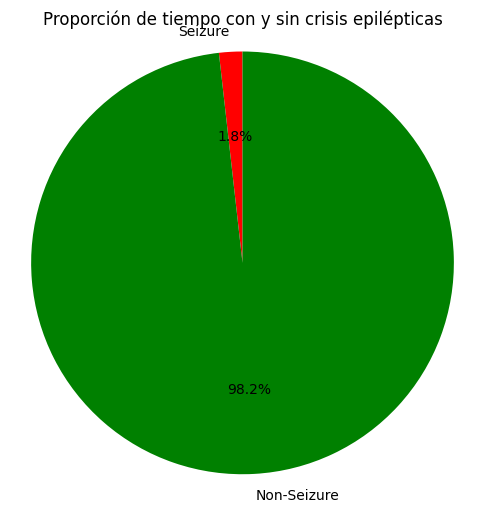

In [ ]:
import matplotlib.pyplot as plt

total_seizure_time = 0
total_non_seizure_time = 0

for data in seizure_files.values():
    duration = data['duration']
    num_seizures = data['num_seizures']

    if num_seizures > 0:
        seizure_time = 0
        for i in range(1, num_seizures + 1):
            start = data.get(f'seizure_{i}_start', 0)
            end = data.get(f'seizure_{i}_end', 0)
            seizure_time += end - start
        non_seizure_time = duration - seizure_time
    else:
        seizure_time = 0
        non_seizure_time = duration

    total_seizure_time += seizure_time
    total_non_seizure_time += non_seizure_time

# Mostrar resultados
print(f"Tiempo total de seizure: {total_seizure_time} segundos")
print(f"Tiempo total de non-seizure: {total_non_seizure_time} segundos")

# Gráfico
labels = ['Seizure', 'Non-Seizure']
times = [total_seizure_time, total_non_seizure_time]
colors = ['red', 'green']

plt.figure(figsize=(6, 6))
plt.pie(times, labels=labels, autopct='%1.1f%%', colors=colors, startangle=90)
plt.title('Proporción de tiempo con y sin crisis epilépticas')
plt.axis('equal')
plt.show()


#### Por Selección de Canales

Teniendo en cuenta el modo de disposición de los canales, dados los canales mencionados en 'channel_names', se observa que T7-P7 y P7-T7 hacen referencia al inverso del otro, por lo cual resulta sencillo simplemente descartar uno de ellos para reducir la dimensionalidad del asunto. En adición a esto, si analizamos T8-P8-0 y T8-P8-1, se observa que contienen los mismos datos, por lo tanto también se procede a eliminar uno de ellos, en nuestro caso eliminamos T8-P8-1, y en dado caso que el paciente posea únicamente un canal para T8-P8, no se requiere descartar este canal.

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
Using matplotlib as 2D backend.


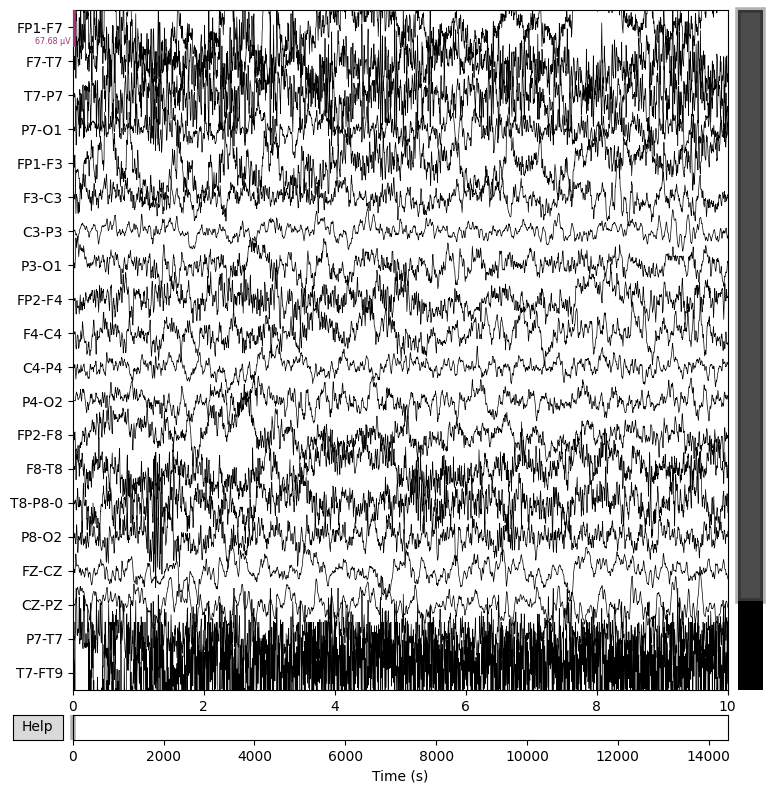

Correlación entre T8-P8-0 y T8-P8-1: 1.000


<ipython-input-7-f344d9a49522>:26: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


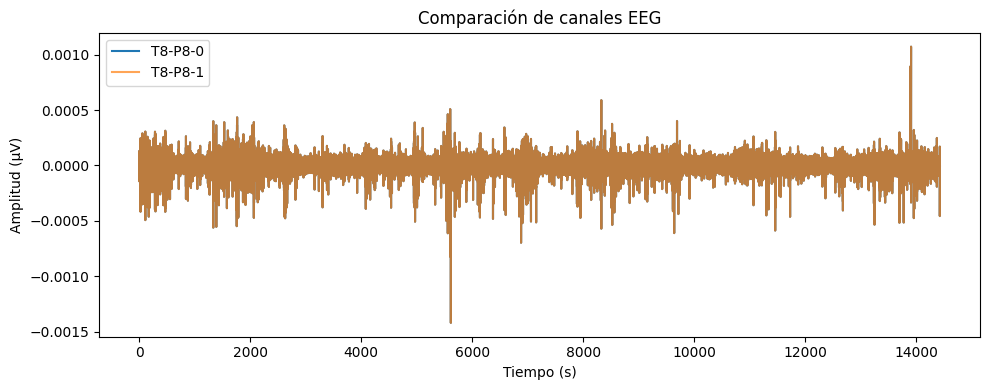

✅ Los dos canales son idénticos en todos sus valores.


In [ ]:
channel_analysis = raw.copy()
channel_analysis.pick_channels([channel_names[14], channel_names[22]])
raw.plot(scalings='auto')

# Extraer datos de los dos canales como arrays
data, times = channel_analysis[:, :]  # data.shape = (n_canales, n_muestras)

# Elige dos canales por nombre o índice, por ejemplo:
ch1 = data[0, :]  # canal 14
ch2 = data[1, :]  # canal 22

import numpy as np

correlacion = np.corrcoef(ch1, ch2)[0, 1]
print(f'Correlación entre T8-P8-0 y T8-P8-1: {correlacion:.3f}')

import matplotlib.pyplot as plt

plt.figure(figsize=(10, 4))
plt.plot(times, ch1, label='T8-P8-0')
plt.plot(times, ch2, label='T8-P8-1', alpha=0.7)
plt.xlabel('Tiempo (s)')
plt.ylabel('Amplitud (µV)')
plt.legend()
plt.title('Comparación de canales EEG')
plt.tight_layout()
plt.show()

son_iguales = np.array_equal(ch1, ch2)

if son_iguales:
    print("✅ Los dos canales son idénticos en todos sus valores.")
else:
    print("❌ Los canales NO son idénticos.")

In [ ]:
from collections import defaultdict
import os

base_folder = '/content/pacientes'

for subject in subjects:
    folder_name = f'chb{subject}'
    path = os.path.join(base_folder, folder_name)
    os.makedirs(path, exist_ok=True)

# Función auxiliar para invertir nombres de canales (ej: "P7-T7" → "T7-P7")
def invert_channel(ch):
    parts = ch.split('-')
    return '-'.join(reversed(parts)) if len(parts) == 2 else ch

# Lista para guardar claves inválidas
invalid_keys = []

for key, info in seizure_files.items():
    path = info['path']
    edf_path = f'{base_path}/{path}.edf'
    try:
        raw = mne.io.read_raw_edf(edf_path, preload=True, verbose=False)
    except Exception as e:
        print(f"⚠️ Error cargando {path}: {e}")
        invalid_keys.append(key)
        continue

    edf_channels = raw.info['ch_names']
    print(f"Procesando: {path} → Canales: {edf_channels}")
    seen = set()
    to_drop = set()
    count_valid = 0

    # 1. Eliminar duplicados tipo T8-P8-0, T8-P8-1 (mantener -0 o el único)
    channel_base_map = defaultdict(list)
    for ch in edf_channels:
        base = ch.split('-')[0] + '-' + ch.split('-')[1] if '-' in ch else ch
        channel_base_map[base].append(ch)

    for base, variants in channel_base_map.items():
        variants.sort()  # Asegura que -0 quede primero
        to_drop.update(variants[1:])

    # 2. Eliminar canales que son el inverso de otros (ej. P7-T7 si ya está T7-P7) o que no están incluidos entre los 23 canales
    for ch in edf_channels:
        if ch in to_drop:
            continue
        inv = invert_channel(ch)
        if inv in seen or ch not in channel_names:
            to_drop.add(ch)
        else:
            seen.add(ch)

    # 3. Contar cuántos canales válidos quedan
    for ch in edf_channels:
        if ch not in to_drop and ch in channel_names:
            count_valid += 1

    # 4. Eliminar canales descartados (solo en memoria, no modifica el archivo EDF original)
    if to_drop:
        raw.drop_channels(list(to_drop))

    # 5. Evaluar si el segmento es válido o no
    if count_valid == 21:
        print(f"✅ Segmento válido ({count_valid} canales válidos) → {path}")
        info['valid_segment'] = True

        # Guardar en carpeta correspondiente
        subject_folder = os.path.join(base_folder, path.split('/')[0])
        filename = os.path.splitext(os.path.basename(path))[0] + '.fif'
        save_path = os.path.join(subject_folder, filename)
        raw.set_meas_date(None)
        info['path'] = save_path
        raw.save(save_path, overwrite=True)
    else:
        print(f"❌ Segmento inválido ({count_valid} canales válidos) → {path}")
        invalid_keys.append(key)
        info['valid_segment'] = False
#  Eliminar segmentos inválidos del diccionario
for key in invalid_keys:
    del seizure_files[key]

<ipython-input-8-132db3f8177f>:23: RuntimeWarning: Channel names are not unique, found duplicates for: {'T8-P8'}. Applying running numbers for duplicates.
  raw = mne.io.read_raw_edf(edf_path, preload=True, verbose=False)


Procesando: chb01/chb01_03 → Canales: ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3', 'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8', 'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
✅ Segmento válido (21 canales válidos) → chb01/chb01_03
Writing /content/pacientes/chb01/chb01_03.fif


<ipython-input-8-132db3f8177f>:75: RuntimeWarning: This filename (/content/pacientes/chb01/chb01_03.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  raw.save(save_path, overwrite=True)


Closing /content/pacientes/chb01/chb01_03.fif
[done]


<ipython-input-8-132db3f8177f>:23: RuntimeWarning: Channel names are not unique, found duplicates for: {'T8-P8'}. Applying running numbers for duplicates.
  raw = mne.io.read_raw_edf(edf_path, preload=True, verbose=False)


Procesando: chb01/chb01_04 → Canales: ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3', 'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8', 'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
✅ Segmento válido (21 canales válidos) → chb01/chb01_04
Writing /content/pacientes/chb01/chb01_04.fif


<ipython-input-8-132db3f8177f>:75: RuntimeWarning: This filename (/content/pacientes/chb01/chb01_04.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  raw.save(save_path, overwrite=True)


Closing /content/pacientes/chb01/chb01_04.fif
[done]


<ipython-input-8-132db3f8177f>:23: RuntimeWarning: Channel names are not unique, found duplicates for: {'T8-P8'}. Applying running numbers for duplicates.
  raw = mne.io.read_raw_edf(edf_path, preload=True, verbose=False)


Procesando: chb01/chb01_15 → Canales: ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3', 'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8', 'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
✅ Segmento válido (21 canales válidos) → chb01/chb01_15
Writing /content/pacientes/chb01/chb01_15.fif


<ipython-input-8-132db3f8177f>:75: RuntimeWarning: This filename (/content/pacientes/chb01/chb01_15.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  raw.save(save_path, overwrite=True)


Closing /content/pacientes/chb01/chb01_15.fif
[done]


<ipython-input-8-132db3f8177f>:23: RuntimeWarning: Channel names are not unique, found duplicates for: {'T8-P8'}. Applying running numbers for duplicates.
  raw = mne.io.read_raw_edf(edf_path, preload=True, verbose=False)


Procesando: chb01/chb01_16 → Canales: ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3', 'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8', 'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
✅ Segmento válido (21 canales válidos) → chb01/chb01_16
Writing /content/pacientes/chb01/chb01_16.fif


<ipython-input-8-132db3f8177f>:75: RuntimeWarning: This filename (/content/pacientes/chb01/chb01_16.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  raw.save(save_path, overwrite=True)


Closing /content/pacientes/chb01/chb01_16.fif
[done]


<ipython-input-8-132db3f8177f>:23: RuntimeWarning: Channel names are not unique, found duplicates for: {'T8-P8'}. Applying running numbers for duplicates.
  raw = mne.io.read_raw_edf(edf_path, preload=True, verbose=False)


Procesando: chb01/chb01_18 → Canales: ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3', 'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8', 'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
✅ Segmento válido (21 canales válidos) → chb01/chb01_18
Writing /content/pacientes/chb01/chb01_18.fif


<ipython-input-8-132db3f8177f>:75: RuntimeWarning: This filename (/content/pacientes/chb01/chb01_18.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  raw.save(save_path, overwrite=True)


Closing /content/pacientes/chb01/chb01_18.fif
[done]


<ipython-input-8-132db3f8177f>:23: RuntimeWarning: Channel names are not unique, found duplicates for: {'T8-P8'}. Applying running numbers for duplicates.
  raw = mne.io.read_raw_edf(edf_path, preload=True, verbose=False)


Procesando: chb01/chb01_21 → Canales: ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3', 'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8', 'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
✅ Segmento válido (21 canales válidos) → chb01/chb01_21
Writing /content/pacientes/chb01/chb01_21.fif


<ipython-input-8-132db3f8177f>:75: RuntimeWarning: This filename (/content/pacientes/chb01/chb01_21.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  raw.save(save_path, overwrite=True)


Closing /content/pacientes/chb01/chb01_21.fif
[done]


<ipython-input-8-132db3f8177f>:23: RuntimeWarning: Channel names are not unique, found duplicates for: {'T8-P8'}. Applying running numbers for duplicates.
  raw = mne.io.read_raw_edf(edf_path, preload=True, verbose=False)


Procesando: chb01/chb01_26 → Canales: ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3', 'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8', 'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
✅ Segmento válido (21 canales válidos) → chb01/chb01_26
Writing /content/pacientes/chb01/chb01_26.fif


<ipython-input-8-132db3f8177f>:75: RuntimeWarning: This filename (/content/pacientes/chb01/chb01_26.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  raw.save(save_path, overwrite=True)


Closing /content/pacientes/chb01/chb01_26.fif
[done]
Procesando: chb02/chb02_16 → Canales: ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3', 'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8', 'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']


<ipython-input-8-132db3f8177f>:23: RuntimeWarning: Channel names are not unique, found duplicates for: {'T8-P8'}. Applying running numbers for duplicates.
  raw = mne.io.read_raw_edf(edf_path, preload=True, verbose=False)


✅ Segmento válido (21 canales válidos) → chb02/chb02_16
Writing /content/pacientes/chb02/chb02_16.fif


<ipython-input-8-132db3f8177f>:75: RuntimeWarning: This filename (/content/pacientes/chb02/chb02_16.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  raw.save(save_path, overwrite=True)


Closing /content/pacientes/chb02/chb02_16.fif
[done]


<ipython-input-8-132db3f8177f>:23: RuntimeWarning: Channel names are not unique, found duplicates for: {'T8-P8'}. Applying running numbers for duplicates.
  raw = mne.io.read_raw_edf(edf_path, preload=True, verbose=False)


Procesando: chb02/chb02_16+ → Canales: ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3', 'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8', 'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
✅ Segmento válido (21 canales válidos) → chb02/chb02_16+
Writing /content/pacientes/chb02/chb02_16+.fif


<ipython-input-8-132db3f8177f>:75: RuntimeWarning: This filename (/content/pacientes/chb02/chb02_16+.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  raw.save(save_path, overwrite=True)


Closing /content/pacientes/chb02/chb02_16+.fif
[done]


<ipython-input-8-132db3f8177f>:23: RuntimeWarning: Channel names are not unique, found duplicates for: {'T8-P8'}. Applying running numbers for duplicates.
  raw = mne.io.read_raw_edf(edf_path, preload=True, verbose=False)


Procesando: chb02/chb02_19 → Canales: ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3', 'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8', 'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
✅ Segmento válido (21 canales válidos) → chb02/chb02_19
Writing /content/pacientes/chb02/chb02_19.fif


<ipython-input-8-132db3f8177f>:75: RuntimeWarning: This filename (/content/pacientes/chb02/chb02_19.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  raw.save(save_path, overwrite=True)


Closing /content/pacientes/chb02/chb02_19.fif
[done]


<ipython-input-8-132db3f8177f>:23: RuntimeWarning: Channel names are not unique, found duplicates for: {'T8-P8'}. Applying running numbers for duplicates.
  raw = mne.io.read_raw_edf(edf_path, preload=True, verbose=False)


Procesando: chb05/chb05_06 → Canales: ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3', 'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8', 'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
✅ Segmento válido (21 canales válidos) → chb05/chb05_06
Writing /content/pacientes/chb05/chb05_06.fif


<ipython-input-8-132db3f8177f>:75: RuntimeWarning: This filename (/content/pacientes/chb05/chb05_06.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  raw.save(save_path, overwrite=True)


Closing /content/pacientes/chb05/chb05_06.fif
[done]


<ipython-input-8-132db3f8177f>:23: RuntimeWarning: Channel names are not unique, found duplicates for: {'T8-P8'}. Applying running numbers for duplicates.
  raw = mne.io.read_raw_edf(edf_path, preload=True, verbose=False)


Procesando: chb05/chb05_13 → Canales: ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3', 'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8', 'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
✅ Segmento válido (21 canales válidos) → chb05/chb05_13
Writing /content/pacientes/chb05/chb05_13.fif


<ipython-input-8-132db3f8177f>:75: RuntimeWarning: This filename (/content/pacientes/chb05/chb05_13.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  raw.save(save_path, overwrite=True)


Closing /content/pacientes/chb05/chb05_13.fif
[done]


<ipython-input-8-132db3f8177f>:23: RuntimeWarning: Channel names are not unique, found duplicates for: {'T8-P8'}. Applying running numbers for duplicates.
  raw = mne.io.read_raw_edf(edf_path, preload=True, verbose=False)


Procesando: chb05/chb05_16 → Canales: ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3', 'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8', 'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
✅ Segmento válido (21 canales válidos) → chb05/chb05_16
Writing /content/pacientes/chb05/chb05_16.fif


<ipython-input-8-132db3f8177f>:75: RuntimeWarning: This filename (/content/pacientes/chb05/chb05_16.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  raw.save(save_path, overwrite=True)


Closing /content/pacientes/chb05/chb05_16.fif
[done]


<ipython-input-8-132db3f8177f>:23: RuntimeWarning: Channel names are not unique, found duplicates for: {'T8-P8'}. Applying running numbers for duplicates.
  raw = mne.io.read_raw_edf(edf_path, preload=True, verbose=False)


Procesando: chb05/chb05_17 → Canales: ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3', 'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8', 'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
✅ Segmento válido (21 canales válidos) → chb05/chb05_17
Writing /content/pacientes/chb05/chb05_17.fif


<ipython-input-8-132db3f8177f>:75: RuntimeWarning: This filename (/content/pacientes/chb05/chb05_17.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  raw.save(save_path, overwrite=True)


Closing /content/pacientes/chb05/chb05_17.fif
[done]


<ipython-input-8-132db3f8177f>:23: RuntimeWarning: Channel names are not unique, found duplicates for: {'T8-P8'}. Applying running numbers for duplicates.
  raw = mne.io.read_raw_edf(edf_path, preload=True, verbose=False)


Procesando: chb05/chb05_22 → Canales: ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3', 'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8', 'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
✅ Segmento válido (21 canales válidos) → chb05/chb05_22
Writing /content/pacientes/chb05/chb05_22.fif


<ipython-input-8-132db3f8177f>:75: RuntimeWarning: This filename (/content/pacientes/chb05/chb05_22.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  raw.save(save_path, overwrite=True)


Closing /content/pacientes/chb05/chb05_22.fif
[done]


<ipython-input-8-132db3f8177f>:23: RuntimeWarning: Channel names are not unique, found duplicates for: {'T8-P8'}. Applying running numbers for duplicates.
  raw = mne.io.read_raw_edf(edf_path, preload=True, verbose=False)


Procesando: chb08/chb08_02 → Canales: ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3', 'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8', 'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
✅ Segmento válido (21 canales válidos) → chb08/chb08_02
Writing /content/pacientes/chb08/chb08_02.fif


<ipython-input-8-132db3f8177f>:75: RuntimeWarning: This filename (/content/pacientes/chb08/chb08_02.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  raw.save(save_path, overwrite=True)


Closing /content/pacientes/chb08/chb08_02.fif
[done]


<ipython-input-8-132db3f8177f>:23: RuntimeWarning: Channel names are not unique, found duplicates for: {'T8-P8'}. Applying running numbers for duplicates.
  raw = mne.io.read_raw_edf(edf_path, preload=True, verbose=False)


Procesando: chb08/chb08_05 → Canales: ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3', 'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8', 'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
✅ Segmento válido (21 canales válidos) → chb08/chb08_05
Writing /content/pacientes/chb08/chb08_05.fif


<ipython-input-8-132db3f8177f>:75: RuntimeWarning: This filename (/content/pacientes/chb08/chb08_05.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  raw.save(save_path, overwrite=True)


Closing /content/pacientes/chb08/chb08_05.fif
[done]


<ipython-input-8-132db3f8177f>:23: RuntimeWarning: Channel names are not unique, found duplicates for: {'T8-P8'}. Applying running numbers for duplicates.
  raw = mne.io.read_raw_edf(edf_path, preload=True, verbose=False)


Procesando: chb08/chb08_11 → Canales: ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3', 'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8', 'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
✅ Segmento válido (21 canales válidos) → chb08/chb08_11
Writing /content/pacientes/chb08/chb08_11.fif


<ipython-input-8-132db3f8177f>:75: RuntimeWarning: This filename (/content/pacientes/chb08/chb08_11.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  raw.save(save_path, overwrite=True)


Closing /content/pacientes/chb08/chb08_11.fif
[done]


<ipython-input-8-132db3f8177f>:23: RuntimeWarning: Channel names are not unique, found duplicates for: {'T8-P8'}. Applying running numbers for duplicates.
  raw = mne.io.read_raw_edf(edf_path, preload=True, verbose=False)


Procesando: chb08/chb08_13 → Canales: ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3', 'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8', 'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
✅ Segmento válido (21 canales válidos) → chb08/chb08_13
Writing /content/pacientes/chb08/chb08_13.fif


<ipython-input-8-132db3f8177f>:75: RuntimeWarning: This filename (/content/pacientes/chb08/chb08_13.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  raw.save(save_path, overwrite=True)


Closing /content/pacientes/chb08/chb08_13.fif
[done]


<ipython-input-8-132db3f8177f>:23: RuntimeWarning: Channel names are not unique, found duplicates for: {'T8-P8'}. Applying running numbers for duplicates.
  raw = mne.io.read_raw_edf(edf_path, preload=True, verbose=False)


Procesando: chb08/chb08_21 → Canales: ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3', 'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8', 'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
✅ Segmento válido (21 canales válidos) → chb08/chb08_21
Writing /content/pacientes/chb08/chb08_21.fif


<ipython-input-8-132db3f8177f>:75: RuntimeWarning: This filename (/content/pacientes/chb08/chb08_21.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  raw.save(save_path, overwrite=True)


Closing /content/pacientes/chb08/chb08_21.fif
[done]


<ipython-input-8-132db3f8177f>:23: RuntimeWarning: Channel names are not unique, found duplicates for: {'T8-P8'}. Applying running numbers for duplicates.
  raw = mne.io.read_raw_edf(edf_path, preload=True, verbose=False)


Procesando: chb09/chb09_06 → Canales: ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3', 'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8', 'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1', 'VNS']
✅ Segmento válido (21 canales válidos) → chb09/chb09_06
Writing /content/pacientes/chb09/chb09_06.fif


<ipython-input-8-132db3f8177f>:75: RuntimeWarning: This filename (/content/pacientes/chb09/chb09_06.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  raw.save(save_path, overwrite=True)


Closing /content/pacientes/chb09/chb09_06.fif
[done]


<ipython-input-8-132db3f8177f>:23: RuntimeWarning: Channel names are not unique, found duplicates for: {'T8-P8'}. Applying running numbers for duplicates.
  raw = mne.io.read_raw_edf(edf_path, preload=True, verbose=False)


Procesando: chb09/chb09_08 → Canales: ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3', 'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8', 'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1', 'VNS']
✅ Segmento válido (21 canales válidos) → chb09/chb09_08
Writing /content/pacientes/chb09/chb09_08.fif


<ipython-input-8-132db3f8177f>:75: RuntimeWarning: This filename (/content/pacientes/chb09/chb09_08.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  raw.save(save_path, overwrite=True)


Closing /content/pacientes/chb09/chb09_08.fif
[done]


<ipython-input-8-132db3f8177f>:23: RuntimeWarning: Channel names are not unique, found duplicates for: {'T8-P8'}. Applying running numbers for duplicates.
  raw = mne.io.read_raw_edf(edf_path, preload=True, verbose=False)


Procesando: chb09/chb09_19 → Canales: ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3', 'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8', 'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1', 'VNS']
✅ Segmento válido (21 canales válidos) → chb09/chb09_19
Writing /content/pacientes/chb09/chb09_19.fif


<ipython-input-8-132db3f8177f>:75: RuntimeWarning: This filename (/content/pacientes/chb09/chb09_19.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  raw.save(save_path, overwrite=True)


Closing /content/pacientes/chb09/chb09_19.fif
[done]


<ipython-input-8-132db3f8177f>:23: RuntimeWarning: Channel names are not unique, found duplicates for: {'T8-P8'}. Applying running numbers for duplicates.
  raw = mne.io.read_raw_edf(edf_path, preload=True, verbose=False)


Procesando: chb10/chb10_12 → Canales: ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3', 'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8', 'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
✅ Segmento válido (21 canales válidos) → chb10/chb10_12
Writing /content/pacientes/chb10/chb10_12.fif


<ipython-input-8-132db3f8177f>:75: RuntimeWarning: This filename (/content/pacientes/chb10/chb10_12.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  raw.save(save_path, overwrite=True)


Closing /content/pacientes/chb10/chb10_12.fif
[done]


<ipython-input-8-132db3f8177f>:23: RuntimeWarning: Channel names are not unique, found duplicates for: {'T8-P8'}. Applying running numbers for duplicates.
  raw = mne.io.read_raw_edf(edf_path, preload=True, verbose=False)


Procesando: chb10/chb10_20 → Canales: ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3', 'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8', 'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
✅ Segmento válido (21 canales válidos) → chb10/chb10_20
Writing /content/pacientes/chb10/chb10_20.fif


<ipython-input-8-132db3f8177f>:75: RuntimeWarning: This filename (/content/pacientes/chb10/chb10_20.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  raw.save(save_path, overwrite=True)


Closing /content/pacientes/chb10/chb10_20.fif
[done]


<ipython-input-8-132db3f8177f>:23: RuntimeWarning: Channel names are not unique, found duplicates for: {'T8-P8'}. Applying running numbers for duplicates.
  raw = mne.io.read_raw_edf(edf_path, preload=True, verbose=False)


Procesando: chb10/chb10_27 → Canales: ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3', 'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8', 'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
✅ Segmento válido (21 canales válidos) → chb10/chb10_27
Writing /content/pacientes/chb10/chb10_27.fif


<ipython-input-8-132db3f8177f>:75: RuntimeWarning: This filename (/content/pacientes/chb10/chb10_27.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  raw.save(save_path, overwrite=True)


Closing /content/pacientes/chb10/chb10_27.fif
[done]


<ipython-input-8-132db3f8177f>:23: RuntimeWarning: Channel names are not unique, found duplicates for: {'T8-P8'}. Applying running numbers for duplicates.
  raw = mne.io.read_raw_edf(edf_path, preload=True, verbose=False)


Procesando: chb10/chb10_30 → Canales: ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3', 'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8', 'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
✅ Segmento válido (21 canales válidos) → chb10/chb10_30
Writing /content/pacientes/chb10/chb10_30.fif


<ipython-input-8-132db3f8177f>:75: RuntimeWarning: This filename (/content/pacientes/chb10/chb10_30.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  raw.save(save_path, overwrite=True)


Closing /content/pacientes/chb10/chb10_30.fif
[done]


<ipython-input-8-132db3f8177f>:23: RuntimeWarning: Channel names are not unique, found duplicates for: {'T8-P8'}. Applying running numbers for duplicates.
  raw = mne.io.read_raw_edf(edf_path, preload=True, verbose=False)


Procesando: chb10/chb10_31 → Canales: ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3', 'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8', 'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
✅ Segmento válido (21 canales válidos) → chb10/chb10_31
Writing /content/pacientes/chb10/chb10_31.fif


<ipython-input-8-132db3f8177f>:75: RuntimeWarning: This filename (/content/pacientes/chb10/chb10_31.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  raw.save(save_path, overwrite=True)


Closing /content/pacientes/chb10/chb10_31.fif
[done]


<ipython-input-8-132db3f8177f>:23: RuntimeWarning: Channel names are not unique, found duplicates for: {'T8-P8'}. Applying running numbers for duplicates.
  raw = mne.io.read_raw_edf(edf_path, preload=True, verbose=False)


Procesando: chb10/chb10_38 → Canales: ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3', 'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8', 'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
✅ Segmento válido (21 canales válidos) → chb10/chb10_38
Writing /content/pacientes/chb10/chb10_38.fif


<ipython-input-8-132db3f8177f>:75: RuntimeWarning: This filename (/content/pacientes/chb10/chb10_38.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  raw.save(save_path, overwrite=True)


Closing /content/pacientes/chb10/chb10_38.fif
[done]


<ipython-input-8-132db3f8177f>:23: RuntimeWarning: Channel names are not unique, found duplicates for: {'T8-P8'}. Applying running numbers for duplicates.
  raw = mne.io.read_raw_edf(edf_path, preload=True, verbose=False)


Procesando: chb10/chb10_89 → Canales: ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3', 'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8', 'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
✅ Segmento válido (21 canales válidos) → chb10/chb10_89
Writing /content/pacientes/chb10/chb10_89.fif


<ipython-input-8-132db3f8177f>:75: RuntimeWarning: This filename (/content/pacientes/chb10/chb10_89.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  raw.save(save_path, overwrite=True)


Closing /content/pacientes/chb10/chb10_89.fif
[done]


<ipython-input-8-132db3f8177f>:23: RuntimeWarning: Channel names are not unique, found duplicates for: {'-', 'T8-P8'}. Applying running numbers for duplicates.
  raw = mne.io.read_raw_edf(edf_path, preload=True, verbose=False)


Procesando: chb11/chb11_82 → Canales: ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', '--0', 'FP1-F3', 'F3-C3', 'C3-P3', 'P3-O1', '--1', 'FZ-CZ', 'CZ-PZ', '--2', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', '--3', 'FP2-F8', 'F8-T8', 'T8-P8-0', 'P8-O2', '--4', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
✅ Segmento válido (21 canales válidos) → chb11/chb11_82
Writing /content/pacientes/chb11/chb11_82.fif


<ipython-input-8-132db3f8177f>:75: RuntimeWarning: This filename (/content/pacientes/chb11/chb11_82.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  raw.save(save_path, overwrite=True)


Closing /content/pacientes/chb11/chb11_82.fif
[done]


<ipython-input-8-132db3f8177f>:23: RuntimeWarning: Channel names are not unique, found duplicates for: {'-', 'T8-P8'}. Applying running numbers for duplicates.
  raw = mne.io.read_raw_edf(edf_path, preload=True, verbose=False)


Procesando: chb11/chb11_92 → Canales: ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', '--0', 'FP1-F3', 'F3-C3', 'C3-P3', 'P3-O1', '--1', 'FZ-CZ', 'CZ-PZ', '--2', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', '--3', 'FP2-F8', 'F8-T8', 'T8-P8-0', 'P8-O2', '--4', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
✅ Segmento válido (21 canales válidos) → chb11/chb11_92
Writing /content/pacientes/chb11/chb11_92.fif


<ipython-input-8-132db3f8177f>:75: RuntimeWarning: This filename (/content/pacientes/chb11/chb11_92.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  raw.save(save_path, overwrite=True)


Closing /content/pacientes/chb11/chb11_92.fif
[done]


<ipython-input-8-132db3f8177f>:23: RuntimeWarning: Channel names are not unique, found duplicates for: {'-', 'T8-P8'}. Applying running numbers for duplicates.
  raw = mne.io.read_raw_edf(edf_path, preload=True, verbose=False)


Procesando: chb11/chb11_99 → Canales: ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', '--0', 'FP1-F3', 'F3-C3', 'C3-P3', 'P3-O1', '--1', 'FZ-CZ', 'CZ-PZ', '--2', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', '--3', 'FP2-F8', 'F8-T8', 'T8-P8-0', 'P8-O2', '--4', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
✅ Segmento válido (21 canales válidos) → chb11/chb11_99
Writing /content/pacientes/chb11/chb11_99.fif


<ipython-input-8-132db3f8177f>:75: RuntimeWarning: This filename (/content/pacientes/chb11/chb11_99.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  raw.save(save_path, overwrite=True)


Closing /content/pacientes/chb11/chb11_99.fif
[done]


<ipython-input-8-132db3f8177f>:23: RuntimeWarning: Channel names are not unique, found duplicates for: {'-', 'T8-P8'}. Applying running numbers for duplicates.
  raw = mne.io.read_raw_edf(edf_path, preload=True, verbose=False)
<ipython-input-8-132db3f8177f>:23: RuntimeWarning: Scaling factor is not defined in following channels:
--0, --1, --2, --3, --4
  raw = mne.io.read_raw_edf(edf_path, preload=True, verbose=False)


Procesando: chb13/chb13_19 → Canales: ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', '--0', 'FP1-F3', 'F3-C3', 'C3-P3', 'P3-O1', '--1', 'FZ-CZ', 'CZ-PZ', '--2', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', '--3', 'FP2-F8', 'F8-T8', 'T8-P8-0', 'P8-O2', '--4', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
✅ Segmento válido (21 canales válidos) → chb13/chb13_19
Writing /content/pacientes/chb13/chb13_19.fif


<ipython-input-8-132db3f8177f>:75: RuntimeWarning: This filename (/content/pacientes/chb13/chb13_19.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  raw.save(save_path, overwrite=True)


Closing /content/pacientes/chb13/chb13_19.fif
[done]


<ipython-input-8-132db3f8177f>:23: RuntimeWarning: Channel names are not unique, found duplicates for: {'-', 'T8-P8'}. Applying running numbers for duplicates.
  raw = mne.io.read_raw_edf(edf_path, preload=True, verbose=False)
<ipython-input-8-132db3f8177f>:23: RuntimeWarning: Scaling factor is not defined in following channels:
--0, --1, --2, --3, --4
  raw = mne.io.read_raw_edf(edf_path, preload=True, verbose=False)


Procesando: chb13/chb13_21 → Canales: ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', '--0', 'FP1-F3', 'F3-C3', 'C3-P3', 'P3-O1', '--1', 'FZ-CZ', 'CZ-PZ', '--2', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', '--3', 'FP2-F8', 'F8-T8', 'T8-P8-0', 'P8-O2', '--4', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
✅ Segmento válido (21 canales válidos) → chb13/chb13_21
Writing /content/pacientes/chb13/chb13_21.fif


<ipython-input-8-132db3f8177f>:75: RuntimeWarning: This filename (/content/pacientes/chb13/chb13_21.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  raw.save(save_path, overwrite=True)


Closing /content/pacientes/chb13/chb13_21.fif
[done]


<ipython-input-8-132db3f8177f>:23: RuntimeWarning: Channel names are not unique, found duplicates for: {'-'}. Applying running numbers for duplicates.
  raw = mne.io.read_raw_edf(edf_path, preload=True, verbose=False)
<ipython-input-8-132db3f8177f>:23: RuntimeWarning: Scaling factor is not defined in following channels:
--0, --1, --2, --3
  raw = mne.io.read_raw_edf(edf_path, preload=True, verbose=False)


Procesando: chb13/chb13_40 → Canales: ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', '--0', 'FP1-F3', 'F3-C3', 'C3-P3', 'P3-O1', '--1', 'FZ-CZ', 'CZ-PZ', '--2', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', '--3', 'FP2-F8', 'F8-T8', 'T8-P8', 'P8-O2']
❌ Segmento inválido (18 canales válidos) → chb13/chb13_40


<ipython-input-8-132db3f8177f>:23: RuntimeWarning: Channel names are not unique, found duplicates for: {'-', 'T8-P8'}. Applying running numbers for duplicates.
  raw = mne.io.read_raw_edf(edf_path, preload=True, verbose=False)
<ipython-input-8-132db3f8177f>:23: RuntimeWarning: Scaling factor is not defined in following channels:
--0, --1, --2, --3, --4
  raw = mne.io.read_raw_edf(edf_path, preload=True, verbose=False)


Procesando: chb13/chb13_55 → Canales: ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', '--0', 'FP1-F3', 'F3-C3', 'C3-P3', 'P3-O1', '--1', 'FZ-CZ', 'CZ-PZ', '--2', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', '--3', 'FP2-F8', 'F8-T8', 'T8-P8-0', 'P8-O2', '--4', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
✅ Segmento válido (21 canales válidos) → chb13/chb13_55
Writing /content/pacientes/chb13/chb13_55.fif


<ipython-input-8-132db3f8177f>:75: RuntimeWarning: This filename (/content/pacientes/chb13/chb13_55.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  raw.save(save_path, overwrite=True)


Closing /content/pacientes/chb13/chb13_55.fif
[done]


<ipython-input-8-132db3f8177f>:23: RuntimeWarning: Channel names are not unique, found duplicates for: {'-', 'T8-P8'}. Applying running numbers for duplicates.
  raw = mne.io.read_raw_edf(edf_path, preload=True, verbose=False)
<ipython-input-8-132db3f8177f>:23: RuntimeWarning: Scaling factor is not defined in following channels:
--0, --1, --2, --3, --4
  raw = mne.io.read_raw_edf(edf_path, preload=True, verbose=False)


Procesando: chb13/chb13_58 → Canales: ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', '--0', 'FP1-F3', 'F3-C3', 'C3-P3', 'P3-O1', '--1', 'FZ-CZ', 'CZ-PZ', '--2', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', '--3', 'FP2-F8', 'F8-T8', 'T8-P8-0', 'P8-O2', '--4', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
✅ Segmento válido (21 canales válidos) → chb13/chb13_58
Writing /content/pacientes/chb13/chb13_58.fif


<ipython-input-8-132db3f8177f>:75: RuntimeWarning: This filename (/content/pacientes/chb13/chb13_58.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  raw.save(save_path, overwrite=True)


Closing /content/pacientes/chb13/chb13_58.fif
[done]


<ipython-input-8-132db3f8177f>:23: RuntimeWarning: Channel names are not unique, found duplicates for: {'-', 'T8-P8'}. Applying running numbers for duplicates.
  raw = mne.io.read_raw_edf(edf_path, preload=True, verbose=False)
<ipython-input-8-132db3f8177f>:23: RuntimeWarning: Scaling factor is not defined in following channels:
--0, --1, --2, --3, --4
  raw = mne.io.read_raw_edf(edf_path, preload=True, verbose=False)


Procesando: chb13/chb13_59 → Canales: ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', '--0', 'FP1-F3', 'F3-C3', 'C3-P3', 'P3-O1', '--1', 'FZ-CZ', 'CZ-PZ', '--2', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', '--3', 'FP2-F8', 'F8-T8', 'T8-P8-0', 'P8-O2', '--4', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
✅ Segmento válido (21 canales válidos) → chb13/chb13_59
Writing /content/pacientes/chb13/chb13_59.fif


<ipython-input-8-132db3f8177f>:75: RuntimeWarning: This filename (/content/pacientes/chb13/chb13_59.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  raw.save(save_path, overwrite=True)


Closing /content/pacientes/chb13/chb13_59.fif
[done]


<ipython-input-8-132db3f8177f>:23: RuntimeWarning: Channel names are not unique, found duplicates for: {'-', 'T8-P8'}. Applying running numbers for duplicates.
  raw = mne.io.read_raw_edf(edf_path, preload=True, verbose=False)
<ipython-input-8-132db3f8177f>:23: RuntimeWarning: Scaling factor is not defined in following channels:
--0, --1, --2, --3, --4
  raw = mne.io.read_raw_edf(edf_path, preload=True, verbose=False)


Procesando: chb13/chb13_60 → Canales: ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', '--0', 'FP1-F3', 'F3-C3', 'C3-P3', 'P3-O1', '--1', 'FZ-CZ', 'CZ-PZ', '--2', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', '--3', 'FP2-F8', 'F8-T8', 'T8-P8-0', 'P8-O2', '--4', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
✅ Segmento válido (21 canales válidos) → chb13/chb13_60
Writing /content/pacientes/chb13/chb13_60.fif


<ipython-input-8-132db3f8177f>:75: RuntimeWarning: This filename (/content/pacientes/chb13/chb13_60.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  raw.save(save_path, overwrite=True)


Closing /content/pacientes/chb13/chb13_60.fif
[done]


<ipython-input-8-132db3f8177f>:23: RuntimeWarning: Channel names are not unique, found duplicates for: {'-', 'T8-P8'}. Applying running numbers for duplicates.
  raw = mne.io.read_raw_edf(edf_path, preload=True, verbose=False)
<ipython-input-8-132db3f8177f>:23: RuntimeWarning: Scaling factor is not defined in following channels:
--0, --1, --2, --3, --4
  raw = mne.io.read_raw_edf(edf_path, preload=True, verbose=False)


Procesando: chb13/chb13_62 → Canales: ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', '--0', 'FP1-F3', 'F3-C3', 'C3-P3', 'P3-O1', '--1', 'FZ-CZ', 'CZ-PZ', '--2', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', '--3', 'FP2-F8', 'F8-T8', 'T8-P8-0', 'P8-O2', '--4', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
✅ Segmento válido (21 canales válidos) → chb13/chb13_62
Writing /content/pacientes/chb13/chb13_62.fif


<ipython-input-8-132db3f8177f>:75: RuntimeWarning: This filename (/content/pacientes/chb13/chb13_62.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  raw.save(save_path, overwrite=True)


Closing /content/pacientes/chb13/chb13_62.fif
[done]


<ipython-input-8-132db3f8177f>:23: RuntimeWarning: Channel names are not unique, found duplicates for: {'-', 'T8-P8'}. Applying running numbers for duplicates.
  raw = mne.io.read_raw_edf(edf_path, preload=True, verbose=False)
<ipython-input-8-132db3f8177f>:23: RuntimeWarning: Scaling factor is not defined in following channels:
--0, --1, --2, --3, --4
  raw = mne.io.read_raw_edf(edf_path, preload=True, verbose=False)


Procesando: chb14/chb14_03 → Canales: ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', '--0', 'FP1-F3', 'F3-C3', 'C3-P3', 'P3-O1', '--1', 'FZ-CZ', 'CZ-PZ', '--2', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', '--3', 'FP2-F8', 'F8-T8', 'T8-P8-0', 'P8-O2', '--4', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
✅ Segmento válido (21 canales válidos) → chb14/chb14_03
Writing /content/pacientes/chb14/chb14_03.fif


<ipython-input-8-132db3f8177f>:75: RuntimeWarning: This filename (/content/pacientes/chb14/chb14_03.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  raw.save(save_path, overwrite=True)


Closing /content/pacientes/chb14/chb14_03.fif
[done]


<ipython-input-8-132db3f8177f>:23: RuntimeWarning: Channel names are not unique, found duplicates for: {'-', 'T8-P8'}. Applying running numbers for duplicates.
  raw = mne.io.read_raw_edf(edf_path, preload=True, verbose=False)
<ipython-input-8-132db3f8177f>:23: RuntimeWarning: Scaling factor is not defined in following channels:
--0, --1, --2, --3, --4
  raw = mne.io.read_raw_edf(edf_path, preload=True, verbose=False)


Procesando: chb14/chb14_04 → Canales: ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', '--0', 'FP1-F3', 'F3-C3', 'C3-P3', 'P3-O1', '--1', 'FZ-CZ', 'CZ-PZ', '--2', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', '--3', 'FP2-F8', 'F8-T8', 'T8-P8-0', 'P8-O2', '--4', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
✅ Segmento válido (21 canales válidos) → chb14/chb14_04
Writing /content/pacientes/chb14/chb14_04.fif


<ipython-input-8-132db3f8177f>:75: RuntimeWarning: This filename (/content/pacientes/chb14/chb14_04.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  raw.save(save_path, overwrite=True)


Closing /content/pacientes/chb14/chb14_04.fif
[done]


<ipython-input-8-132db3f8177f>:23: RuntimeWarning: Channel names are not unique, found duplicates for: {'-', 'T8-P8'}. Applying running numbers for duplicates.
  raw = mne.io.read_raw_edf(edf_path, preload=True, verbose=False)
<ipython-input-8-132db3f8177f>:23: RuntimeWarning: Scaling factor is not defined in following channels:
--0, --1, --2, --3, --4
  raw = mne.io.read_raw_edf(edf_path, preload=True, verbose=False)


Procesando: chb14/chb14_06 → Canales: ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', '--0', 'FP1-F3', 'F3-C3', 'C3-P3', 'P3-O1', '--1', 'FZ-CZ', 'CZ-PZ', '--2', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', '--3', 'FP2-F8', 'F8-T8', 'T8-P8-0', 'P8-O2', '--4', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
✅ Segmento válido (21 canales válidos) → chb14/chb14_06
Writing /content/pacientes/chb14/chb14_06.fif


<ipython-input-8-132db3f8177f>:75: RuntimeWarning: This filename (/content/pacientes/chb14/chb14_06.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  raw.save(save_path, overwrite=True)


Closing /content/pacientes/chb14/chb14_06.fif
[done]


<ipython-input-8-132db3f8177f>:23: RuntimeWarning: Channel names are not unique, found duplicates for: {'-', 'T8-P8'}. Applying running numbers for duplicates.
  raw = mne.io.read_raw_edf(edf_path, preload=True, verbose=False)
<ipython-input-8-132db3f8177f>:23: RuntimeWarning: Scaling factor is not defined in following channels:
--0, --1, --2, --3, --4
  raw = mne.io.read_raw_edf(edf_path, preload=True, verbose=False)


Procesando: chb14/chb14_11 → Canales: ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', '--0', 'FP1-F3', 'F3-C3', 'C3-P3', 'P3-O1', '--1', 'FZ-CZ', 'CZ-PZ', '--2', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', '--3', 'FP2-F8', 'F8-T8', 'T8-P8-0', 'P8-O2', '--4', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
✅ Segmento válido (21 canales válidos) → chb14/chb14_11
Writing /content/pacientes/chb14/chb14_11.fif


<ipython-input-8-132db3f8177f>:75: RuntimeWarning: This filename (/content/pacientes/chb14/chb14_11.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  raw.save(save_path, overwrite=True)


Closing /content/pacientes/chb14/chb14_11.fif
[done]


<ipython-input-8-132db3f8177f>:23: RuntimeWarning: Channel names are not unique, found duplicates for: {'-', 'T8-P8'}. Applying running numbers for duplicates.
  raw = mne.io.read_raw_edf(edf_path, preload=True, verbose=False)
<ipython-input-8-132db3f8177f>:23: RuntimeWarning: Scaling factor is not defined in following channels:
--0, --1, --2, --3, --4
  raw = mne.io.read_raw_edf(edf_path, preload=True, verbose=False)


Procesando: chb14/chb14_17 → Canales: ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', '--0', 'FP1-F3', 'F3-C3', 'C3-P3', 'P3-O1', '--1', 'FZ-CZ', 'CZ-PZ', '--2', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', '--3', 'FP2-F8', 'F8-T8', 'T8-P8-0', 'P8-O2', '--4', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
✅ Segmento válido (21 canales válidos) → chb14/chb14_17
Writing /content/pacientes/chb14/chb14_17.fif


<ipython-input-8-132db3f8177f>:75: RuntimeWarning: This filename (/content/pacientes/chb14/chb14_17.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  raw.save(save_path, overwrite=True)


Closing /content/pacientes/chb14/chb14_17.fif
[done]


<ipython-input-8-132db3f8177f>:23: RuntimeWarning: Channel names are not unique, found duplicates for: {'-', 'T8-P8'}. Applying running numbers for duplicates.
  raw = mne.io.read_raw_edf(edf_path, preload=True, verbose=False)
<ipython-input-8-132db3f8177f>:23: RuntimeWarning: Scaling factor is not defined in following channels:
--0, --1, --2, --3, --4
  raw = mne.io.read_raw_edf(edf_path, preload=True, verbose=False)


Procesando: chb14/chb14_18 → Canales: ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', '--0', 'FP1-F3', 'F3-C3', 'C3-P3', 'P3-O1', '--1', 'FZ-CZ', 'CZ-PZ', '--2', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', '--3', 'FP2-F8', 'F8-T8', 'T8-P8-0', 'P8-O2', '--4', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
✅ Segmento válido (21 canales válidos) → chb14/chb14_18
Writing /content/pacientes/chb14/chb14_18.fif


<ipython-input-8-132db3f8177f>:75: RuntimeWarning: This filename (/content/pacientes/chb14/chb14_18.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  raw.save(save_path, overwrite=True)


Closing /content/pacientes/chb14/chb14_18.fif
[done]


<ipython-input-8-132db3f8177f>:23: RuntimeWarning: Channel names are not unique, found duplicates for: {'-', 'T8-P8'}. Applying running numbers for duplicates.
  raw = mne.io.read_raw_edf(edf_path, preload=True, verbose=False)
<ipython-input-8-132db3f8177f>:23: RuntimeWarning: Scaling factor is not defined in following channels:
--0, --1, --2, --3, --4
  raw = mne.io.read_raw_edf(edf_path, preload=True, verbose=False)


Procesando: chb14/chb14_27 → Canales: ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', '--0', 'FP1-F3', 'F3-C3', 'C3-P3', 'P3-O1', '--1', 'FZ-CZ', 'CZ-PZ', '--2', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', '--3', 'FP2-F8', 'F8-T8', 'T8-P8-0', 'P8-O2', '--4', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
✅ Segmento válido (21 canales válidos) → chb14/chb14_27
Writing /content/pacientes/chb14/chb14_27.fif


<ipython-input-8-132db3f8177f>:75: RuntimeWarning: This filename (/content/pacientes/chb14/chb14_27.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  raw.save(save_path, overwrite=True)


Closing /content/pacientes/chb14/chb14_27.fif
[done]


<ipython-input-8-132db3f8177f>:23: RuntimeWarning: Channel names are not unique, found duplicates for: {'-', 'T8-P8'}. Applying running numbers for duplicates.
  raw = mne.io.read_raw_edf(edf_path, preload=True, verbose=False)
<ipython-input-8-132db3f8177f>:23: RuntimeWarning: Scaling factor is not defined in following channels:
--0, --1, --2, --3, --4
  raw = mne.io.read_raw_edf(edf_path, preload=True, verbose=False)


Procesando: chb16/chb16_10 → Canales: ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', '--0', 'FP1-F3', 'F3-C3', 'C3-P3', 'P3-O1', '--1', 'FZ-CZ', 'CZ-PZ', '--2', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', '--3', 'FP2-F8', 'F8-T8', 'T8-P8-0', 'P8-O2', '--4', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
✅ Segmento válido (21 canales válidos) → chb16/chb16_10
Writing /content/pacientes/chb16/chb16_10.fif


<ipython-input-8-132db3f8177f>:75: RuntimeWarning: This filename (/content/pacientes/chb16/chb16_10.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  raw.save(save_path, overwrite=True)


Closing /content/pacientes/chb16/chb16_10.fif
[done]


<ipython-input-8-132db3f8177f>:23: RuntimeWarning: Channel names are not unique, found duplicates for: {'-', 'T8-P8'}. Applying running numbers for duplicates.
  raw = mne.io.read_raw_edf(edf_path, preload=True, verbose=False)
<ipython-input-8-132db3f8177f>:23: RuntimeWarning: Scaling factor is not defined in following channels:
--0, --1, --2, --3, --4
  raw = mne.io.read_raw_edf(edf_path, preload=True, verbose=False)


Procesando: chb16/chb16_11 → Canales: ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', '--0', 'FP1-F3', 'F3-C3', 'C3-P3', 'P3-O1', '--1', 'FZ-CZ', 'CZ-PZ', '--2', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', '--3', 'FP2-F8', 'F8-T8', 'T8-P8-0', 'P8-O2', '--4', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
✅ Segmento válido (21 canales válidos) → chb16/chb16_11
Writing /content/pacientes/chb16/chb16_11.fif


<ipython-input-8-132db3f8177f>:75: RuntimeWarning: This filename (/content/pacientes/chb16/chb16_11.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  raw.save(save_path, overwrite=True)


Closing /content/pacientes/chb16/chb16_11.fif
[done]


<ipython-input-8-132db3f8177f>:23: RuntimeWarning: Channel names are not unique, found duplicates for: {'-', 'T8-P8'}. Applying running numbers for duplicates.
  raw = mne.io.read_raw_edf(edf_path, preload=True, verbose=False)
<ipython-input-8-132db3f8177f>:23: RuntimeWarning: Scaling factor is not defined in following channels:
--0, --1, --2, --3, --4
  raw = mne.io.read_raw_edf(edf_path, preload=True, verbose=False)


Procesando: chb16/chb16_14 → Canales: ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', '--0', 'FP1-F3', 'F3-C3', 'C3-P3', 'P3-O1', '--1', 'FZ-CZ', 'CZ-PZ', '--2', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', '--3', 'FP2-F8', 'F8-T8', 'T8-P8-0', 'P8-O2', '--4', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
✅ Segmento válido (21 canales válidos) → chb16/chb16_14
Writing /content/pacientes/chb16/chb16_14.fif


<ipython-input-8-132db3f8177f>:75: RuntimeWarning: This filename (/content/pacientes/chb16/chb16_14.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  raw.save(save_path, overwrite=True)


Closing /content/pacientes/chb16/chb16_14.fif
[done]


<ipython-input-8-132db3f8177f>:23: RuntimeWarning: Channel names are not unique, found duplicates for: {'-', 'T8-P8'}. Applying running numbers for duplicates.
  raw = mne.io.read_raw_edf(edf_path, preload=True, verbose=False)
<ipython-input-8-132db3f8177f>:23: RuntimeWarning: Scaling factor is not defined in following channels:
--0, --1, --2, --3, --4
  raw = mne.io.read_raw_edf(edf_path, preload=True, verbose=False)


Procesando: chb16/chb16_16 → Canales: ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', '--0', 'FP1-F3', 'F3-C3', 'C3-P3', 'P3-O1', '--1', 'FZ-CZ', 'CZ-PZ', '--2', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', '--3', 'FP2-F8', 'F8-T8', 'T8-P8-0', 'P8-O2', '--4', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
✅ Segmento válido (21 canales válidos) → chb16/chb16_16
Writing /content/pacientes/chb16/chb16_16.fif


<ipython-input-8-132db3f8177f>:75: RuntimeWarning: This filename (/content/pacientes/chb16/chb16_16.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  raw.save(save_path, overwrite=True)


Closing /content/pacientes/chb16/chb16_16.fif
[done]


<ipython-input-8-132db3f8177f>:23: RuntimeWarning: Channel names are not unique, found duplicates for: {'-', 'T8-P8'}. Applying running numbers for duplicates.
  raw = mne.io.read_raw_edf(edf_path, preload=True, verbose=False)
<ipython-input-8-132db3f8177f>:23: RuntimeWarning: Scaling factor is not defined in following channels:
--0, --1, --2, --3, --4
  raw = mne.io.read_raw_edf(edf_path, preload=True, verbose=False)


Procesando: chb16/chb16_17 → Canales: ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', '--0', 'FP1-F3', 'F3-C3', 'C3-P3', 'P3-O1', '--1', 'FZ-CZ', 'CZ-PZ', '--2', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', '--3', 'FP2-F8', 'F8-T8', 'T8-P8-0', 'P8-O2', '--4', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
✅ Segmento válido (21 canales válidos) → chb16/chb16_17
Writing /content/pacientes/chb16/chb16_17.fif


<ipython-input-8-132db3f8177f>:75: RuntimeWarning: This filename (/content/pacientes/chb16/chb16_17.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  raw.save(save_path, overwrite=True)


Closing /content/pacientes/chb16/chb16_17.fif
[done]


<ipython-input-8-132db3f8177f>:23: RuntimeWarning: Channel names are not unique, found duplicates for: {'-'}. Applying running numbers for duplicates.
  raw = mne.io.read_raw_edf(edf_path, preload=True, verbose=False)
<ipython-input-8-132db3f8177f>:23: RuntimeWarning: Scaling factor is not defined in following channels:
--0, --1, --2, --3
  raw = mne.io.read_raw_edf(edf_path, preload=True, verbose=False)


Procesando: chb16/chb16_18 → Canales: ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', '--0', 'FP1-F3', 'F3-C3', 'C3-P3', 'P3-O1', '--1', 'FZ-CZ', 'CZ-PZ', '--2', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', '--3', 'FP2-F8', 'F8-T8', 'T8-P8', 'P8-O2']
❌ Segmento inválido (18 canales válidos) → chb16/chb16_18


<ipython-input-8-132db3f8177f>:23: RuntimeWarning: Channel names are not unique, found duplicates for: {'-', 'T8-P8'}. Applying running numbers for duplicates.
  raw = mne.io.read_raw_edf(edf_path, preload=True, verbose=False)
<ipython-input-8-132db3f8177f>:23: RuntimeWarning: Scaling factor is not defined in following channels:
--0, --1, --2, --3, --4
  raw = mne.io.read_raw_edf(edf_path, preload=True, verbose=False)


Procesando: chb17/chb17a_03 → Canales: ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', '--0', 'FP1-F3', 'F3-C3', 'C3-P3', 'P3-O1', '--1', 'FZ-CZ', 'CZ-PZ', '--2', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', '--3', 'FP2-F8', 'F8-T8', 'T8-P8-0', 'P8-O2', '--4', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
✅ Segmento válido (21 canales válidos) → chb17/chb17a_03
Writing /content/pacientes/chb17/chb17a_03.fif


<ipython-input-8-132db3f8177f>:75: RuntimeWarning: This filename (/content/pacientes/chb17/chb17a_03.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  raw.save(save_path, overwrite=True)


Closing /content/pacientes/chb17/chb17a_03.fif
[done]


<ipython-input-8-132db3f8177f>:23: RuntimeWarning: Channel names are not unique, found duplicates for: {'-', 'T8-P8'}. Applying running numbers for duplicates.
  raw = mne.io.read_raw_edf(edf_path, preload=True, verbose=False)
<ipython-input-8-132db3f8177f>:23: RuntimeWarning: Scaling factor is not defined in following channels:
--0, --1, --2, --3, --4
  raw = mne.io.read_raw_edf(edf_path, preload=True, verbose=False)


Procesando: chb17/chb17a_04 → Canales: ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', '--0', 'FP1-F3', 'F3-C3', 'C3-P3', 'P3-O1', '--1', 'FZ-CZ', 'CZ-PZ', '--2', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', '--3', 'FP2-F8', 'F8-T8', 'T8-P8-0', 'P8-O2', '--4', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
✅ Segmento válido (21 canales válidos) → chb17/chb17a_04
Writing /content/pacientes/chb17/chb17a_04.fif


<ipython-input-8-132db3f8177f>:75: RuntimeWarning: This filename (/content/pacientes/chb17/chb17a_04.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  raw.save(save_path, overwrite=True)


Closing /content/pacientes/chb17/chb17a_04.fif
[done]


<ipython-input-8-132db3f8177f>:23: RuntimeWarning: Channel names are not unique, found duplicates for: {'-', 'T8-P8'}. Applying running numbers for duplicates.
  raw = mne.io.read_raw_edf(edf_path, preload=True, verbose=False)
<ipython-input-8-132db3f8177f>:23: RuntimeWarning: Scaling factor is not defined in following channels:
--0, --1, --2, --3, --4
  raw = mne.io.read_raw_edf(edf_path, preload=True, verbose=False)


Procesando: chb17/chb17b_63 → Canales: ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', '--0', 'FP1-F3', 'F3-C3', 'C3-P3', 'P3-O1', '--1', 'FZ-CZ', 'CZ-PZ', '--2', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', '--3', 'FP2-F8', 'F8-T8', 'T8-P8-0', 'P8-O2', '--4', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
✅ Segmento válido (21 canales válidos) → chb17/chb17b_63
Writing /content/pacientes/chb17/chb17b_63.fif


<ipython-input-8-132db3f8177f>:75: RuntimeWarning: This filename (/content/pacientes/chb17/chb17b_63.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  raw.save(save_path, overwrite=True)


Closing /content/pacientes/chb17/chb17b_63.fif
[done]


<ipython-input-8-132db3f8177f>:23: RuntimeWarning: Channel names are not unique, found duplicates for: {'T8-P8', '.'}. Applying running numbers for duplicates.
  raw = mne.io.read_raw_edf(edf_path, preload=True, verbose=False)


Procesando: chb20/chb20_12 → Canales: ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', '.-0', 'FP1-F3', 'F3-C3', 'C3-P3', 'P3-O1', '.-1', 'FZ-CZ', 'CZ-PZ', '.-2', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', '.-3', 'FP2-F8', 'F8-T8', 'T8-P8-0', 'P8-O2', '.-4', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
✅ Segmento válido (21 canales válidos) → chb20/chb20_12
Writing /content/pacientes/chb20/chb20_12.fif


<ipython-input-8-132db3f8177f>:75: RuntimeWarning: This filename (/content/pacientes/chb20/chb20_12.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  raw.save(save_path, overwrite=True)


Closing /content/pacientes/chb20/chb20_12.fif
[done]


<ipython-input-8-132db3f8177f>:23: RuntimeWarning: Channel names are not unique, found duplicates for: {'T8-P8', '.'}. Applying running numbers for duplicates.
  raw = mne.io.read_raw_edf(edf_path, preload=True, verbose=False)


Procesando: chb20/chb20_13 → Canales: ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', '.-0', 'FP1-F3', 'F3-C3', 'C3-P3', 'P3-O1', '.-1', 'FZ-CZ', 'CZ-PZ', '.-2', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', '.-3', 'FP2-F8', 'F8-T8', 'T8-P8-0', 'P8-O2', '.-4', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
✅ Segmento válido (21 canales válidos) → chb20/chb20_13
Writing /content/pacientes/chb20/chb20_13.fif


<ipython-input-8-132db3f8177f>:75: RuntimeWarning: This filename (/content/pacientes/chb20/chb20_13.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  raw.save(save_path, overwrite=True)


Closing /content/pacientes/chb20/chb20_13.fif
[done]


<ipython-input-8-132db3f8177f>:23: RuntimeWarning: Channel names are not unique, found duplicates for: {'T8-P8', '.'}. Applying running numbers for duplicates.
  raw = mne.io.read_raw_edf(edf_path, preload=True, verbose=False)


Procesando: chb20/chb20_14 → Canales: ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', '.-0', 'FP1-F3', 'F3-C3', 'C3-P3', 'P3-O1', '.-1', 'FZ-CZ', 'CZ-PZ', '.-2', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', '.-3', 'FP2-F8', 'F8-T8', 'T8-P8-0', 'P8-O2', '.-4', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
✅ Segmento válido (21 canales válidos) → chb20/chb20_14
Writing /content/pacientes/chb20/chb20_14.fif


<ipython-input-8-132db3f8177f>:75: RuntimeWarning: This filename (/content/pacientes/chb20/chb20_14.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  raw.save(save_path, overwrite=True)


Closing /content/pacientes/chb20/chb20_14.fif
[done]


<ipython-input-8-132db3f8177f>:23: RuntimeWarning: Channel names are not unique, found duplicates for: {'T8-P8', '.'}. Applying running numbers for duplicates.
  raw = mne.io.read_raw_edf(edf_path, preload=True, verbose=False)


Procesando: chb20/chb20_15 → Canales: ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', '.-0', 'FP1-F3', 'F3-C3', 'C3-P3', 'P3-O1', '.-1', 'FZ-CZ', 'CZ-PZ', '.-2', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', '.-3', 'FP2-F8', 'F8-T8', 'T8-P8-0', 'P8-O2', '.-4', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
✅ Segmento válido (21 canales válidos) → chb20/chb20_15
Writing /content/pacientes/chb20/chb20_15.fif


<ipython-input-8-132db3f8177f>:75: RuntimeWarning: This filename (/content/pacientes/chb20/chb20_15.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  raw.save(save_path, overwrite=True)


Closing /content/pacientes/chb20/chb20_15.fif
[done]


<ipython-input-8-132db3f8177f>:23: RuntimeWarning: Channel names are not unique, found duplicates for: {'T8-P8', '.'}. Applying running numbers for duplicates.
  raw = mne.io.read_raw_edf(edf_path, preload=True, verbose=False)


Procesando: chb20/chb20_16 → Canales: ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', '.-0', 'FP1-F3', 'F3-C3', 'C3-P3', 'P3-O1', '.-1', 'FZ-CZ', 'CZ-PZ', '.-2', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', '.-3', 'FP2-F8', 'F8-T8', 'T8-P8-0', 'P8-O2', '.-4', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
✅ Segmento válido (21 canales válidos) → chb20/chb20_16
Writing /content/pacientes/chb20/chb20_16.fif


<ipython-input-8-132db3f8177f>:75: RuntimeWarning: This filename (/content/pacientes/chb20/chb20_16.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  raw.save(save_path, overwrite=True)


Closing /content/pacientes/chb20/chb20_16.fif
[done]


<ipython-input-8-132db3f8177f>:23: RuntimeWarning: Channel names are not unique, found duplicates for: {'T8-P8', '.'}. Applying running numbers for duplicates.
  raw = mne.io.read_raw_edf(edf_path, preload=True, verbose=False)


Procesando: chb20/chb20_68 → Canales: ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', '.-0', 'FP1-F3', 'F3-C3', 'C3-P3', 'P3-O1', '.-1', 'FZ-CZ', 'CZ-PZ', '.-2', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', '.-3', 'FP2-F8', 'F8-T8', 'T8-P8-0', 'P8-O2', '.-4', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
✅ Segmento válido (21 canales válidos) → chb20/chb20_68
Writing /content/pacientes/chb20/chb20_68.fif


<ipython-input-8-132db3f8177f>:75: RuntimeWarning: This filename (/content/pacientes/chb20/chb20_68.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  raw.save(save_path, overwrite=True)


Closing /content/pacientes/chb20/chb20_68.fif
[done]


<ipython-input-8-132db3f8177f>:23: RuntimeWarning: Channel names are not unique, found duplicates for: {'-', 'T8-P8'}. Applying running numbers for duplicates.
  raw = mne.io.read_raw_edf(edf_path, preload=True, verbose=False)
<ipython-input-8-132db3f8177f>:23: RuntimeWarning: Scaling factor is not defined in following channels:
--0, --1, --2, --3, --4
  raw = mne.io.read_raw_edf(edf_path, preload=True, verbose=False)


Procesando: chb21/chb21_19 → Canales: ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', '--0', 'FP1-F3', 'F3-C3', 'C3-P3', 'P3-O1', '--1', 'FZ-CZ', 'CZ-PZ', '--2', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', '--3', 'FP2-F8', 'F8-T8', 'T8-P8-0', 'P8-O2', '--4', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
✅ Segmento válido (21 canales válidos) → chb21/chb21_19
Writing /content/pacientes/chb21/chb21_19.fif


<ipython-input-8-132db3f8177f>:75: RuntimeWarning: This filename (/content/pacientes/chb21/chb21_19.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  raw.save(save_path, overwrite=True)


Closing /content/pacientes/chb21/chb21_19.fif
[done]


<ipython-input-8-132db3f8177f>:23: RuntimeWarning: Channel names are not unique, found duplicates for: {'-', 'T8-P8'}. Applying running numbers for duplicates.
  raw = mne.io.read_raw_edf(edf_path, preload=True, verbose=False)
<ipython-input-8-132db3f8177f>:23: RuntimeWarning: Scaling factor is not defined in following channels:
--0, --1, --2, --3, --4
  raw = mne.io.read_raw_edf(edf_path, preload=True, verbose=False)


Procesando: chb21/chb21_20 → Canales: ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', '--0', 'FP1-F3', 'F3-C3', 'C3-P3', 'P3-O1', '--1', 'FZ-CZ', 'CZ-PZ', '--2', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', '--3', 'FP2-F8', 'F8-T8', 'T8-P8-0', 'P8-O2', '--4', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
✅ Segmento válido (21 canales válidos) → chb21/chb21_20
Writing /content/pacientes/chb21/chb21_20.fif


<ipython-input-8-132db3f8177f>:75: RuntimeWarning: This filename (/content/pacientes/chb21/chb21_20.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  raw.save(save_path, overwrite=True)


Closing /content/pacientes/chb21/chb21_20.fif
[done]


<ipython-input-8-132db3f8177f>:23: RuntimeWarning: Channel names are not unique, found duplicates for: {'-', 'T8-P8'}. Applying running numbers for duplicates.
  raw = mne.io.read_raw_edf(edf_path, preload=True, verbose=False)
<ipython-input-8-132db3f8177f>:23: RuntimeWarning: Scaling factor is not defined in following channels:
--0, --1, --2, --3, --4
  raw = mne.io.read_raw_edf(edf_path, preload=True, verbose=False)


Procesando: chb21/chb21_21 → Canales: ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', '--0', 'FP1-F3', 'F3-C3', 'C3-P3', 'P3-O1', '--1', 'FZ-CZ', 'CZ-PZ', '--2', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', '--3', 'FP2-F8', 'F8-T8', 'T8-P8-0', 'P8-O2', '--4', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
✅ Segmento válido (21 canales válidos) → chb21/chb21_21
Writing /content/pacientes/chb21/chb21_21.fif


<ipython-input-8-132db3f8177f>:75: RuntimeWarning: This filename (/content/pacientes/chb21/chb21_21.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  raw.save(save_path, overwrite=True)


Closing /content/pacientes/chb21/chb21_21.fif
[done]


<ipython-input-8-132db3f8177f>:23: RuntimeWarning: Channel names are not unique, found duplicates for: {'-', 'T8-P8'}. Applying running numbers for duplicates.
  raw = mne.io.read_raw_edf(edf_path, preload=True, verbose=False)
<ipython-input-8-132db3f8177f>:23: RuntimeWarning: Scaling factor is not defined in following channels:
--0, --1, --2, --3, --4
  raw = mne.io.read_raw_edf(edf_path, preload=True, verbose=False)


Procesando: chb21/chb21_22 → Canales: ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', '--0', 'FP1-F3', 'F3-C3', 'C3-P3', 'P3-O1', '--1', 'FZ-CZ', 'CZ-PZ', '--2', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', '--3', 'FP2-F8', 'F8-T8', 'T8-P8-0', 'P8-O2', '--4', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
✅ Segmento válido (21 canales válidos) → chb21/chb21_22
Writing /content/pacientes/chb21/chb21_22.fif


<ipython-input-8-132db3f8177f>:75: RuntimeWarning: This filename (/content/pacientes/chb21/chb21_22.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  raw.save(save_path, overwrite=True)


Closing /content/pacientes/chb21/chb21_22.fif
[done]


<ipython-input-8-132db3f8177f>:23: RuntimeWarning: Channel names are not unique, found duplicates for: {'-', 'T8-P8'}. Applying running numbers for duplicates.
  raw = mne.io.read_raw_edf(edf_path, preload=True, verbose=False)


Procesando: chb22/chb22_20 → Canales: ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', '--0', 'FP1-F3', 'F3-C3', 'C3-P3', 'P3-O1', '--1', 'FZ-CZ', 'CZ-PZ', '--2', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', '--3', 'FP2-F8', 'F8-T8', 'T8-P8-0', 'P8-O2', '--4', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
✅ Segmento válido (21 canales válidos) → chb22/chb22_20
Writing /content/pacientes/chb22/chb22_20.fif


<ipython-input-8-132db3f8177f>:75: RuntimeWarning: This filename (/content/pacientes/chb22/chb22_20.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  raw.save(save_path, overwrite=True)


Closing /content/pacientes/chb22/chb22_20.fif
[done]


<ipython-input-8-132db3f8177f>:23: RuntimeWarning: Channel names are not unique, found duplicates for: {'-', 'T8-P8'}. Applying running numbers for duplicates.
  raw = mne.io.read_raw_edf(edf_path, preload=True, verbose=False)


Procesando: chb22/chb22_25 → Canales: ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', '--0', 'FP1-F3', 'F3-C3', 'C3-P3', 'P3-O1', '--1', 'FZ-CZ', 'CZ-PZ', '--2', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', '--3', 'FP2-F8', 'F8-T8', 'T8-P8-0', 'P8-O2', '--4', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
✅ Segmento válido (21 canales válidos) → chb22/chb22_25
Writing /content/pacientes/chb22/chb22_25.fif


<ipython-input-8-132db3f8177f>:75: RuntimeWarning: This filename (/content/pacientes/chb22/chb22_25.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  raw.save(save_path, overwrite=True)


Closing /content/pacientes/chb22/chb22_25.fif
[done]


<ipython-input-8-132db3f8177f>:23: RuntimeWarning: Channel names are not unique, found duplicates for: {'-', 'T8-P8'}. Applying running numbers for duplicates.
  raw = mne.io.read_raw_edf(edf_path, preload=True, verbose=False)


Procesando: chb22/chb22_38 → Canales: ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', '--0', 'FP1-F3', 'F3-C3', 'C3-P3', 'P3-O1', '--1', 'FZ-CZ', 'CZ-PZ', '--2', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', '--3', 'FP2-F8', 'F8-T8', 'T8-P8-0', 'P8-O2', '--4', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
✅ Segmento válido (21 canales válidos) → chb22/chb22_38
Writing /content/pacientes/chb22/chb22_38.fif


<ipython-input-8-132db3f8177f>:75: RuntimeWarning: This filename (/content/pacientes/chb22/chb22_38.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  raw.save(save_path, overwrite=True)


Closing /content/pacientes/chb22/chb22_38.fif
[done]


<ipython-input-8-132db3f8177f>:23: RuntimeWarning: Channel names are not unique, found duplicates for: {'T8-P8'}. Applying running numbers for duplicates.
  raw = mne.io.read_raw_edf(edf_path, preload=True, verbose=False)


Procesando: chb23/chb23_06 → Canales: ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3', 'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8', 'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
✅ Segmento válido (21 canales válidos) → chb23/chb23_06
Writing /content/pacientes/chb23/chb23_06.fif


<ipython-input-8-132db3f8177f>:75: RuntimeWarning: This filename (/content/pacientes/chb23/chb23_06.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  raw.save(save_path, overwrite=True)


Closing /content/pacientes/chb23/chb23_06.fif
[done]


<ipython-input-8-132db3f8177f>:23: RuntimeWarning: Channel names are not unique, found duplicates for: {'T8-P8'}. Applying running numbers for duplicates.
  raw = mne.io.read_raw_edf(edf_path, preload=True, verbose=False)


Procesando: chb23/chb23_08 → Canales: ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3', 'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8', 'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
✅ Segmento válido (21 canales válidos) → chb23/chb23_08
Writing /content/pacientes/chb23/chb23_08.fif


<ipython-input-8-132db3f8177f>:75: RuntimeWarning: This filename (/content/pacientes/chb23/chb23_08.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  raw.save(save_path, overwrite=True)


Closing /content/pacientes/chb23/chb23_08.fif
[done]


<ipython-input-8-132db3f8177f>:23: RuntimeWarning: Channel names are not unique, found duplicates for: {'T8-P8'}. Applying running numbers for duplicates.
  raw = mne.io.read_raw_edf(edf_path, preload=True, verbose=False)


Procesando: chb23/chb23_09 → Canales: ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3', 'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8', 'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
✅ Segmento válido (21 canales válidos) → chb23/chb23_09
Writing /content/pacientes/chb23/chb23_09.fif


<ipython-input-8-132db3f8177f>:75: RuntimeWarning: This filename (/content/pacientes/chb23/chb23_09.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  raw.save(save_path, overwrite=True)


Closing /content/pacientes/chb23/chb23_09.fif
[done]


### **Filtrado**

Para implementar un preprocesamiento eficaz, es necesario conocer la morfología de las señales provenientes de un EEG. Las cuales pueden presentarse como señales monomórficas o polimorficas que están función de la amplitud y de la frecuencia fundamental, además se debe tener en cuenta la actividad EEG normal de un sujeto. Esto aparece como una serie de ritmos en la señal (Alpha, Beta, Theta, Delta y Mu) [1].

A su vez un EEG anormal puede ser  una forma de onda inusual en donde parametros como la localización, frecuencia, morfología y reactividad están por fuera de los limites documentados [4].

Por lo tanto, es fundamental diseñar un filtro que preserve la información neuronal relevante y permita atenuar o eliminar los artefactos (cualquier actividad eléctrica registrada en el EEG que no tiene un origen cerebral).

Entonces debemos usar un filtrado mediante wavelets, dado que esta técnica permite una descomposición de la señal EEG. Como indica Ali Hossam "Una descomposición multinivel de ondículas de una forma de onda de EEG extrae señales de subbanda que contienen componentes que contribuyen a la morfología de la forma de onda en escalas de tiempo específicas"[1, p 62](traducción propia).

Por ejemplo, un ritmo delta se puede descomponer en un señal subbanda que contiene la componente de pico de escala de tiempo corta (alta frecuencia); y otra señal de subbanda que contiene la componente de escala de tiempo larga (baja frecuencia) mientras que se atenúan los artefactos.

A diferencia del análisis de Fourier, que ofrece una visión global de las frecuencias presentes en el registro, el filtrado wavelet preserva la información morfológica en cada escala temporal, facilitando la detección de eventos breves. En terminos generales la transformada wavelet es más adecuada para analizar señales no estacionarias [1].

En esta situación se eligieron los filtros asociados al cuatro miembro de la familia de wavelets de Daubechies, dado que solo hay cuatro derivaciones y mantiene un respuesta máxima en la banda de paso y una pequeña fuga espectral en la bandade rechazo. Finalmente se calcularon las subbandas (D4, D5, D6 y D7) ya que, en conjunto, estas señales representan fielmente la actividad en escalas de tiempo, que corresponde a frecuencias entre 0,5 y 25 Hz aproximadamente.

Según Gotman et al., "Se ha demostrado que la captura de los inicios de convulsiones presenta diversas manifestaciones electrográficas. Las señales restantes de la subbanda reflejan principalmente actividad sin relevancia clínica" [3] (traducción propia). En particular, subbandas como A7, D1, D2 y D3 no son de nuestro interés, por lo que las subbandas restantes se tendrán en cuenta para la construcción de los vectores de características.















In [ ]:
!pip install PyWavelets

In [ ]:
import os
import mne
import pywt

#Prueba del filtro
def wavelet(data, wavelet, level):
    """
    Aplica DWT con db4 y umbral suave universal para denoising.
    El valor 0.6745 se utiliza para estimar la desviación estándar del ruido blanco gaussiano usando un método robusto:
    la mediana absoluta de los coeficientes wavelet de detalle (MAD = Median Absolute Deviation)
    data: array, shape (n_channels, n_times)
    devuelve: array de mismo shape, señal reconstruida.
    """
    denoised = np.zeros_like(data)
    for ch in range(data.shape[0]):
        coeffs = pywt.wavedec(data[ch, :], wavelet, level=level)
        detail_coeffs = coeffs[-level]
        # Estima el nivel de ruido sigma usando la mediana de los valores absolutos
        # El divisor 0.6745 normaliza el estimador para distribuciones gaussianas
        sigma = np.median(np.abs(detail_coeffs)) / 0.6745

        # Calcula el umbral universal para eliminación de ruido
        uthresh = sigma * np.sqrt(2 * np.log(data.shape[1]))

        # Aplica un umbral suave ('soft') a los coeficientes de detalle (c) para cada nivel
        new_coeffs = [coeffs[0]] + [
            pywt.threshold(c, value=uthresh, mode='soft') for c in coeffs[1:]
        ]
        # Reconstruye la señal del canal 'ch' a partir de los nuevos coeficientes filtrados
        denoised[ch, :] = pywt.waverec(new_coeffs, wavelet)
    return denoised

# Ruta base de los datos originales
base_folder = '/content/pacientes'

# Ruta donde se guardarán los datos filtrados (no modifica la original)
filtered_base_path = os.path.join('/content', 'pacientes_filtered')

# Parámetros de wavelet
wavelet_t = 'db4'
level = 4

# Recorrer segmentos de pacientes
for info in seizure_files.values():
    if not info.get('valid_segment'): # Verificar si es un segmento con 21 canales
        continue
    paciente_path = info['path']
    segment_id = paciente_path.replace('.fif', '').split('_')[-1]

    # Crear carpeta equivalente en pacientes_filtered
    paciente_filtered_path = os.path.join(filtered_base_path, f'chb{info["subject"]}')
    os.makedirs(paciente_filtered_path, exist_ok=True)
    new_paciente_path = os.path.join(paciente_filtered_path, f'chb{info["subject"]}_{segment_id}_filtered_raw.fif')
    info['path'] = new_paciente_path

    # Procesar archivos .fif
    if paciente_path.endswith('.fif'):

        # Cargar archivo .fif
        raw = mne.io.read_raw_fif(paciente_path, preload=True, verbose=False)

        # Aplicar filtro wavelet
        data, times = raw[:, :]
        filtered_data = wavelet(data, wavelet_t, level)
        raw._data = filtered_data  # reemplazar datos en el objeto Raw

        # Guardar el archivo filtrado
        raw.save(new_paciente_path, overwrite=True)
        print(f"Archivo guardado en: {new_paciente_path}")

        # Borrar archivo original
        if paciente_path != '/content/pacientes/chb01/chb01_03.fif':
            os.remove(paciente_path)
            print(f"Archivo original eliminado: {paciente_path}")

<ipython-input-10-bc80e914bbde>:60: RuntimeWarning: This filename (/content/pacientes/chb01/chb01_03.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  raw = mne.io.read_raw_fif(paciente_path, preload=True, verbose=False)


Writing /content/pacientes_filtered/chb01/chb01_03_filtered_raw.fif
Closing /content/pacientes_filtered/chb01/chb01_03_filtered_raw.fif
[done]
Archivo guardado en: /content/pacientes_filtered/chb01/chb01_03_filtered_raw.fif


<ipython-input-10-bc80e914bbde>:60: RuntimeWarning: This filename (/content/pacientes/chb01/chb01_04.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  raw = mne.io.read_raw_fif(paciente_path, preload=True, verbose=False)


Writing /content/pacientes_filtered/chb01/chb01_04_filtered_raw.fif
Closing /content/pacientes_filtered/chb01/chb01_04_filtered_raw.fif
[done]
Archivo guardado en: /content/pacientes_filtered/chb01/chb01_04_filtered_raw.fif
Archivo original eliminado: /content/pacientes/chb01/chb01_04.fif


<ipython-input-10-bc80e914bbde>:60: RuntimeWarning: This filename (/content/pacientes/chb01/chb01_15.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  raw = mne.io.read_raw_fif(paciente_path, preload=True, verbose=False)


Writing /content/pacientes_filtered/chb01/chb01_15_filtered_raw.fif
Closing /content/pacientes_filtered/chb01/chb01_15_filtered_raw.fif
[done]
Archivo guardado en: /content/pacientes_filtered/chb01/chb01_15_filtered_raw.fif
Archivo original eliminado: /content/pacientes/chb01/chb01_15.fif


<ipython-input-10-bc80e914bbde>:60: RuntimeWarning: This filename (/content/pacientes/chb01/chb01_16.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  raw = mne.io.read_raw_fif(paciente_path, preload=True, verbose=False)


Writing /content/pacientes_filtered/chb01/chb01_16_filtered_raw.fif
Closing /content/pacientes_filtered/chb01/chb01_16_filtered_raw.fif
[done]
Archivo guardado en: /content/pacientes_filtered/chb01/chb01_16_filtered_raw.fif
Archivo original eliminado: /content/pacientes/chb01/chb01_16.fif


<ipython-input-10-bc80e914bbde>:60: RuntimeWarning: This filename (/content/pacientes/chb01/chb01_18.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  raw = mne.io.read_raw_fif(paciente_path, preload=True, verbose=False)


Writing /content/pacientes_filtered/chb01/chb01_18_filtered_raw.fif
Closing /content/pacientes_filtered/chb01/chb01_18_filtered_raw.fif
[done]
Archivo guardado en: /content/pacientes_filtered/chb01/chb01_18_filtered_raw.fif
Archivo original eliminado: /content/pacientes/chb01/chb01_18.fif


<ipython-input-10-bc80e914bbde>:60: RuntimeWarning: This filename (/content/pacientes/chb01/chb01_21.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  raw = mne.io.read_raw_fif(paciente_path, preload=True, verbose=False)


Writing /content/pacientes_filtered/chb01/chb01_21_filtered_raw.fif
Closing /content/pacientes_filtered/chb01/chb01_21_filtered_raw.fif
[done]
Archivo guardado en: /content/pacientes_filtered/chb01/chb01_21_filtered_raw.fif
Archivo original eliminado: /content/pacientes/chb01/chb01_21.fif


<ipython-input-10-bc80e914bbde>:60: RuntimeWarning: This filename (/content/pacientes/chb01/chb01_26.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  raw = mne.io.read_raw_fif(paciente_path, preload=True, verbose=False)


Writing /content/pacientes_filtered/chb01/chb01_26_filtered_raw.fif
Closing /content/pacientes_filtered/chb01/chb01_26_filtered_raw.fif
[done]
Archivo guardado en: /content/pacientes_filtered/chb01/chb01_26_filtered_raw.fif
Archivo original eliminado: /content/pacientes/chb01/chb01_26.fif


<ipython-input-10-bc80e914bbde>:60: RuntimeWarning: This filename (/content/pacientes/chb02/chb02_16.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  raw = mne.io.read_raw_fif(paciente_path, preload=True, verbose=False)


Writing /content/pacientes_filtered/chb02/chb02_16_filtered_raw.fif
Closing /content/pacientes_filtered/chb02/chb02_16_filtered_raw.fif
[done]
Archivo guardado en: /content/pacientes_filtered/chb02/chb02_16_filtered_raw.fif
Archivo original eliminado: /content/pacientes/chb02/chb02_16.fif


<ipython-input-10-bc80e914bbde>:60: RuntimeWarning: This filename (/content/pacientes/chb02/chb02_16+.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  raw = mne.io.read_raw_fif(paciente_path, preload=True, verbose=False)


Writing /content/pacientes_filtered/chb02/chb02_16+_filtered_raw.fif
Closing /content/pacientes_filtered/chb02/chb02_16+_filtered_raw.fif
[done]
Archivo guardado en: /content/pacientes_filtered/chb02/chb02_16+_filtered_raw.fif
Archivo original eliminado: /content/pacientes/chb02/chb02_16+.fif


<ipython-input-10-bc80e914bbde>:60: RuntimeWarning: This filename (/content/pacientes/chb02/chb02_19.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  raw = mne.io.read_raw_fif(paciente_path, preload=True, verbose=False)


Writing /content/pacientes_filtered/chb02/chb02_19_filtered_raw.fif
Closing /content/pacientes_filtered/chb02/chb02_19_filtered_raw.fif
[done]
Archivo guardado en: /content/pacientes_filtered/chb02/chb02_19_filtered_raw.fif
Archivo original eliminado: /content/pacientes/chb02/chb02_19.fif


<ipython-input-10-bc80e914bbde>:60: RuntimeWarning: This filename (/content/pacientes/chb05/chb05_06.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  raw = mne.io.read_raw_fif(paciente_path, preload=True, verbose=False)


Writing /content/pacientes_filtered/chb05/chb05_06_filtered_raw.fif
Closing /content/pacientes_filtered/chb05/chb05_06_filtered_raw.fif
[done]
Archivo guardado en: /content/pacientes_filtered/chb05/chb05_06_filtered_raw.fif
Archivo original eliminado: /content/pacientes/chb05/chb05_06.fif


<ipython-input-10-bc80e914bbde>:60: RuntimeWarning: This filename (/content/pacientes/chb05/chb05_13.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  raw = mne.io.read_raw_fif(paciente_path, preload=True, verbose=False)


Writing /content/pacientes_filtered/chb05/chb05_13_filtered_raw.fif
Closing /content/pacientes_filtered/chb05/chb05_13_filtered_raw.fif
[done]
Archivo guardado en: /content/pacientes_filtered/chb05/chb05_13_filtered_raw.fif
Archivo original eliminado: /content/pacientes/chb05/chb05_13.fif


<ipython-input-10-bc80e914bbde>:60: RuntimeWarning: This filename (/content/pacientes/chb05/chb05_16.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  raw = mne.io.read_raw_fif(paciente_path, preload=True, verbose=False)


Writing /content/pacientes_filtered/chb05/chb05_16_filtered_raw.fif
Closing /content/pacientes_filtered/chb05/chb05_16_filtered_raw.fif
[done]
Archivo guardado en: /content/pacientes_filtered/chb05/chb05_16_filtered_raw.fif
Archivo original eliminado: /content/pacientes/chb05/chb05_16.fif


<ipython-input-10-bc80e914bbde>:60: RuntimeWarning: This filename (/content/pacientes/chb05/chb05_17.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  raw = mne.io.read_raw_fif(paciente_path, preload=True, verbose=False)


Writing /content/pacientes_filtered/chb05/chb05_17_filtered_raw.fif
Closing /content/pacientes_filtered/chb05/chb05_17_filtered_raw.fif
[done]
Archivo guardado en: /content/pacientes_filtered/chb05/chb05_17_filtered_raw.fif
Archivo original eliminado: /content/pacientes/chb05/chb05_17.fif


<ipython-input-10-bc80e914bbde>:60: RuntimeWarning: This filename (/content/pacientes/chb05/chb05_22.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  raw = mne.io.read_raw_fif(paciente_path, preload=True, verbose=False)


Writing /content/pacientes_filtered/chb05/chb05_22_filtered_raw.fif
Closing /content/pacientes_filtered/chb05/chb05_22_filtered_raw.fif
[done]
Archivo guardado en: /content/pacientes_filtered/chb05/chb05_22_filtered_raw.fif
Archivo original eliminado: /content/pacientes/chb05/chb05_22.fif


<ipython-input-10-bc80e914bbde>:60: RuntimeWarning: This filename (/content/pacientes/chb08/chb08_02.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  raw = mne.io.read_raw_fif(paciente_path, preload=True, verbose=False)


Writing /content/pacientes_filtered/chb08/chb08_02_filtered_raw.fif
Closing /content/pacientes_filtered/chb08/chb08_02_filtered_raw.fif
[done]
Archivo guardado en: /content/pacientes_filtered/chb08/chb08_02_filtered_raw.fif
Archivo original eliminado: /content/pacientes/chb08/chb08_02.fif


<ipython-input-10-bc80e914bbde>:60: RuntimeWarning: This filename (/content/pacientes/chb08/chb08_05.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  raw = mne.io.read_raw_fif(paciente_path, preload=True, verbose=False)


Writing /content/pacientes_filtered/chb08/chb08_05_filtered_raw.fif
Closing /content/pacientes_filtered/chb08/chb08_05_filtered_raw.fif
[done]
Archivo guardado en: /content/pacientes_filtered/chb08/chb08_05_filtered_raw.fif
Archivo original eliminado: /content/pacientes/chb08/chb08_05.fif


<ipython-input-10-bc80e914bbde>:60: RuntimeWarning: This filename (/content/pacientes/chb08/chb08_11.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  raw = mne.io.read_raw_fif(paciente_path, preload=True, verbose=False)


Writing /content/pacientes_filtered/chb08/chb08_11_filtered_raw.fif
Closing /content/pacientes_filtered/chb08/chb08_11_filtered_raw.fif
[done]
Archivo guardado en: /content/pacientes_filtered/chb08/chb08_11_filtered_raw.fif
Archivo original eliminado: /content/pacientes/chb08/chb08_11.fif


<ipython-input-10-bc80e914bbde>:60: RuntimeWarning: This filename (/content/pacientes/chb08/chb08_13.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  raw = mne.io.read_raw_fif(paciente_path, preload=True, verbose=False)


Writing /content/pacientes_filtered/chb08/chb08_13_filtered_raw.fif
Closing /content/pacientes_filtered/chb08/chb08_13_filtered_raw.fif
[done]
Archivo guardado en: /content/pacientes_filtered/chb08/chb08_13_filtered_raw.fif
Archivo original eliminado: /content/pacientes/chb08/chb08_13.fif


<ipython-input-10-bc80e914bbde>:60: RuntimeWarning: This filename (/content/pacientes/chb08/chb08_21.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  raw = mne.io.read_raw_fif(paciente_path, preload=True, verbose=False)


Writing /content/pacientes_filtered/chb08/chb08_21_filtered_raw.fif
Closing /content/pacientes_filtered/chb08/chb08_21_filtered_raw.fif
[done]
Archivo guardado en: /content/pacientes_filtered/chb08/chb08_21_filtered_raw.fif
Archivo original eliminado: /content/pacientes/chb08/chb08_21.fif


<ipython-input-10-bc80e914bbde>:60: RuntimeWarning: This filename (/content/pacientes/chb09/chb09_06.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  raw = mne.io.read_raw_fif(paciente_path, preload=True, verbose=False)


Writing /content/pacientes_filtered/chb09/chb09_06_filtered_raw.fif
Closing /content/pacientes_filtered/chb09/chb09_06_filtered_raw.fif
[done]
Archivo guardado en: /content/pacientes_filtered/chb09/chb09_06_filtered_raw.fif
Archivo original eliminado: /content/pacientes/chb09/chb09_06.fif


<ipython-input-10-bc80e914bbde>:60: RuntimeWarning: This filename (/content/pacientes/chb09/chb09_08.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  raw = mne.io.read_raw_fif(paciente_path, preload=True, verbose=False)


Writing /content/pacientes_filtered/chb09/chb09_08_filtered_raw.fif
Closing /content/pacientes_filtered/chb09/chb09_08_filtered_raw.fif
[done]
Archivo guardado en: /content/pacientes_filtered/chb09/chb09_08_filtered_raw.fif
Archivo original eliminado: /content/pacientes/chb09/chb09_08.fif


<ipython-input-10-bc80e914bbde>:60: RuntimeWarning: This filename (/content/pacientes/chb09/chb09_19.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  raw = mne.io.read_raw_fif(paciente_path, preload=True, verbose=False)


Writing /content/pacientes_filtered/chb09/chb09_19_filtered_raw.fif
Closing /content/pacientes_filtered/chb09/chb09_19_filtered_raw.fif
[done]
Archivo guardado en: /content/pacientes_filtered/chb09/chb09_19_filtered_raw.fif
Archivo original eliminado: /content/pacientes/chb09/chb09_19.fif


<ipython-input-10-bc80e914bbde>:60: RuntimeWarning: This filename (/content/pacientes/chb10/chb10_12.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  raw = mne.io.read_raw_fif(paciente_path, preload=True, verbose=False)


Writing /content/pacientes_filtered/chb10/chb10_12_filtered_raw.fif
Closing /content/pacientes_filtered/chb10/chb10_12_filtered_raw.fif
[done]
Archivo guardado en: /content/pacientes_filtered/chb10/chb10_12_filtered_raw.fif
Archivo original eliminado: /content/pacientes/chb10/chb10_12.fif


<ipython-input-10-bc80e914bbde>:60: RuntimeWarning: This filename (/content/pacientes/chb10/chb10_20.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  raw = mne.io.read_raw_fif(paciente_path, preload=True, verbose=False)


Writing /content/pacientes_filtered/chb10/chb10_20_filtered_raw.fif
Closing /content/pacientes_filtered/chb10/chb10_20_filtered_raw.fif
[done]
Archivo guardado en: /content/pacientes_filtered/chb10/chb10_20_filtered_raw.fif
Archivo original eliminado: /content/pacientes/chb10/chb10_20.fif


<ipython-input-10-bc80e914bbde>:60: RuntimeWarning: This filename (/content/pacientes/chb10/chb10_27.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  raw = mne.io.read_raw_fif(paciente_path, preload=True, verbose=False)


Writing /content/pacientes_filtered/chb10/chb10_27_filtered_raw.fif
Closing /content/pacientes_filtered/chb10/chb10_27_filtered_raw.fif
[done]
Archivo guardado en: /content/pacientes_filtered/chb10/chb10_27_filtered_raw.fif
Archivo original eliminado: /content/pacientes/chb10/chb10_27.fif


<ipython-input-10-bc80e914bbde>:60: RuntimeWarning: This filename (/content/pacientes/chb10/chb10_30.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  raw = mne.io.read_raw_fif(paciente_path, preload=True, verbose=False)


Writing /content/pacientes_filtered/chb10/chb10_30_filtered_raw.fif
Closing /content/pacientes_filtered/chb10/chb10_30_filtered_raw.fif
[done]
Archivo guardado en: /content/pacientes_filtered/chb10/chb10_30_filtered_raw.fif
Archivo original eliminado: /content/pacientes/chb10/chb10_30.fif


<ipython-input-10-bc80e914bbde>:60: RuntimeWarning: This filename (/content/pacientes/chb10/chb10_31.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  raw = mne.io.read_raw_fif(paciente_path, preload=True, verbose=False)


Writing /content/pacientes_filtered/chb10/chb10_31_filtered_raw.fif
Closing /content/pacientes_filtered/chb10/chb10_31_filtered_raw.fif
[done]
Archivo guardado en: /content/pacientes_filtered/chb10/chb10_31_filtered_raw.fif
Archivo original eliminado: /content/pacientes/chb10/chb10_31.fif


<ipython-input-10-bc80e914bbde>:60: RuntimeWarning: This filename (/content/pacientes/chb10/chb10_38.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  raw = mne.io.read_raw_fif(paciente_path, preload=True, verbose=False)


Writing /content/pacientes_filtered/chb10/chb10_38_filtered_raw.fif
Closing /content/pacientes_filtered/chb10/chb10_38_filtered_raw.fif
[done]
Archivo guardado en: /content/pacientes_filtered/chb10/chb10_38_filtered_raw.fif
Archivo original eliminado: /content/pacientes/chb10/chb10_38.fif


<ipython-input-10-bc80e914bbde>:60: RuntimeWarning: This filename (/content/pacientes/chb10/chb10_89.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  raw = mne.io.read_raw_fif(paciente_path, preload=True, verbose=False)


Writing /content/pacientes_filtered/chb10/chb10_89_filtered_raw.fif
Closing /content/pacientes_filtered/chb10/chb10_89_filtered_raw.fif
[done]
Archivo guardado en: /content/pacientes_filtered/chb10/chb10_89_filtered_raw.fif
Archivo original eliminado: /content/pacientes/chb10/chb10_89.fif


<ipython-input-10-bc80e914bbde>:60: RuntimeWarning: This filename (/content/pacientes/chb11/chb11_82.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  raw = mne.io.read_raw_fif(paciente_path, preload=True, verbose=False)


Writing /content/pacientes_filtered/chb11/chb11_82_filtered_raw.fif
Closing /content/pacientes_filtered/chb11/chb11_82_filtered_raw.fif
[done]
Archivo guardado en: /content/pacientes_filtered/chb11/chb11_82_filtered_raw.fif
Archivo original eliminado: /content/pacientes/chb11/chb11_82.fif


<ipython-input-10-bc80e914bbde>:60: RuntimeWarning: This filename (/content/pacientes/chb11/chb11_92.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  raw = mne.io.read_raw_fif(paciente_path, preload=True, verbose=False)


Writing /content/pacientes_filtered/chb11/chb11_92_filtered_raw.fif
Closing /content/pacientes_filtered/chb11/chb11_92_filtered_raw.fif
[done]
Archivo guardado en: /content/pacientes_filtered/chb11/chb11_92_filtered_raw.fif
Archivo original eliminado: /content/pacientes/chb11/chb11_92.fif


<ipython-input-10-bc80e914bbde>:60: RuntimeWarning: This filename (/content/pacientes/chb11/chb11_99.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  raw = mne.io.read_raw_fif(paciente_path, preload=True, verbose=False)


Writing /content/pacientes_filtered/chb11/chb11_99_filtered_raw.fif
Closing /content/pacientes_filtered/chb11/chb11_99_filtered_raw.fif
[done]
Archivo guardado en: /content/pacientes_filtered/chb11/chb11_99_filtered_raw.fif
Archivo original eliminado: /content/pacientes/chb11/chb11_99.fif


<ipython-input-10-bc80e914bbde>:60: RuntimeWarning: This filename (/content/pacientes/chb13/chb13_19.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  raw = mne.io.read_raw_fif(paciente_path, preload=True, verbose=False)


Writing /content/pacientes_filtered/chb13/chb13_19_filtered_raw.fif
Closing /content/pacientes_filtered/chb13/chb13_19_filtered_raw.fif
[done]
Archivo guardado en: /content/pacientes_filtered/chb13/chb13_19_filtered_raw.fif
Archivo original eliminado: /content/pacientes/chb13/chb13_19.fif


<ipython-input-10-bc80e914bbde>:60: RuntimeWarning: This filename (/content/pacientes/chb13/chb13_21.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  raw = mne.io.read_raw_fif(paciente_path, preload=True, verbose=False)


Writing /content/pacientes_filtered/chb13/chb13_21_filtered_raw.fif
Closing /content/pacientes_filtered/chb13/chb13_21_filtered_raw.fif
[done]
Archivo guardado en: /content/pacientes_filtered/chb13/chb13_21_filtered_raw.fif
Archivo original eliminado: /content/pacientes/chb13/chb13_21.fif


<ipython-input-10-bc80e914bbde>:60: RuntimeWarning: This filename (/content/pacientes/chb13/chb13_55.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  raw = mne.io.read_raw_fif(paciente_path, preload=True, verbose=False)


Writing /content/pacientes_filtered/chb13/chb13_55_filtered_raw.fif
Closing /content/pacientes_filtered/chb13/chb13_55_filtered_raw.fif
[done]
Archivo guardado en: /content/pacientes_filtered/chb13/chb13_55_filtered_raw.fif
Archivo original eliminado: /content/pacientes/chb13/chb13_55.fif


<ipython-input-10-bc80e914bbde>:60: RuntimeWarning: This filename (/content/pacientes/chb13/chb13_58.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  raw = mne.io.read_raw_fif(paciente_path, preload=True, verbose=False)


Writing /content/pacientes_filtered/chb13/chb13_58_filtered_raw.fif
Closing /content/pacientes_filtered/chb13/chb13_58_filtered_raw.fif
[done]
Archivo guardado en: /content/pacientes_filtered/chb13/chb13_58_filtered_raw.fif
Archivo original eliminado: /content/pacientes/chb13/chb13_58.fif


<ipython-input-10-bc80e914bbde>:60: RuntimeWarning: This filename (/content/pacientes/chb13/chb13_59.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  raw = mne.io.read_raw_fif(paciente_path, preload=True, verbose=False)


Writing /content/pacientes_filtered/chb13/chb13_59_filtered_raw.fif
Closing /content/pacientes_filtered/chb13/chb13_59_filtered_raw.fif
[done]
Archivo guardado en: /content/pacientes_filtered/chb13/chb13_59_filtered_raw.fif
Archivo original eliminado: /content/pacientes/chb13/chb13_59.fif


<ipython-input-10-bc80e914bbde>:60: RuntimeWarning: This filename (/content/pacientes/chb13/chb13_60.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  raw = mne.io.read_raw_fif(paciente_path, preload=True, verbose=False)


Writing /content/pacientes_filtered/chb13/chb13_60_filtered_raw.fif
Closing /content/pacientes_filtered/chb13/chb13_60_filtered_raw.fif
[done]
Archivo guardado en: /content/pacientes_filtered/chb13/chb13_60_filtered_raw.fif
Archivo original eliminado: /content/pacientes/chb13/chb13_60.fif


<ipython-input-10-bc80e914bbde>:60: RuntimeWarning: This filename (/content/pacientes/chb13/chb13_62.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  raw = mne.io.read_raw_fif(paciente_path, preload=True, verbose=False)


Writing /content/pacientes_filtered/chb13/chb13_62_filtered_raw.fif
Closing /content/pacientes_filtered/chb13/chb13_62_filtered_raw.fif
[done]
Archivo guardado en: /content/pacientes_filtered/chb13/chb13_62_filtered_raw.fif
Archivo original eliminado: /content/pacientes/chb13/chb13_62.fif


<ipython-input-10-bc80e914bbde>:60: RuntimeWarning: This filename (/content/pacientes/chb14/chb14_03.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  raw = mne.io.read_raw_fif(paciente_path, preload=True, verbose=False)


Writing /content/pacientes_filtered/chb14/chb14_03_filtered_raw.fif
Closing /content/pacientes_filtered/chb14/chb14_03_filtered_raw.fif
[done]
Archivo guardado en: /content/pacientes_filtered/chb14/chb14_03_filtered_raw.fif
Archivo original eliminado: /content/pacientes/chb14/chb14_03.fif


<ipython-input-10-bc80e914bbde>:60: RuntimeWarning: This filename (/content/pacientes/chb14/chb14_04.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  raw = mne.io.read_raw_fif(paciente_path, preload=True, verbose=False)


Writing /content/pacientes_filtered/chb14/chb14_04_filtered_raw.fif
Closing /content/pacientes_filtered/chb14/chb14_04_filtered_raw.fif
[done]
Archivo guardado en: /content/pacientes_filtered/chb14/chb14_04_filtered_raw.fif
Archivo original eliminado: /content/pacientes/chb14/chb14_04.fif


<ipython-input-10-bc80e914bbde>:60: RuntimeWarning: This filename (/content/pacientes/chb14/chb14_06.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  raw = mne.io.read_raw_fif(paciente_path, preload=True, verbose=False)


Writing /content/pacientes_filtered/chb14/chb14_06_filtered_raw.fif
Closing /content/pacientes_filtered/chb14/chb14_06_filtered_raw.fif
[done]
Archivo guardado en: /content/pacientes_filtered/chb14/chb14_06_filtered_raw.fif
Archivo original eliminado: /content/pacientes/chb14/chb14_06.fif


<ipython-input-10-bc80e914bbde>:60: RuntimeWarning: This filename (/content/pacientes/chb14/chb14_11.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  raw = mne.io.read_raw_fif(paciente_path, preload=True, verbose=False)


Writing /content/pacientes_filtered/chb14/chb14_11_filtered_raw.fif
Closing /content/pacientes_filtered/chb14/chb14_11_filtered_raw.fif
[done]
Archivo guardado en: /content/pacientes_filtered/chb14/chb14_11_filtered_raw.fif
Archivo original eliminado: /content/pacientes/chb14/chb14_11.fif


<ipython-input-10-bc80e914bbde>:60: RuntimeWarning: This filename (/content/pacientes/chb14/chb14_17.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  raw = mne.io.read_raw_fif(paciente_path, preload=True, verbose=False)


Writing /content/pacientes_filtered/chb14/chb14_17_filtered_raw.fif
Closing /content/pacientes_filtered/chb14/chb14_17_filtered_raw.fif
[done]
Archivo guardado en: /content/pacientes_filtered/chb14/chb14_17_filtered_raw.fif
Archivo original eliminado: /content/pacientes/chb14/chb14_17.fif


<ipython-input-10-bc80e914bbde>:60: RuntimeWarning: This filename (/content/pacientes/chb14/chb14_18.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  raw = mne.io.read_raw_fif(paciente_path, preload=True, verbose=False)


Writing /content/pacientes_filtered/chb14/chb14_18_filtered_raw.fif
Closing /content/pacientes_filtered/chb14/chb14_18_filtered_raw.fif
[done]
Archivo guardado en: /content/pacientes_filtered/chb14/chb14_18_filtered_raw.fif
Archivo original eliminado: /content/pacientes/chb14/chb14_18.fif


<ipython-input-10-bc80e914bbde>:60: RuntimeWarning: This filename (/content/pacientes/chb14/chb14_27.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  raw = mne.io.read_raw_fif(paciente_path, preload=True, verbose=False)


Writing /content/pacientes_filtered/chb14/chb14_27_filtered_raw.fif
Closing /content/pacientes_filtered/chb14/chb14_27_filtered_raw.fif
[done]
Archivo guardado en: /content/pacientes_filtered/chb14/chb14_27_filtered_raw.fif
Archivo original eliminado: /content/pacientes/chb14/chb14_27.fif


<ipython-input-10-bc80e914bbde>:60: RuntimeWarning: This filename (/content/pacientes/chb16/chb16_10.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  raw = mne.io.read_raw_fif(paciente_path, preload=True, verbose=False)


Writing /content/pacientes_filtered/chb16/chb16_10_filtered_raw.fif
Closing /content/pacientes_filtered/chb16/chb16_10_filtered_raw.fif
[done]
Archivo guardado en: /content/pacientes_filtered/chb16/chb16_10_filtered_raw.fif
Archivo original eliminado: /content/pacientes/chb16/chb16_10.fif


<ipython-input-10-bc80e914bbde>:60: RuntimeWarning: This filename (/content/pacientes/chb16/chb16_11.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  raw = mne.io.read_raw_fif(paciente_path, preload=True, verbose=False)


Writing /content/pacientes_filtered/chb16/chb16_11_filtered_raw.fif
Closing /content/pacientes_filtered/chb16/chb16_11_filtered_raw.fif
[done]
Archivo guardado en: /content/pacientes_filtered/chb16/chb16_11_filtered_raw.fif
Archivo original eliminado: /content/pacientes/chb16/chb16_11.fif


<ipython-input-10-bc80e914bbde>:60: RuntimeWarning: This filename (/content/pacientes/chb16/chb16_14.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  raw = mne.io.read_raw_fif(paciente_path, preload=True, verbose=False)


Writing /content/pacientes_filtered/chb16/chb16_14_filtered_raw.fif
Closing /content/pacientes_filtered/chb16/chb16_14_filtered_raw.fif
[done]
Archivo guardado en: /content/pacientes_filtered/chb16/chb16_14_filtered_raw.fif
Archivo original eliminado: /content/pacientes/chb16/chb16_14.fif


<ipython-input-10-bc80e914bbde>:60: RuntimeWarning: This filename (/content/pacientes/chb16/chb16_16.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  raw = mne.io.read_raw_fif(paciente_path, preload=True, verbose=False)


Writing /content/pacientes_filtered/chb16/chb16_16_filtered_raw.fif
Closing /content/pacientes_filtered/chb16/chb16_16_filtered_raw.fif
[done]
Archivo guardado en: /content/pacientes_filtered/chb16/chb16_16_filtered_raw.fif
Archivo original eliminado: /content/pacientes/chb16/chb16_16.fif


<ipython-input-10-bc80e914bbde>:60: RuntimeWarning: This filename (/content/pacientes/chb16/chb16_17.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  raw = mne.io.read_raw_fif(paciente_path, preload=True, verbose=False)


Writing /content/pacientes_filtered/chb16/chb16_17_filtered_raw.fif
Closing /content/pacientes_filtered/chb16/chb16_17_filtered_raw.fif
[done]
Archivo guardado en: /content/pacientes_filtered/chb16/chb16_17_filtered_raw.fif
Archivo original eliminado: /content/pacientes/chb16/chb16_17.fif


<ipython-input-10-bc80e914bbde>:60: RuntimeWarning: This filename (/content/pacientes/chb17/chb17a_03.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  raw = mne.io.read_raw_fif(paciente_path, preload=True, verbose=False)


Writing /content/pacientes_filtered/chb17/chb17_03_filtered_raw.fif
Closing /content/pacientes_filtered/chb17/chb17_03_filtered_raw.fif
[done]
Archivo guardado en: /content/pacientes_filtered/chb17/chb17_03_filtered_raw.fif
Archivo original eliminado: /content/pacientes/chb17/chb17a_03.fif


<ipython-input-10-bc80e914bbde>:60: RuntimeWarning: This filename (/content/pacientes/chb17/chb17a_04.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  raw = mne.io.read_raw_fif(paciente_path, preload=True, verbose=False)


Writing /content/pacientes_filtered/chb17/chb17_04_filtered_raw.fif
Closing /content/pacientes_filtered/chb17/chb17_04_filtered_raw.fif
[done]
Archivo guardado en: /content/pacientes_filtered/chb17/chb17_04_filtered_raw.fif
Archivo original eliminado: /content/pacientes/chb17/chb17a_04.fif


<ipython-input-10-bc80e914bbde>:60: RuntimeWarning: This filename (/content/pacientes/chb17/chb17b_63.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  raw = mne.io.read_raw_fif(paciente_path, preload=True, verbose=False)


Writing /content/pacientes_filtered/chb17/chb17_63_filtered_raw.fif
Closing /content/pacientes_filtered/chb17/chb17_63_filtered_raw.fif
[done]
Archivo guardado en: /content/pacientes_filtered/chb17/chb17_63_filtered_raw.fif
Archivo original eliminado: /content/pacientes/chb17/chb17b_63.fif


<ipython-input-10-bc80e914bbde>:60: RuntimeWarning: This filename (/content/pacientes/chb20/chb20_12.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  raw = mne.io.read_raw_fif(paciente_path, preload=True, verbose=False)


Writing /content/pacientes_filtered/chb20/chb20_12_filtered_raw.fif
Closing /content/pacientes_filtered/chb20/chb20_12_filtered_raw.fif
[done]
Archivo guardado en: /content/pacientes_filtered/chb20/chb20_12_filtered_raw.fif
Archivo original eliminado: /content/pacientes/chb20/chb20_12.fif


<ipython-input-10-bc80e914bbde>:60: RuntimeWarning: This filename (/content/pacientes/chb20/chb20_13.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  raw = mne.io.read_raw_fif(paciente_path, preload=True, verbose=False)


Writing /content/pacientes_filtered/chb20/chb20_13_filtered_raw.fif
Closing /content/pacientes_filtered/chb20/chb20_13_filtered_raw.fif
[done]
Archivo guardado en: /content/pacientes_filtered/chb20/chb20_13_filtered_raw.fif
Archivo original eliminado: /content/pacientes/chb20/chb20_13.fif


<ipython-input-10-bc80e914bbde>:60: RuntimeWarning: This filename (/content/pacientes/chb20/chb20_14.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  raw = mne.io.read_raw_fif(paciente_path, preload=True, verbose=False)


Writing /content/pacientes_filtered/chb20/chb20_14_filtered_raw.fif
Closing /content/pacientes_filtered/chb20/chb20_14_filtered_raw.fif
[done]
Archivo guardado en: /content/pacientes_filtered/chb20/chb20_14_filtered_raw.fif
Archivo original eliminado: /content/pacientes/chb20/chb20_14.fif


<ipython-input-10-bc80e914bbde>:60: RuntimeWarning: This filename (/content/pacientes/chb20/chb20_15.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  raw = mne.io.read_raw_fif(paciente_path, preload=True, verbose=False)


Writing /content/pacientes_filtered/chb20/chb20_15_filtered_raw.fif
Closing /content/pacientes_filtered/chb20/chb20_15_filtered_raw.fif
[done]
Archivo guardado en: /content/pacientes_filtered/chb20/chb20_15_filtered_raw.fif
Archivo original eliminado: /content/pacientes/chb20/chb20_15.fif


<ipython-input-10-bc80e914bbde>:60: RuntimeWarning: This filename (/content/pacientes/chb20/chb20_16.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  raw = mne.io.read_raw_fif(paciente_path, preload=True, verbose=False)


Writing /content/pacientes_filtered/chb20/chb20_16_filtered_raw.fif
Closing /content/pacientes_filtered/chb20/chb20_16_filtered_raw.fif
[done]
Archivo guardado en: /content/pacientes_filtered/chb20/chb20_16_filtered_raw.fif
Archivo original eliminado: /content/pacientes/chb20/chb20_16.fif


<ipython-input-10-bc80e914bbde>:60: RuntimeWarning: This filename (/content/pacientes/chb20/chb20_68.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  raw = mne.io.read_raw_fif(paciente_path, preload=True, verbose=False)


Writing /content/pacientes_filtered/chb20/chb20_68_filtered_raw.fif
Closing /content/pacientes_filtered/chb20/chb20_68_filtered_raw.fif
[done]
Archivo guardado en: /content/pacientes_filtered/chb20/chb20_68_filtered_raw.fif
Archivo original eliminado: /content/pacientes/chb20/chb20_68.fif


<ipython-input-10-bc80e914bbde>:60: RuntimeWarning: This filename (/content/pacientes/chb21/chb21_19.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  raw = mne.io.read_raw_fif(paciente_path, preload=True, verbose=False)


Writing /content/pacientes_filtered/chb21/chb21_19_filtered_raw.fif
Closing /content/pacientes_filtered/chb21/chb21_19_filtered_raw.fif
[done]
Archivo guardado en: /content/pacientes_filtered/chb21/chb21_19_filtered_raw.fif
Archivo original eliminado: /content/pacientes/chb21/chb21_19.fif


<ipython-input-10-bc80e914bbde>:60: RuntimeWarning: This filename (/content/pacientes/chb21/chb21_20.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  raw = mne.io.read_raw_fif(paciente_path, preload=True, verbose=False)


Writing /content/pacientes_filtered/chb21/chb21_20_filtered_raw.fif
Closing /content/pacientes_filtered/chb21/chb21_20_filtered_raw.fif
[done]
Archivo guardado en: /content/pacientes_filtered/chb21/chb21_20_filtered_raw.fif
Archivo original eliminado: /content/pacientes/chb21/chb21_20.fif


<ipython-input-10-bc80e914bbde>:60: RuntimeWarning: This filename (/content/pacientes/chb21/chb21_21.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  raw = mne.io.read_raw_fif(paciente_path, preload=True, verbose=False)


Writing /content/pacientes_filtered/chb21/chb21_21_filtered_raw.fif
Closing /content/pacientes_filtered/chb21/chb21_21_filtered_raw.fif
[done]
Archivo guardado en: /content/pacientes_filtered/chb21/chb21_21_filtered_raw.fif
Archivo original eliminado: /content/pacientes/chb21/chb21_21.fif


<ipython-input-10-bc80e914bbde>:60: RuntimeWarning: This filename (/content/pacientes/chb21/chb21_22.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  raw = mne.io.read_raw_fif(paciente_path, preload=True, verbose=False)


Writing /content/pacientes_filtered/chb21/chb21_22_filtered_raw.fif
Closing /content/pacientes_filtered/chb21/chb21_22_filtered_raw.fif
[done]
Archivo guardado en: /content/pacientes_filtered/chb21/chb21_22_filtered_raw.fif
Archivo original eliminado: /content/pacientes/chb21/chb21_22.fif


<ipython-input-10-bc80e914bbde>:60: RuntimeWarning: This filename (/content/pacientes/chb22/chb22_20.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  raw = mne.io.read_raw_fif(paciente_path, preload=True, verbose=False)


Writing /content/pacientes_filtered/chb22/chb22_20_filtered_raw.fif
Closing /content/pacientes_filtered/chb22/chb22_20_filtered_raw.fif
[done]
Archivo guardado en: /content/pacientes_filtered/chb22/chb22_20_filtered_raw.fif
Archivo original eliminado: /content/pacientes/chb22/chb22_20.fif


<ipython-input-10-bc80e914bbde>:60: RuntimeWarning: This filename (/content/pacientes/chb22/chb22_25.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  raw = mne.io.read_raw_fif(paciente_path, preload=True, verbose=False)


Writing /content/pacientes_filtered/chb22/chb22_25_filtered_raw.fif
Closing /content/pacientes_filtered/chb22/chb22_25_filtered_raw.fif
[done]
Archivo guardado en: /content/pacientes_filtered/chb22/chb22_25_filtered_raw.fif
Archivo original eliminado: /content/pacientes/chb22/chb22_25.fif


<ipython-input-10-bc80e914bbde>:60: RuntimeWarning: This filename (/content/pacientes/chb22/chb22_38.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  raw = mne.io.read_raw_fif(paciente_path, preload=True, verbose=False)


Writing /content/pacientes_filtered/chb22/chb22_38_filtered_raw.fif
Closing /content/pacientes_filtered/chb22/chb22_38_filtered_raw.fif
[done]
Archivo guardado en: /content/pacientes_filtered/chb22/chb22_38_filtered_raw.fif
Archivo original eliminado: /content/pacientes/chb22/chb22_38.fif


<ipython-input-10-bc80e914bbde>:60: RuntimeWarning: This filename (/content/pacientes/chb23/chb23_06.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  raw = mne.io.read_raw_fif(paciente_path, preload=True, verbose=False)


Writing /content/pacientes_filtered/chb23/chb23_06_filtered_raw.fif
Closing /content/pacientes_filtered/chb23/chb23_06_filtered_raw.fif
[done]
Archivo guardado en: /content/pacientes_filtered/chb23/chb23_06_filtered_raw.fif
Archivo original eliminado: /content/pacientes/chb23/chb23_06.fif


<ipython-input-10-bc80e914bbde>:60: RuntimeWarning: This filename (/content/pacientes/chb23/chb23_08.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  raw = mne.io.read_raw_fif(paciente_path, preload=True, verbose=False)


Writing /content/pacientes_filtered/chb23/chb23_08_filtered_raw.fif
Closing /content/pacientes_filtered/chb23/chb23_08_filtered_raw.fif
[done]
Archivo guardado en: /content/pacientes_filtered/chb23/chb23_08_filtered_raw.fif
Archivo original eliminado: /content/pacientes/chb23/chb23_08.fif


<ipython-input-10-bc80e914bbde>:60: RuntimeWarning: This filename (/content/pacientes/chb23/chb23_09.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  raw = mne.io.read_raw_fif(paciente_path, preload=True, verbose=False)


Writing /content/pacientes_filtered/chb23/chb23_09_filtered_raw.fif
Closing /content/pacientes_filtered/chb23/chb23_09_filtered_raw.fif
[done]
Archivo guardado en: /content/pacientes_filtered/chb23/chb23_09_filtered_raw.fif
Archivo original eliminado: /content/pacientes/chb23/chb23_09.fif


<ipython-input-11-568d2ddb3fd8>:11: RuntimeWarning: This filename (/content/pacientes/chb01/chb01_03.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  raw_original = mne.io.read_raw_fif(original_path, preload=True, verbose=False)


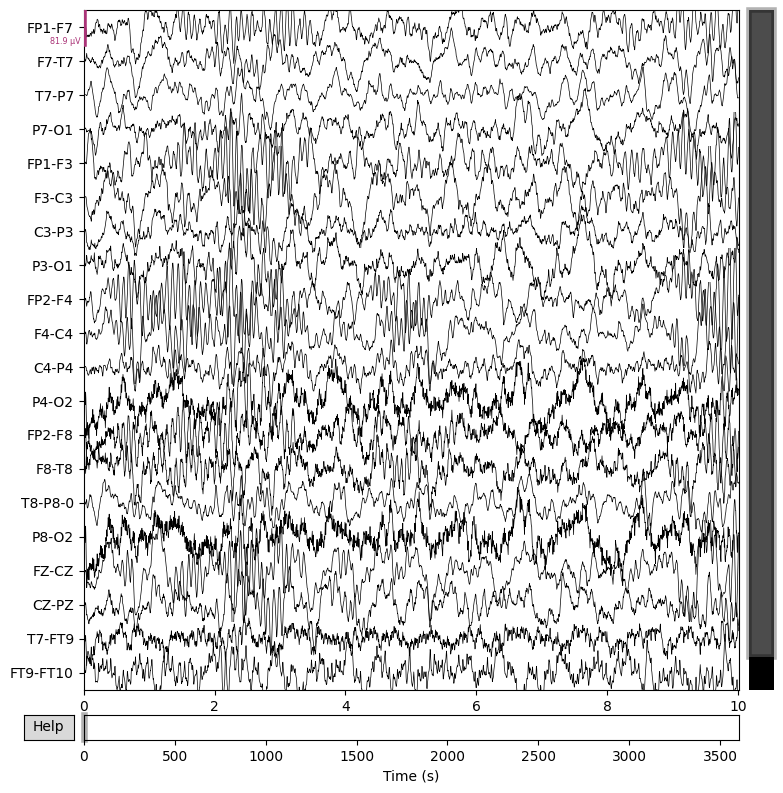

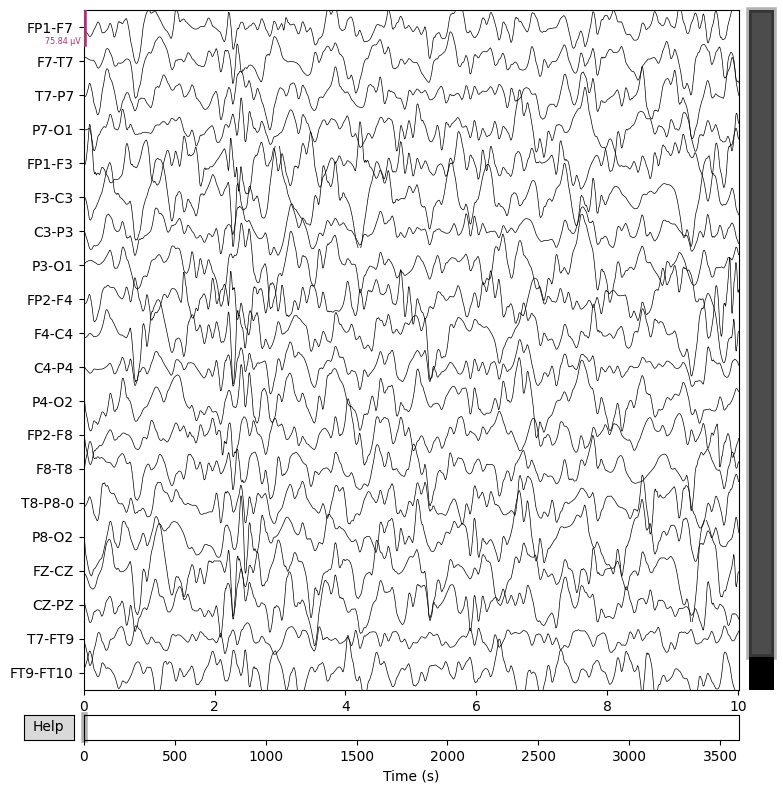

In [ ]:
# Definir rutas
paciente_id = 'chb01'
archivo = 'chb01_03.fif'

original_path = os.path.join('/content/pacientes', paciente_id, archivo)

filtered_filename = archivo.replace('.fif', '_filtered_raw.fif')
filtered_path = os.path.join('/content/pacientes_filtered', paciente_id, filtered_filename)

# Cargar ambos archivos
raw_original = mne.io.read_raw_fif(original_path, preload=True, verbose=False)
filtered_raw = mne.io.read_raw_fif(filtered_path, preload=True, verbose=False)


raw_original.plot(scalings='auto', title='Canales EEG originales', show=True)
plt.close('all')

filtered_raw.plot(scalings='auto', title='Canales EEG filtrados', show=True)
plt.close('all')

### **Normalización**

#### Min - Max Scaling

Cuando se entrena un modelo de ML, es crucial que los datos de entrada tengan una escala coherente, igual para todos los segmentos. Si se normaliza por segmento, se estaría enseñando al modelo a depender de la escala local, lo cual puede causar problemas de generalización. Por tanto, primero se va a calcular el mínimo y máximo de cada canal usando todo el conjunto de datos (todos los segmentos válidos), y luego usar esos valores para escalar todos los segmentos.

In [ ]:
import numpy as np

# Diccionario para almacenar el min y max global por canal
global_min = {}
global_max = {}

# Recolección global de min/max
for info in seizure_files.values():
    if not info.get('valid_segment'): # Verificar si es un segmento con 21 canales
        continue

    path = info['path']
    fif_path = f'{path}'
    raw = mne.io.read_raw_fif(fif_path, preload=True, verbose=False)

    for ch_idx, ch_name in enumerate(raw.ch_names):
        data = raw.get_data(picks=[ch_idx])[0]
        ch_min = data.min()
        ch_max = data.max()

        # Actualizar min y max global
        if ch_name not in global_min or ch_min < global_min[ch_name]:
            global_min[ch_name] = ch_min
        if ch_name not in global_max or ch_max > global_max[ch_name]:
            global_max[ch_name] = ch_max



Luego se procede con la normalización de cada canal de cada segmento de EEG con los valores extraídos:
$$
x_{\text{scaled}} = \frac{x - x_{\text{min}}}{x_{\text{max}} - x_{\text{min}}}
$$


In [ ]:
base_folder_minmax = '/content/pacientes_minmax'

for info in seizure_files.values():
    if not info.get('valid_segment'):
        continue

    path = info['path']
    fif_path = f'{path}'

    new_paciente_path = os.path.join(base_folder_minmax, f'chb{info["subject"]}')
    os.makedirs(new_paciente_path, exist_ok=True)
    segment_id = path.replace('.fif', '').split('_')[-3]
    new_paciente_path = os.path.join(new_paciente_path, f'chb{info["subject"]}_{segment_id}_filtered_minmax_raw.fif')
    raw = mne.io.read_raw_fif(fif_path, preload=True, verbose=False)

    for ch_idx, ch_name in enumerate(raw.ch_names):
        data = raw.get_data(picks=[ch_idx])[0]
        min_val = global_min[ch_name]
        max_val = global_max[ch_name]

        # Evitar división por cero
        if max_val != min_val:
            norm_data = (data - min_val) / (max_val - min_val)
            raw._data[ch_idx] = norm_data

    raw.save(new_paciente_path, overwrite=True)
    print(f"Archivo guardado en: {new_paciente_path}")

Writing /content/pacientes_minmax/chb01/chb01_03_filtered_minmax_raw.fif
Closing /content/pacientes_minmax/chb01/chb01_03_filtered_minmax_raw.fif
[done]
Archivo guardado en: /content/pacientes_minmax/chb01/chb01_03_filtered_minmax_raw.fif
Writing /content/pacientes_minmax/chb01/chb01_04_filtered_minmax_raw.fif
Closing /content/pacientes_minmax/chb01/chb01_04_filtered_minmax_raw.fif
[done]
Archivo guardado en: /content/pacientes_minmax/chb01/chb01_04_filtered_minmax_raw.fif
Writing /content/pacientes_minmax/chb01/chb01_15_filtered_minmax_raw.fif
Closing /content/pacientes_minmax/chb01/chb01_15_filtered_minmax_raw.fif
[done]
Archivo guardado en: /content/pacientes_minmax/chb01/chb01_15_filtered_minmax_raw.fif
Writing /content/pacientes_minmax/chb01/chb01_16_filtered_minmax_raw.fif
Closing /content/pacientes_minmax/chb01/chb01_16_filtered_minmax_raw.fif
[done]
Archivo guardado en: /content/pacientes_minmax/chb01/chb01_16_filtered_minmax_raw.fif
Writing /content/pacientes_minmax/chb01/chb0

Datos filtrados:
<Raw | chb01_03_filtered_raw.fif, 21 x 921600 (3600.0 s), ~147.7 MiB, data loaded>

Datos normalizados (Min-Max):
<Raw | chb01_03_filtered_minmax_raw.fif, 21 x 921600 (3600.0 s), ~147.7 MiB, data loaded>


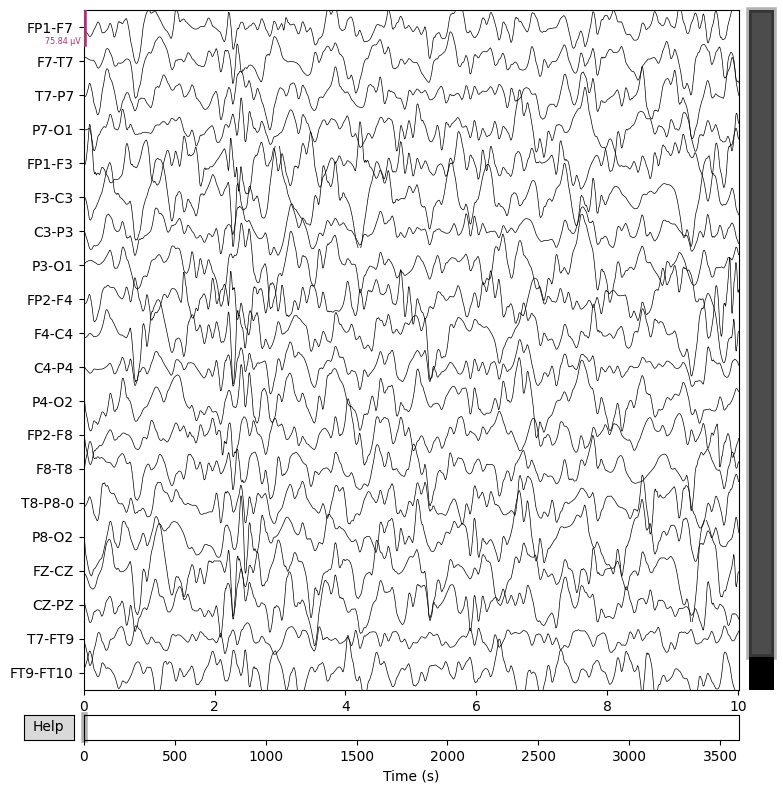

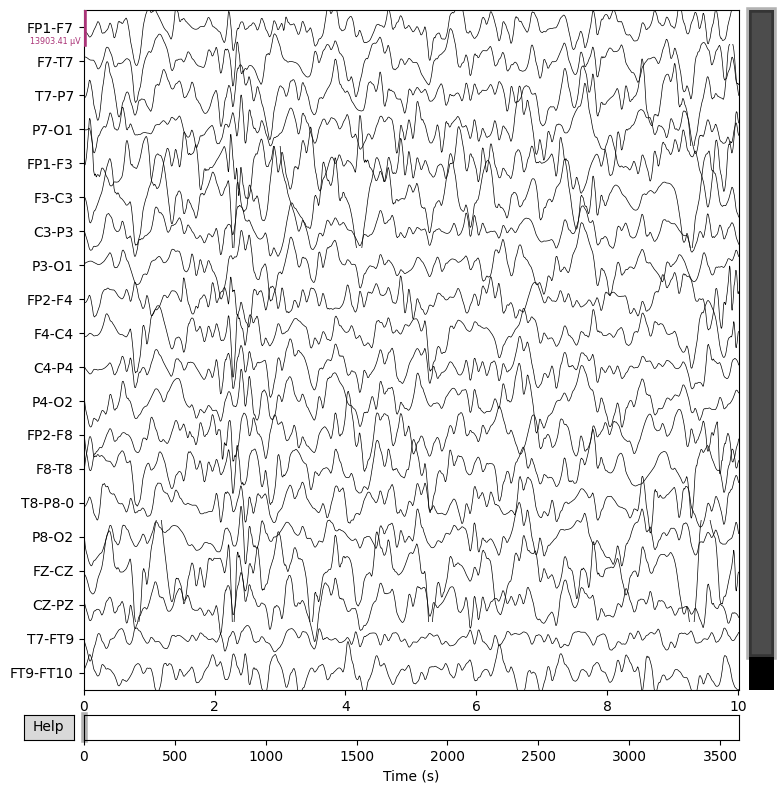

In [ ]:
# Ruta de los archivos
filtered_file = '/content/pacientes_filtered/chb01/chb01_03_filtered_raw.fif'
minmax_file = '/content/pacientes_minmax/chb01/chb01_03_filtered_minmax_raw.fif'

# Cargar datos
raw_filtered = mne.io.read_raw_fif(filtered_file, preload=True, verbose=False)
raw_minmax = mne.io.read_raw_fif(minmax_file, preload=True, verbose=False)

# Mostrar información básica
print("Datos filtrados:")
print(raw_filtered)
print("\nDatos normalizados (Min-Max):")
print(raw_minmax)

# Graficar señales filtradas
raw_filtered.plot(
    scalings='auto',
    title='EEG Filtrado (0.5–25 Hz)',
    show=True
)
plt.close()

# Graficar señales normalizadas
raw_minmax.plot(
    scalings='auto',
    title='EEG Normalizado (Min-Max)',
    show=True
)
plt.close()


Este tipo de normalización, aunque sensible a valores extremos en las señales, permite una conservación de la morfología de las señales EEG, un factor que, de acuerdo a previas investigaciones, resulta de crucial ánalisis dentro del estudio de las características extraídas de la señal. Por ello, dada la facilidad de implementación de este tipo de reescalado en el rango de [0,1], que se traduce en una mayor eficiencia computacional del algoritmo, también permite que los canales a analizar se ajusten fácilmente a un rango estandarizado manteniendo proporciones sin dar mucha importancia a valores atípicos, como artefactos o ruido, pues ya han sido contrarrestados en etapas anteriores de preprocesamiento de la señal.

#### Z-Score Standardization

También podemos aplicar sobre los datos filtrados una estandarización z, en donde se transforma la señal para que tenga media 0 y desviación estándar 1. Esto nos puede ayudar en la convergencia del modelo ML ya que evitamos que la magnitud de los valores predominen en el análisis.

$$
z = \frac{x - \mu}{\sigma}
$$


In [ ]:
# Ruta base de los archivos previamente filtrados
filtered_base_path = '/content/pacientes_filtered'

# Ruta donde se guardarán los datos normalizados
# NO hay espacio suficiente en mi Drive para ejecutar la sig. línea. Por favor, NO descomentar. Incluida solo para ilustración.
# zscore_base_path = os.path.join(os.path.dirname('/content/drive/MyDrive/EEG_For_Epileptic_Seizure_Recognition/dataset'), 'pacientes_zscore')
zscore_base_path = '/content/pacientes_zscore'

# Recorrer subcarpetas
for paciente in os.listdir(filtered_base_path):
    paciente_path = os.path.join(filtered_base_path, paciente)

    if os.path.isdir(paciente_path):
        # Crear carpeta equivalente en pacientes_zscore
        paciente_zscore_path = os.path.join(zscore_base_path, paciente)
        os.makedirs(paciente_zscore_path, exist_ok=True)

        # Procesar archivos filtrados
        for file in os.listdir(paciente_path):
            if file.endswith('.fif'):
                file_path = os.path.join(paciente_path, file)

                # Cargar archivo
                raw = mne.io.read_raw_fif(file_path, preload=True, verbose=False)

                # Extraer datos
                data, times = raw[:, :]

                # Aplicar Z-score canal por canal
                mean = np.mean(data, axis=1, keepdims=True)
                std = np.std(data, axis=1, keepdims=True)
                zscore_data = (data - mean) / std

                # Reemplazar datos en el objeto Raw
                raw._data = zscore_data

                # Generar nombre y guardar
                zscore_file_name = file.replace('_raw.fif', '_zscore_raw.fif')
                zscore_file_path = os.path.join(paciente_zscore_path, zscore_file_name)

                raw.save(zscore_file_path, overwrite=True)
                print(f"Archivo guardado con Z-score en: {zscore_file_path}")

Writing /content/pacientes_zscore/chb11/chb11_92_filtered_zscore_raw.fif
Closing /content/pacientes_zscore/chb11/chb11_92_filtered_zscore_raw.fif
[done]
Archivo guardado con Z-score en: /content/pacientes_zscore/chb11/chb11_92_filtered_zscore_raw.fif
Writing /content/pacientes_zscore/chb11/chb11_82_filtered_zscore_raw.fif
Closing /content/pacientes_zscore/chb11/chb11_82_filtered_zscore_raw.fif
[done]
Archivo guardado con Z-score en: /content/pacientes_zscore/chb11/chb11_82_filtered_zscore_raw.fif
Writing /content/pacientes_zscore/chb11/chb11_99_filtered_zscore_raw.fif
Closing /content/pacientes_zscore/chb11/chb11_99_filtered_zscore_raw.fif
[done]
Archivo guardado con Z-score en: /content/pacientes_zscore/chb11/chb11_99_filtered_zscore_raw.fif
Writing /content/pacientes_zscore/chb23/chb23_09_filtered_zscore_raw.fif
Closing /content/pacientes_zscore/chb23/chb23_09_filtered_zscore_raw.fif
[done]
Archivo guardado con Z-score en: /content/pacientes_zscore/chb23/chb23_09_filtered_zscore_raw.

Datos filtrados:
<Raw | chb01_03_filtered_raw.fif, 21 x 921600 (3600.0 s), ~147.7 MiB, data loaded>

Datos normalizados (Z-score):
<Raw | chb01_03_filtered_zscore_raw.fif, 21 x 921600 (3600.0 s), ~147.7 MiB, data loaded>


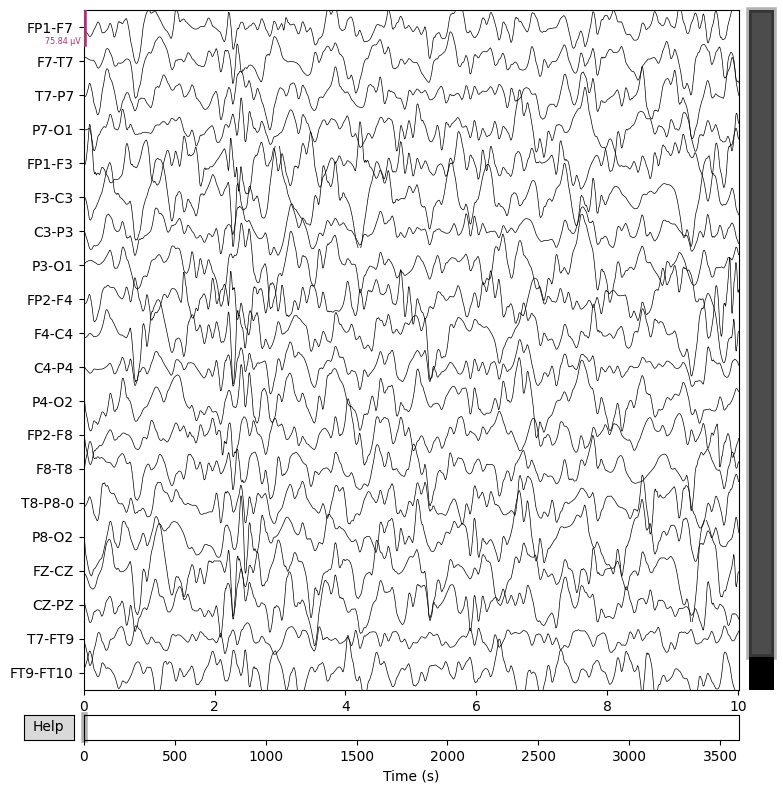

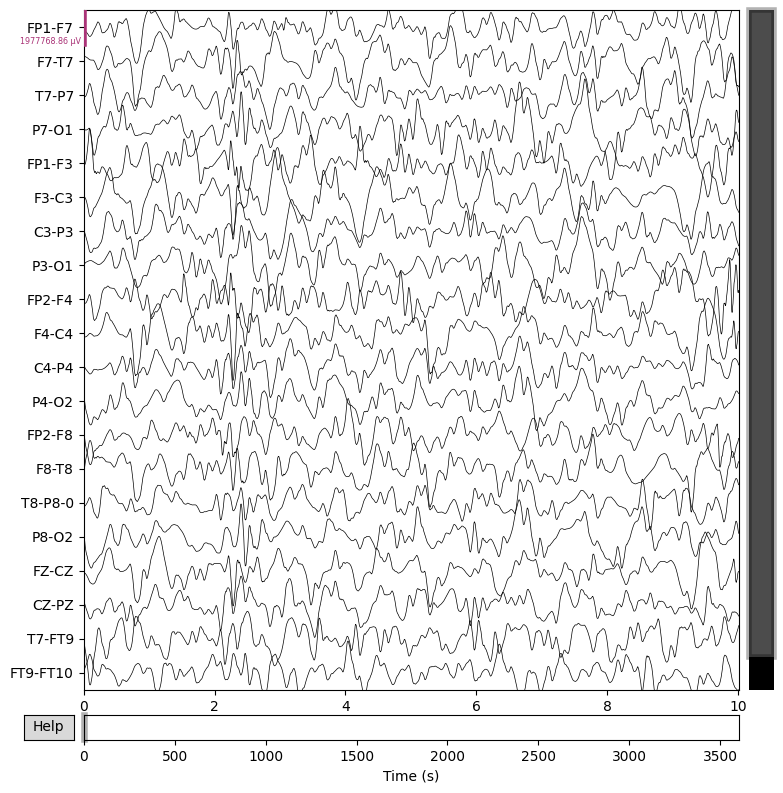

In [ ]:
# Ruta de los archivos
filtered_file = '/content/pacientes_filtered/chb01/chb01_03_filtered_raw.fif'
zscore_file = '/content/pacientes_zscore/chb01/chb01_03_filtered_zscore_raw.fif'

# Cargar datos
raw_filtered = mne.io.read_raw_fif(filtered_file, preload=True, verbose=False)
raw_zscore = mne.io.read_raw_fif(zscore_file, preload=True, verbose=False)

# Mostrar información básica
print("Datos filtrados:")
print(raw_filtered)
print("\nDatos normalizados (Z-score):")
print(raw_zscore)

# Graficar señales filtradas
raw_filtered.plot(
    scalings='auto',
    title='EEG Filtrado',
    show=True
)
plt.close()

# Graficar señales normalizadas
raw_zscore.plot(
    scalings='auto',
    title='EEG Normalizado (Z-score)',
    show=True
)
plt.close()

En resumen, en la fase de análisis de entrenamiento y validación del modelo ML seleccionado, se va a tener en cuenta las ventajas previamente mencionadas de estos dos tipos de normalización y se analizará su impacto a la hora de evaluar el desempeño del modelo.

### Extracción de muestras para clases de señales EEG

Para la extracción de muestras para las clases 'Ictal' e 'Interictal' de las señales EEG dadas, se definen ventanas de 1 segundo con un overlap de 50% en dado caso que sea necesaria la implementación de un análisis de variables con FFTs en reemplazo del procesamiento propuesto más adelante: Transformada discreta Wavelet Multinivel (TDWM). Por cuestiones de tiempo de computación, se ha limitado el número de ventanas por archivo a 300 ventanas de tiempo, para un máximo total de 600 ventanas de tiempo entre ventanas contenidas en un periodo ictal del paciente y aquellas contenidas en un periodo interictal del paciente.

Cabe destacar que la división de los segmentos EEG en ventanas es desarrollada para ambos tipos de normalización: Min - Max Scaling y Z - Score Standardization. Sin embargo, por temas de eficiencia computacional, se decidió por el uso únicamente de las ventanas de tiempo con Z - score Standardization para la etapa de implementación de la TDWM.

#### Min - Max Scaling

In [ ]:
import os
import mne
import random
import gc
import numpy as np

base_folder_minmax = '/content/pacientes_minmax'
output_base_minmax = '/content/pacientes_minmax_segmented'
window_size = 1  # segundos
max_segments = 300

for key, info in seizure_files.items():
    subj = f'chb{info["subject"]}'
    folder_in = os.path.join(base_folder_minmax, subj)

    if not os.path.exists(folder_in):
        continue

    for file in os.listdir(folder_in):
        fif_dir = os.path.basename(key)
        fif_name = fif_dir + '_filtered_minmax_raw.fif'
        if not file.endswith(fif_name):
            continue

        file_path = os.path.join(folder_in, file)
        raw = mne.io.read_raw_fif(file_path, preload=False, verbose=False)
        raw.load_data()
        sfreq = raw.info['sfreq']

        folder_out_ictal = os.path.join(output_base_minmax, subj, "Ictal")
        folder_out_interictal = os.path.join(output_base_minmax, subj, "Interictal")
        os.makedirs(folder_out_ictal, exist_ok=True)
        os.makedirs(folder_out_interictal, exist_ok=True)

        ictal_ranges = [
            (info[f"seizure_{i}_start"], info[f"seizure_{i}_end"])
            for i in range(1, info.get("num_seizures", 0) + 1)
            if f"seizure_{i}_start" in info and f"seizure_{i}_end" in info
        ]

        window_samples = int(window_size * sfreq)
        start_idx = 0
        segment_number = 0
        ictal_count = 0
        interictal_saved = []

        # Preextraer info mínima para crear nuevos RawArray
        info_segment = raw.info.copy()

        while start_idx + window_samples <= raw.n_times:
            t_start = start_idx / sfreq
            t_end = (start_idx + window_samples) / sfreq
            start_sample = int(t_start * sfreq)
            stop_sample = int(t_end * sfreq)
            is_ictal = any(start <= t_start < end for (start, end) in ictal_ranges)
            # Saltar si ya se alcanzó el máximo de segmentos
            if ictal_count >= max_segments and len(interictal_saved) >= max_segments:
                break
            if is_ictal and ictal_count >= max_segments:
                # Avanzar al segundo después del final de la última crisis
                if ictal_ranges:
                    last_end = max(end for (_, end) in ictal_ranges)
                    start_idx = int((last_end + 1) * sfreq)
                else:
                    start_idx += window_samples // 2
                segment_number += 1
                continue

            if not is_ictal and len(interictal_saved) >= max_segments:
                # Avanzar al inicio de la próxima crisis
                future_ictals = [start for (start, _) in ictal_ranges if start > t_start]
                if future_ictals:
                    next_start = min(future_ictals)
                    start_idx = int(next_start * sfreq)
                else:
                    start_idx = raw.n_times  # Forzar salida del bucle
                segment_number += 1
                continue

            segment_data = raw.get_data(start=start_sample, stop=stop_sample)
            segment = mne.io.RawArray(segment_data, info_segment)

            out_name = f"{file.replace('.fif', '')}_seg{segment_number:04d}_raw.fif"

            if is_ictal and ictal_count < max_segments:
                out_path = os.path.join(folder_out_ictal, out_name)
                segment.save(out_path, overwrite=True)
                ictal_count += 1

            elif not is_ictal and len(interictal_saved) < max_segments:
                out_path = os.path.join(folder_out_interictal, out_name)
                segment.save(out_path, overwrite=True)
                interictal_saved.append(segment_number)

            # Limpieza de memoria
            del segment, segment_data
            gc.collect()

            segment_number += 1
            start_idx += window_samples // 2  # 50% overlap

        print(f"{file}: {ictal_count} ictales y {len(interictal_saved)} interictales guardados")
        del raw
        gc.collect()


Se han truncado las últimas 5000 líneas del flujo de salida.
    Range : 0 ... 255 =      0.000 ...     0.996 secs
Ready.
Writing /content/pacientes_minmax_segmented/chb23/Interictal/chb23_08_filtered_minmax_raw_seg0201_raw.fif
Closing /content/pacientes_minmax_segmented/chb23/Interictal/chb23_08_filtered_minmax_raw_seg0201_raw.fif
[done]
Creating RawArray with float64 data, n_channels=21, n_times=256
    Range : 0 ... 255 =      0.000 ...     0.996 secs
Ready.
Writing /content/pacientes_minmax_segmented/chb23/Interictal/chb23_08_filtered_minmax_raw_seg0202_raw.fif
Closing /content/pacientes_minmax_segmented/chb23/Interictal/chb23_08_filtered_minmax_raw_seg0202_raw.fif
[done]
Creating RawArray with float64 data, n_channels=21, n_times=256
    Range : 0 ... 255 =      0.000 ...     0.996 secs
Ready.
Writing /content/pacientes_minmax_segmented/chb23/Interictal/chb23_08_filtered_minmax_raw_seg0203_raw.fif
Closing /content/pacientes_minmax_segmented/chb23/Interictal/chb23_08_filtered_minma

In [ ]:
!zip -r pacientes_minmax_segmented.zip pacientes_minmax_segmented
# Dividir en partes de 900 MB
!split -b 900m pacientes_minmax_segmented.zip pacientes_minmax_part_

Se han truncado las últimas 5000 líneas del flujo de salida.
  adding: pacientes_minmax_segmented/chb09/Interictal/chb09_06_filtered_minmax_raw_seg0110_raw.fif (deflated 23%)
  adding: pacientes_minmax_segmented/chb09/Interictal/chb09_19_filtered_minmax_raw_seg0058_raw.fif (deflated 23%)
  adding: pacientes_minmax_segmented/chb09/Interictal/chb09_08_filtered_minmax_raw_seg0196_raw.fif (deflated 23%)
  adding: pacientes_minmax_segmented/chb09/Interictal/chb09_06_filtered_minmax_raw_seg0160_raw.fif (deflated 23%)
  adding: pacientes_minmax_segmented/chb09/Interictal/chb09_08_filtered_minmax_raw_seg0132_raw.fif (deflated 24%)
  adding: pacientes_minmax_segmented/chb09/Interictal/chb09_08_filtered_minmax_raw_seg0227_raw.fif (deflated 24%)
  adding: pacientes_minmax_segmented/chb09/Interictal/chb09_08_filtered_minmax_raw_seg0125_raw.fif (deflated 24%)
  adding: pacientes_minmax_segmented/chb09/Interictal/chb09_06_filtered_minmax_raw_seg0144_raw.fif (deflated 23%)
  adding: pacientes_minmax_

#### Z - Score Standardization

In [ ]:
import os
import mne
import gc
import numpy as np

base_folder_zscore = '/content/pacientes_zscore'
output_base_zscore = '/content/pacientes_zscore_segmented'
window_size = 1  # segundos
max_segments = 300

for key, info in seizure_files.items():
    subj = f'chb{info["subject"]}'
    folder_in = os.path.join(base_folder_zscore, subj)

    if not os.path.exists(folder_in):
        continue

    for file in os.listdir(folder_in):
        fif_dir = os.path.basename(key)
        fif_name = fif_dir + '_filtered_zscore_raw.fif'
        if not file.endswith(fif_name):
            continue

        file_path = os.path.join(folder_in, file)
        raw = mne.io.read_raw_fif(file_path, preload=False, verbose=False)
        raw.load_data()
        sfreq = raw.info['sfreq']

        folder_out_ictal = os.path.join(output_base_zscore, subj, "Ictal")
        folder_out_interictal = os.path.join(output_base_zscore, subj, "Interictal")
        os.makedirs(folder_out_ictal, exist_ok=True)
        os.makedirs(folder_out_interictal, exist_ok=True)

        ictal_ranges = [
            (info[f"seizure_{i}_start"], info[f"seizure_{i}_end"])
            for i in range(1, info.get("num_seizures", 0) + 1)
            if f"seizure_{i}_start" in info and f"seizure_{i}_end" in info
        ]

        window_samples = int(window_size * sfreq)
        start_idx = 0
        segment_number = 0
        ictal_count = 0
        interictal_saved = []

        info_segment = raw.info.copy()

        while start_idx + window_samples <= raw.n_times:
            t_start = start_idx / sfreq
            t_end = (start_idx + window_samples) / sfreq
            start_sample = int(t_start * sfreq)
            stop_sample = int(t_end * sfreq)
            is_ictal = any(start <= t_start < end for (start, end) in ictal_ranges)

            if ictal_count >= max_segments and len(interictal_saved) >= max_segments:
                break

            if is_ictal and ictal_count >= max_segments:
                if ictal_ranges:
                    last_end = max(end for (_, end) in ictal_ranges)
                    start_idx = int((last_end + 1) * sfreq)
                else:
                    start_idx += window_samples // 2
                segment_number += 1
                continue

            if not is_ictal and len(interictal_saved) >= max_segments:
                future_ictals = [start for (start, _) in ictal_ranges if start > t_start]
                if future_ictals:
                    next_start = min(future_ictals)
                    start_idx = int(next_start * sfreq)
                else:
                    start_idx = raw.n_times
                segment_number += 1
                continue

            segment_data = raw.get_data(start=start_sample, stop=stop_sample)
            segment = mne.io.RawArray(segment_data, info_segment)

            out_name = f"{file.replace('.fif', '')}_seg{segment_number:04d}_raw.fif"

            if is_ictal and ictal_count < max_segments:
                out_path = os.path.join(folder_out_ictal, out_name)
                segment.save(out_path, overwrite=True)
                ictal_count += 1

            elif not is_ictal and len(interictal_saved) < max_segments:
                out_path = os.path.join(folder_out_interictal, out_name)
                segment.save(out_path, overwrite=True)
                interictal_saved.append(segment_number)

            del segment, segment_data
            gc.collect()

            segment_number += 1
            start_idx += window_samples // 2

        print(f"{file}: {ictal_count} ictales y {len(interictal_saved)} interictales guardados")
        del raw
        gc.collect()


Se han truncado las últimas 5000 líneas del flujo de salida.
    Range : 0 ... 255 =      0.000 ...     0.996 secs
Ready.
Writing /content/pacientes_zscore_segmented/chb23/Interictal/chb23_08_filtered_zscore_raw_seg0201_raw.fif
Closing /content/pacientes_zscore_segmented/chb23/Interictal/chb23_08_filtered_zscore_raw_seg0201_raw.fif
[done]
Creating RawArray with float64 data, n_channels=21, n_times=256
    Range : 0 ... 255 =      0.000 ...     0.996 secs
Ready.
Writing /content/pacientes_zscore_segmented/chb23/Interictal/chb23_08_filtered_zscore_raw_seg0202_raw.fif
Closing /content/pacientes_zscore_segmented/chb23/Interictal/chb23_08_filtered_zscore_raw_seg0202_raw.fif
[done]
Creating RawArray with float64 data, n_channels=21, n_times=256
    Range : 0 ... 255 =      0.000 ...     0.996 secs
Ready.
Writing /content/pacientes_zscore_segmented/chb23/Interictal/chb23_08_filtered_zscore_raw_seg0203_raw.fif
Closing /content/pacientes_zscore_segmented/chb23/Interictal/chb23_08_filtered_zscor

In [ ]:
import os
print(sorted(set(info["subject"] for info in seizure_files.values())))
base_folder_zscore = '/content/pacientes_zscore'
output_base_zscore = '/content/pacientes_zscore_segmented'
window_size = 1  # segundos
max_segments = 300
for key, info in seizure_files.items():
    subj = f'chb{info["subject"]}'
    folder_in = os.path.join(base_folder_zscore, subj)
    for file in os.listdir(folder_in):
        fif_dir = os.path.basename(key)
        fif_name = fif_dir + '_filtered_zscore_raw.fif'
        if not file.endswith(fif_name):
            continue
            print(file)
            print("No da")
        else:
            print(file)
            print("Sí da")
        ictal_ranges = [
            (info[f"seizure_{i}_start"], info[f"seizure_{i}_end"])
            for i in range(1, info.get("num_seizures", 0) + 1)
            if f"seizure_{i}_start" in info and f"seizure_{i}_end" in info
        ]
        print(ictal_ranges)

['01', '02', '05', '08', '09', '10', '11', '13', '14', '16', '17', '20', '21', '22', '23']
chb01_03_filtered_zscore_raw.fif
Sí da
[(2996, 3036)]
chb01_04_filtered_zscore_raw.fif
Sí da
[(1467, 1494)]
chb01_15_filtered_zscore_raw.fif
Sí da
[(1732, 1772)]
chb01_16_filtered_zscore_raw.fif
Sí da
[(1015, 1066)]
chb01_18_filtered_zscore_raw.fif
Sí da
[(1720, 1810)]
chb01_21_filtered_zscore_raw.fif
Sí da
[(327, 420)]
chb01_26_filtered_zscore_raw.fif
Sí da
[(1862, 1963)]
chb02_16_filtered_zscore_raw.fif
Sí da
[(130, 212)]
chb02_16+_filtered_zscore_raw.fif
Sí da
[(2972, 3053)]
chb02_19_filtered_zscore_raw.fif
Sí da
[(3369, 3378)]
chb05_06_filtered_zscore_raw.fif
Sí da
[(417, 532)]
chb05_13_filtered_zscore_raw.fif
Sí da
[(1086, 1196)]
chb05_16_filtered_zscore_raw.fif
Sí da
[(2317, 2413)]
chb05_17_filtered_zscore_raw.fif
Sí da
[(2451, 2571)]
chb05_22_filtered_zscore_raw.fif
Sí da
[(2348, 2465)]
chb08_02_filtered_zscore_raw.fif
Sí da
[(2670, 2841)]
chb08_05_filtered_zscore_raw.fif
Sí da
[(2856, 304

In [ ]:
!zip -r pacientes_zscore_segmented.zip pacientes_zscore_segmented
# Dividir en partes de 900 MB
!split -b 900m pacientes_zscore_segmented.zip pacientes_zscore_part_

Se han truncado las últimas 5000 líneas del flujo de salida.
  adding: pacientes_zscore_segmented/chb09/Interictal/chb09_08_filtered_zscore_raw_seg0033_raw.fif (deflated 16%)
  adding: pacientes_zscore_segmented/chb09/Interictal/chb09_19_filtered_zscore_raw_seg0039_raw.fif (deflated 16%)
  adding: pacientes_zscore_segmented/chb09/Interictal/chb09_06_filtered_zscore_raw_seg0107_raw.fif (deflated 16%)
  adding: pacientes_zscore_segmented/chb09/Interictal/chb09_08_filtered_zscore_raw_seg0271_raw.fif (deflated 16%)
  adding: pacientes_zscore_segmented/chb09/Interictal/chb09_19_filtered_zscore_raw_seg0187_raw.fif (deflated 16%)
  adding: pacientes_zscore_segmented/chb09/Interictal/chb09_19_filtered_zscore_raw_seg0144_raw.fif (deflated 16%)
  adding: pacientes_zscore_segmented/chb09/Interictal/chb09_08_filtered_zscore_raw_seg0207_raw.fif (deflated 16%)
  adding: pacientes_zscore_segmented/chb09/Interictal/chb09_19_filtered_zscore_raw_seg0283_raw.fif (deflated 16%)
  adding: pacientes_zscore_

## Procesamiento de características

En este punto ya se tienen entonces las ventanas de tiempo con duración de 1 segundo cada una, para las clases 'Ictal' e 'Interictal'. Ahora, para una primera extracción de características, se utiliza una TDWM de 3 niveles de tipo Daubechies, con el objetivo de redistribuir los datos contenidos en las ventanas entre las 4 subbandas siguientes: D1, D2, D3 y A3. Donde D1 a D3 contienen los datos de bajas frecuencias y A3 los datos de altas frecuencias. Al solo comprender una redistribución de las muestras de cada ventana, se debe aclarar que no corresponde a las características que se van a tener en cuenta para la clasificación de ventanas de tiempo.

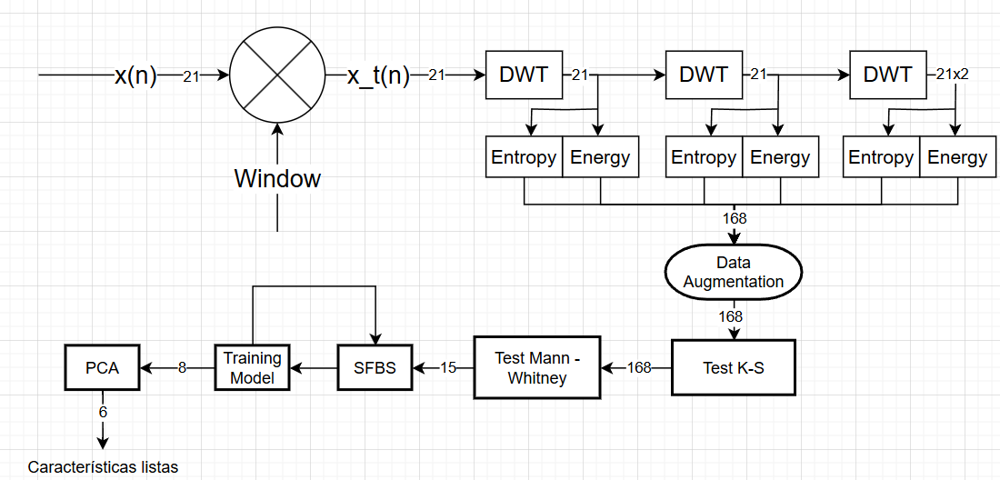

### Extracción de características con Wavelets Multinivel

En cuanto a la justificación del uso de transformadas wavelet discreta tipo Daubechies, primero, la familia Daubechies está diseñada para capturar de forma eficaz transiciones y discontinuidades en una señal, lo cual es especialmente útil en EEG, ya que este tipo de datos suele ser no estacionario y contiene eventos transitorios (como las descargas ictales en epilepsia). db4 en particular ofrece un buen balance entre resolución temporal y frecuencia, lo que permite aislar cambios sutiles en la actividad eléctrica cerebral a través de distintos niveles de descomposición.

Además, Daubechies permite realizar una descomposición multiresolución, lo que significa que se puede observar la señal a distintas escalas (subbandas), y así detectar patrones de interés que pueden manifestarse a diferentes frecuencias. Esto es fundamental en EEG, donde diferentes bandas (delta, theta, alfa, beta, gamma) están asociadas a distintos estados neuronales. El nivel 3 de descomposición usado en el código a continuación, junto con db4, es capaz de capturar estas bandas con buena fidelidad.

Por último, las wavelets de Daubechies son ortogonales y tienen soporte compacto, lo que las hace eficientes computacionalmente y evita redundancias en la representación. Esto se traduce en una extracción de características como energía logarítmica y entropía que son representativas y no redundantes. Dichas métricas, obtenidas por subbanda, son útiles para modelar el comportamiento caótico y complejo del cerebro en condiciones normales e ictales. En conjunto, todo esto convierte a db4 en una opción robusta y empíricamente validada en la literatura para análisis de EEG orientado al reconocimiento de eventos epilépticos.

#### Extracción de Wavelets

In [ ]:
import mne
import pywt
import numpy as np
import os

def extract_wavelets_from_window(file_path, wavelet, level, output_folder):
    import mne
    import pywt
    import numpy as np
    import os

    raw = mne.io.read_raw_fif(file_path, preload=True, verbose=False)
    data, _ = raw[:]
    ch_names = raw.info['ch_names']

    all_features = {}

    for ch_idx, ch_name in enumerate(ch_names):
        ch_data = data[ch_idx]
        if len(ch_data) == 0:
            continue

        coeffs = pywt.wavedec(ch_data, wavelet, level=level)

        ch_features = {}
        for i, coef in enumerate(coeffs):
            subband = f"A{level}" if i == 0 else f"D{level - i + 1}"
            log_energy = np.sum(np.log(np.square(coef) + 1e-10))
            entropy = -np.sum((coef**2) * np.log(coef**2 + 1e-10))

            ch_features[subband] = {
                'LogEnergy': log_energy,
                'Entropy': entropy
            }

        all_features[ch_name] = ch_features

    # Solo guardar si hay datos
    if all_features:
        filename = os.path.basename(file_path).replace('.fif', '.npz')
        output_file = os.path.join(output_folder, filename)
        np.savez_compressed(output_file, **all_features)
    else:
        print(f"⚠️ Archivo vacío: {file_path}")


In [ ]:
import os
import fnmatch

# Base de datos con ventanas Z-Score
output_base_zscore = '/content/pacientes_zscore_segmented'

# Carpetas de salida
folder_ictal = 'Ictal'
folder_interictal = 'Interictal'

# Pacientes seleccionados de la base de datos (Edad entre 3 a 12 años)
subjects = [
    '01', '02', '05', '08', '09', '10', '11',
    '13', '14', '16', '20', '21', '22', '23'
]

# Parámetros de wavelet
wavelet = 'db4'  # Daubechies 4
level = 3  # Nivel de descomposición

# Carpeta para guardar los coeficientes de wavelet
output_wavelet_folder_ictal = '/content/pacientes_wavelet/Ictal'
output_wavelet_folder_interictal = '/content/pacientes_wavelet/Interictal'
os.makedirs(output_wavelet_folder_ictal, exist_ok=True)
os.makedirs(output_wavelet_folder_interictal, exist_ok=True)

# Procesar archivos por tipo
for subject in subjects:
    subject_folder = f'chb{subject}'

    for condition_folder, output_folder in [
        (folder_ictal, output_wavelet_folder_ictal),
        (folder_interictal, output_wavelet_folder_interictal)
    ]:
        folder_path = os.path.join(output_base_zscore, subject_folder, condition_folder)

        if not os.path.exists(folder_path):
            print(f"[ADVERTENCIA] Carpeta no encontrada: {folder_path}")
            continue

        for file in os.listdir(folder_path):
            if fnmatch.fnmatch(file, '*_seg*.fif'):
                file_path = os.path.join(folder_path, file)
                print(f"[INFO] Procesando: {file_path}")
                extract_wavelets_from_window(file_path, wavelet, level, output_folder)

print("Extracción de wavelets completada.")


Se han truncado las últimas 5000 líneas del flujo de salida.
[INFO] Procesando: /content/pacientes_zscore_segmented/chb20/Interictal/chb20_15_filtered_zscore_raw_seg0062_raw.fif
[INFO] Procesando: /content/pacientes_zscore_segmented/chb20/Interictal/chb20_12_filtered_zscore_raw_seg0073_raw.fif
[INFO] Procesando: /content/pacientes_zscore_segmented/chb20/Interictal/chb20_16_filtered_zscore_raw_seg0152_raw.fif
[INFO] Procesando: /content/pacientes_zscore_segmented/chb20/Interictal/chb20_14_filtered_zscore_raw_seg0248_raw.fif
[INFO] Procesando: /content/pacientes_zscore_segmented/chb20/Interictal/chb20_12_filtered_zscore_raw_seg0317_raw.fif
[INFO] Procesando: /content/pacientes_zscore_segmented/chb20/Interictal/chb20_13_filtered_zscore_raw_seg0128_raw.fif
[INFO] Procesando: /content/pacientes_zscore_segmented/chb20/Interictal/chb20_16_filtered_zscore_raw_seg0104_raw.fif
[INFO] Procesando: /content/pacientes_zscore_segmented/chb20/Interictal/chb20_13_filtered_zscore_raw_seg0234_raw.fif
[IN

In [ ]:
!zip -r pacientes_wavelet.zip pacientes_wavelet
# Dividir en partes de 900 MB
!split -b 900m pacientes_wavelet.zip pacientes_wavelet_part_

Se han truncado las últimas 5000 líneas del flujo de salida.
  adding: pacientes_wavelet/Interictal/chb16_16_filtered_zscore_raw_seg0037_raw.npz (deflated 70%)
  adding: pacientes_wavelet/Interictal/chb10_27_filtered_zscore_raw_seg0074_raw.npz (deflated 70%)
  adding: pacientes_wavelet/Interictal/chb05_13_filtered_zscore_raw_seg0222_raw.npz (deflated 70%)
  adding: pacientes_wavelet/Interictal/chb13_58_filtered_zscore_raw_seg0077_raw.npz (deflated 70%)
  adding: pacientes_wavelet/Interictal/chb13_60_filtered_zscore_raw_seg0250_raw.npz (deflated 70%)
  adding: pacientes_wavelet/Interictal/chb01_21_filtered_zscore_raw_seg0007_raw.npz (deflated 70%)
  adding: pacientes_wavelet/Interictal/chb08_02_filtered_zscore_raw_seg0238_raw.npz (deflated 70%)
  adding: pacientes_wavelet/Interictal/chb08_02_filtered_zscore_raw_seg0087_raw.npz (deflated 70%)
  adding: pacientes_wavelet/Interictal/chb14_18_filtered_zscore_raw_seg0127_raw.npz (deflated 70%)
  adding: pacientes_wavelet/Interictal/chb20_12_

#### Extracción de energía y entropía de Wavelets

En este punto, se procede a calcular las características de cada una de las subbandas predefinidas.

**Fórmulas utilizadas para la extracción de características**

---

 1. Entropía de Shannon

Esta medida describe el grado de desorden o aleatoriedad en la distribución de energía de los coeficientes. A mayor entropía, mayor complejidad o irregularidad en la señal.

**Pasos:**

- Se calcula la potencia de cada coeficiente:

$$
\text{power}_i = c_i^2
$$

- Se normaliza la potencia dividiendo por la suma total:

$$
\text{norm}_{\text{power}_i} = \frac{\text{power}_i}{\sum \text{power}_i}
$$

- Luego, la entropía se calcula como:

$$
\text{Shannon Entropy} = -\sum \left( \text{norm}_{\text{power}_i} \cdot \log_2(\text{norm}_{\text{power}_i}) \right)
$$

---

2. **Energía Logarítmica**

Esta métrica describe la concentración o intensidad de energía de los coeficientes. Ayuda a detectar transiciones o eventos con energía elevada, como posibles crisis epilépticas.

**Fórmula:**

$$
\text{Log Energy} = \sum \log(c_i^2 + 10^{-10})
$$

> *El término \( 10^{-10} \) se usa para evitar valores indefinidos cuando \( c_i = 0 \).*


In [ ]:
import os
import numpy as np
import pywt
import mne
import pandas as pd
from scipy.stats import entropy
import re

def shannon_entropy(signal):
    _, counts = np.unique(signal, return_counts=True)
    probabilities = counts / counts.sum()
    return -np.sum(probabilities * np.log2(probabilities + 1e-12))

def log_energy(signal):
    return np.sum(np.log(signal ** 2 + 1e-10))

import numpy as np
import os

def extract_features_from_npz_folder(subject_idx, folder_path, label):
    features = []
    subject = f'chb{subject_idx}'

    for file_name in os.listdir(folder_path):
        if file_name.endswith('.npz') and f'chb{subject_idx}' in file_name:
            file_path = os.path.join(folder_path, file_name)
            npz_data = np.load(file_path, allow_pickle=True)

            for channel_name in npz_data.files:
                channel_data = npz_data[channel_name].item()  # Diccionario con subbandas

                for subband, subband_features in channel_data.items():
                    for feature_name, value in subband_features.items():
                        features.append({
                            'subject': subject,
                            'channel': channel_name,
                            'subband': subband,
                            'feature': feature_name,
                            'value': value,
                            'label': label
                        })

    return features


In [ ]:
import os
import pandas as pd

# Lista de sujetos
subjects = [
    '01', '02', '05', '08', '09', '10', '11',
    '13', '14', '16', '20', '21', '22', '23'
]

# Ruta de entrada
wavelet_folder_ictal = '/content/pacientes_wavelet/Ictal'
wavelet_folder_interictal = '/content/pacientes_wavelet/Interictal'

# Salida del CSV
output_csv_path = '/content/features_wavelet.csv'

# Inicializar lista
all_features = []

# Procesar ICTAL
for subject_idx in subjects:
    features = extract_features_from_npz_folder(subject_idx, wavelet_folder_ictal, label='ictal')
    all_features.extend(features)

# Procesar INTERICTAL
for subject_idx in subjects:
    features = extract_features_from_npz_folder(subject_idx, wavelet_folder_interictal, label='interictal')
    all_features.extend(features)

# Guardar en CSV
df = pd.DataFrame(all_features)
df.to_csv(output_csv_path, index=False)
print(f"Características guardadas en: {output_csv_path}")



Características guardadas en: /content/features_wavelet.csv


### Filtrado de características

Dada la necesidad de balancear la cantidad de datos de las clases, basándose en el estado del arte del presente proyecto, se plantea la aplicación de una técnica de Data Augmentation: SMOTE. Con lo cual se busca la creación de datos sintéticos a partir de los datos reales para que la clase submuestrada llegue a la misma cantidad de datos que la otra clase. Como es de esperarse, en este caso la clase submuestreada corresponde a la clase 'Ictal' pues resulta menos frecuente el registro de mediciones reales de EEG de pacientes mientras se encuentran en crisis epilépticas que cuando revelan datos regulares de actividad cerebral.

En cuanto a la técnica de Data Augmentation implementada, SMOTE (Synthetic Minority Over-sampling Technique) es una técnica de sobremuestreo utilizada en el aprendizaje automático para abordar el problema del desequilibrio de clases. En muchos conjuntos de datos, una o más clases están subrepresentadas (minoría), lo que puede sesgar los modelos predictivos hacia la clase mayoritaria. SMOTE contrarresta esto generando nuevas muestras sintéticas de la clase minoritaria, en lugar de simplemente duplicar las existentes. Esto ayuda a proporcionar un conjunto de entrenamiento más equilibrado, lo que puede mejorar el rendimiento de los modelos, especialmente en métricas como F1-score o recall para la clase minoritaria.

El algoritmo funciona interpolando nuevas muestras entre las instancias existentes de la clase minoritaria. Para cada ejemplo minoritario, SMOTE selecciona uno o varios vecinos más cercanos (basado en distancia euclidiana, por lo general) y genera nuevas observaciones que se ubican entre el punto original y sus vecinos. Esta estrategia ayuda a crear regiones de decisión más generalizables, y evita el problema del sobreajuste que puede ocurrir al simplemente replicar datos minoritarios. La cantidad de nuevas muestras generadas puede ajustarse según el grado de desequilibrio que se desea corregir.

#### Mitigación de sesgos

In [ ]:
!pip install -q imblearn

In [ ]:
csv_path = '/content/drive/MyDrive/EEG_For_Epileptic_Seizure_Recognition/features_wavelet.csv'
df = pd.read_csv(csv_path)
df

,subject,channel,subband,feature,value,label
0,chb01,FP1-F7,A3,LogEnergy,74.234293,ictal
1,chb01,FP1-F7,A3,Entropy,-6954.165203,ictal
2,chb01,FP1-F7,D3,LogEnergy,-673.815650,ictal
3,chb01,FP1-F7,D3,Entropy,-4.315004,ictal
4,chb01,FP1-F7,D2,LogEnergy,-1440.318891,ictal
...,...,...,...,...,...,...
4939531,chb23,FT10-T8,D3,Entropy,0.349580,interictal
4939532,chb23,FT10-T8,D2,LogEnergy,-1461.358813,interictal
4939533,chb23,FT10-T8,D2,Entropy,0.058138,interictal
4939534,chb23,FT10-T8,D1,LogEnergy,-2956.899696,interictal


In [ ]:
import pandas as pd

# Cargar el archivo vertical
df = pd.read_csv('/content/drive/MyDrive/EEG_For_Epileptic_Seizure_Recognition/features_wavelet.csv')

# Agregar columna con nombre de archivo como identificador único por muestra
# (esto requiere que se incluya en el DataFrame original; si no está, debemos modificar el código fuente para incluirlo)
# Si no la tienes, puedes asumir que cada muestra es única por subject + channel + subband + feature agrupado.

# Crear una ID única por muestra si no tienes filename
df['sample_id'] = df.groupby(['subject', 'channel', 'subband', 'feature', 'label']).ngroup()

# Crear una ID por bloque de 168 características
df['group_id'] = (df.groupby(['subject', 'label'])
                    .cumcount() // 168) + 1

df['sample_id'] = df['subject'] + '_g' + df['group_id'].astype(str)

# Pivotear: cada fila será una muestra (sample_id), columnas serán channel_subband_feature
df_pivot = df.pivot_table(
    index=['sample_id', 'subject', 'label'],
    columns=['channel', 'subband', 'feature'],
    values='value'
)

# Aplanar columnas
df_pivot.columns = [f"{ch}_{sb}_{ft}" for ch, sb, ft in df_pivot.columns]

# Restablecer índices
df_pivot.reset_index(inplace=True)

# Guardar en CSV
df_pivot.to_csv('/content/drive/MyDrive/EEG_For_Epileptic_Seizure_Recognition/features_wavelet_balanced.csv', index=False)
print("features_wavelet_balanced.csv creado con una fila por muestra y 168 características.")


features_wavelet_balanced.csv creado con una fila por muestra y 168 características.


In [ ]:
csv_path = '/content/drive/MyDrive/EEG_For_Epileptic_Seizure_Recognition/features_wavelet_balanced.csv'
df = pd.read_csv(csv_path)
df

,sample_id,subject,label,C3-P3_A3_Entropy,C3-P3_A3_LogEnergy,C3-P3_D1_Entropy,C3-P3_D1_LogEnergy,C3-P3_D2_Entropy,C3-P3_D2_LogEnergy,C3-P3_D3_Entropy,...,T7-P7_D3_Entropy,T7-P7_D3_LogEnergy,T8-P8-0_A3_Entropy,T8-P8-0_A3_LogEnergy,T8-P8-0_D1_Entropy,T8-P8-0_D1_LogEnergy,T8-P8-0_D2_Entropy,T8-P8-0_D2_LogEnergy,T8-P8-0_D3_Entropy,T8-P8-0_D3_LogEnergy
0,chb01_g1,chb01,ictal,-9857.719206,104.448575,0.013307,-2930.157710,1.091991,-1415.433007,1.392565,...,-0.157252,-648.840280,-15911.655945,123.738766,0.001517,-2946.794701,0.220577,-1446.807432,0.914116,-676.564520
1,chb01_g1,chb01,interictal,-124.086155,-62.760767,0.000143,-2962.489895,0.024352,-1469.044260,0.030838,...,0.212124,-726.112377,-111.279979,-0.199975,0.000512,-2956.096058,0.107049,-1454.109111,0.920217,-704.971818
2,chb01_g10,chb01,ictal,-46836.858318,162.742491,0.007300,-2937.905715,0.770341,-1424.050955,-1.791844,...,0.506729,-694.011322,-7901.604197,90.912447,0.001047,-2967.381536,0.142279,-1477.660847,0.086572,-732.280196
3,chb01_g10,chb01,interictal,-171.091330,-16.996443,0.000224,-2962.697629,0.036450,-1466.667258,0.021983,...,0.135406,-712.468776,-28.056274,-71.313193,0.000105,-2962.651161,0.011539,-1468.765896,0.172324,-703.968093
4,chb01_g100,chb01,ictal,-16639.773976,90.801601,0.000347,-2955.676044,0.038722,-1453.839194,0.547244,...,-1.801873,-657.715007,-26175.982621,116.096622,0.000421,-2963.560245,0.553197,-1416.670726,-25.296387,-650.007847
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
29397,chb23_g97,chb23,interictal,-497.694300,-2.755214,0.000122,-2966.762920,0.014032,-1476.112850,0.052729,...,0.785172,-704.208190,-216.322090,10.265431,0.000090,-2964.670464,0.017913,-1462.146444,0.191760,-704.148179
29398,chb23_g98,chb23,ictal,-3461.590471,81.963691,0.002167,-2941.393057,0.328210,-1432.728340,0.960740,...,0.571463,-660.271226,-1384.599752,54.946403,0.000174,-2958.209704,0.031707,-1466.044752,0.283802,-698.732858
29399,chb23_g98,chb23,interictal,-200.956801,6.834711,0.000570,-2954.365263,0.078128,-1445.079175,0.438857,...,0.891471,-691.597128,-242.404012,-2.418220,0.000838,-2949.138125,0.139039,-1445.747475,0.964441,-677.154250
29400,chb23_g99,chb23,ictal,-6660.783150,93.475773,0.003837,-2939.045167,0.558376,-1423.076386,1.151859,...,-412.547418,-577.928458,-1715.227751,47.265216,0.005071,-2939.082453,0.542316,-1426.774129,0.729581,-675.122523


In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split

# =============================================
# PARTE 1: CARGAR DATOS Y DIVIDIR EN ENTRENAMIENTO/PRUEBA
# =============================================

# Cargar el archivo ya balanceado (formato horizontal)
df = pd.read_csv('/content/drive/MyDrive/EEG_For_Epileptic_Seizure_Recognition/features_wavelet_balanced.csv')

# Primero dividir los sujetos únicos manteniendo la proporción de etiquetas
unique_subjects = df['subject'].unique()
subject_labels = df.drop_duplicates('subject').set_index('subject')['label']

# Dividir los sujetos en entrenamiento y prueba
subjects_train, subjects_test = train_test_split(
    unique_subjects,
    test_size=0.3,
    random_state=42,
    stratify=subject_labels
)

# Crear máscaras para filtrar los DataFrames
mask_train = df['subject'].isin(subjects_train)
mask_test = df['subject'].isin(subjects_test)

# Crear conjuntos de entrenamiento y prueba
df_train = df[mask_train].copy()
df_test = df[mask_test].copy()

# Guardar conjunto de prueba
df_test.to_csv('/content/drive/MyDrive/EEG_For_Epileptic_Seizure_Recognition/features_wavelet_test.csv', index=False)
print("Conjunto de prueba guardado como features_wavelet_test.csv")
print(f"Tamaño conjunto prueba: {len(df_test)} muestras")
print("Distribución en prueba:")
print(df_test['label'].value_counts())

# Guardar conjunto de entrenamiento (sin balancear)
df_train.to_csv('/content/drive/MyDrive/EEG_For_Epileptic_Seizure_Recognition/features_wavelet_train.csv', index=False)
print("\nConjunto de entrenamiento guardado como features_wavelet_train.csv")
print(f"Tamaño conjunto entrenamiento: {len(df_train)} muestras")
print("Distribución en entrenamiento:")
print(df_train['label'].value_counts())

# =============================================
# RESULTADOS FINALES
# =============================================
print("\nProceso completado:")
print(f"- Total sujetos en entrenamiento: {len(subjects_train)}")
print(f"- Total sujetos en prueba: {len(subjects_test)}")
print("\nDistribución en entrenamiento:")
print(df_train['label'].value_counts())
print("\nDistribución en conjunto de prueba:")
print(df_test['label'].value_counts())

Conjunto de prueba guardado como features_wavelet_test.csv
Tamaño conjunto prueba: 11022 muestras
Distribución en prueba:
label
interictal    7200
ictal         3822
Name: count, dtype: int64

Conjunto de entrenamiento guardado como features_wavelet_train.csv
Tamaño conjunto entrenamiento: 18380 muestras
Distribución en entrenamiento:
label
interictal    13200
ictal          5180
Name: count, dtype: int64

Proceso completado:
- Total sujetos en entrenamiento: 9
- Total sujetos en prueba: 5

Distribución en entrenamiento:
label
interictal    13200
ictal          5180
Name: count, dtype: int64

Distribución en conjunto de prueba:
label
interictal    7200
ictal         3822
Name: count, dtype: int64


In [ ]:
csv_path = '/content/drive/MyDrive/EEG_For_Epileptic_Seizure_Recognition/features_wavelet_train.csv'
df = pd.read_csv(csv_path)
df

,sample_id,subject,label,C3-P3_A3_Entropy,C3-P3_A3_LogEnergy,C3-P3_D1_Entropy,C3-P3_D1_LogEnergy,C3-P3_D2_Entropy,C3-P3_D2_LogEnergy,C3-P3_D3_Entropy,...,T7-P7_D3_Entropy,T7-P7_D3_LogEnergy,T8-P8-0_A3_Entropy,T8-P8-0_A3_LogEnergy,T8-P8-0_D1_Entropy,T8-P8-0_D1_LogEnergy,T8-P8-0_D2_Entropy,T8-P8-0_D2_LogEnergy,T8-P8-0_D3_Entropy,T8-P8-0_D3_LogEnergy
0,chb01_g1,chb01,ictal,-9857.719206,104.448575,0.013307,-2930.157710,1.091991,-1415.433007,1.392565,...,-0.157252,-648.840280,-15911.655945,123.738766,0.001517,-2946.794701,0.220577,-1446.807432,0.914116,-676.564520
1,chb01_g1,chb01,interictal,-124.086155,-62.760767,0.000143,-2962.489895,0.024352,-1469.044260,0.030838,...,0.212124,-726.112377,-111.279979,-0.199975,0.000512,-2956.096058,0.107049,-1454.109111,0.920217,-704.971818
2,chb01_g10,chb01,ictal,-46836.858318,162.742491,0.007300,-2937.905715,0.770341,-1424.050955,-1.791844,...,0.506729,-694.011322,-7901.604197,90.912447,0.001047,-2967.381536,0.142279,-1477.660847,0.086572,-732.280196
3,chb01_g10,chb01,interictal,-171.091330,-16.996443,0.000224,-2962.697629,0.036450,-1466.667258,0.021983,...,0.135406,-712.468776,-28.056274,-71.313193,0.000105,-2962.651161,0.011539,-1468.765896,0.172324,-703.968093
4,chb01_g100,chb01,ictal,-16639.773976,90.801601,0.000347,-2955.676044,0.038722,-1453.839194,0.547244,...,-1.801873,-657.715007,-26175.982621,116.096622,0.000421,-2963.560245,0.553197,-1416.670726,-25.296387,-650.007847
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18375,chb23_g97,chb23,interictal,-497.694300,-2.755214,0.000122,-2966.762920,0.014032,-1476.112850,0.052729,...,0.785172,-704.208190,-216.322090,10.265431,0.000090,-2964.670464,0.017913,-1462.146444,0.191760,-704.148179
18376,chb23_g98,chb23,ictal,-3461.590471,81.963691,0.002167,-2941.393057,0.328210,-1432.728340,0.960740,...,0.571463,-660.271226,-1384.599752,54.946403,0.000174,-2958.209704,0.031707,-1466.044752,0.283802,-698.732858
18377,chb23_g98,chb23,interictal,-200.956801,6.834711,0.000570,-2954.365263,0.078128,-1445.079175,0.438857,...,0.891471,-691.597128,-242.404012,-2.418220,0.000838,-2949.138125,0.139039,-1445.747475,0.964441,-677.154250
18378,chb23_g99,chb23,ictal,-6660.783150,93.475773,0.003837,-2939.045167,0.558376,-1423.076386,1.151859,...,-412.547418,-577.928458,-1715.227751,47.265216,0.005071,-2939.082453,0.542316,-1426.774129,0.729581,-675.122523


In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
from imblearn.over_sampling import SMOTE
import os

# =============================================
# CONFIGURACIÓN
# =============================================
INPUT_FILE = '/content/drive/MyDrive/EEG_For_Epileptic_Seizure_Recognition/features_wavelet_balanced.csv'
OUTPUT_DIR = '/content/drive/MyDrive/EEG_For_Epileptic_Seizure_Recognition/'
TEST_SIZE = 0.3
RANDOM_STATE = 42
meta_cols = ['sample_id', 'subject', 'label']  # Columnas de metadatos

# =============================================
# 1. CARGAR DATOS Y DIVIDIR POR SUJETOS
# =============================================
print("Cargando datos y dividiendo por sujetos...")
df = pd.read_csv(INPUT_FILE)

# Obtener lista única de sujetos y sus etiquetas
subject_labels = df.drop_duplicates('subject')[['subject', 'label']]
unique_subjects = subject_labels['subject'].values

# Dividir sujetos manteniendo proporción de etiquetas
subjects_train, subjects_test = train_test_split(
    unique_subjects,
    test_size=TEST_SIZE,
    random_state=RANDOM_STATE,
    stratify=subject_labels['label']
)

# Crear conjuntos basados en la división de sujetos
df_train = df[df['subject'].isin(subjects_train)].copy()
df_test = df[df['subject'].isin(subjects_test)].copy()

print("\nDivisión inicial completada:")
print(f"- Sujetos entrenamiento: {len(subjects_train)}")
print(f"- Sujetos prueba: {len(subjects_test)}")
print("\nDistribución en entrenamiento:")
print(df_train['label'].value_counts())
print("\nDistribución en prueba:")
print(df_test['label'].value_counts())

# =============================================
# 2. BALANCEO CON SMOTE
# =============================================
print("\nAplicando SMOTE al conjunto de entrenamiento...")

# Separar características y etiquetas del entrenamiento
X_train = df_train.drop(columns=meta_cols)
y_train = df_train['label']

# Codificar etiquetas para SMOTE (requiere valores numéricos)
label_encoding = {'interictal': 0, 'ictal': 1}
y_encoded = y_train.map(label_encoding)

# Aplicar SMOTE solo a los datos de entrenamiento
smote = SMOTE(random_state=RANDOM_STATE)
X_resampled, y_resampled = smote.fit_resample(X_train, y_encoded)

# Restaurar etiquetas originales
inverse_encoding = {v: k for k, v in label_encoding.items()}
y_resampled_labels = pd.Series(y_resampled).map(inverse_encoding)

# Calcular estadísticas de balanceo
n_original = len(df_train)
n_synthetic = len(X_resampled) - n_original

# =============================================
# 3. MANEJO DE METADATOS
# =============================================
print("\nProcesando metadatos...")

# Metadatos originales
meta_original = df_train[meta_cols].reset_index(drop=True)

# Generar metadatos para muestras sintéticas
meta_synthetic = pd.DataFrame({
    'sample_id': [f'synthetic_{i+1}' for i in range(n_synthetic)],
    'subject': ['synth_subj'] * n_synthetic,  # Todos comparten este identificador
    'label': y_resampled_labels[n_original:]  # Solo las nuevas muestras
})

# Combinar metadatos originales y sintéticos
meta_combined = pd.concat([meta_original, meta_synthetic], ignore_index=True)

# Construir DataFrame final balanceado
df_balanced = pd.concat([
    meta_combined,
    pd.DataFrame(X_resampled, columns=X_train.columns)
], axis=1)

# =============================================
# 4. GUARDAR RESULTADOS
# =============================================
print("\nGuardando resultados...")

# Asegurar que el directorio existe
os.makedirs(OUTPUT_DIR, exist_ok=True)

# Conjunto de entrenamiento balanceado
train_output = os.path.join(OUTPUT_DIR, 'features_wavelet_train_balanced.csv')
df_balanced.to_csv(train_output, index=False)

# Conjunto de prueba (sin modificar)
test_output = os.path.join(OUTPUT_DIR, 'features_wavelet_test_balanced.csv')
df_test.to_csv(test_output, index=False)

# =============================================
# 5. REPORTE FINAL
# =============================================
print("\n=== RESULTADOS FINALES ===")
print(f"\nArchivos guardados en: {OUTPUT_DIR}")
print(f"- Entrenamiento balanceado: {os.path.basename(train_output)}")
print(f"- Conjunto de prueba: {os.path.basename(test_output)}")

print("\nEstadísticas del conjunto balanceado:")
print(f"- Muestras originales: {n_original}")
print(f"- Muestras sintéticas agregadas: {n_synthetic}")
print(f"- Total muestras entrenamiento: {len(df_balanced)}")
print("\nDistribución final en entrenamiento:")
print(df_balanced['label'].value_counts())

print("\nDistribución en conjunto de prueba:")
print(df_test['label'].value_counts())

Cargando datos y dividiendo por sujetos...

División inicial completada:
- Sujetos entrenamiento: 9
- Sujetos prueba: 5

Distribución en entrenamiento:
label
interictal    13200
ictal          5180
Name: count, dtype: int64

Distribución en prueba:
label
interictal    7200
ictal         3822
Name: count, dtype: int64

Aplicando SMOTE al conjunto de entrenamiento...

Procesando metadatos...

Guardando resultados...

=== RESULTADOS FINALES ===

Archivos guardados en: /content/drive/MyDrive/EEG_For_Epileptic_Seizure_Recognition/
- Entrenamiento balanceado: features_wavelet_train_balanced.csv
- Conjunto de prueba: features_wavelet_test_balanced.csv

Estadísticas del conjunto balanceado:
- Muestras originales: 18380
- Muestras sintéticas agregadas: 8020
- Total muestras entrenamiento: 26400

Distribución final en entrenamiento:
label
ictal         13200
interictal    13200
Name: count, dtype: int64

Distribución en conjunto de prueba:
label
interictal    7200
ictal         3822
Name: count,

#### Test de normalidad Kolmogorov - Smirnov

Para decidir si es posible la implementación de tests paramétricos para la selección de las características más relevantes de la base de datos, es fundamental el desarrollo previo de un test de normalidad que permita identificar si la distribución de los datos posee una forma gaussiana o, de lo contrario, se debe decantar la selección de características por el uso de tests no paramétricos para definir la "calidad" de las características como factores diferenciadores entre las dos clases.

Para este análisis, dado que se tienen 21 canales para cada ventana de 1 segundo, se debe realizar una comparación entre clases por cada característica y canal que hace parte del centro de estudio del presente proyecto. Esta forma de análisis de características de cada clase también es utilizada en los tests paramétricos o no paramétricos posteriormente desarrollados según corresponda.

En vista de que se han manejado mas de 50 muestras para cada una de las clases, se ha optado por el uso del test de Kolomogorov - Smirnov para la evaluación de normalidad en la distribución de los datos de cada clase en cada una de loas 8 características calculadas, para cada uno de los 21 canales previamente especificados.

In [ ]:
import pandas as pd
from scipy.stats import kstest
import numpy as np

# Ruta al archivo CSV
csv_path = '/content/drive/MyDrive/EEG_For_Epileptic_Seizure_Recognition/features_wavelet_train_balanced.csv'

# Cargar el archivo CSV
df = pd.read_csv(csv_path)

# Eliminar columnas no numéricas si existen
non_feature_cols = ['sample_id', 'subject']
df.drop(columns=[col for col in non_feature_cols if col in df.columns], inplace=True, errors='ignore')

# Separar características y etiquetas
X = df.drop(columns=['label'], errors='ignore')
y = df['label'] if 'label' in df.columns else df.iloc[:, -1]

# Inicializar lista de resultados
resultados = []

# Prueba de normalidad por característica y clase
for columna in X.columns:
    for clase in y.unique():
        datos = X[y == clase][columna].dropna().values
        n = len(datos)

        if n < 50:
            resultados.append([columna, clase, n, None, 'Datos insuficientes'])
            continue

        std = np.std(datos)
        if std == 0:
            p_valor = 0.0
        else:
            # Estandarizar los datos
            estandarizados = (datos - np.mean(datos)) / std
            p_valor = kstest(estandarizados, 'norm').pvalue

        normal = 'Sí' if p_valor > 0.05 else 'No'
        resultados.append([columna, clase, n, p_valor, normal])

# Crear DataFrame de resultados
df_resultados = pd.DataFrame(resultados, columns=['Característica', 'Clase', 'n', 'p-valor', '¿Normal?'])

# Guardar en CSV
output_path = '/content/drive/MyDrive/EEG_For_Epileptic_Seizure_Recognition/testK/normality_ks_test_by_feature_v2_balanced.csv'
df_resultados.to_csv(output_path, index=False)

print(f"Análisis completado. Resultados guardados en: {output_path}")


Análisis completado. Resultados guardados en: /content/drive/MyDrive/EEG_For_Epileptic_Seizure_Recognition/testK/normality_ks_test_by_feature_v2_balanced.csv


In [ ]:
csv_path = '/content/drive/MyDrive/EEG_For_Epileptic_Seizure_Recognition/testK/normality_ks_test_by_feature_v2_balanced.csv'
df = pd.read_csv(csv_path)
df

,Característica,Clase,n,p-valor,¿Normal?
0,C3-P3_A3_Entropy,ictal,13200,0.000000e+00,No
1,C3-P3_A3_Entropy,interictal,13200,0.000000e+00,No
2,C3-P3_A3_LogEnergy,ictal,13200,3.219536e-148,No
3,C3-P3_A3_LogEnergy,interictal,13200,8.078094e-04,No
4,C3-P3_D1_Entropy,ictal,13200,0.000000e+00,No
...,...,...,...,...,...
331,T8-P8-0_D2_LogEnergy,interictal,13200,0.000000e+00,No
332,T8-P8-0_D3_Entropy,ictal,13200,0.000000e+00,No
333,T8-P8-0_D3_Entropy,interictal,13200,0.000000e+00,No
334,T8-P8-0_D3_LogEnergy,ictal,13200,0.000000e+00,No


#### T - student / Mann - Whitney U

En vista de que todos los datos no siguen distribuciones normales, se ha optado por organizar las 168 características disponibles para cada muestra extraída en función de su p-value resultante de la prueba estadística no paramétrica Mann - Whitney U.

Esta prueba evalúa si los valores de un grupo tienden a ser sistemáticamente mayores (o menores) que los del otro. Lo hace ordenando todos los valores de ambos grupos juntos y sumando los rangos. Luego calcula una estadística (U) que refleja la diferencia entre las posiciones (rangos) de los valores en ambos grupos. Si no hay diferencia entre las distribuciones, los rangos deberían estar mezclados de manera aleatoria.

En el contexto de clasificación o selección de características, el test de Mann-Whitney se usa para ver si una característica distingue bien entre dos clases. Un p-valor bajo (< 0.05) indica que probablemente hay una diferencia significativa en esa característica entre las dos clases, lo que la hace potencialmente útil para un modelo de clasificación.

Así, de las características evaluadas con Mann-Whitney, se seleccionan las 15 con los p-valores más bajos (es decir, las que muestran mayor diferencia estadística entre clases). Estas características se guardan en un archivo CSV (top15_mannwhitney_features.csv) para su uso posterior en la implementación del SFBS como wrapper method de las características.

In [ ]:
import pandas as pd
from scipy.stats import ttest_ind, mannwhitneyu

# Cargar datasets
df = pd.read_csv('/content/drive/MyDrive/EEG_For_Epileptic_Seizure_Recognition/features_wavelet_train_balanced.csv')
normality_df_raw = pd.read_csv('/content/drive/MyDrive/EEG_For_Epileptic_Seizure_Recognition/testK/normality_ks_test_by_feature_v2_balanced.csv')

# Pivotear el DataFrame de normalidad para tener columnas por Clase
normality_df = normality_df_raw.pivot(index='Característica', columns='Clase', values='¿Normal?').reset_index()
normality_df.columns.name = None  # Limpiar nombre de columnas

# Limpiar columnas no numéricas
df = df.drop(columns=['sample_id', 'subject'], errors='ignore')
y = df['label']
X = df.drop(columns=['label'])

# Evaluar características
test_results = []

for _, row in normality_df.iterrows():
    columna = row['Característica']
    normal_ictal = row.get('ictal')
    normal_interictal = row.get('interictal')

    if columna not in X.columns:
        continue

    ictal_vals = X[y == 'ictal'][columna].dropna()
    interictal_vals = X[y == 'interictal'][columna].dropna()

    if len(ictal_vals) < 10 or len(interictal_vals) < 10:
        continue

    # Si ambas clases son normales -> t-test, si no -> Mann-Whitney
    if normal_ictal == 'Si' and normal_interictal == 'Si':
        stat, p_val = ttest_ind(ictal_vals, interictal_vals, equal_var=False)
        test_type = 't-test'
    else:
        stat, p_val = mannwhitneyu(ictal_vals, interictal_vals, alternative='two-sided')
        test_type = 'mannwhitneyu'

    test_results.append({
        'Característica': columna,
        'Test': test_type,
        'Estadístico': stat,
        'p-valor': p_val
    })

# Crear DataFrame y filtrar top 15 Mann-Whitney
results_df = pd.DataFrame(test_results)
mw_df = results_df[results_df['Test'] == 'mannwhitneyu'].copy()
mw_df_sorted = mw_df.sort_values(by='p-valor').drop_duplicates(subset='Característica').head(15)

# Guardar resultado
output_path = '/content/drive/MyDrive/EEG_For_Epileptic_Seizure_Recognition/top15_mannwhitney_features_balanced.csv'
mw_df_sorted.to_csv(output_path, index=False)

print(f"Top 15 características seleccionadas (Mann-Whitney). Guardadas en: {output_path}")


Top 15 características seleccionadas (Mann-Whitney). Guardadas en: /content/drive/MyDrive/EEG_For_Epileptic_Seizure_Recognition/top15_mannwhitney_features_balanced.csv


In [ ]:
csv_path = '/content/drive/MyDrive/EEG_For_Epileptic_Seizure_Recognition/top15_mannwhitney_features_balanced.csv'
df = pd.read_csv(csv_path)
df

,Característica,Test,Estadístico,p-valor
0,C3-P3_A3_Entropy,mannwhitneyu,28571888.0,0.0
1,C3-P3_A3_LogEnergy,mannwhitneyu,142071700.0,0.0
2,C3-P3_D1_Entropy,mannwhitneyu,144183489.0,0.0
3,C3-P3_D1_LogEnergy,mannwhitneyu,140250953.0,0.0
4,C3-P3_D2_Entropy,mannwhitneyu,134718025.0,0.0
5,C3-P3_D2_LogEnergy,mannwhitneyu,139004237.0,0.0
6,C3-P3_D3_LogEnergy,mannwhitneyu,143713186.0,0.0
7,C4-P4_A3_Entropy,mannwhitneyu,28148790.0,0.0
8,C4-P4_D2_Entropy,mannwhitneyu,134123914.0,0.0
9,C4-P4_A3_LogEnergy,mannwhitneyu,143174119.0,0.0


In [ ]:
import pandas as pd

# Rutas
input_data_path = '/content/drive/MyDrive/EEG_For_Epileptic_Seizure_Recognition/features_wavelet_train_balanced.csv'
top_features_path = '/content/drive/MyDrive/EEG_For_Epileptic_Seizure_Recognition/top15_mannwhitney_features_balanced.csv'
output_path = '/content/drive/MyDrive/EEG_For_Epileptic_Seizure_Recognition/features_top15_balanced.csv'

# Cargar dataset original y top características
df_full = pd.read_csv(input_data_path)
top_features = pd.read_csv(top_features_path)

# Obtener nombres de las 15 mejores características
top_feature_names = top_features['Característica'].tolist()

# Asegurar que no falte ninguna
missing = [f for f in top_feature_names if f not in df_full.columns]
if missing:
    print(f"Advertencia: Las siguientes columnas no están en el dataset: {missing}")

# Seleccionar columnas
columns_to_keep = ['sample_id', 'subject', 'label'] + [f for f in top_feature_names if f in df_full.columns]
df_top15 = df_full[columns_to_keep]

# Guardar nuevo CSV
df_top15.to_csv(output_path, index=False)
print(f"Nuevo archivo creado con las 15 características más relevantes: {output_path}")


Nuevo archivo creado con las 15 características más relevantes: /content/drive/MyDrive/EEG_For_Epileptic_Seizure_Recognition/features_top15_balanced.csv


In [ ]:
import pandas as pd

# Rutas de archivos
test_data_path = '/content/drive/MyDrive/EEG_For_Epileptic_Seizure_Recognition/features_wavelet_test_balanced.csv'
top_features_path = '/content/drive/MyDrive/EEG_For_Epileptic_Seizure_Recognition/top15_mannwhitney_features_balanced.csv'
output_path = '/content/drive/MyDrive/EEG_For_Epileptic_Seizure_Recognition/features_top15_test_balanced.csv'

# Cargar dataset de prueba y top características
df_test = pd.read_csv(test_data_path)
top_features = pd.read_csv(top_features_path)

# Obtener nombres de las 15 mejores características
top_feature_names = top_features['Característica'].tolist()

# Verificar qué características existen en el dataset de prueba
available_features = [f for f in top_feature_names if f in df_test.columns]
missing_features = [f for f in top_feature_names if f not in df_test.columns]

if missing_features:
    print(f"Advertencia: {len(missing_features)} características no encontradas en los datos de prueba:")
    for feature in missing_features:
        print(f"- {feature}")
    print("\nSe continuará con las características disponibles.")

# Seleccionar columnas a conservar (metadatos + características disponibles)
columns_to_keep = ['sample_id', 'subject', 'label'] + available_features
df_top15_test = df_test[columns_to_keep]

# Guardar nuevo CSV
df_top15_test.to_csv(output_path, index=False)
print(f"\nArchivo creado con las características seleccionadas del conjunto de prueba: {output_path}")
print(f"Características incluidas ({len(available_features)} de {len(top_feature_names)}):")
print(available_features)


Archivo creado con las características seleccionadas del conjunto de prueba: /content/drive/MyDrive/EEG_For_Epileptic_Seizure_Recognition/features_top15_test_balanced.csv
Características incluidas (15 de 15):
['C3-P3_A3_Entropy', 'C3-P3_A3_LogEnergy', 'C3-P3_D1_Entropy', 'C3-P3_D1_LogEnergy', 'C3-P3_D2_Entropy', 'C3-P3_D2_LogEnergy', 'C3-P3_D3_LogEnergy', 'C4-P4_A3_Entropy', 'C4-P4_D2_Entropy', 'C4-P4_A3_LogEnergy', 'C4-P4_D1_Entropy', 'C4-P4_D1_LogEnergy', 'C4-P4_D3_LogEnergy', 'C4-P4_D2_LogEnergy', 'CZ-PZ_A3_LogEnergy']


In [ ]:
csv_path = '/content/drive/MyDrive/EEG_For_Epileptic_Seizure_Recognition/features_top15_balanced.csv'
df = pd.read_csv(csv_path)
df

,sample_id,subject,label,C3-P3_A3_Entropy,C3-P3_A3_LogEnergy,C3-P3_D1_Entropy,C3-P3_D1_LogEnergy,C3-P3_D2_Entropy,C3-P3_D2_LogEnergy,C3-P3_D3_LogEnergy,C4-P4_A3_Entropy,C4-P4_D2_Entropy,C4-P4_A3_LogEnergy,C4-P4_D1_Entropy,C4-P4_D1_LogEnergy,C4-P4_D3_LogEnergy,C4-P4_D2_LogEnergy,CZ-PZ_A3_LogEnergy
0,chb01_g1,chb01,ictal,-9857.719206,104.448575,0.013307,-2930.157710,1.091991,-1415.433007,-654.961859,-9729.331110,0.604248,122.063404,0.006380,-2936.434002,-666.638591,-1430.554225,79.944891
1,chb01_g1,chb01,interictal,-124.086155,-62.760767,0.000143,-2962.489895,0.024352,-1469.044260,-727.306545,-228.533486,0.027544,-24.274311,0.000322,-2953.854286,-699.495802,-1456.787646,-12.413895
2,chb01_g10,chb01,ictal,-46836.858318,162.742491,0.007300,-2937.905715,0.770341,-1424.050955,-669.848512,-19592.059990,0.732992,138.318119,0.006072,-2934.612668,-660.562950,-1420.862409,139.297949
3,chb01_g10,chb01,interictal,-171.091330,-16.996443,0.000224,-2962.697629,0.036450,-1466.667258,-739.907292,-172.709479,0.014767,-0.981255,0.000071,-2965.612938,-718.143952,-1467.612725,-23.345030
4,chb01_g100,chb01,ictal,-16639.773976,90.801601,0.000347,-2955.676044,0.038722,-1453.839194,-689.905457,-37271.380600,0.607091,133.957218,0.005348,-2937.818895,-666.651570,-1427.833543,87.829134
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
26395,synthetic_8016,synth_subj,ictal,-1006.637804,33.652688,0.000642,-2950.999130,0.092338,-1447.199412,-683.421709,-2282.805923,0.182350,63.049770,0.001750,-2949.831372,-694.061383,-1450.256362,29.846355
26396,synthetic_8017,synth_subj,ictal,-953.706362,32.635981,0.008384,-2949.692461,0.619757,-1448.406667,-685.862119,-890.077774,0.114755,17.700342,0.000921,-2957.857177,-704.123919,-1458.036101,36.289705
26397,synthetic_8018,synth_subj,ictal,-37771.844240,170.606016,0.022755,-2926.563498,1.559592,-1411.135596,-642.819243,-3516.318889,0.757407,85.820051,0.007217,-2937.694281,-666.681527,-1425.930004,128.210057
26398,synthetic_8019,synth_subj,ictal,-13968.490489,132.965498,0.007315,-2935.353373,0.799520,-1422.050107,-660.139167,-9904.307560,0.745714,98.067924,0.006557,-2937.905122,-670.950393,-1429.247050,109.994809


### Envoltura de características

Ahora se procede a realizar una selección de características supervisada usando SFBS (Sequential Floating Backward Selection) sobre un conjunto de datos EEG ya reducido a 15 características. El objetivo es encontrar el subconjunto de características que proporciona el mejor rendimiento para clasificar las muestras entre diferentes clases de epilepsia (o estados cerebrales), usando regresión logística como modelo base.

Sequential Floating Backward Selection (SFBS) es una estrategia avanzada de selección de características que parte de un conjunto completo y va eliminando características de manera secuencial (como en backward selection), pero con una ventaja crítica: permite la reinclusión de características previamente descartadas si al hacerlo mejora el rendimiento del modelo. Esto lo diferencia de las técnicas greedy más básicas y lo convierte en un enfoque más flexible y potente para encontrar subconjuntos óptimos de variables. En contextos biomédicos como la clasificación de señales EEG, donde ciertas características pueden interactuar de formas complejas, SFBS puede identificar combinaciones más efectivas para la clasificación que otros métodos más rígidos.

Por su parte, el uso del F1-macro como métrica de evaluación busca asegurar que el modelo mantenga un buen rendimiento para todas las clases por igual, sin favorecer aquellas que estén sobrerrepresentadas en el dataset. F1-macro calcula el F1-score para cada clase y luego promedia sin ponderar por frecuencia. Esto es especialmente útil cuando se trabaja con datos desbalanceados, como suele ocurrir en clasificación de eventos neurológicos (por ejemplo, crisis epilépticas vs. estados normales), ya que asegura que el modelo no simplemente maximice la precisión global a costa de ignorar clases minoritarias.

Finalmente, la regresión logística es utilizada como clasificador base debido a su eficiencia, simplicidad e interpretabilidad. Aunque no es el modelo más complejo, es lo suficientemente robusto como para captar relaciones lineales entre variables y entregar resultados confiables en tareas de clasificación binaria o multiclase. Además, se presta muy bien para ser integrado en algoritmos de selección de características como SFBS, ya que su entrenamiento es rápido y estable, lo que permite probar muchos subconjuntos sin altos costos computacionales. En conjunto, estas decisiones metodológicas permiten construir un modelo equilibrado, eficiente y enfocado en la generalización.

#### SFBS


Distribución de clases - Entrenamiento:
label
ictal         13200
interictal    13200
Name: count, dtype: int64

Distribución de clases - Prueba:
label
interictal    7200
ictal         3822
Name: count, dtype: int64


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_logistic.py:465: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_logistic.py:465: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _c


Características seleccionadas por SFBS (6):
['C3-P3_D1_Entropy', 'C3-P3_D2_Entropy', 'C3-P3_D3_LogEnergy', 'C4-P4_A3_Entropy', 'C4-P4_D3_LogEnergy', 'CZ-PZ_A3_LogEnergy']

EVALUACIÓN EN DATOS DE ENTRENAMIENTO
              precision    recall  f1-score   support

       ictal       0.88      0.76      0.82     13200
  interictal       0.79      0.90      0.84     13200

    accuracy                           0.83     26400
   macro avg       0.84      0.83      0.83     26400
weighted avg       0.84      0.83      0.83     26400


EVALUACIÓN EN DATOS DE PRUEBA
              precision    recall  f1-score   support

       ictal       0.76      0.66      0.70      3822
  interictal       0.83      0.89      0.86      7200

    accuracy                           0.81     11022
   macro avg       0.79      0.77      0.78     11022
weighted avg       0.81      0.81      0.81     11022



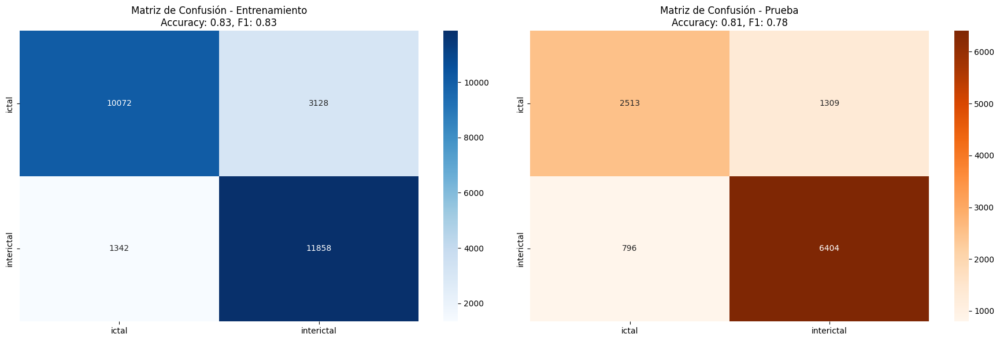


Archivo guardado (entrenamiento): /content/drive/MyDrive/EEG_For_Epileptic_Seizure_Recognition/features_top_sfbs_balanced.csv
Archivo guardado (prueba): /content/drive/MyDrive/EEG_For_Epileptic_Seizure_Recognition/features_top_sfbs_test_balanced.csv

RESUMEN FINAL
- Características originales: 15
- Características seleccionadas: 6
- Muestras entrenamiento: 26400
- Muestras prueba: 11022
- Accuracy Train/Test: 0.8307/0.8090
- F1-score Train/Test: 0.8299/0.7818


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.linear_model import LogisticRegression
from mlxtend.feature_selection import SequentialFeatureSelector as SFS
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, f1_score

# Configurar rutas de archivos
train_path = "/content/drive/MyDrive/EEG_For_Epileptic_Seizure_Recognition/features_top15_balanced.csv"
test_path = "/content/drive/MyDrive/EEG_For_Epileptic_Seizure_Recognition/features_top15_test_balanced.csv"
output_train_path = "/content/drive/MyDrive/EEG_For_Epileptic_Seizure_Recognition/features_top_sfbs_balanced.csv"
output_test_path = "/content/drive/MyDrive/EEG_For_Epileptic_Seizure_Recognition/features_top_sfbs_test_balanced.csv"

# Cargar datos de entrenamiento y prueba
df_train = pd.read_csv(train_path)
df_test = pd.read_csv(test_path)

# Validación: asegurar que hay datos
if df_train.empty or df_test.empty:
    raise ValueError("Los archivos de entrenamiento o prueba no contienen datos válidos.")

# Procesamiento de datos
X_train = df_train.drop(columns=['sample_id', 'subject', 'label']).apply(pd.to_numeric, errors='coerce')
y_train = df_train['label']
X_test = df_test.drop(columns=['sample_id', 'subject', 'label']).apply(pd.to_numeric, errors='coerce')
y_test = df_test['label']

# Eliminar filas con NaN
def clean_data(X, y):
    combined = pd.concat([X, y], axis=1)
    combined.dropna(inplace=True)
    return combined.drop(columns='label'), combined['label']

if X_train.isnull().any().any():
    print("Se encontraron valores NaN en entrenamiento. Se eliminarán las filas correspondientes.")
    X_train, y_train = clean_data(X_train, y_train)

if X_test.isnull().any().any():
    print("Se encontraron valores NaN en prueba. Se eliminarán las filas correspondientes.")
    X_test, y_test = clean_data(X_test, y_test)

# Mostrar distribución de clases
print("\nDistribución de clases - Entrenamiento:")
print(y_train.value_counts())
print("\nDistribución de clases - Prueba:")
print(y_test.value_counts())

# Codificar etiquetas
le = LabelEncoder()
y_train_encoded = le.fit_transform(y_train)
y_test_encoded = le.transform(y_test)

# Aplicar SFBS
sfbs = SFS(
    LogisticRegression(max_iter=1000),
    k_features=(1, X_train.shape[1]),
    forward=False,
    floating=True,
    scoring='f1_macro',
    cv=5,
    n_jobs=-1
)

sfbs.fit(X_train.values, y_train_encoded)

# Obtener características seleccionadas
selected_features = list(X_train.columns[list(sfbs.k_feature_idx_)])
print(f"\nCaracterísticas seleccionadas por SFBS ({len(selected_features)}):")
print(selected_features)

# Función para evaluación completa
def evaluate_model(model, X_train, y_train, X_test, y_test, feature_names, label_encoder):
    # Evaluación en entrenamiento
    y_train_pred = model.predict(X_train[feature_names])
    train_acc = accuracy_score(y_train, y_train_pred)
    train_f1 = f1_score(y_train, y_train_pred, average='macro')

    # Evaluación en prueba
    y_test_pred = model.predict(X_test[feature_names])
    test_acc = accuracy_score(y_test, y_test_pred)
    test_f1 = f1_score(y_test, y_test_pred, average='macro')

    # Reportes de clasificación
    print("\n" + "="*60)
    print("EVALUACIÓN EN DATOS DE ENTRENAMIENTO")
    print("="*60)
    print(classification_report(y_train, y_train_pred, target_names=label_encoder.classes_))

    print("\n" + "="*60)
    print("EVALUACIÓN EN DATOS DE PRUEBA")
    print("="*60)
    print(classification_report(y_test, y_test_pred, target_names=label_encoder.classes_))

    # Matrices de confusión
    fig, axes = plt.subplots(1, 2, figsize=(18, 6))

    # Matriz para entrenamiento
    cm_train = confusion_matrix(y_train, y_train_pred)
    sns.heatmap(cm_train, annot=True, fmt='d', cmap='Blues', ax=axes[0],
                xticklabels=label_encoder.classes_, yticklabels=label_encoder.classes_)
    axes[0].set_title(f'Matriz de Confusión - Entrenamiento\nAccuracy: {train_acc:.2f}, F1: {train_f1:.2f}')

    # Matriz para prueba
    cm_test = confusion_matrix(y_test, y_test_pred)
    sns.heatmap(cm_test, annot=True, fmt='d', cmap='Oranges', ax=axes[1],
                xticklabels=label_encoder.classes_, yticklabels=label_encoder.classes_)
    axes[1].set_title(f'Matriz de Confusión - Prueba\nAccuracy: {test_acc:.2f}, F1: {test_f1:.2f}')

    plt.tight_layout()
    plt.show()

    return y_train_pred, y_test_pred

# Entrenar y evaluar modelo
model = LogisticRegression(max_iter=1000)
model.fit(X_train[selected_features], y_train_encoded)

# Evaluación completa
y_train_pred, y_test_pred = evaluate_model(model, X_train, y_train_encoded, X_test, y_test_encoded,
                                         selected_features, le)

# Guardar nuevos datasets
df_train_selected = df_train[['sample_id', 'subject', 'label'] + selected_features]
df_train_selected.to_csv(output_train_path, index=False)
print(f"\nArchivo guardado (entrenamiento): {output_train_path}")

df_test_selected = df_test[['sample_id', 'subject', 'label'] + selected_features]
df_test_selected.to_csv(output_test_path, index=False)
print(f"Archivo guardado (prueba): {output_test_path}")

# Resumen final
print("\n" + "="*60)
print("RESUMEN FINAL")
print("="*60)
print(f"- Características originales: {X_train.shape[1]}")
print(f"- Características seleccionadas: {len(selected_features)}")
print(f"- Muestras entrenamiento: {len(df_train_selected)}")
print(f"- Muestras prueba: {len(df_test_selected)}")
print(f"- Accuracy Train/Test: {accuracy_score(y_train_encoded, y_train_pred):.4f}/{accuracy_score(y_test_encoded, y_test_pred):.4f}")
print(f"- F1-score Train/Test: {f1_score(y_train_encoded, y_train_pred, average='macro'):.4f}/{f1_score(y_test_encoded, y_test_pred, average='macro'):.4f}")

In [ ]:
csv_path = '/content/drive/MyDrive/EEG_For_Epileptic_Seizure_Recognition/features_top_sfbs_balanced.csv'
df = pd.read_csv(csv_path)
df

,sample_id,subject,label,C3-P3_A3_Entropy,C3-P3_D1_Entropy,C3-P3_D3_LogEnergy,C4-P4_D2_Entropy,C4-P4_A3_LogEnergy,C4-P4_D3_LogEnergy
0,chb01_g1,chb01,ictal,-9857.719206,0.013307,-654.961859,0.604248,122.063404,-666.638591
1,chb01_g1,chb01,interictal,-124.086155,0.000143,-727.306545,0.027544,-24.274311,-699.495802
2,chb01_g10,chb01,ictal,-46836.858318,0.007300,-669.848512,0.732992,138.318119,-660.562950
3,chb01_g10,chb01,interictal,-171.091330,0.000224,-739.907292,0.014767,-0.981255,-718.143952
4,chb01_g100,chb01,ictal,-16639.773976,0.000347,-689.905457,0.607091,133.957218,-666.651570
...,...,...,...,...,...,...,...,...,...
18375,chb23_g97,chb23,interictal,-497.694300,0.000122,-718.745876,0.051710,-4.232866,-703.579103
18376,chb23_g98,chb23,ictal,-3461.590471,0.002167,-669.791371,0.017106,91.957821,-705.593690
18377,chb23_g98,chb23,interictal,-200.956801,0.000570,-686.817174,0.260944,-5.417730,-679.687025
18378,chb23_g99,chb23,ictal,-6660.783150,0.003837,-662.314050,0.570032,50.103854,-677.813934


In [ ]:
import pandas as pd

def check_duplicate_features(file_path):
    """
    Verifica columnas duplicadas en un archivo CSV, excluyendo columnas de metadatos.

    Args:
        file_path (str): Ruta al archivo CSV a verificar
    """
    # Leer solo el encabezado
    try:
        df = pd.read_csv(file_path, nrows=1)
    except Exception as e:
        print(f"Error al leer el archivo: {e}")
        return

    # Columnas de metadatos esperadas (algunas pueden no estar presentes)
    metadata_cols = ['sample_id', 'subject', 'label']

    # Identificar columnas de características (excluyendo metadatos existentes)
    feature_columns = [col for col in df.columns if col not in metadata_cols]

    print(f"\nArchivo analizado: {file_path}")
    print(f"\nColumnas de características encontradas ({len(feature_columns)}):")
    print(feature_columns)

    # Verificar duplicados exactos en todas las columnas
    duplicates = df.columns[df.columns.duplicated()].tolist()

    if duplicates:
        print("\n¡ADVERTENCIA! Columnas duplicadas detectadas:")
        for dup in duplicates:
            print(f"- {dup}")
    else:
        print("\nNo se encontraron columnas duplicadas.")

    # Verificar si hay nombres de características muy similares (diferencias mínimas)
    lower_columns = [col.lower().strip() for col in feature_columns]
    potential_duplicates = set([col for col in lower_columns if lower_columns.count(col) > 1])

    if potential_duplicates:
        print("\nPosibles columnas similares (verificar manualmente):")
        for dup in potential_duplicates:
            matches = [col for col in feature_columns if col.lower().strip() == dup]
            print(f"- Posible variante de: {matches}")

# Archivos a verificar
files_to_check = [
    "/content/drive/MyDrive/EEG_For_Epileptic_Seizure_Recognition/features_top_sfbs.csv",
    "/content/drive/MyDrive/EEG_For_Epileptic_Seizure_Recognition/features_top_sfbs_test.csv"
]

for file_path in files_to_check:
    check_duplicate_features(file_path)
    print("\n" + "="*80 + "\n")


Archivo analizado: /content/drive/MyDrive/EEG_For_Epileptic_Seizure_Recognition/features_top_sfbs.csv

Columnas de características encontradas (6):
['C3-P3_A3_Entropy', 'C3-P3_D1_Entropy', 'C3-P3_D3_LogEnergy', 'C4-P4_D2_Entropy', 'C4-P4_A3_LogEnergy', 'C4-P4_D3_LogEnergy']

No se encontraron columnas duplicadas.



Archivo analizado: /content/drive/MyDrive/EEG_For_Epileptic_Seizure_Recognition/features_top_sfbs_test.csv

Columnas de características encontradas (6):
['C3-P3_A3_Entropy', 'C3-P3_D1_Entropy', 'C3-P3_D3_LogEnergy', 'C4-P4_D2_Entropy', 'C4-P4_A3_LogEnergy', 'C4-P4_D3_LogEnergy']

No se encontraron columnas duplicadas.




### Extracción de características

#### Estandarización de características

La estandarización es un paso fundamental antes de aplicar técnicas como PCA, LDA o t-SNE porque estas técnicas son sensibles a la escala de los datos. En muchos conjuntos de datos, las variables tienen diferentes unidades o rangos de valores. Por ejemplo, una variable podría representar edad (de 0 a 100) y otra ingresos (de 0 a 100,000). Si no se estandarizan, las variables con mayor rango dominarán la varianza total del conjunto de datos, afectando desproporcionadamente el resultado del análisis.

En el caso de PCA (Análisis de Componentes Principales), su objetivo es encontrar las direcciones (componentes) que explican la mayor varianza en los datos. Si las variables no están en la misma escala, PCA tenderá a centrarse solo en aquellas de mayor magnitud, ignorando otras potencialmente relevantes pero con menor escala. La estandarización asegura que cada variable contribuya de forma equitativa al cálculo de los componentes principales.

In [ ]:
import pandas as pd
from sklearn.preprocessing import StandardScaler
import joblib

# 1. Cargar el CSV con las características seleccionadas
df = pd.read_csv('/content/drive/MyDrive/EEG_For_Epileptic_Seizure_Recognition/features_top_sfbs_balanced.csv')

# 2. Identificar las columnas de features (todas menos los identificadores y la etiqueta)
non_feature_cols = ['sample_id', 'subject', 'label']
feature_cols = [col for col in df.columns if col not in non_feature_cols]

# 3. Extraer matriz X y vector y
X = df[feature_cols]
y = df['label']

# 4. Estandarizar las features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

#DataFrame con los datos estandarizados
X_scaled_df = pd.DataFrame(X_scaled, columns=feature_cols)

#Volver a incorporar los identificadores y la etiqueta
X_scaled_df[['sample_id', 'subject', 'label']] = df[['sample_id', 'subject', 'label']]


output_path = '/content/drive/MyDrive/EEG_For_Epileptic_Seizure_Recognition/standardized_top_sfbs_balanced.csv'
X_scaled_df.to_csv(output_path, index=False)

joblib.dump(scaler, '/content/drive/MyDrive/EEG_For_Epileptic_Seizure_Recognition/scaler.pkl')
print(f"Estandarización completada y guardada en {output_path}")

Estandarización completada y guardada en /content/drive/MyDrive/EEG_For_Epileptic_Seizure_Recognition/standardized_top_sfbs_balanced.csv


In [ ]:
csv_path = '/content/drive/MyDrive/EEG_For_Epileptic_Seizure_Recognition/standardized_top_sfbs_balanced.csv'
df = pd.read_csv(csv_path)
df

,C3-P3_D1_Entropy,C3-P3_D2_Entropy,C3-P3_D3_LogEnergy,C4-P4_A3_Entropy,C4-P4_D3_LogEnergy,CZ-PZ_A3_LogEnergy,sample_id,subject,label
0,0.019172,0.053381,0.329616,-0.635705,0.248847,0.752763,chb01_g1,chb01,ictal
1,0.018448,0.035269,-0.817134,0.421383,-0.321445,-0.733117,chb01_g1,chb01,interictal
2,0.018842,0.047925,0.093645,-1.733061,0.354300,1.707643,chb01_g10,chb01,ictal
3,0.018452,0.035474,-1.016871,0.427594,-0.645116,-0.908978,chb01_g10,chb01,interictal
4,0.018459,0.035512,-0.224282,-3.700116,0.248622,0.879606,chb01_g100,chb01,ictal
...,...,...,...,...,...,...,...,...,...
26395,0.018475,0.036422,-0.121507,0.192818,-0.227122,-0.053228,synthetic_8016,synth_subj,ictal
26396,0.018901,0.045370,-0.160190,0.347777,-0.401774,0.050433,synthetic_8017,synth_subj,ictal
26397,0.019692,0.061314,0.522091,0.055574,0.248102,1.529260,synthetic_8018,synth_subj,ictal
26398,0.018843,0.048420,0.247549,-0.655173,0.174008,1.236210,synthetic_8019,synth_subj,ictal


#### PCA

El código a continuación es una implementación de la técnica de extracción de características PCA (Análisis de Componentes Principales) al conjunto de datos de EEG previamente estandarizado y filtrado por características relevantes. El objetivo principal del proceso es reducir la dimensionalidad del conjunto de datos original mientras se conserva la mayor parte de la varianza posible.

Primero, se carga el archivo CSV con los datos estandarizados, y se eliminan todas las columnas no numéricas (como identificadores y etiquetas), dejando únicamente las características cuantitativas que serán usadas para el análisis.

A continuación, se ajusta un modelo de PCA sin limitar el número de componentes, para obtener la proporción de varianza explicada por cada componente principal. Se calculan y grafican tanto la varianza explicada individual como la acumulada. Esta visualización permite observar cuántos componentes son necesarios para alcanzar un umbral deseado de retención de información —en este caso, un 90%. Luego, se determina el número mínimo de componentes necesarios para superar ese umbral, y se vuelve a aplicar PCA pero esta vez conservando solo ese número reducido de componentes.

Finalmente, se reconstruye un nuevo DataFrame que contiene tanto los metadatos originales (como el sample_id, subject, y label) como los valores transformados por PCA. Este nuevo DataFrame representa una versión comprimida del dataset, ideal para posteriores análisis de clasificación o visualización, reduciendo el ruido y la redundancia de los datos originales. El archivo resultante se guarda como componentes_pca.csv, lo cual permite su uso en pasos posteriores para el entrenamiento y prueba del modelo de Machine Learning seleccionado.

In [ ]:
import pandas as pd
import numpy as np
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import matplotlib.ticker as mtick
import joblib

Columnas no numéricas que se eliminarán: ['sample_id', 'subject', 'label']


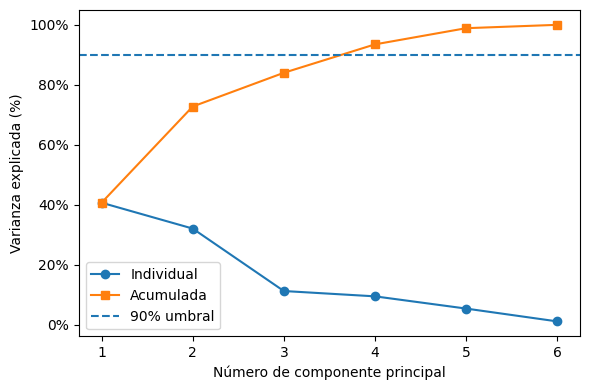

Componentes necesarios para explicar ≥90%: 4


['/content/drive/MyDrive/EEG_For_Epileptic_Seizure_Recognition/pca_balanced.pkl']

In [ ]:
df = pd.read_csv('/content/drive/MyDrive/EEG_For_Epileptic_Seizure_Recognition/standardized_top_sfbs_balanced.csv')

# Se elimina columnas no numéricas
# O bien conoces sus nombres, o automáticamente:
non_numeric = df.select_dtypes(exclude=[np.number]).columns.tolist()
#    Por ejemplo: non_numeric == ['sample_id', 'subject', 'label']
print("Columnas no numéricas que se eliminarán:", non_numeric)


X = df.drop(columns=non_numeric).values

# Aplica PCA con todos los componentes posibles
pca_full = PCA()
pca_full.fit(X)

# Varianza explicada individual y acumulada
var_exp = pca_full.explained_variance_ratio_
cum_var_exp = var_exp.cumsum()


# Graficar varianza explicada con porcentajes
plt.figure(figsize=(6, 4))
plt.plot(range(1, len(var_exp) + 1), var_exp * 100, marker='o', label='Individual')
plt.plot(range(1, len(cum_var_exp) + 1), cum_var_exp * 100, marker='s', label='Acumulada')
plt.axhline(90, linestyle='--', label='90% umbral')
plt.xlabel('Número de componente principal')
plt.ylabel('Varianza explicada (%)')
plt.gca().yaxis.set_major_formatter(mtick.PercentFormatter())
plt.legend()
plt.tight_layout()
plt.show()

# Calcula el número mínimo de PCs para un umbral del 90%
n_components_90 = int(np.where(cum_var_exp >= 0.90)[0][0] + 1)
print(f"Componentes necesarios para explicar ≥90%: {n_components_90}")

pca = PCA(n_components=n_components_90)
X_pca = pca.fit_transform(X)

joblib.dump(pca, '/content/drive/MyDrive/EEG_For_Epileptic_Seizure_Recognition/pca_balanced.pkl')

In [ ]:
#Construcción del DataFrame final con metadatos y PCs
pc_cols = [f"PC{i+1}" for i in range(X_pca.shape[1])]
df_pcs = pd.DataFrame(X_pca, columns=pc_cols)

#Se agregan los metadatos
meta = df[['sample_id', 'subject', 'label']].reset_index(drop=True)
#Paso: concatena
df_pca_full = pd.concat([meta, df_pcs], axis=1)

output_path = '/content/drive/MyDrive/EEG_For_Epileptic_Seizure_Recognition/componentes_pca_balanced.csv'
df_pca_full.to_csv(output_path, index=False)

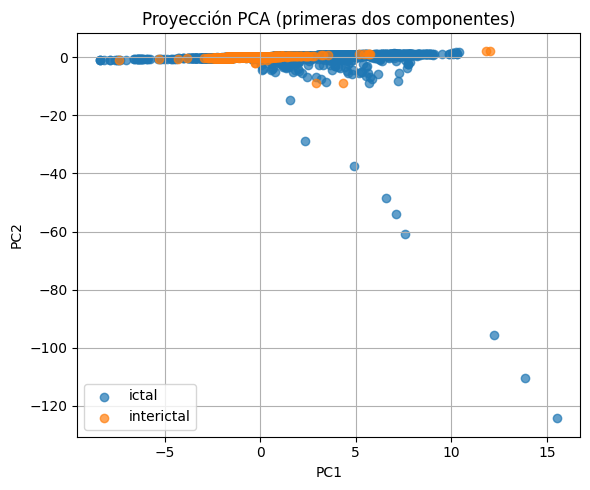

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(6,5))
for lbl in df_pca_full['label'].unique():
    sel = df_pca_full['label'] == lbl
    plt.scatter(
        df_pca_full.loc[sel, 'PC1'],
        df_pca_full.loc[sel, 'PC2'],
        label=lbl, alpha=0.7
    )
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.title('Proyección PCA (primeras dos componentes)')
plt.legend()
plt.grid()
plt.tight_layout()
plt.show()

In [ ]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
import joblib

# 1. Cargar datos de prueba
df_test = pd.read_csv('/content/drive/MyDrive/EEG_For_Epileptic_Seizure_Recognition/features_top_sfbs_test_balanced.csv')

# 2. Identificar columnas (deben ser las mismas que en entrenamiento)
non_feature_cols = ['sample_id', 'subject', 'label']
feature_cols = [col for col in df_test.columns if col not in non_feature_cols]

# 3. Extraer matriz X_test (no necesitas y_test para el preprocesamiento)
X_test = df_test[feature_cols]

# 4. Estandarizar CON LOS PARÁMETROS DEL ENTRENAMIENTO
# (Asumiendo que guardaste el scaler como en tu código de entrenamiento)
scaler = joblib.load('/content/drive/MyDrive/EEG_For_Epileptic_Seizure_Recognition/scaler.pkl')  # Cargar scaler entrenado
X_test_scaled = scaler.transform(X_test)  # ¡Solo transform, no fit_transform!

# 5. Crear DataFrame estandarizado (opcional, solo si necesitas guardarlo)
X_test_scaled_df = pd.DataFrame(X_test_scaled, columns=feature_cols)
X_test_scaled_df[['sample_id', 'subject', 'label']] = df_test[['sample_id', 'subject', 'label']]

# 6. Aplicar PCA con el modelo entrenado
pca = joblib.load('/content/drive/MyDrive/EEG_For_Epileptic_Seizure_Recognition/pca_balanced.pkl')  # Cargar PCA entrenado
X_test_pca = pca.transform(X_test_scaled)  # ¡Solo transform!

# 7. Construir DataFrame final
df_test_pcs = pd.DataFrame(X_test_pca, columns=[f"PC{i+1}" for i in range(X_test_pca.shape[1])])
meta_test = df_test[['sample_id', 'subject', 'label']].reset_index(drop=True)
df_pca_test_full = pd.concat([meta_test, df_test_pcs], axis=1)

# 8. Guardar resultados
output_path_test = '/content/drive/MyDrive/EEG_For_Epileptic_Seizure_Recognition/componentes_pca_test_balanced.csv'
df_pca_test_full.to_csv(output_path_test, index=False)

print(f"Datos de prueba transformados y guardados en {output_path_test}")
print("Dimensiones de los datos transformados:", X_test_pca.shape)

Datos de prueba transformados y guardados en /content/drive/MyDrive/EEG_For_Epileptic_Seizure_Recognition/componentes_pca_test_balanced.csv
Dimensiones de los datos transformados: (11022, 4)


In [ ]:
csv_path = '/content/drive/MyDrive/EEG_For_Epileptic_Seizure_Recognition/componentes_pca_balanced.csv'
df = pd.read_csv(csv_path)
df

,sample_id,subject,label,PC1,PC2,PC3,PC4
0,chb01_g1,chb01,ictal,0.945224,0.178830,-0.392948,0.238042
1,chb01_g1,chb01,interictal,-1.138324,-0.089250,-0.063971,-0.318386
2,chb01_g10,chb01,ictal,1.838612,0.328772,-1.537697,0.450846
3,chb01_g10,chb01,interictal,-1.499969,-0.130563,-0.223608,-0.347007
4,chb01_g100,chb01,ictal,2.128809,0.391682,-2.879845,-1.097199
...,...,...,...,...,...,...,...
26395,synthetic_8016,synth_subj,ictal,-0.302205,0.000810,0.010248,0.124108
26396,synthetic_8017,synth_subj,ictal,-0.437835,-0.010315,0.011568,0.341744
26397,synthetic_8018,synth_subj,ictal,1.095206,0.193910,-0.027714,1.191057
26398,synthetic_8019,synth_subj,ictal,1.102671,0.204471,-0.617835,0.641854


In [ ]:
csv_path = '/content/drive/MyDrive/EEG_For_Epileptic_Seizure_Recognition/componentes_pca_test.csv'
df = pd.read_csv(csv_path)
df

,sample_id,subject,label,PC1,PC2,PC3,PC4,PC5
0,chb08_g1,chb08,ictal,0.341437,-0.039791,0.117184,0.035084,0.573953
1,chb08_g1,chb08,interictal,-1.372347,0.047080,-0.104743,-0.163710,-0.312232
2,chb08_g10,chb08,ictal,0.784421,-0.084210,0.219965,0.002306,1.474080
3,chb08_g10,chb08,interictal,-1.043619,0.012282,-0.037729,-0.199777,0.033845
4,chb08_g100,chb08,ictal,0.330959,-0.036857,0.171567,0.235771,1.593947
...,...,...,...,...,...,...,...,...
11017,chb20_g995,chb20,interictal,-0.564876,0.006615,-0.006523,0.043009,0.051928
11018,chb20_g996,chb20,interictal,-0.306448,0.003655,0.012358,0.128390,0.071761
11019,chb20_g997,chb20,interictal,-0.277086,0.006371,0.037525,0.112984,0.598310
11020,chb20_g998,chb20,interictal,-0.397202,0.005028,0.009653,0.122695,0.165411


Cargando datos...

Generando pairplot para datos de entrenamiento...


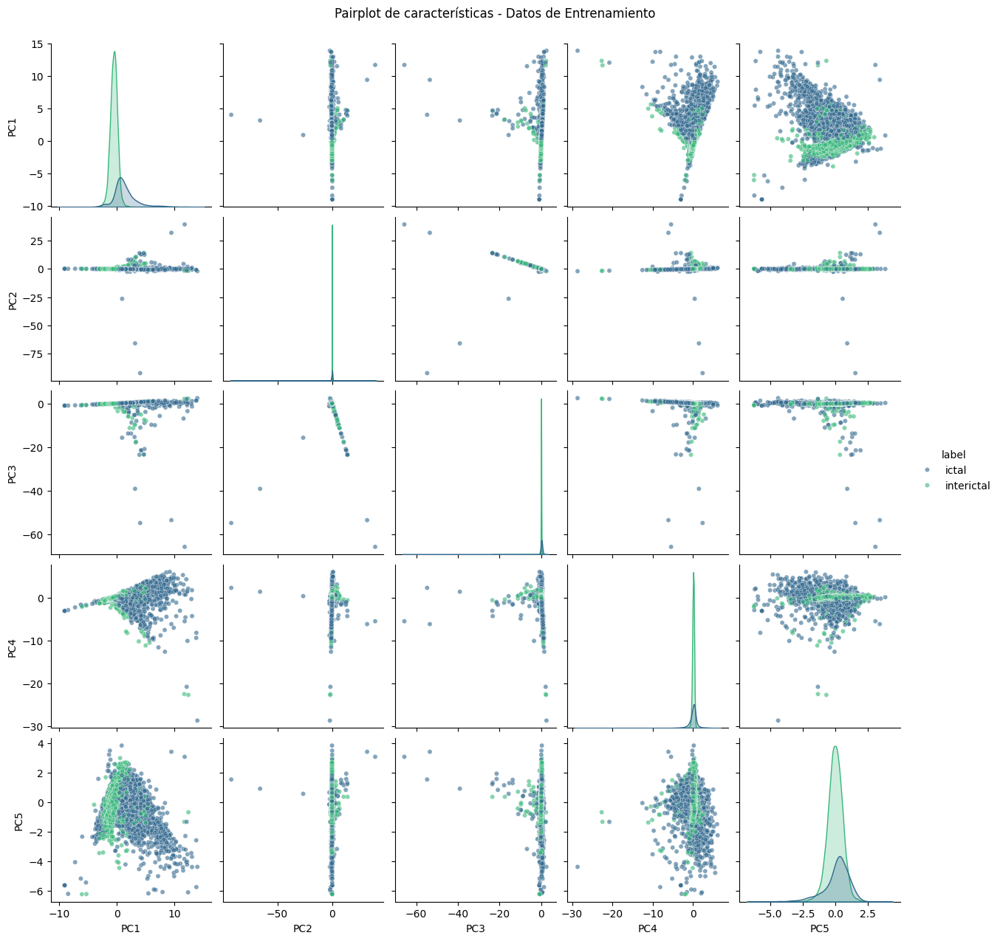


Generando pairplot para datos de prueba...


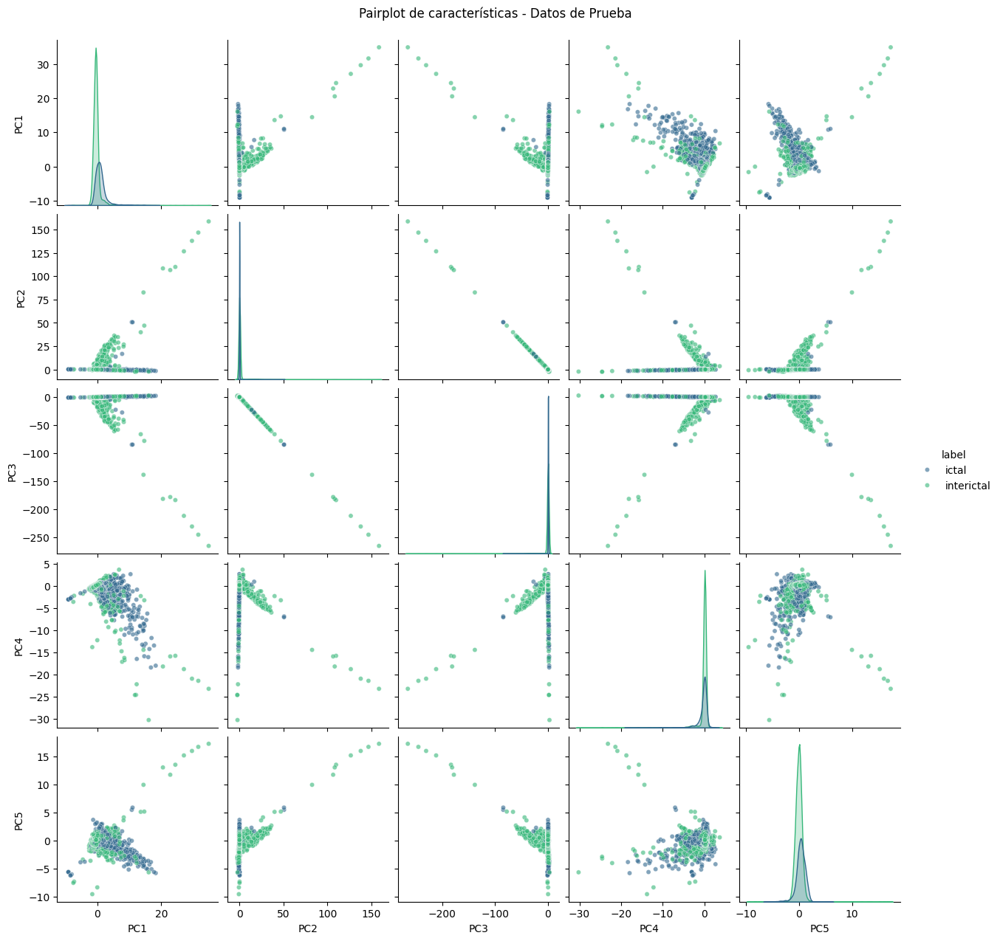

In [ ]:
# Cargar los datos
print("Cargando datos...")
train = pd.read_csv('/content/drive/MyDrive/EEG_For_Epileptic_Seizure_Recognition/componentes_pca.csv')
test = pd.read_csv('/content/drive/MyDrive/EEG_For_Epileptic_Seizure_Recognition/componentes_pca_test.csv')

# Seleccionar las primeras 5 características
features = [f'PC{i+1}' for i in range(5)] if 'PC1' in train.columns else train.columns[3:8]  # Ajustar según tus columnas

# Pairplot para datos de entrenamiento
print("\nGenerando pairplot para datos de entrenamiento...")
sns.pairplot(train[features + ['label']], hue='label', palette='viridis',
             plot_kws={'alpha': 0.6, 's': 20}, diag_kind='kde')
plt.suptitle('Pairplot de características - Datos de Entrenamiento', y=1.02)
plt.show()

# Pairplot para datos de prueba
print("\nGenerando pairplot para datos de prueba...")
sns.pairplot(test[features + ['label']], hue='label', palette='viridis',
             plot_kws={'alpha': 0.6, 's': 20}, diag_kind='kde')
plt.suptitle('Pairplot de características - Datos de Prueba', y=1.02)
plt.show()

## Implementación de modelos de ML

In [ ]:
# Manipulación de datos
import pandas as pd
import numpy as np

# Visualización
import matplotlib.pyplot as plt
import seaborn as sns

# Machine Learning - Modelos
from sklearn.svm import SVC
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier

# Machine Learning - Preprocesamiento y evaluación
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score

# Guardado de modelos
import joblib

### Modelos después de Aplicar StandardScaler / PCA

#### Random Forest

##### Mejor modelo


No se aplica escalado (scalingOption = 0)

=== Rendimiento en Entrenamiento ===
              precision    recall  f1-score   support

       ictal       0.88      0.79      0.83     13200
  interictal       0.81      0.89      0.85     13200

    accuracy                           0.84     26400
   macro avg       0.84      0.84      0.84     26400
weighted avg       0.84      0.84      0.84     26400

Exactitud (Accuracy): 0.8406

=== Rendimiento en Prueba ===
              precision    recall  f1-score   support

       ictal       0.76      0.67      0.71      3822
  interictal       0.83      0.89      0.86      7200

    accuracy                           0.81     11022
   macro avg       0.79      0.78      0.78     11022
weighted avg       0.81      0.81      0.81     11022

Exactitud (Accuracy): 0.8097


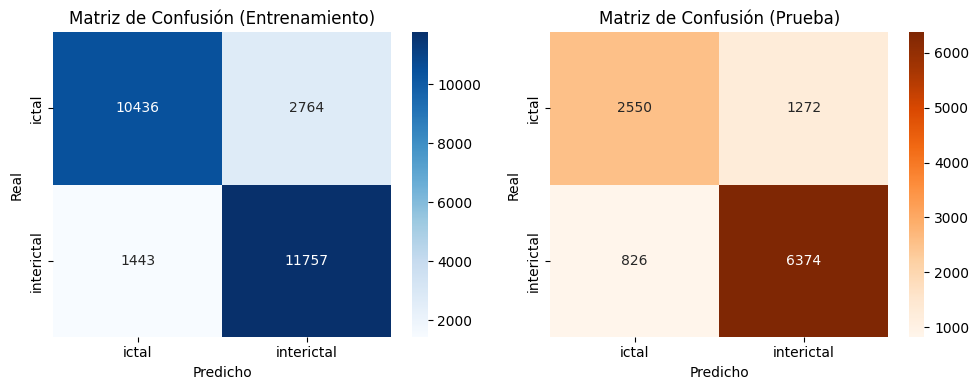


Modelo guardado en: /content/drive/MyDrive/EEG_For_Epileptic_Seizure_Recognition/randomForest_model.pkl


In [ ]:
# 2. Cargar los datos transformados (PCA) de entrenamiento y prueba
train_pca = pd.read_csv('/content/drive/MyDrive/EEG_For_Epileptic_Seizure_Recognition/componentes_pca_balanced.csv')
test_pca = pd.read_csv('/content/drive/MyDrive/EEG_For_Epileptic_Seizure_Recognition/componentes_pca_test_balanced.csv')

# 3. Separar características (X) y etiquetas (y)
# Para entrenamiento
X_train = train_pca.drop(columns=['sample_id', 'subject', 'label'])  # Solo componentes PCA
y_train = train_pca['label']

# Para prueba
X_test = test_pca.drop(columns=['sample_id', 'subject', 'label'])    # Mismas componentes PCA
y_test = test_pca['label']

# --- Escalado de características ---
from sklearn.preprocessing import StandardScaler, MinMaxScaler

scalingOption = 0  # 0 = no escalar, 1 = StandardScaler, 2 = MinMaxScaler (-1 a 1)

if scalingOption == 1:
    print("\nAplicando StandardScaler (media=0, varianza=1)")
    scaler = StandardScaler()
    X_train = scaler.fit_transform(X_train)
    X_test = scaler.transform(X_test)
elif scalingOption == 2:
    print("\nAplicando MinMaxScaler (rango [-1, 1])")
    scaler = MinMaxScaler(feature_range=(-1, 1))
    X_train = scaler.fit_transform(X_train)
    X_test = scaler.transform(X_test)
else:
    print("\nNo se aplica escalado (scalingOption = 0)")

# 4. Entrenar el modelo (usando RandomForest como ejemplo)
model = RandomForestClassifier(
    n_estimators=150,   # Número de árboles
    random_state=42,    # Semilla para reproducibilidad
    class_weight='balanced',  # Manejo de clases desbalanceadas (opcional)
    max_depth=5,
    max_features='sqrt',
    min_samples_split=2
)
model.fit(X_train, y_train)

# 5. Evaluar el modelo
# --- Predicciones ---
y_train_pred = model.predict(X_train)
y_test_pred = model.predict(X_test)

# --- Métricas ---
print("\n=== Rendimiento en Entrenamiento ===")
print(classification_report(y_train, y_train_pred))
print(f"Exactitud (Accuracy): {accuracy_score(y_train, y_train_pred):.4f}")

print("\n=== Rendimiento en Prueba ===")
print(classification_report(y_test, y_test_pred))
print(f"Exactitud (Accuracy): {accuracy_score(y_test, y_test_pred):.4f}")

# --- Matriz de Confusión ---
plt.figure(figsize=(10, 4))

plt.subplot(1, 2, 1)
sns.heatmap(confusion_matrix(y_train, y_train_pred),
            annot=True, fmt='d', cmap='Blues',
            xticklabels=model.classes_, yticklabels=model.classes_)
plt.title('Matriz de Confusión (Entrenamiento)')
plt.xlabel('Predicho')
plt.ylabel('Real')

plt.subplot(1, 2, 2)
sns.heatmap(confusion_matrix(y_test, y_test_pred),
            annot=True, fmt='d', cmap='Oranges',
            xticklabels=model.classes_, yticklabels=model.classes_)
plt.title('Matriz de Confusión (Prueba)')
plt.xlabel('Predicho')
plt.ylabel('Real')

plt.tight_layout()
plt.show()

# 6. (Opcional) Guardar el modelo entrenado para uso futuro
import joblib
model_path = '/content/drive/MyDrive/EEG_For_Epileptic_Seizure_Recognition/randomForest_model.pkl'
joblib.dump(model, model_path)
print(f"\nModelo guardado en: {model_path}")

# (Opcional) Guardar el scaler si se usó
if scalingOption in [1, 2]:
    scaler_path = '/content/drive/MyDrive/EEG_For_Epileptic_Seizure_Recognition/scaler.pkl'
    joblib.dump(scaler, scaler_path)
    print(f"Scaler guardado en: {scaler_path}")

##### Búsqueda de hiperparámetros

In [ ]:
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import make_scorer
from sklearn.metrics import recall_score

# 1. Definir un scorer personalizado para recall de la clase 'ictal'
def ictal_recall_score(y_true, y_pred):
    # Asume que la clase 'ictal' está codificada como 1 (verifica con le.classes_)
    return recall_score(y_true, y_pred, labels=[1], average='micro')  # Ajusta el label según tu encoding

scorer = make_scorer(ictal_recall_score, greater_is_better=True)

# 2. Param grid (ajusta según necesidades)
param_grid = {
    'n_estimators': [100, 200, 300],
    'max_depth': [10, 20, None],
    'min_samples_split': [2, 5, 10],
    'class_weight': ['balanced', {'ictal': 3, 'interictal': 1}]  # Peso adicional a la clase ictal
}

# 3. GridSearchCV con el scorer personalizado
grid_search = GridSearchCV(
    RandomForestClassifier(random_state=42),
    param_grid,
    cv=5,
    scoring=scorer,  # Usa el scorer personalizado
    n_jobs=-1,
    verbose=2
)

grid_search.fit(X_train, y_train)

# 4. Resultados
print("\nMejores parámetros para recall de clase ictal:", grid_search.best_params_)
best_model = grid_search.best_estimator_

# 5. Evaluar en prueba
y_test_pred = best_model.predict(X_test)
print("\n=== Rendimiento en Prueba (Modelo Optimizado) ===")
print(classification_report(y_test, y_test_pred, target_names=le.classes_))

Fitting 5 folds for each of 54 candidates, totalling 270 fits

Mejores parámetros para recall de clase ictal: {'class_weight': 'balanced', 'max_depth': 10, 'min_samples_split': 2, 'n_estimators': 100}

=== Rendimiento en Prueba (Modelo Optimizado) ===
              precision    recall  f1-score   support

       ictal       0.73      0.66      0.70      3822
  interictal       0.83      0.87      0.85      7200

    accuracy                           0.80     11022
   macro avg       0.78      0.77      0.77     11022
weighted avg       0.80      0.80      0.80     11022



#### SVM / Regresión Logística

##### Mejor modelo

Cargando y preparando datos...

No se aplica escalado (scalingOption = 0)

Distribución de clases:
Entrenamiento: {'ictal': np.int64(13200), 'interictal': np.int64(13200)}
Prueba: {'ictal': np.int64(3822), 'interictal': np.int64(7200)}

Entrenando modelo SVM optimizado...

Evaluando SVM...

Evaluación SVM en Entrenamiento:
              precision    recall  f1-score   support

       ictal       0.88      0.77      0.82     13200
  interictal       0.80      0.90      0.84     13200

    accuracy                           0.83     26400
   macro avg       0.84      0.83      0.83     26400
weighted avg       0.84      0.83      0.83     26400



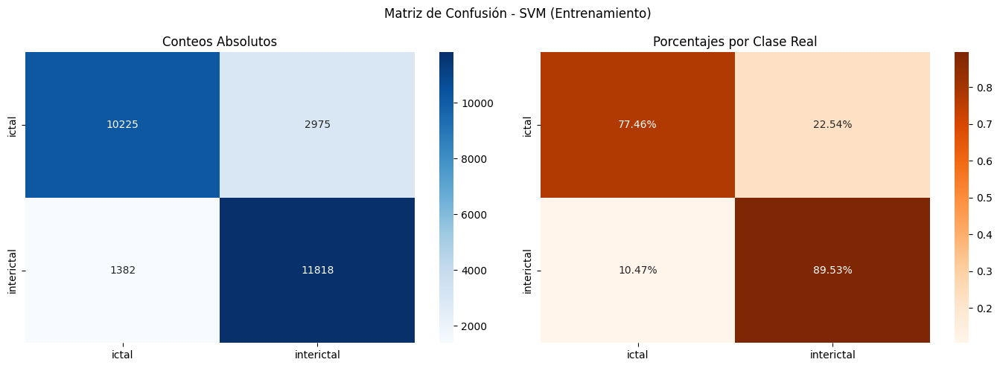


Evaluación SVM en Prueba:
              precision    recall  f1-score   support

       ictal       0.77      0.66      0.71      3822
  interictal       0.83      0.89      0.86      7200

    accuracy                           0.81     11022
   macro avg       0.80      0.77      0.78     11022
weighted avg       0.81      0.81      0.81     11022



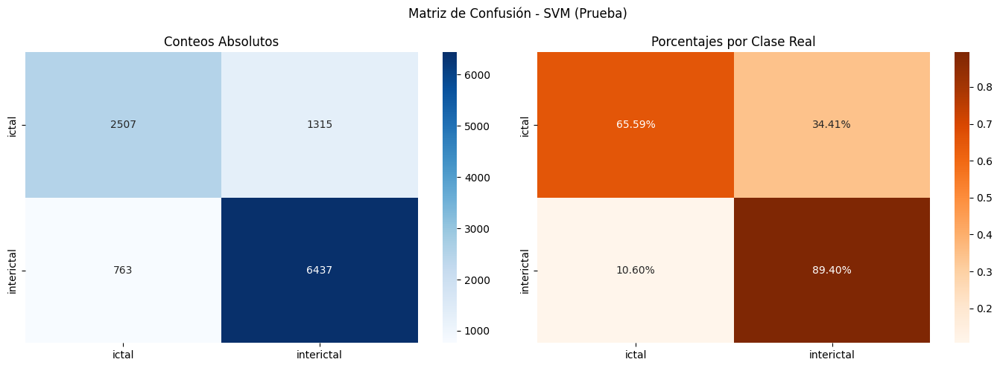


Modelo SVM guardado exitosamente.


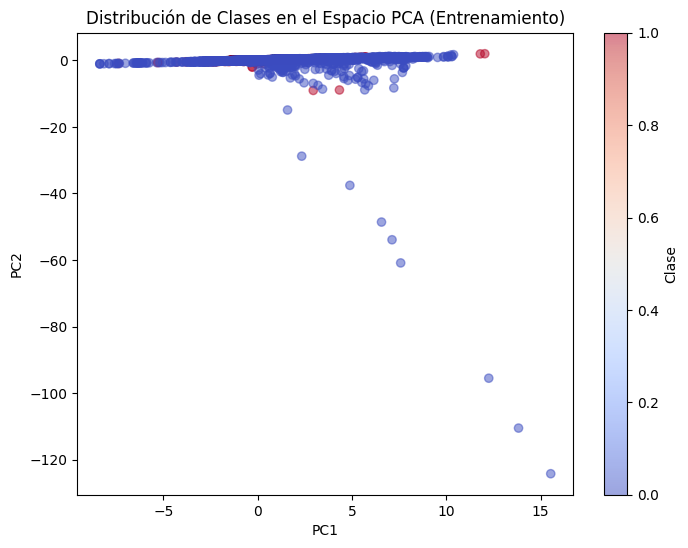

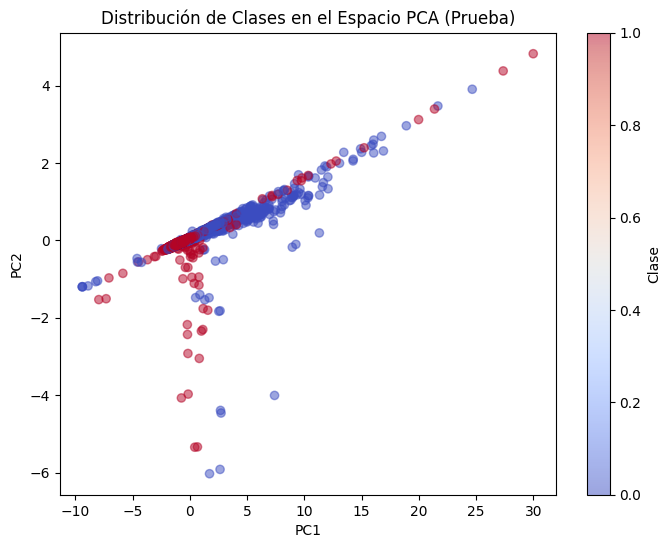

In [ ]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import LabelEncoder, StandardScaler, MinMaxScaler
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.svm import SVC
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import seaborn as sns
import joblib

# 1. Configuración
RANDOM_STATE = 42
SAMPLE_SIZE = 10000
scalingOption = 0  # 0 = no escalar, 1 = StandardScaler, 2 = MinMaxScaler (-1 a 1)

# 2. Carga y preprocesamiento de datos
print("Cargando y preparando datos...")
train = pd.read_csv('/content/drive/MyDrive/EEG_For_Epileptic_Seizure_Recognition/componentes_pca_balanced.csv')
test = pd.read_csv('/content/drive/MyDrive/EEG_For_Epileptic_Seizure_Recognition/componentes_pca_test_balanced.csv')

le = LabelEncoder()
y_train = le.fit_transform(train['label'])
y_test = le.transform(test['label'])
X_train = train.drop(columns=['sample_id', 'subject', 'label']).values.astype('float32')
X_test = test.drop(columns=['sample_id', 'subject', 'label']).values.astype('float32')

# --- NUEVA SECCIÓN: Escalado de características ---
if scalingOption == 1:
    print("\nAplicando StandardScaler (media=0, varianza=1)")
    scaler = StandardScaler()
    X_train = scaler.fit_transform(X_train)
    X_test = scaler.transform(X_test)
elif scalingOption == 2:
    print("\nAplicando MinMaxScaler (rango [-1, 1])")
    scaler = MinMaxScaler(feature_range=(-1, 1))
    X_train = scaler.fit_transform(X_train)
    X_test = scaler.transform(X_test)
else:
    print("\nNo se aplica escalado (scalingOption = 0)")

# 3. Verificación de balanceo de clases
print("\nDistribución de clases:")
print("Entrenamiento:", {k: v for k, v in zip(le.classes_, np.bincount(y_train))})
print("Prueba:", {k: v for k, v in zip(le.classes_, np.bincount(y_test))})

# 4. Modelo SVM mejorado
print("\nEntrenando modelo SVM optimizado...")
svm_params = {
    'C': 0.1,
    'gamma': 'scale',
    'kernel': 'rbf',
    'class_weight': 'balanced',
    'random_state': RANDOM_STATE,
    'probability': True
}

svm_model = SVC(**svm_params)
svm_model.fit(X_train, y_train)

# 5. Función mejorada para evaluación y visualización
def detailed_evaluation(model, X, y, dataset_name="", model_name=""):
    y_pred = model.predict(X)

    print(f"\nEvaluación {model_name} en {dataset_name}:")
    print(classification_report(y, y_pred, target_names=le.classes_, zero_division=0))

    cm = confusion_matrix(y, y_pred)
    cm_percent = cm / cm.sum(axis=1)[:, np.newaxis]

    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 5))

    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', ax=ax1,
                xticklabels=le.classes_, yticklabels=le.classes_)
    ax1.set_title('Conteos Absolutos')

    sns.heatmap(cm_percent, annot=True, fmt='.2%', cmap='Oranges', ax=ax2,
                xticklabels=le.classes_, yticklabels=le.classes_)
    ax2.set_title('Porcentajes por Clase Real')

    plt.suptitle(f'Matriz de Confusión - {model_name} ({dataset_name})')
    plt.tight_layout()
    plt.show()

# Evaluación en entrenamiento y prueba
print("\nEvaluando SVM...")
detailed_evaluation(svm_model, X_train, y_train, "Entrenamiento", "SVM")
detailed_evaluation(svm_model, X_test, y_test, "Prueba", "SVM")

# 6. Estrategia alternativa si SVM falla
if len(np.unique(svm_model.predict(X_test))) == 1:
    print("\n¡Advertencia! SVM solo predice una clase. Probando Regresión Logística...")

    lr_params = {
        'penalty': 'l2',
        'solver': 'lbfgs',
        'class_weight': 'balanced',
        'random_state': RANDOM_STATE,
        'max_iter': 1000
    }

    lr_model = LogisticRegression(**lr_params)
    lr_model.fit(X_train, y_train)

    # Evaluación LR en entrenamiento y prueba
    detailed_evaluation(lr_model, X_train, y_train, "Entrenamiento", "Regresión Logística")
    detailed_evaluation(lr_model, X_test, y_test, "Prueba", "Regresión Logística")

    # Guardar modelo alternativo
    joblib.dump(lr_model, '/content/drive/MyDrive/EEG_For_Epileptic_Seizure_Recognition/lr_model_balanced.pkl')
    print("Modelo de Regresión Logística guardado.")
else:
    # Guardar modelo SVM
    joblib.dump(svm_model, '/content/drive/MyDrive/EEG_For_Epileptic_Seizure_Recognition/svm_model_balanced.pkl')
    print("\nModelo SVM guardado exitosamente.")

# (Opcional) Guardar el scaler si se usó
if scalingOption in [1, 2]:
    scaler_path = '/content/drive/MyDrive/EEG_For_Epileptic_Seizure_Recognition/scaler_v2_balanced.pkl'
    joblib.dump(scaler, scaler_path)
    print(f"Scaler guardado en: {scaler_path}")

# 7. Visualización de las componentes principales
if X_train.shape[1] >= 2:
    plt.figure(figsize=(8, 6))
    plt.scatter(X_train[:, 0], X_train[:, 1], c=y_train, alpha=0.5, cmap='coolwarm')
    plt.xlabel('PC1')
    plt.ylabel('PC2')
    plt.title('Distribución de Clases en el Espacio PCA (Entrenamiento)')
    plt.colorbar(label='Clase')
    plt.show()

    # Visualización para datos de prueba también
    plt.figure(figsize=(8, 6))
    plt.scatter(X_test[:, 0], X_test[:, 1], c=y_test, alpha=0.5, cmap='coolwarm')
    plt.xlabel('PC1')
    plt.ylabel('PC2')
    plt.title('Distribución de Clases en el Espacio PCA (Prueba)')
    plt.colorbar(label='Clase')
    plt.show()

##### Búsqueda de hiperparámetros

In [ ]:
from sklearn.model_selection import GridSearchCV
from sklearn.svm import SVC
from sklearn.metrics import make_scorer, recall_score

# 1. Definir scorer personalizado para recall de la clase ictal
def ictal_recall_score(y_true, y_pred):
    # Asume que 'ictal' está codificado como 1 (verifica con np.unique(y_train))
    return recall_score(y_true, y_pred, pos_label=1)

scorer = make_scorer(ictal_recall_score, greater_is_better=True)

# 2. Param grid para SVM
param_grid = {
    'C': [0.1, 1, 10],            # Controla overfitting (valores bajos = más regularización)
    'gamma': ['scale', 0.01, 0.1], # Afecta el alcance del kernel RBF
    'kernel': ['rbf', 'poly'],    # 'rbf' suele funcionar mejor para problemas no lineales
    'class_weight': ['balanced', {'ictal': 2, 'interictal': 1}]  # Prioriza la clase ictal
}

# 3. Configurar GridSearchCV
grid = GridSearchCV(
    SVC(probability=True, random_state=42),
    param_grid,
    cv=5,
    scoring=scorer,  # Usamos el scorer personalizado
    n_jobs=-1,
    verbose=2
)

# 4. Entrenar
grid.fit(X_train, y_train)

# 5. Resultados
print("\nMejores parámetros para recall de 'ictal':", grid.best_params_)
print("Mejor recall de 'ictal' (validación cruzada):", grid.best_score_)

# 6. Evaluar en prueba
best_svm = grid.best_estimator_
y_test_pred = best_svm.predict(X_test)

print("\n=== Reporte en Prueba ===")
print(classification_report(y_test, y_test_pred, target_names=['interictal', 'ictal']))

Fitting 5 folds for each of 36 candidates, totalling 180 fits


/usr/local/lib/python3.11/dist-packages/sklearn/model_selection/_validation.py:528: FitFailedWarning: 
90 fits failed out of a total of 180.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
90 fits failed with the following error:
Traceback (most recent call last):
  File "/usr/local/lib/python3.11/dist-packages/sklearn/model_selection/_validation.py", line 866, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.11/dist-packages/sklearn/base.py", line 1389, in wrapper
    return fit_method(estimator, *args, **kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.11/dist-packages/sklearn/svm/_base.py", line 207, in fit
    y = self._validate_targets(y)
     


Mejores parámetros para recall de 'ictal': {'C': 0.1, 'class_weight': 'balanced', 'gamma': 0.01, 'kernel': 'poly'}
Mejor recall de 'ictal' (validación cruzada): 0.9989393939393938

=== Reporte en Prueba ===
              precision    recall  f1-score   support

  interictal       0.41      0.05      0.09      3822
       ictal       0.66      0.96      0.78      7200

    accuracy                           0.65     11022
   macro avg       0.53      0.51      0.43     11022
weighted avg       0.57      0.65      0.54     11022



### Modelos antes de Aplicar StandardScaler / PCA


Cargando datos...

Características seleccionadas: ['C3-P3_A3_Entropy', 'C3-P3_D1_Entropy', 'C3-P3_D3_LogEnergy', 'C4-P4_D2_Entropy', 'C4-P4_A3_LogEnergy']

Generando pairplot para datos de entrenamiento...


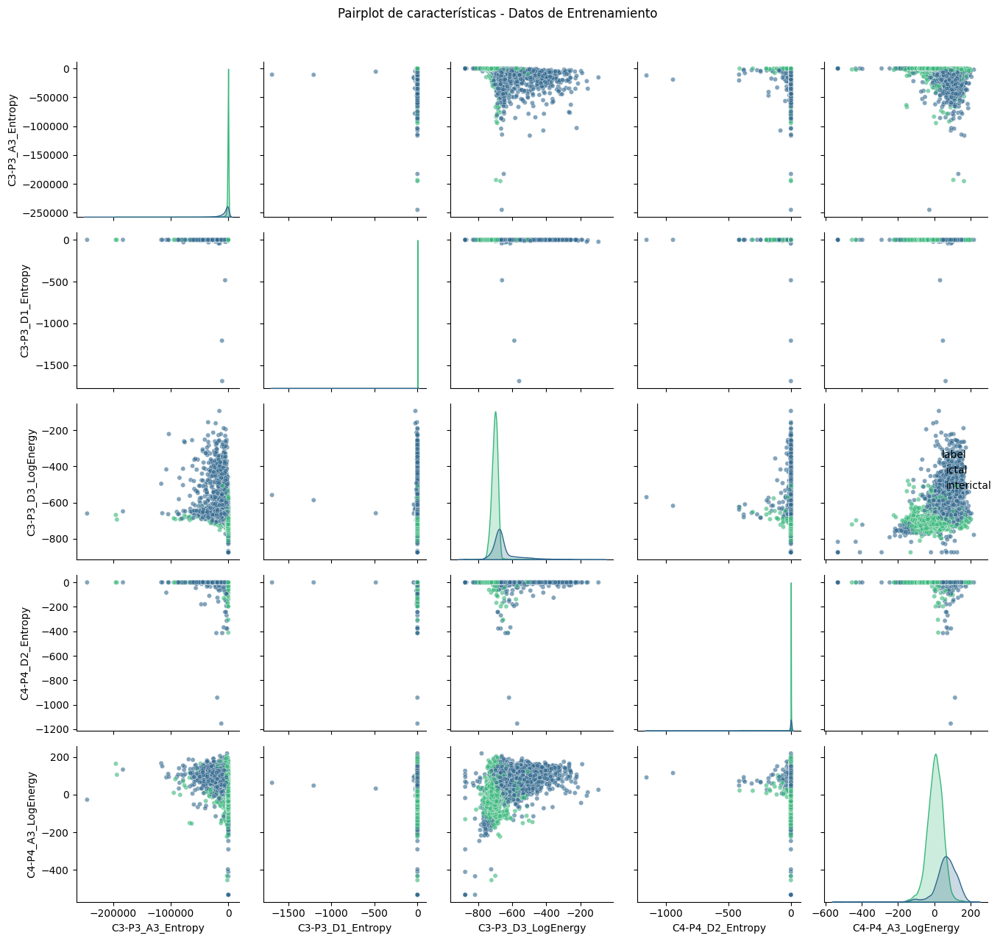


Generando pairplot para datos de prueba...


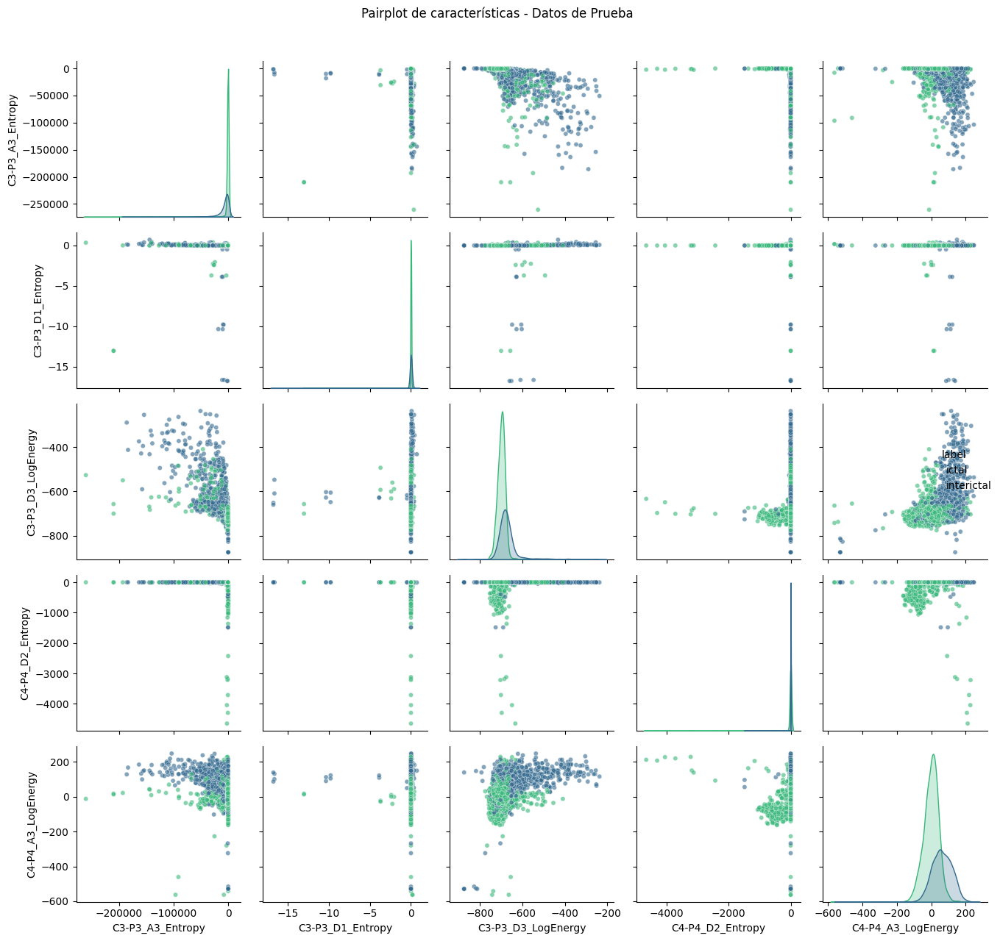

In [ ]:
# Cargar los datos
print("Cargando datos...")
train = pd.read_csv('/content/drive/MyDrive/EEG_For_Epileptic_Seizure_Recognition/features_top_sfbs.csv')
test = pd.read_csv('/content/drive/MyDrive/EEG_For_Epileptic_Seizure_Recognition/features_top_sfbs_test.csv')


# Seleccionar las primeras 5 características después de las columnas de identificación
# Asumiendo que las columnas son: [id, subject, label, feature1, feature2, ...]
features = train.columns[3:8].tolist()  # Convertir a lista explícita

print("\nCaracterísticas seleccionadas:", features)

# Pairplot para datos de entrenamiento
print("\nGenerando pairplot para datos de entrenamiento...")
sns.pairplot(
    train[features + ['label']], hue='label',
    palette='viridis',
    plot_kws={'alpha': 0.6, 's': 20},
    diag_kind='kde'
)
plt.suptitle('Pairplot de características - Datos de Entrenamiento', y=1.02)
plt.tight_layout()
plt.show()

# Pairplot para datos de prueba
print("\nGenerando pairplot para datos de prueba...")
sns.pairplot(
    test[features + ['label']], hue='label',
    palette='viridis',
    plot_kws={'alpha': 0.6, 's': 20},
    diag_kind='kde'
)
plt.suptitle('Pairplot de características - Datos de Prueba', y=1.02)
plt.tight_layout()
plt.show()



#### Random Forest

##### Mejor modelo


No se aplica escalado (scalingOption = 0)

=== Rendimiento en Entrenamiento ===
              precision    recall  f1-score   support

       ictal       0.88      0.81      0.84     13200
  interictal       0.82      0.89      0.86     13200

    accuracy                           0.85     26400
   macro avg       0.85      0.85      0.85     26400
weighted avg       0.85      0.85      0.85     26400

Exactitud (Accuracy): 0.8517

=== Rendimiento en Prueba ===
              precision    recall  f1-score   support

       ictal       0.76      0.69      0.72      3822
  interictal       0.84      0.89      0.86      7200

    accuracy                           0.82     11022
   macro avg       0.80      0.79      0.79     11022
weighted avg       0.81      0.82      0.81     11022

Exactitud (Accuracy): 0.8167


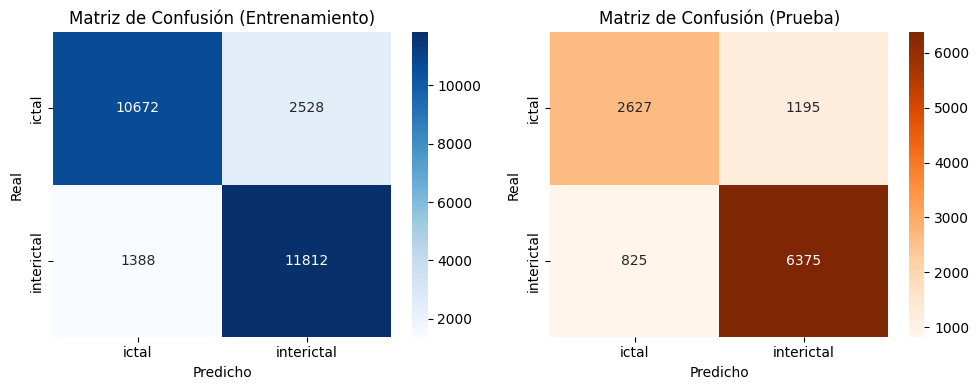


Modelo guardado en: /content/drive/MyDrive/EEG_For_Epileptic_Seizure_Recognition/randomForest_model_beforePCA_balanced.pkl


In [ ]:
# 1. Librerías
import pandas as pd
import numpy as np
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import classification_report, accuracy_score, confusion_matrix, f1_score
from sklearn.preprocessing import StandardScaler, MinMaxScaler
import matplotlib.pyplot as plt
import seaborn as sns
import joblib

# 2. Configuración de escalado
scalingOption = 0  # 0 = no escalar, 1 = StandardScaler, 2 = MinMaxScaler (-1 a 1)

# 3. Cargar los datos de entrenamiento y prueba
train_sfbs = pd.read_csv('/content/drive/MyDrive/EEG_For_Epileptic_Seizure_Recognition/features_top_sfbs_balanced.csv')
test_sfbs = pd.read_csv('/content/drive/MyDrive/EEG_For_Epileptic_Seizure_Recognition/features_top_sfbs_test_balanced.csv')

# 4. Separar características (X) y etiquetas (y)
# Para entrenamiento
X_train = train_sfbs.drop(columns=['sample_id', 'subject', 'label'])
y_train = train_sfbs['label']

# Para prueba
X_test = test_sfbs.drop(columns=['sample_id', 'subject', 'label'])
y_test = test_sfbs['label']

# 5. Aplicar escalado según la opción seleccionada
if scalingOption == 1:
    print("\nAplicando StandardScaler (media=0, varianza=1)")
    scaler = StandardScaler()
    X_train = scaler.fit_transform(X_train)
    X_test = scaler.transform(X_test)
elif scalingOption == 2:
    print("\nAplicando MinMaxScaler (rango [-1, 1])")
    scaler = MinMaxScaler(feature_range=(-1, 1))
    X_train = scaler.fit_transform(X_train)
    X_test = scaler.transform(X_test)
else:
    print("\nNo se aplica escalado (scalingOption = 0)")

# 6. Entrenar el modelo (usando RandomForest como ejemplo)
model = RandomForestClassifier(
    n_estimators=100,   # Número de árboles
    random_state=42,    # Semilla para reproducibilidad
    max_depth=5,
    min_samples_split=2,
    max_features='log2',
    class_weight='balanced'  # Manejo de clases desbalanceadas (opcional)
)
model.fit(X_train, y_train)

# 7. Evaluar el modelo
# --- Predicciones ---
y_train_pred = model.predict(X_train)
y_test_pred = model.predict(X_test)

# --- Métricas ---
print("\n=== Rendimiento en Entrenamiento ===")
print(classification_report(y_train, y_train_pred))
print(f"Exactitud (Accuracy): {accuracy_score(y_train, y_train_pred):.4f}")

print("\n=== Rendimiento en Prueba ===")
print(classification_report(y_test, y_test_pred))
print(f"Exactitud (Accuracy): {accuracy_score(y_test, y_test_pred):.4f}")

# --- Matriz de Confusión ---
plt.figure(figsize=(10, 4))

plt.subplot(1, 2, 1)
sns.heatmap(confusion_matrix(y_train, y_train_pred),
            annot=True, fmt='d', cmap='Blues',
            xticklabels=model.classes_, yticklabels=model.classes_)
plt.title('Matriz de Confusión (Entrenamiento)')
plt.xlabel('Predicho')
plt.ylabel('Real')

plt.subplot(1, 2, 2)
sns.heatmap(confusion_matrix(y_test, y_test_pred),
            annot=True, fmt='d', cmap='Oranges',
            xticklabels=model.classes_, yticklabels=model.classes_)
plt.title('Matriz de Confusión (Prueba)')
plt.xlabel('Predicho')
plt.ylabel('Real')

plt.tight_layout()
plt.show()

# 8. Guardar el modelo y scaler (si se usó)
model_path = '/content/drive/MyDrive/EEG_For_Epileptic_Seizure_Recognition/randomForest_model_beforePCA_balanced.pkl'
joblib.dump(model, model_path)
print(f"\nModelo guardado en: {model_path}")

if scalingOption in [1, 2]:
    scaler_path = '/content/drive/MyDrive/EEG_For_Epileptic_Seizure_Recognition/scaler_beforePCA_balanced.pkl'
    joblib.dump(scaler, scaler_path)
    print(f"Scaler guardado en: {scaler_path}")

##### Búsqueda de hiperparámetros

In [ ]:
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import make_scorer
from sklearn.metrics import recall_score

# 1. Definir un scorer personalizado para recall de la clase 'ictal'
def ictal_recall_score(y_true, y_pred):
    # Asume que la clase 'ictal' está codificada como 1 (verifica con le.classes_)
    return recall_score(y_true, y_pred, labels=[1], average='micro')  # Ajusta el label según tu encoding

scorer = make_scorer(ictal_recall_score, greater_is_better=True)

# 2. Param grid (ajusta según necesidades)
param_grid = {
    'n_estimators': [100],
    'max_depth': [5,10],
    'min_samples_split': [10],
    'max_features': ['sqrt', 'log2'],
    'class_weight': ['balanced']  # Peso adicional a la clase ictal
}

# 3. GridSearchCV con el scorer personalizado
grid_search = GridSearchCV(
    RandomForestClassifier(random_state=42),
    param_grid,
    cv=5,
    scoring=scorer,  # Usa el scorer personalizado
    n_jobs=-1,
    verbose=2
)

grid_search.fit(X_train, y_train)

# 4. Resultados
print("\nMejores parámetros para recall de clase ictal:", grid_search.best_params_)
best_model = grid_search.best_estimator_

# 5. Evaluar en prueba
y_test_pred = best_model.predict(X_test)
print("\n=== Rendimiento en Prueba (Modelo Optimizado) ===")
print(classification_report(y_test, y_test_pred, target_names=le.classes_))

#### SVM

##### Mejor modelo

Cargando y preparando datos...

No se aplica escalado (scalingOption = 0)

Distribución de clases:
Entrenamiento: {'ictal': np.int64(13200), 'interictal': np.int64(13200)}
Prueba: {'ictal': np.int64(3822), 'interictal': np.int64(7200)}

Entrenando modelo SVM optimizado...

Evaluando SVM en datos de entrenamiento...

Evaluación SVM en datos de Entrenamiento:
              precision    recall  f1-score   support

       ictal       0.88      0.78      0.83     13200
  interictal       0.80      0.89      0.85     13200

    accuracy                           0.84     26400
   macro avg       0.84      0.84      0.84     26400
weighted avg       0.84      0.84      0.84     26400



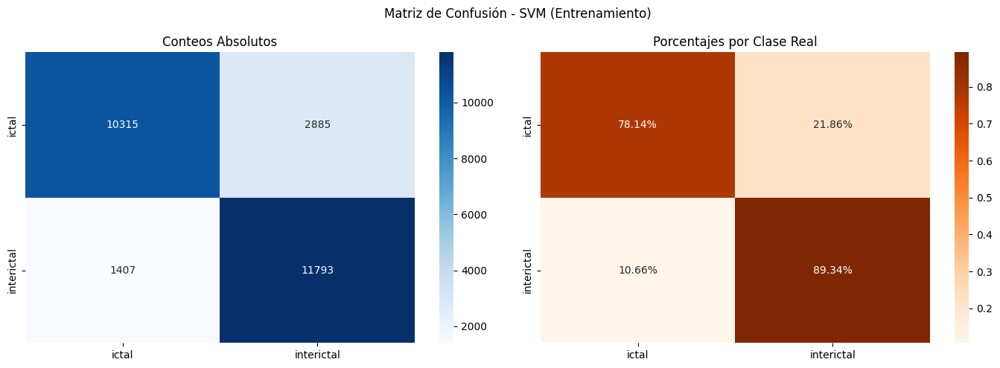


Evaluando SVM en datos de prueba...

Evaluación SVM en datos de Prueba:
              precision    recall  f1-score   support

       ictal       0.76      0.65      0.70      3822
  interictal       0.83      0.89      0.86      7200

    accuracy                           0.81     11022
   macro avg       0.79      0.77      0.78     11022
weighted avg       0.81      0.81      0.80     11022



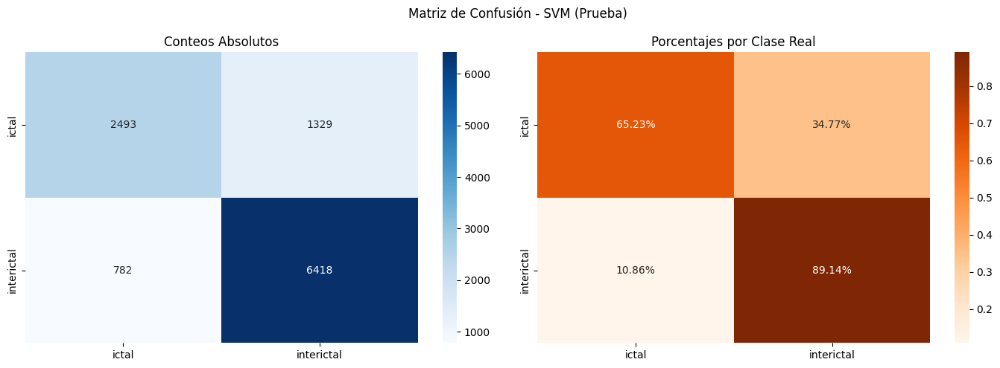


Modelo SVM guardado exitosamente.


In [ ]:
# 1. Configuración
RANDOM_STATE = 42  # Usamos el nombre estándar de scikit-learn
SAMPLE_SIZE = 10000
scalingOption = 0  # 0 = no escalar, 1 = StandardScaler, 2 = MinMaxScaler (-1 a 1)

# 2. Carga y preprocesamiento de datos
print("Cargando y preparando datos...")
train = pd.read_csv('/content/drive/MyDrive/EEG_For_Epileptic_Seizure_Recognition/componentes_pca_balanced.csv')
test = pd.read_csv('/content/drive/MyDrive/EEG_For_Epileptic_Seizure_Recognition/componentes_pca_test_balanced.csv')

le = LabelEncoder()
y_train = le.fit_transform(train['label'])
y_test = le.transform(test['label'])
X_train = train.drop(columns=['sample_id', 'subject', 'label']).values.astype('float32')
X_test = test.drop(columns=['sample_id', 'subject', 'label']).values.astype('float32')

# --- Escalado de características ---
if scalingOption == 1:
    print("\nAplicando StandardScaler (media=0, varianza=1)")
    scaler = StandardScaler()
    X_train = scaler.fit_transform(X_train)
    X_test = scaler.transform(X_test)
elif scalingOption == 2:
    print("\nAplicando MinMaxScaler (rango [-1, 1])")
    scaler = MinMaxScaler(feature_range=(-1, 1))
    X_train = scaler.fit_transform(X_train)
    X_test = scaler.transform(X_test)
else:
    print("\nNo se aplica escalado (scalingOption = 0)")

# 3. Verificación de balanceo de clases
print("\nDistribución de clases:")
print("Entrenamiento:", {k: v for k, v in zip(le.classes_, np.bincount(y_train))})
print("Prueba:", {k: v for k, v in zip(le.classes_, np.bincount(y_test))})

# 4. Modelo SVM mejorado
print("\nEntrenando modelo SVM optimizado...")
svm_params = {
    'C': 1,
    'gamma': 'scale',
    'kernel': 'rbf',
    'class_weight': 'balanced',
    'random_state': RANDOM_STATE,  # Parámetro específico de sklearn
    'probability': True  # Útil para obtener probabilidades si es necesario
}

svm_model = SVC(**svm_params)
svm_model.fit(X_train, y_train)

# 5. Evaluación mejorada
def detailed_evaluation(model, X, y, model_name="", data_type="Prueba"):
    y_pred = model.predict(X)

    print(f"\nEvaluación {model_name} en datos de {data_type}:")
    print(classification_report(y, y_pred, target_names=le.classes_, zero_division=0))

    cm = confusion_matrix(y, y_pred)
    cm_percent = cm / cm.sum(axis=1)[:, np.newaxis]

    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 5))

    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', ax=ax1,
                xticklabels=le.classes_, yticklabels=le.classes_)
    ax1.set_title('Conteos Absolutos')

    sns.heatmap(cm_percent, annot=True, fmt='.2%', cmap='Oranges', ax=ax2,
                xticklabels=le.classes_, yticklabels=le.classes_)
    ax2.set_title('Porcentajes por Clase Real')

    plt.suptitle(f'Matriz de Confusión - {model_name} ({data_type})')
    plt.tight_layout()
    plt.show()

print("\nEvaluando SVM en datos de entrenamiento...")
detailed_evaluation(svm_model, X_train, y_train, "SVM", "Entrenamiento")

print("\nEvaluando SVM en datos de prueba...")
detailed_evaluation(svm_model, X_test, y_test, "SVM", "Prueba")

# 6. Estrategia alternativa si SVM falla
if len(np.unique(svm_model.predict(X_test))) == 1:
    print("\n¡Advertencia! SVM solo predice una clase. Probando Regresión Logística...")

    lr_params = {
        'penalty': 'l2',
        'solver': 'lbfgs',  # Cambiado a solver estándar de sklearn
        'class_weight': 'balanced',
        'random_state': RANDOM_STATE,
        'max_iter': 1000  # Aumentamos las iteraciones para convergencia
    }

    lr_model = LogisticRegression(**lr_params)
    lr_model.fit(X_train, y_train)

    detailed_evaluation(lr_model, X_test, y_test, "Regresión Logística")

    # Guardar modelo alternativo
    joblib.dump(lr_model, '/content/drive/MyDrive/EEG_For_Epileptic_Seizure_Recognition/lr_model_sfbs_balanced.pkl')
    print("Modelo de Regresión Logística guardado.")
else:
    # Guardar modelo SVM
    joblib.dump(svm_model, '/content/drive/MyDrive/EEG_For_Epileptic_Seizure_Recognition/svm_model_sfbs_balanced.pkl')
    print("\nModelo SVM guardado exitosamente.")

# Guardar el scaler si se usó
if scalingOption in [1, 2]:
    scaler_path = '/content/drive/MyDrive/EEG_For_Epileptic_Seizure_Recognition/scaler_sfbs_balanced.pkl'
    joblib.dump(scaler, scaler_path)
    print(f"Scaler guardado en: {scaler_path}")

##### Búsqueda de hiperparámetros

In [ ]:
from sklearn.model_selection import GridSearchCV
from sklearn.svm import SVC
from sklearn.metrics import make_scorer, recall_score

# 1. Definir scorer personalizado para recall de la clase ictal
def ictal_recall_score(y_true, y_pred):
    # Asume que 'ictal' está codificado como 1 (verifica con np.unique(y_train))
    return recall_score(y_true, y_pred, pos_label=1)

scorer = make_scorer(ictal_recall_score, greater_is_better=True)

# 2. Param grid para SVM
param_grid = {
    'C': [0.1, 1, 10],            # Controla overfitting (valores bajos = más regularización)
    'gamma': ['scale', 0.01, 0.1], # Afecta el alcance del kernel RBF
    'kernel': ['rbf', 'poly'],    # 'rbf' suele funcionar mejor para problemas no lineales
    'class_weight': ['balanced']  # Prioriza la clase ictal
}

# 3. Configurar GridSearchCV
grid = GridSearchCV(
    SVC(probability=True, random_state=42),
    param_grid,
    cv=5,
    scoring=scorer,  # Usamos el scorer personalizado
    n_jobs=-1,
    verbose=2
)

# 4. Entrenar
grid.fit(X_train, y_train)

# 5. Resultados
print("\nMejores parámetros para recall de 'ictal':", grid.best_params_)
print("Mejor recall de 'ictal' (validación cruzada):", grid.best_score_)

# 6. Evaluar en prueba
best_svm = grid.best_estimator_
y_test_pred = best_svm.predict(X_test)

print("\n=== Reporte en Prueba ===")
print(classification_report(y_test, y_test_pred, target_names=['interictal', 'ictal']))

Fitting 5 folds for each of 18 candidates, totalling 90 fits


#### RNA (Backpropagation)

##### Búsqueda de hiperparámetros

###### Sin modificación de configuración de capas ocultas

In [ ]:
import pandas as pd
import tensorflow as tf
import numpy as np
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import classification_report, accuracy_score

# 1. Cargar los datos
train_df = pd.read_csv("/content/drive/MyDrive/EEG_For_Epileptic_Seizure_Recognition/componentes_pca_balanced.csv")
test_df = pd.read_csv("/content/drive/MyDrive/EEG_For_Epileptic_Seizure_Recognition/componentes_pca_test_balanced.csv")

# 2. Eliminar columnas de texto no útiles
train_df = train_df.drop(columns=['sample_id', 'subject'])
test_df = test_df.drop(columns=['sample_id', 'subject'])

# 3. Convertir 'label' a entero
train_df['label'] = train_df['label'].map({'interictal': 0, 'ictal': 1})
test_df['label'] = test_df['label'].map({'interictal': 0, 'ictal': 1})

# 4. Separar características y etiquetas
X_train = train_df.drop("label", axis=1)
y_train = train_df["label"]
X_test = test_df.drop("label", axis=1)
y_test = test_df["label"]

# 5. Escalar características
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

# 6. Definir combinaciones de hiperparámetros a probar
ocultas = [8, 16, 32]
tasas_aprendizaje = [0.01, 0.001]

# 7. Lista para guardar resultados
resultados = []

# 8. Búsqueda manual con métricas completas
for h in ocultas:
    for lr in tasas_aprendizaje:
        print(f"\n🔧 Probando estructura: {h} neuronas ocultas, lr={lr}")

        # Crear y compilar el modelo
        model = tf.keras.models.Sequential([
            tf.keras.layers.Dense(h, activation='relu', input_shape=(X_train.shape[1],)),
            tf.keras.layers.Dense(1, activation='sigmoid')
        ])

        optimizer = tf.keras.optimizers.Adam(learning_rate=lr)
        model.compile(optimizer=optimizer, loss='binary_crossentropy', metrics=['accuracy'])

        # Entrenamiento
        model.fit(X_train, y_train, epochs=50, batch_size=16, validation_split=0.2, verbose=0)

        # Predicción y métricas
        y_pred = (model.predict(X_test) > 0.5).astype("int32")
        acc = accuracy_score(y_test, y_pred)
        report = classification_report(y_test, y_pred, target_names=["interictal", "ictal"], output_dict=True)

        resultados.append({
            'neuronas_ocultas': h,
            'learning_rate': lr,
            'accuracy': acc,
            'interictal_precision': report['interictal']['precision'],
            'interictal_recall': report['interictal']['recall'],
            'interictal_f1': report['interictal']['f1-score'],
            'ictal_precision': report['ictal']['precision'],
            'ictal_recall': report['ictal']['recall'],
            'ictal_f1': report['ictal']['f1-score'],
            'f1_promedio': (report['interictal']['f1-score'] + report['ictal']['f1-score']) / 2
        })

# 9. Convertir a DataFrame y mostrar ordenado
df_resultados = pd.DataFrame(resultados)
df_resultados = df_resultados.sort_values(by='f1_promedio', ascending=False).reset_index(drop=True)

print("\n📊 Tabla de métricas ordenada por F1-score promedio:\n")
print(df_resultados)



🔧 Probando estructura: 8 neuronas ocultas, lr=0.01


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


345/345 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step

🔧 Probando estructura: 8 neuronas ocultas, lr=0.001


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


345/345 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step

🔧 Probando estructura: 16 neuronas ocultas, lr=0.01


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


345/345 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step

🔧 Probando estructura: 16 neuronas ocultas, lr=0.001


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


345/345 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step

🔧 Probando estructura: 32 neuronas ocultas, lr=0.01


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


345/345 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step

🔧 Probando estructura: 32 neuronas ocultas, lr=0.001


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


345/345 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step

📊 Tabla de métricas ordenada por F1-score promedio:

   neuronas_ocultas  learning_rate  accuracy  interictal_precision  \
0                32          0.001  0.814734              0.822536   
1                16          0.010  0.807204              0.821814   
2                32          0.010  0.812920              0.810641   
3                 8          0.010  0.808383              0.818239   
4                16          0.001  0.806750              0.817988   
5                 8          0.001  0.810198              0.811691   

   interictal_recall  interictal_f1  ictal_precision  ictal_recall  ictal_f1  \
0           0.913472       0.865623         0.794118      0.628728  0.701811   
1           0.900000       0.859132         0.770481      0.632391  0.694640   
2           0.931111       0.866710         0.819767      0.590267  0.686340   
3           0.908472       0.860998         0.782365      0.619833  0.691679   
4           0.

###### Con modificación de configuración de capas ocultas

In [ ]:
import pandas as pd
import tensorflow as tf
import numpy as np
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import classification_report, accuracy_score

# 1. Cargar los datos
train_df = pd.read_csv("/content/drive/MyDrive/EEG_For_Epileptic_Seizure_Recognition/features_top_sfbs.csv")
test_df = pd.read_csv("/content/drive/MyDrive/EEG_For_Epileptic_Seizure_Recognition/features_top_sfbs_test.csv")

# 2. Eliminar columnas de texto no útiles
train_df = train_df.drop(columns=['sample_id', 'subject'])
test_df = test_df.drop(columns=['sample_id', 'subject'])

# 3. Convertir 'label' a entero
train_df['label'] = train_df['label'].map({'interictal': 0, 'ictal': 1})
test_df['label'] = test_df['label'].map({'interictal': 0, 'ictal': 1})

# 4. Separar características y etiquetas
X_train = train_df.drop("label", axis=1)
y_train = train_df["label"]
X_test = test_df.drop("label", axis=1)
y_test = test_df["label"]

# 5. Escalar características
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

# 6. Definir combinaciones de hiperparámetros a probar
neuronas_base = [8, 16, 32]  # Neuronas en la primera capa oculta
tasas_aprendizaje = [0.01, 0.001]
num_capas = [1, 2, 3]  # Probaremos con 1, 2 o 3 capas ocultas

# 7. Lista para guardar resultados
resultados = []

# 8. Búsqueda manual con métricas completas
for base in neuronas_base:
    for lr in tasas_aprendizaje:
        for n_capas in num_capas:
            # Verificar si la configuración es válida (la última capa debe tener al menos 2 neuronas antes de la salida)
            if n_capas == 3 and base < 8:  # Para 3 capas necesitamos al menos 8 neuronas iniciales (8 -> 4 -> 2)
                continue
            if n_capas == 2 and base < 4:  # Para 2 capas necesitamos al menos 4 neuronas iniciales (4 -> 2)
                continue

            print(f"\n🔧 Probando estructura: {n_capas} capas ocultas (base={base}), lr={lr}")

            # Crear modelo
            model = tf.keras.models.Sequential()
            model.add(tf.keras.layers.Dense(base, activation='relu', input_shape=(X_train.shape[1],)))

            # Añadir capas adicionales según configuración
            if n_capas >= 2:
                neuronas_capa2 = max(2, base // 2)  # La mitad pero mínimo 2 neuronas
                model.add(tf.keras.layers.Dense(neuronas_capa2, activation='relu'))

                if n_capas == 3:
                    neuronas_capa3 = max(2, neuronas_capa2 // 2)  # La mitad de la anterior pero mínimo 2
                    model.add(tf.keras.layers.Dense(neuronas_capa3, activation='relu'))

            # Capa de salida
            model.add(tf.keras.layers.Dense(1, activation='sigmoid'))

            # Compilar el modelo
            optimizer = tf.keras.optimizers.Adam(learning_rate=lr)
            model.compile(optimizer=optimizer, loss='binary_crossentropy', metrics=['accuracy'])

            # Entrenamiento
            model.fit(X_train, y_train, epochs=50, batch_size=16, validation_split=0.2, verbose=0)

            # Predicción y métricas
            y_pred = (model.predict(X_test) > 0.5).astype("int32")
            acc = accuracy_score(y_test, y_pred)
            report = classification_report(y_test, y_pred, target_names=["interictal", "ictal"], output_dict=True)

            # Guardar configuración de capas
            config_capas = [base]
            if n_capas >= 2:
                config_capas.append(max(2, base // 2))
                if n_capas == 3:
                    config_capas.append(max(2, (base // 2) // 2))

            resultados.append({
                'num_capas': n_capas,
                'config_capas': config_capas,
                'learning_rate': lr,
                'accuracy': acc,
                'interictal_precision': report['interictal']['precision'],
                'interictal_recall': report['interictal']['recall'],
                'interictal_f1': report['interictal']['f1-score'],
                'ictal_precision': report['ictal']['precision'],
                'ictal_recall': report['ictal']['recall'],
                'ictal_f1': report['ictal']['f1-score'],
                'f1_promedio': (report['interictal']['f1-score'] + report['ictal']['f1-score']) / 2
            })

# 9. Convertir a DataFrame y mostrar ordenado
df_resultados = pd.DataFrame(resultados)
df_resultados = df_resultados.sort_values(by='f1_promedio', ascending=False).reset_index(drop=True)

print("\n📊 Tabla de métricas ordenada por F1-score promedio:\n")
print(df_resultados)


🔧 Probando estructura: 1 capas ocultas (base=8), lr=0.01


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


345/345 ━━━━━━━━━━━━━━━━━━━━ 0s 825us/step

🔧 Probando estructura: 2 capas ocultas (base=8), lr=0.01


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


345/345 ━━━━━━━━━━━━━━━━━━━━ 0s 810us/step

🔧 Probando estructura: 3 capas ocultas (base=8), lr=0.01


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


345/345 ━━━━━━━━━━━━━━━━━━━━ 0s 860us/step

🔧 Probando estructura: 1 capas ocultas (base=8), lr=0.001


/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/keras/src

345/345 ━━━━━━━━━━━━━━━━━━━━ 0s 779us/step

🔧 Probando estructura: 2 capas ocultas (base=8), lr=0.001


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


345/345 ━━━━━━━━━━━━━━━━━━━━ 0s 792us/step

🔧 Probando estructura: 3 capas ocultas (base=8), lr=0.001


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


345/345 ━━━━━━━━━━━━━━━━━━━━ 0s 863us/step

🔧 Probando estructura: 1 capas ocultas (base=16), lr=0.01


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


345/345 ━━━━━━━━━━━━━━━━━━━━ 0s 758us/step

🔧 Probando estructura: 2 capas ocultas (base=16), lr=0.01


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


345/345 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step

🔧 Probando estructura: 3 capas ocultas (base=16), lr=0.01


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


345/345 ━━━━━━━━━━━━━━━━━━━━ 0s 853us/step

🔧 Probando estructura: 1 capas ocultas (base=16), lr=0.001


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


345/345 ━━━━━━━━━━━━━━━━━━━━ 0s 733us/step

🔧 Probando estructura: 2 capas ocultas (base=16), lr=0.001


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


345/345 ━━━━━━━━━━━━━━━━━━━━ 0s 817us/step

🔧 Probando estructura: 3 capas ocultas (base=16), lr=0.001


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


345/345 ━━━━━━━━━━━━━━━━━━━━ 0s 833us/step

🔧 Probando estructura: 1 capas ocultas (base=32), lr=0.01


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


345/345 ━━━━━━━━━━━━━━━━━━━━ 0s 802us/step

🔧 Probando estructura: 2 capas ocultas (base=32), lr=0.01


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


345/345 ━━━━━━━━━━━━━━━━━━━━ 0s 816us/step

🔧 Probando estructura: 3 capas ocultas (base=32), lr=0.01


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


345/345 ━━━━━━━━━━━━━━━━━━━━ 0s 855us/step

🔧 Probando estructura: 1 capas ocultas (base=32), lr=0.001


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


345/345 ━━━━━━━━━━━━━━━━━━━━ 0s 774us/step

🔧 Probando estructura: 2 capas ocultas (base=32), lr=0.001


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


345/345 ━━━━━━━━━━━━━━━━━━━━ 0s 847us/step

🔧 Probando estructura: 3 capas ocultas (base=32), lr=0.001


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


345/345 ━━━━━━━━━━━━━━━━━━━━ 0s 850us/step

📊 Tabla de métricas ordenada por F1-score promedio:

    num_capas config_capas  learning_rate  accuracy  interictal_precision  \
0           1          [8]          0.001  0.813918              0.796978   
1           3    [8, 4, 2]          0.001  0.811105              0.792859   
2           1         [32]          0.010  0.789875              0.807015   
3           2      [16, 8]          0.001  0.792597              0.800514   
4           2       [8, 4]          0.001  0.787879              0.797406   
5           1          [8]          0.010  0.788423              0.796540   
6           2      [16, 8]          0.010  0.787334              0.795953   
7           1         [16]          0.001  0.787425              0.795043   
8           3  [32, 16, 8]          0.001  0.782072              0.802065   
9           2     [32, 16]          0.001  0.787516              0.792228   
10          3   [16, 8, 4]          0.010  0.785792     

##### Mejor modelo

###### Sin modificación de configuración de capas ocultas

In [ ]:
mejor = df_resultados.iloc[0]

print("Mejor configuración encontrada:")
print(f"- Neuronas ocultas: {mejor['neuronas_ocultas']}")
print(f"- Learning rate: {mejor['learning_rate']}")
print(f"- Accuracy: {mejor['accuracy']:.4f}")
print(" Métricas por clase:")
print(f"Interictal → Precisión: {mejor['interictal_precision']:.4f}, Recall: {mejor['interictal_recall']:.4f}, F1: {mejor['interictal_f1']:.4f}")
print(f"Ictal      → Precisión: {mejor['ictal_precision']:.4f}, Recall: {mejor['ictal_recall']:.4f}, F1: {mejor['ictal_f1']:.4f}")
print(f" F1-score promedio: {mejor['f1_promedio']:.4f}")


Mejor configuración encontrada:
- Neuronas ocultas: 32.0
- Learning rate: 0.001
- Accuracy: 0.8147
 Métricas por clase:
Interictal → Precisión: 0.8225, Recall: 0.9135, F1: 0.8656
Ictal      → Precisión: 0.7941, Recall: 0.6287, F1: 0.7018
 F1-score promedio: 0.7837


In [ ]:
mejor = df_resultados.iloc[0]
# 1. Reconstruir el mejor modelo
mejor_modelo = tf.keras.models.Sequential([
    tf.keras.layers.Dense(int(mejor['neuronas_ocultas']), activation='relu', input_shape=(X_train.shape[1],)),
    tf.keras.layers.Dense(1, activation='sigmoid')
])

optimizer = tf.keras.optimizers.Adam(learning_rate=mejor['learning_rate'])
mejor_modelo.compile(optimizer=optimizer, loss='binary_crossentropy', metrics=['accuracy'])
mejor_modelo.fit(X_train, y_train, epochs=50, batch_size=16, validation_split=0.2, verbose=0)

# 2. Predecir
y_pred = (mejor_modelo.predict(X_test) > 0.5).astype("int32")

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


345/345 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step


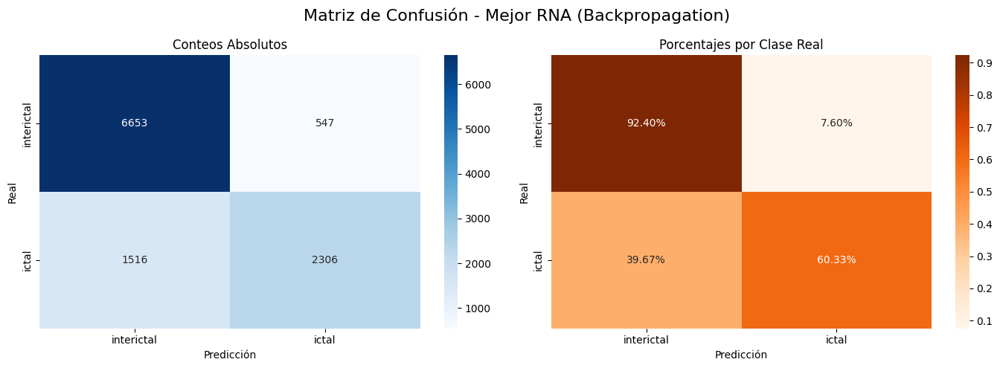

In [ ]:
from sklearn.metrics import confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

class_names = ['interictal', 'ictal']

# Matriz de confusión
cm = confusion_matrix(y_test, y_pred)
cm_percent = cm / cm.sum(axis=1, keepdims=True)

# Visualización
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 5))

sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', ax=ax1,
            xticklabels=class_names, yticklabels=class_names)
ax1.set_title('Conteos Absolutos')
ax1.set_xlabel('Predicción')
ax1.set_ylabel('Real')

sns.heatmap(cm_percent, annot=True, fmt='.2%', cmap='Oranges', ax=ax2,
            xticklabels=class_names, yticklabels=class_names)
ax2.set_title('Porcentajes por Clase Real')
ax2.set_xlabel('Predicción')
ax2.set_ylabel('Real')

plt.suptitle('Matriz de Confusión - Mejor RNA (Backpropagation)', fontsize=16)
plt.tight_layout()
plt.show()


###### Con modificación de configuración de capas ocultas

In [ ]:
mejor = df_resultados.iloc[0]

print("Mejor configuración encontrada:")
print(f"- Número de capas: {mejor['num_capas']}")
print(f"- Configuración de capas: {mejor['config_capas']}")
print(f"- Learning rate: {mejor['learning_rate']}")
print(f"- Accuracy (test): {mejor['accuracy']:.4f}")
print(" Métricas por clase (test):")
print(f"Interictal → Precisión: {mejor['interictal_precision']:.4f}, Recall: {mejor['interictal_recall']:.4f}, F1: {mejor['interictal_f1']:.4f}")
print(f"Ictal      → Precisión: {mejor['ictal_precision']:.4f}, Recall: {mejor['ictal_recall']:.4f}, F1: {mejor['ictal_f1']:.4f}")
print(f" F1-score promedio: {mejor['f1_promedio']:.4f}")

Mejor configuración encontrada:
- Número de capas: 1
- Configuración de capas: [8]
- Learning rate: 0.001
- Accuracy (test): 0.8139
 Métricas por clase (test):
Interictal → Precisión: 0.7970, Recall: 0.9596, F1: 0.8708
Ictal      → Precisión: 0.8763, Recall: 0.5395, F1: 0.6679
 F1-score promedio: 0.7693


In [ ]:
mejor = df_resultados.iloc[0]

# 1. Reconstruir el mejor modelo
mejor_modelo = tf.keras.models.Sequential()

# Añadir capas ocultas según la mejor configuración
for i, neuronas in enumerate(mejor['config_capas']):
    if i == 0:
        # Primera capa necesita input_shape
        mejor_modelo.add(tf.keras.layers.Dense(neuronas, activation='relu', input_shape=(X_train.shape[1],)))
    else:
        mejor_modelo.add(tf.keras.layers.Dense(neuronas, activation='relu'))

# Capa de salida
mejor_modelo.add(tf.keras.layers.Dense(1, activation='sigmoid'))

optimizer = tf.keras.optimizers.Adam(learning_rate=mejor['learning_rate'])
mejor_modelo.compile(optimizer=optimizer, loss='binary_crossentropy', metrics=['accuracy'])

# Entrenar el modelo (guardamos el historial para ver el accuracy de entrenamiento)
historia = mejor_modelo.fit(X_train, y_train, epochs=50, batch_size=16, validation_split=0.2, verbose=0)

# 2. Predecir en entrenamiento y prueba
y_pred_train = (mejor_modelo.predict(X_train) > 0.5).astype("int32")
y_pred_test = (mejor_modelo.predict(X_test) > 0.5).astype("int32")

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


575/575 ━━━━━━━━━━━━━━━━━━━━ 0s 776us/step
345/345 ━━━━━━━━━━━━━━━━━━━━ 0s 724us/step


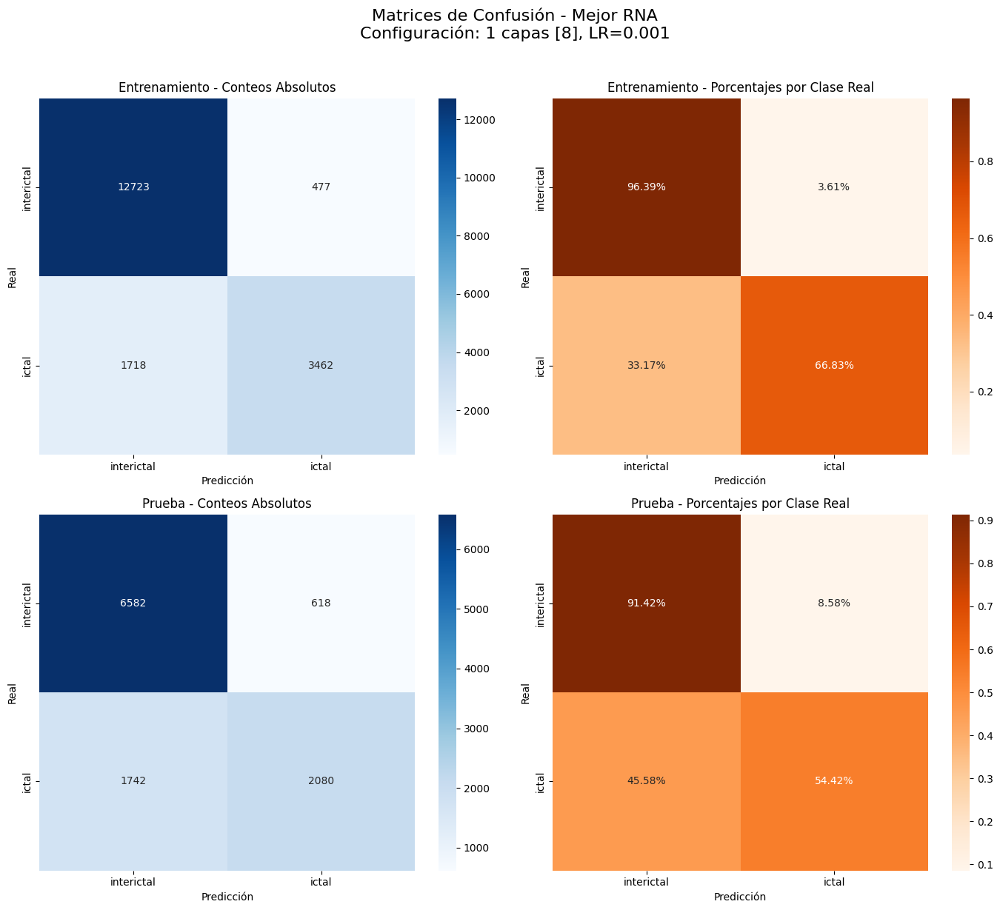


Accuracy de Entrenamiento: 0.8806
Accuracy de Prueba: 0.8139
Diferencia: 0.0667 (sobreajuste: SÍ)


In [ ]:
from sklearn.metrics import confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

class_names = ['interictal', 'ictal']

# Matrices de confusión
cm_train = confusion_matrix(y_train, y_pred_train)
cm_test = confusion_matrix(y_test, y_pred_test)

cm_train_percent = cm_train / cm_train.sum(axis=1, keepdims=True)
cm_test_percent = cm_test / cm_test.sum(axis=1, keepdims=True)

# Visualización - Matriz de entrenamiento
fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(14, 12))

# Entrenamiento - Conteos
sns.heatmap(cm_train, annot=True, fmt='d', cmap='Blues', ax=ax1,
            xticklabels=class_names, yticklabels=class_names)
ax1.set_title('Entrenamiento - Conteos Absolutos')
ax1.set_xlabel('Predicción')
ax1.set_ylabel('Real')

# Entrenamiento - Porcentajes
sns.heatmap(cm_train_percent, annot=True, fmt='.2%', cmap='Oranges', ax=ax2,
            xticklabels=class_names, yticklabels=class_names)
ax2.set_title('Entrenamiento - Porcentajes por Clase Real')
ax2.set_xlabel('Predicción')
ax2.set_ylabel('Real')

# Prueba - Conteos
sns.heatmap(cm_test, annot=True, fmt='d', cmap='Blues', ax=ax3,
            xticklabels=class_names, yticklabels=class_names)
ax3.set_title('Prueba - Conteos Absolutos')
ax3.set_xlabel('Predicción')
ax3.set_ylabel('Real')

# Prueba - Porcentajes
sns.heatmap(cm_test_percent, annot=True, fmt='.2%', cmap='Oranges', ax=ax4,
            xticklabels=class_names, yticklabels=class_names)
ax4.set_title('Prueba - Porcentajes por Clase Real')
ax4.set_xlabel('Predicción')
ax4.set_ylabel('Real')

plt.suptitle(f'Matrices de Confusión - Mejor RNA\nConfiguración: {mejor["num_capas"]} capas {mejor["config_capas"]}, LR={mejor["learning_rate"]}',
             fontsize=16, y=1.02)
plt.tight_layout()
plt.show()

# Mostrar accuracy de entrenamiento y prueba
train_acc = accuracy_score(y_train, y_pred_train)
test_acc = mejor['accuracy']
print(f"\nAccuracy de Entrenamiento: {train_acc:.4f}")
print(f"Accuracy de Prueba: {test_acc:.4f}")
print(f"Diferencia: {abs(train_acc - test_acc):.4f} (sobreajuste: {'SÍ' if train_acc > test_acc + 0.05 else 'no'})")

## Resumen de modelos

### Diagrama de experimentos

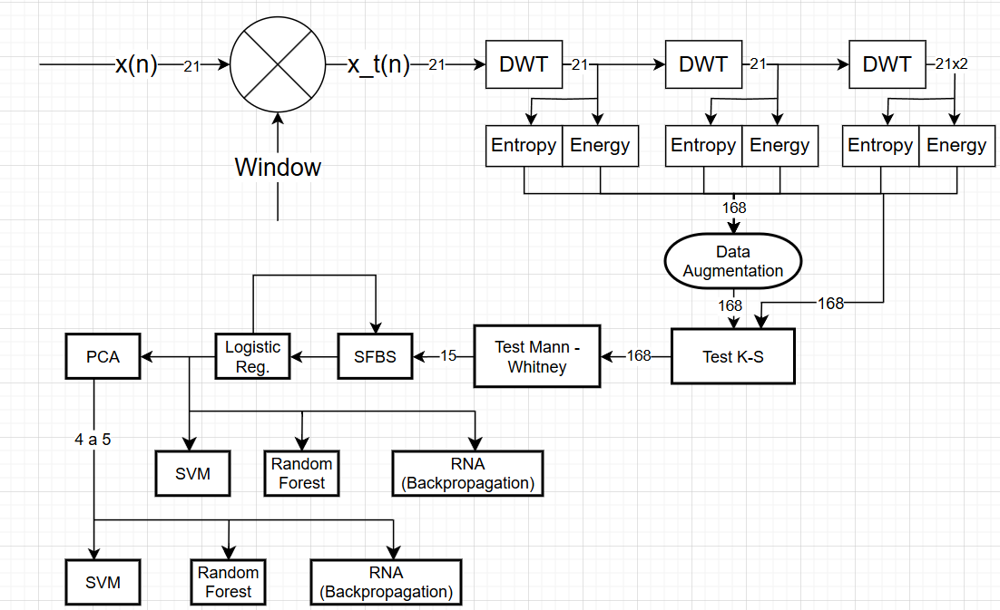

Se implementaron como modelos principales de implementación, basándose en investigaciones previas y resultados mostrados en varias iteraciones, que los modelos de mejor desempeño en las métricas evaluadas corresponden a: SVM, Random Forest y Redes neuronales Artificiales con algoritmo de Backpropagation. Además de esto, dada la recomendación de proyectos anteriores sobre el uso de técnicas de Data Augmentation, se optó por la comparación del rendimiento de los desempeños mostrados por los modelos seleccionados cuando el uso de la técnica SMOTE (Synthetic Minority Over-sampling Technique) para evaluar realmente la utilidad de este tipo de técnicas en la mejora de detección de eventos epilépticos en pacientes de 3 a 12 años.
Dada la reducción del desempeño evidenciada después de la aplicación de PCA como técnica de extracción de características, se decidió también realizar una comparación de los modelos elegidos cuando se usan características resultantes del uso de PCA y cuando simplemente se utiliza el conjunto de características resultante del uso de SFBS para la selección de características, previo a la ejecución de cada modelo de Machine Learning.

Cabe destacar que se hizo una fase de búsqueda de hiperparámetros donde se incluía la implementación de un GridSearchCV para cada modelo, siguiendo este procedimiento:

Se llevó a cabo una primera fase de uso de GridSearchCV enfocada en la búsqueda de la combinación de valores de hiperparámetros con mejor desempeño a nivel de Accuracy del modelo, posteriormente se ejecutó una segunda fase en la que se priorizaba mejorar la métrica de desempeño de Recall para la clase Ictal. Finalmente, se probaron hiperparámetros de forma manual que no habían sido considerados al momento de ejecución del GridSearchCV donde se revisara tanto el Accuracy del modelo como el recall resultante de la clase Ictal.

En el caso del modelo de SVM, se centró en la búsqueda de la combinación de C, gamma, peso de clases y tipo de kernel utilizado con mejores Accuracy y Recall (Clase Ictal). En el caso del modelo de Random Forest, se centró en la búsqueda de la combinación de números de árboles, profundidad máxima, máximo de características, división de muestras mínima y peso de clases con mejores Accuracy y Recall (Clase Ictal). En el caso del modelo de RNA (Backpropagation), se centró en la búsqueda de la combinación de número de neuronas ocultas, tasa de aprendizaje y número de capas ocultas con mejores Accuracy y Recall (Clase Ictal).


### Estrategia de split de datos

Después de evidenciar buenos resultados en los desempeños de los modelos dado un split de datos por interpolación (70% entrenamiento - 30% prueba) con todas las muestras disponibles y el uso de datos sintéticos (mostrado en el siguiente apartado), se procedió a probar los mismos modelos con y sin datos sintéticos y un split de datos por interpolación (70% entrenamiento - 30% prueba aproximadamente) en el cual se tuviera en consideración que las muestras de un mismo paciente sólo sean usadas en uno de los conjuntos de datos (solamente entrenamiento o solamente prueba), con el objetivo de identificar el desempeño de estos modelos para detectar eventos epilépticos en pacientes no caracterizados desde la fase de entrenamiento del modelo de Machine Learning.

### Medidas de desempeño

Para evaluar el desempeño de los clasificadores utilizados, se consideraron dos métricas clave:

- Accuracy (Exactitud del modelo):
Esta métrica indica la proporción total de predicciones correctas sobre el total de predicciones realizadas. Se utiliza como una métrica global para evaluar el rendimiento general del sistema, ya que combina tanto las predicciones correctas de periodos ictales como interictales. Es útil para comparar modelos en términos generales y establecer una línea base de rendimiento.

- Recall para la clase ictal (Sensibilidad para la detección de crisis epilépticas):
Dado que el objetivo principal de este proyecto es detectar eficazmente los episodios epilépticos, es fundamental minimizar los falsos negativos (es decir, evitar que el sistema no detecte un episodio ictal real). El recall para la clase ictal mide cuántos de los episodios ictales reales fueron correctamente identificados por el modelo, y por tanto, es la métrica más relevante desde el punto de vista clínico. Una alta sensibilidad garantiza que se reduzca el riesgo de que el sistema pase por alto un episodio epiléptico, lo cual es crucial para la seguridad del paciente.

En resumen, mientras que el accuracy permite medir el desempeño general del sistema, el recall para la clase ictal refleja directamente la eficacia del sistema para detectar eventos clínicamente críticos, y por ello ambas métricas se complementan para evaluar la calidad del modelo de manera integral.



### Tabla de resultados

#### Tablas preliminares de resultados

Como se había mencionado antes, en un principio se hizo una prueba de cada modelo con una estrategia de split de datos por interpolación en la que el conjunto de muestras de un mismo paciente tiene la posibilidad de ser ubicado en el grupo de datos de entrenamiento o en el de prueba, a modo preliminar para detectar un comportamiento inicial de los datos. Sin embargo, el objetivo final del proyecto es identificar un modelo que sirva como herramienta útil en la detección de eventos epilépticos en pacientes de 3 a 12 años, idealmente diferentes a los ya usados para el entrenamiento del modelo, a través del análisis de señales EEG.

Teniendo en cuenta lo anterior, a continuación se muestran las tablas de resultados preliminares.

**Regresión Logística con PCA**

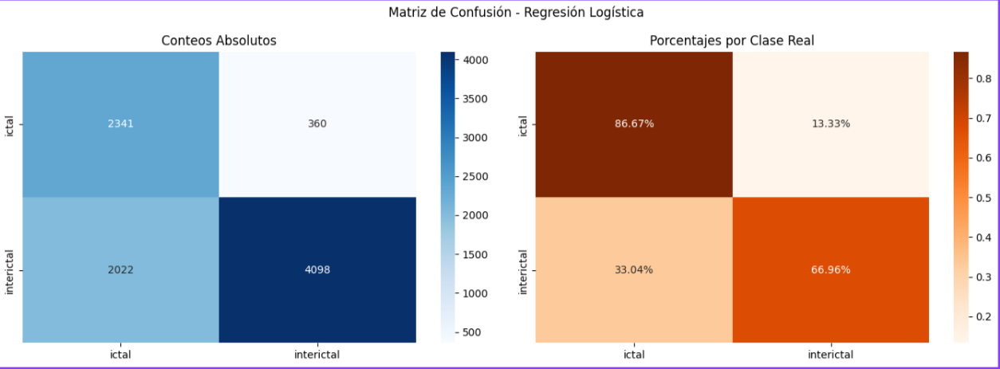

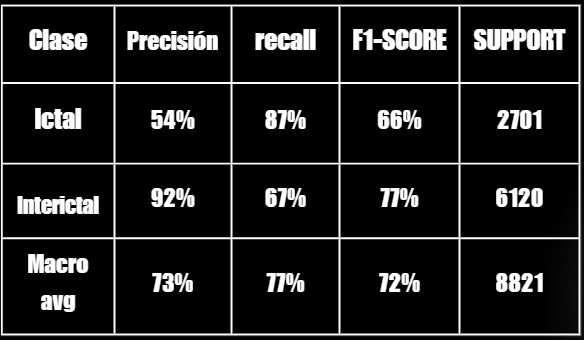

**Random Forest**

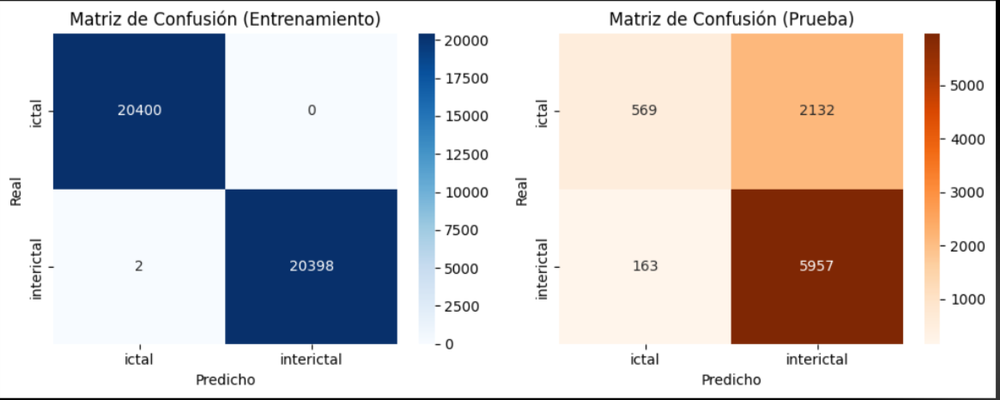

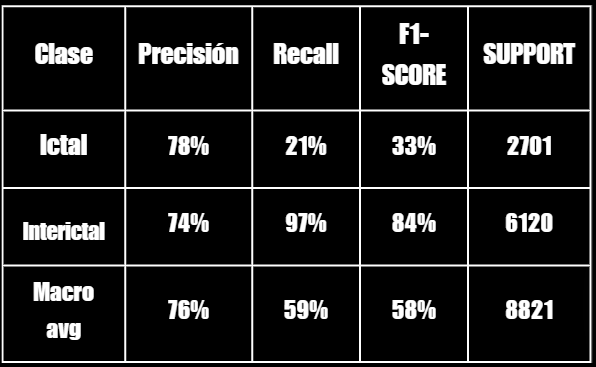

**Regresión Logística con SFBS**

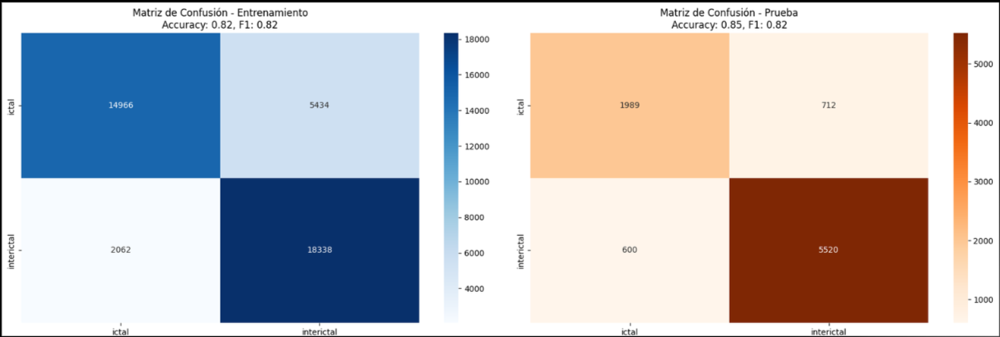

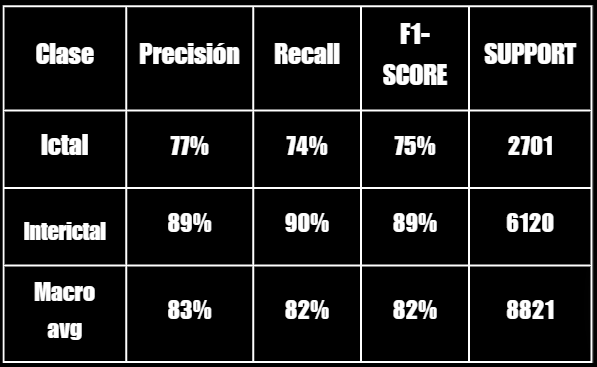

#### Regresión Logística

1. No SMOTE

En entrenamiento:
- Accuracy: 86%
- Recall (Ictal): 60%

En prueba:
- Accuracy: 79%
- Recall (Ictal): 50%

Matriz de confusión:

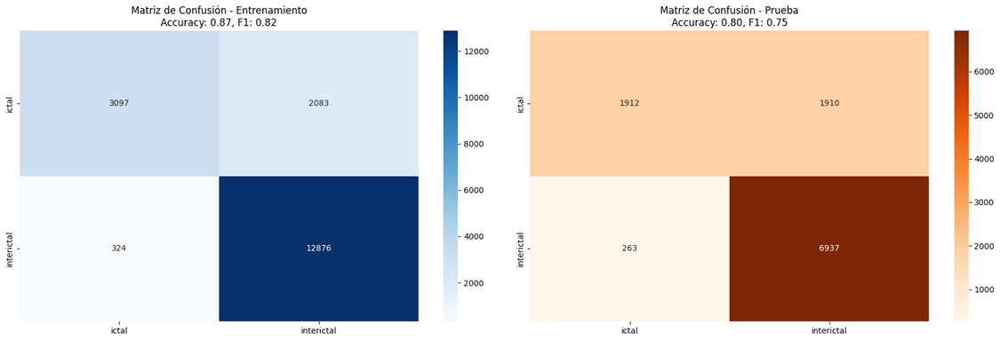

2. SMOTE

En entrenamiento:
- Accuracy: 83%
- Recall (Ictal): 76%

En prueba:
- Accuracy: 81%
- Recall (Ictal): 66%

Matriz de confusión:

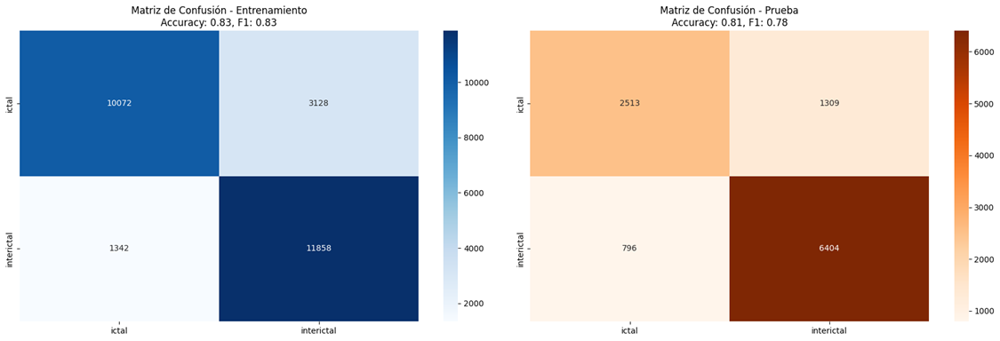

#### Random Forest

1. No SMOTE & No PCA

Hiperparámetros:

- Número de árboles: 150
- Profundidad máxima: 5
- División de muestras mínima: 2
- Máximo de características: 'Log2'
- Peso de clases: Balanceada


En entrenamiento:
- Accuracy: 88%
- Recall (Ictal): 81%

En prueba:
- Accuracy: 82%
- Recall (Ictal): 69%

Matriz de confusión:

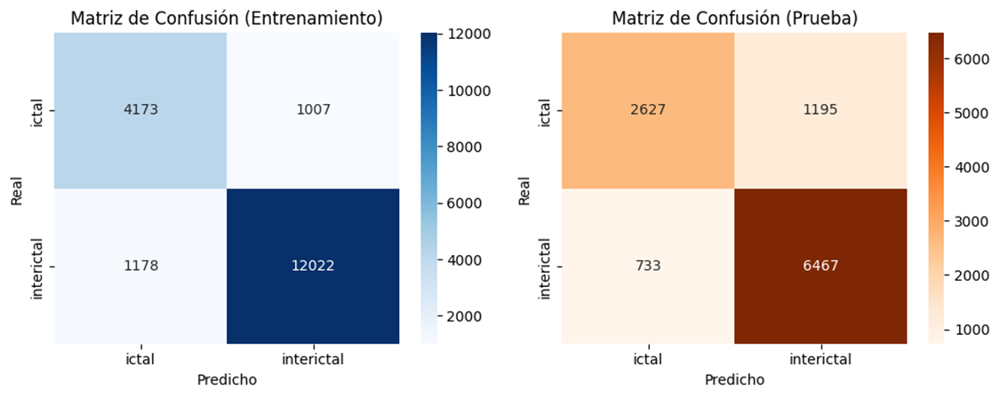

2. No SMOTE & PCA

Hiperparámetros:

- Número de árboles: 150
- Profundidad máxima: 5
- División de muestras mínima: 2
- Máximo de características: 'Sqrt'
- Peso de clases: Balanceada

En entrenamiento:
- Accuracy: 87%
- Recall (Ictal): 80%

En prueba:
- Accuracy: 79%
- Recall (Ictal): 67%

Matriz de confusión:

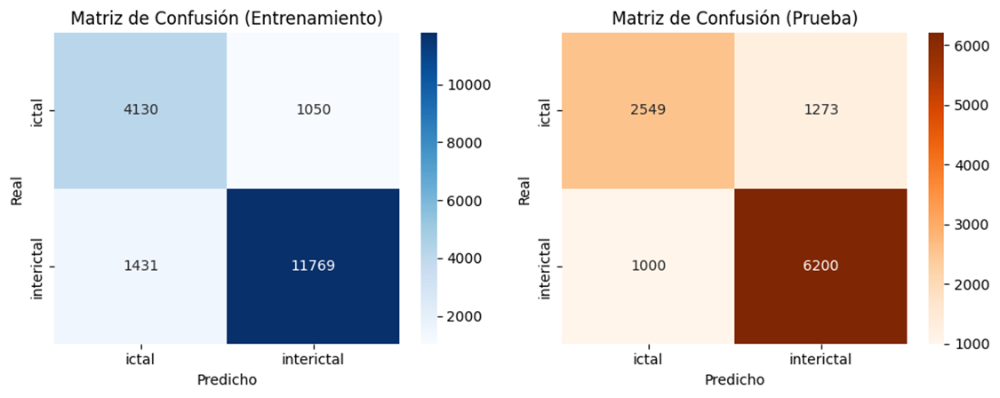

3. SMOTE & No PCA

Hiperparámetros:

- Número de árboles: 100
- Profundidad máxima: 5
- División de muestras mínima: 2
- Máximo de características: 'Log2'
- Peso de clases: Balanceada

En entrenamiento:
- Accuracy: 85%
- Recall (Ictal): 81%

En prueba:
- Accuracy: 81%
- Recall (Ictal): 69%

Matriz de confusión:

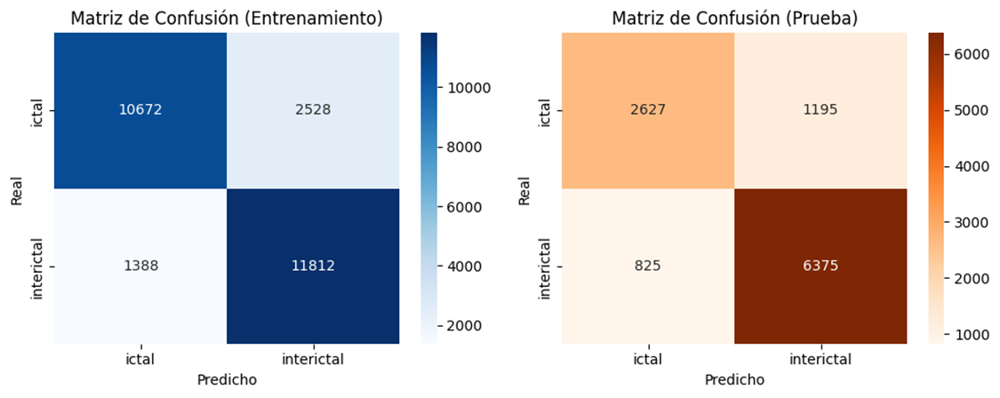

4. SMOTE & PCA

Hiperparámetros:

- Número de árboles: 150
- Profundidad máxima: 5
- División de muestras mínima: 2
- Máximo de características: 'Sqrt'
- Peso de clases: Balanceada

En entrenamiento:
- Accuracy: 84%
- Recall (Ictal): 79%

En prueba:
- Accuracy: 81%
- Recall (Ictal): 67%

Matriz de confusión:

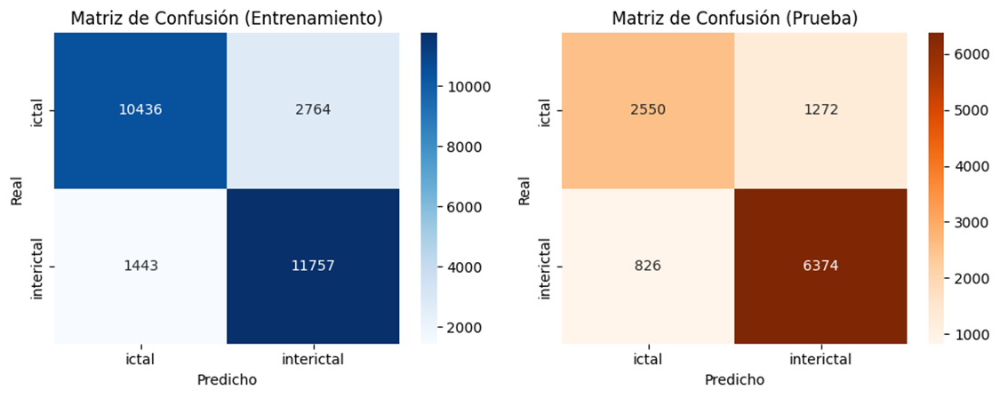

#### SVM

1. No SMOTE & No PCA

Hiperparámetros:
- C: 1.0
- gamma: 'scale'
- kernel: 'rbf'
- Peso de clases: Balanceada
- Probabilidad: True -> Útil para obtener probabilidades de ser necesario

En entrenamiento:
- Accuracy: 84%
- Recall (Ictal): 68%  

Matriz de confusión:

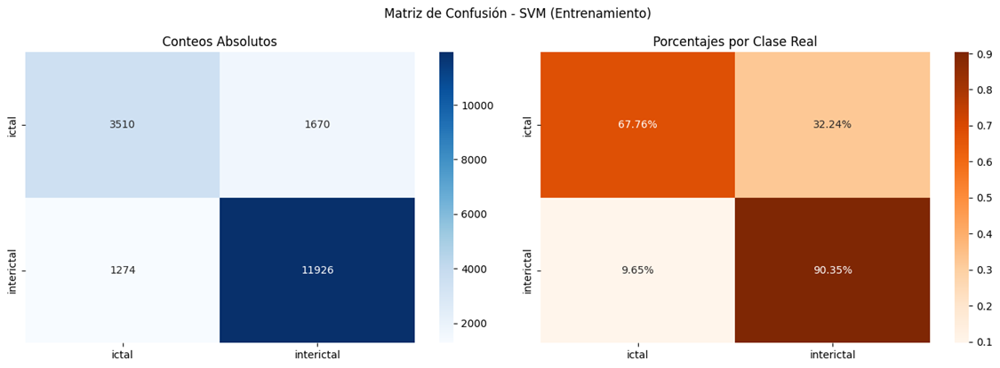

En prueba:
- Accuracy: 83%
- Recall (Ictal): 66%

Matriz de confusión:

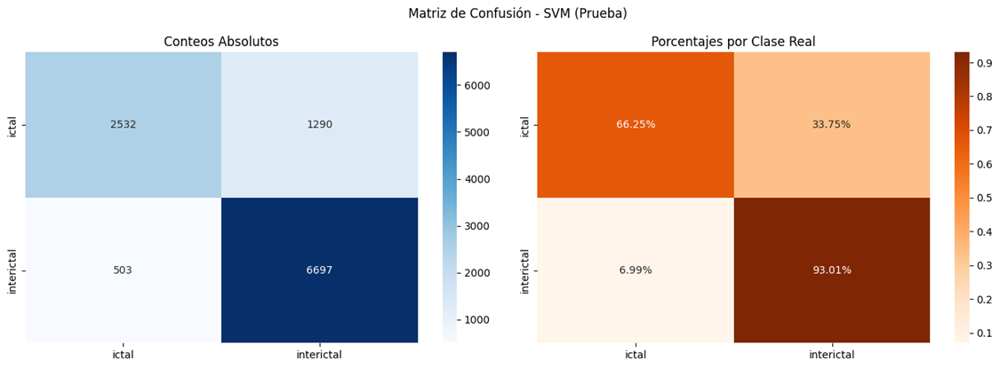

2. No SMOTE & PCA

Hiperparámetros:

- C: 0.1
- gamma: 'scale'
- kernel: 'rbf'
- Pesos de clases: Balanceado
- Probabilidad: True -> Útil para obtener probabilidades de ser necesario

En entrenamiento:
- Accuracy: 87%
- Recall (Ictal): 78%

Matriz de confusión:

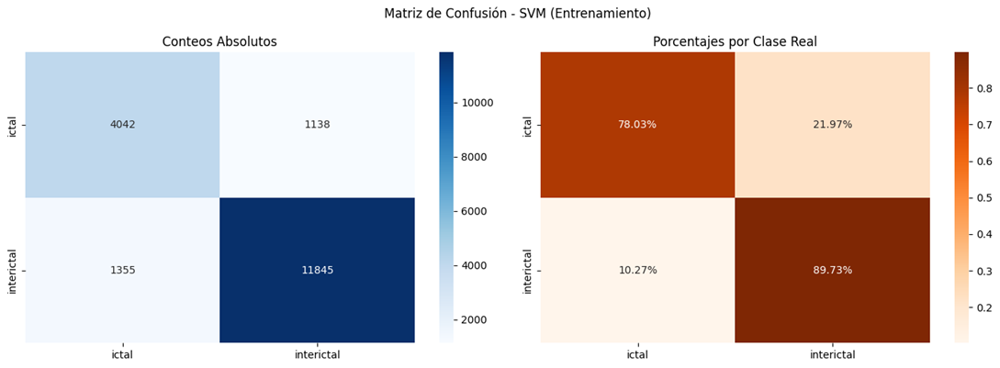

En prueba:
- Accuracy: 79%
- Recall (Ictal): 67%

Matriz de confusión:

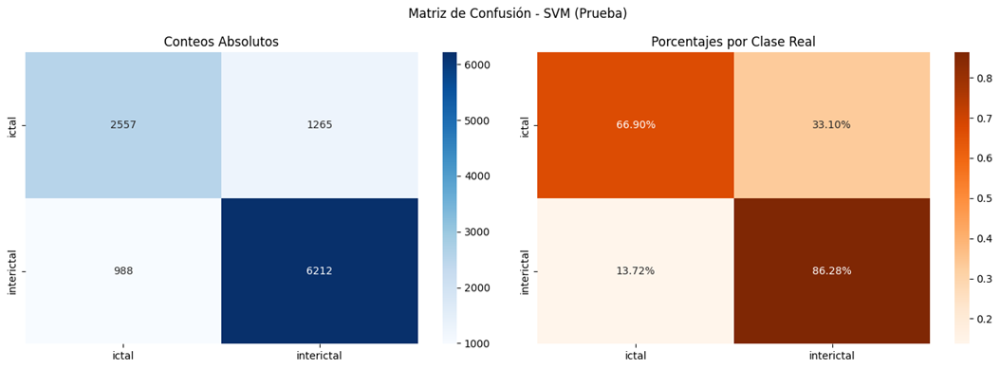

3. SMOTE & No PCA

Hiperparámetros:
- C: 10.0
- gamma: 'scale'
- kernel: 'rbf'
- Pesos de clases: Balanceado
- Probabilidad: True -> Útil para obtener probabilidades de ser necesario

En entrenamiento:
- Accuracy: 80%
- Recall (Ictal): 72%

Matriz de confusión:

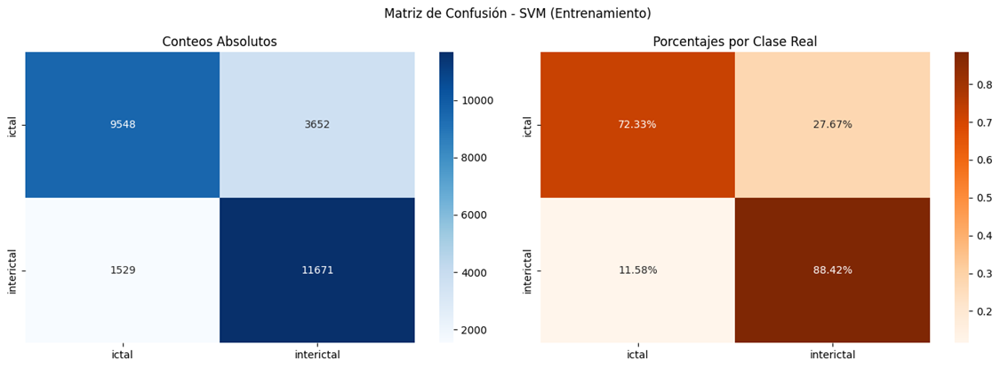

En prueba:
- Accuracy: 80%
- Recall (Ictal): 61%

Matriz de confusión:

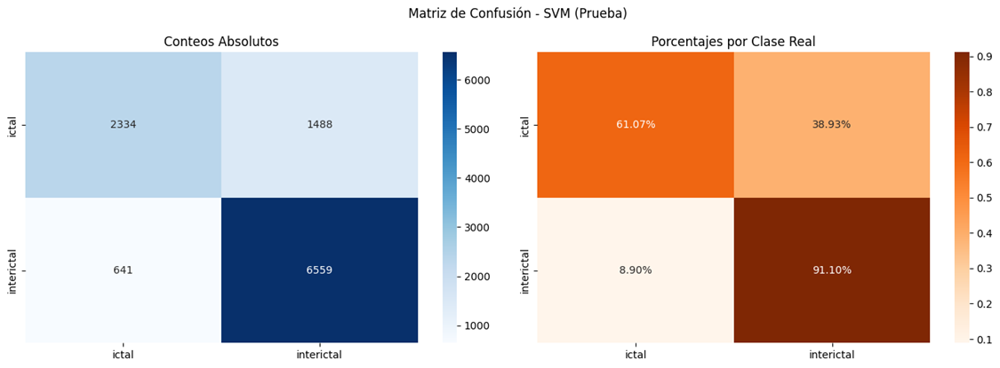

4. SMOTE & PCA

Hiperparámetros:
- C: 1.0
- gamma: 'scale'
- kernel: 'rbf'
- Peso de clases: Balanceada
- Probabilidad: True -> Útil para obtener probabilidades de ser necesario

En entrenamiento:
- Accuracy: 83%
- Recall (Ictal): 77%

Matriz de confusión:

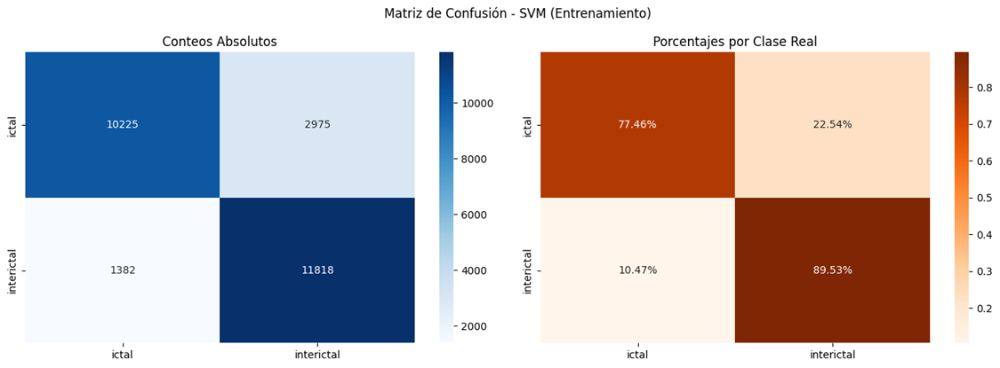

En prueba:
- Accuracy: 81%
- Recall (Ictal): 66%  

Matriz de confusión:

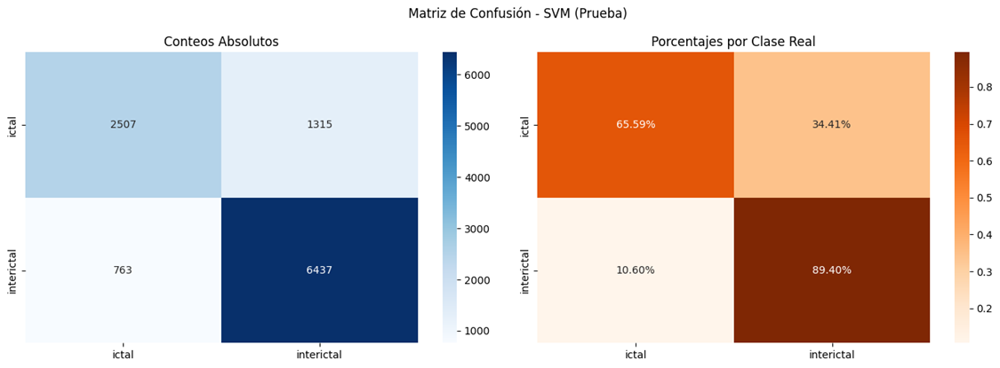

#### RNA (Backpropagation)

1. No SMOTE & No PCA

Hiperparámetros:

- Neuronas de capas ocultas: 1
- Learning rate: 0.001
- Configuración de capas ocultas: [8]

En entrenamiento:
- Accuracy: 82%
- Recall (Ictal): 67%

En prueba:
- Accuracy: 81%
- Recall (Ictal): 54%

Matriz de confusión:

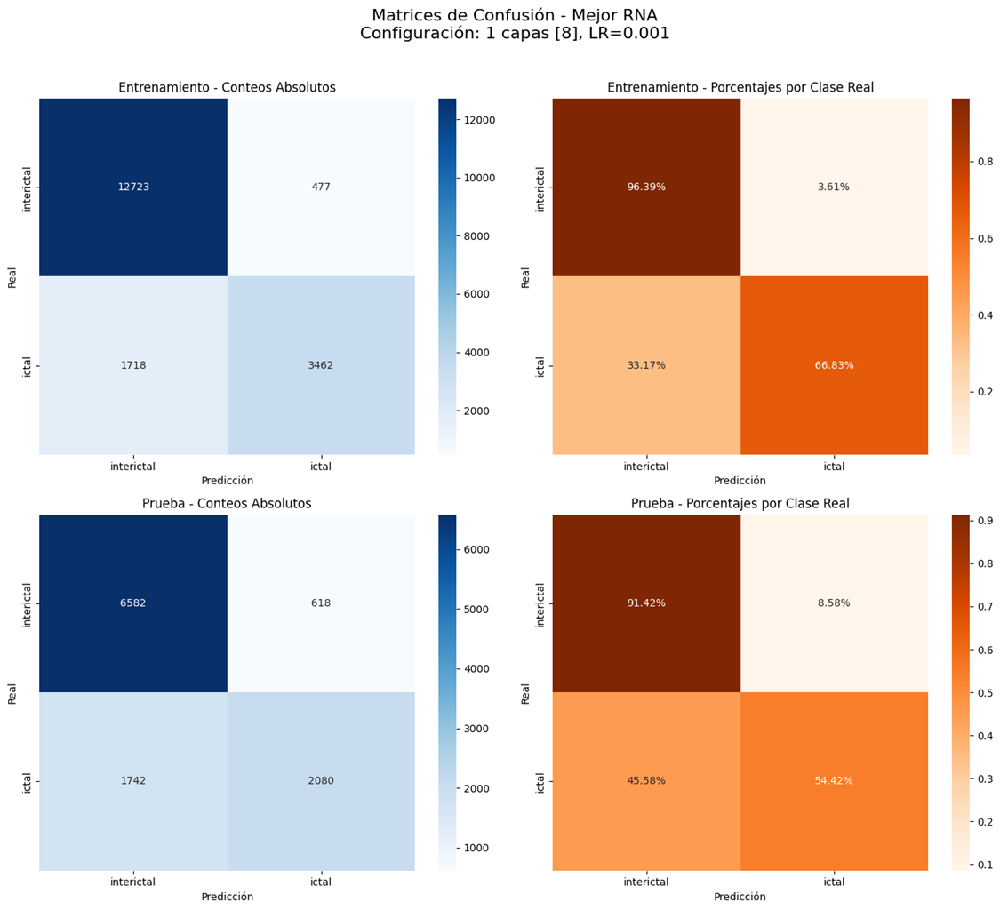

2. No SMOTE & PCA

Hiperparámetros:

- Neuronas de capas ocultas: 2
- Learning rate: 0.01
- Configuración de capas ocultas: [8, 4]

En entrenamiento:
- Accuracy: 88%
- Recall (Ictal): 68%

En prueba:
- Accuracy: 82%
- Recall (Ictal): 56%

Matriz de confusión:

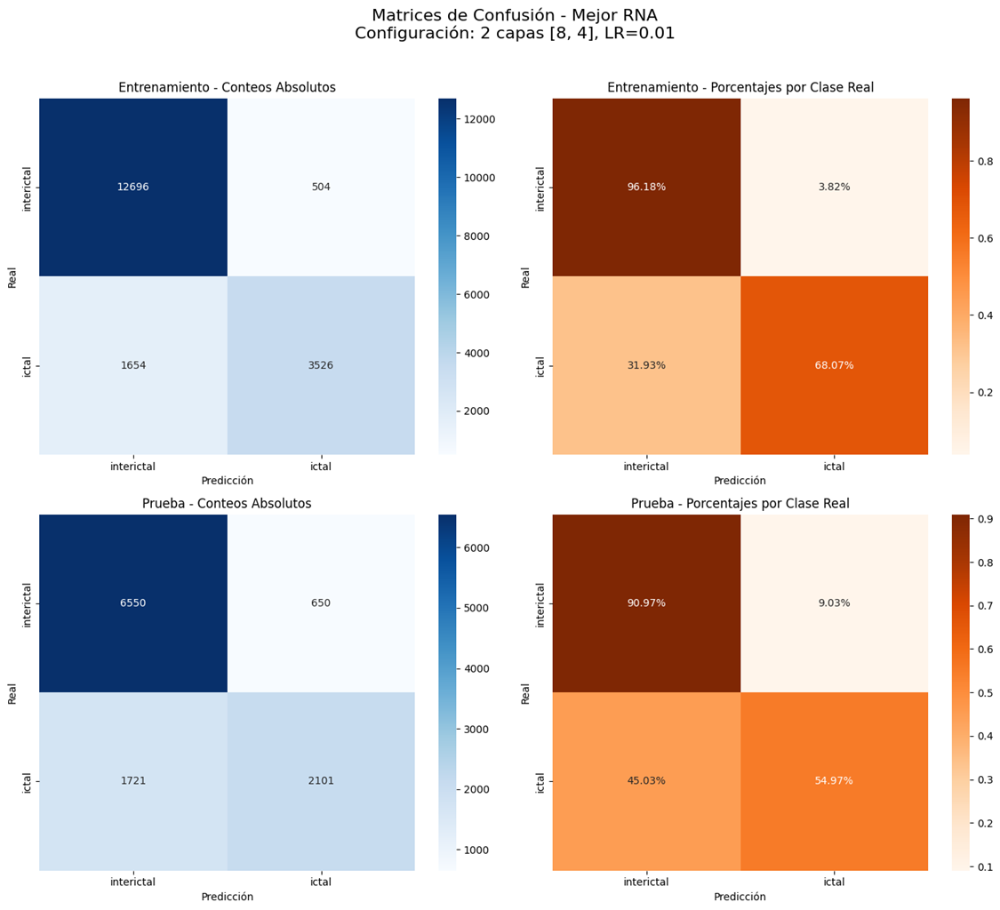

3. SMOTE & No PCA

Hiperparámetros:

- Neuronas de capas ocultas: 1
- Learning rate: 0.01
- Configuración de capas ocultas: [8]

En entrenamiento:
- Accuracy: 83%
- Recall (Ictal): 70%

En prueba:
- Accuracy: 82%
- Recall (Ictal): 65%

Matriz de confusión:

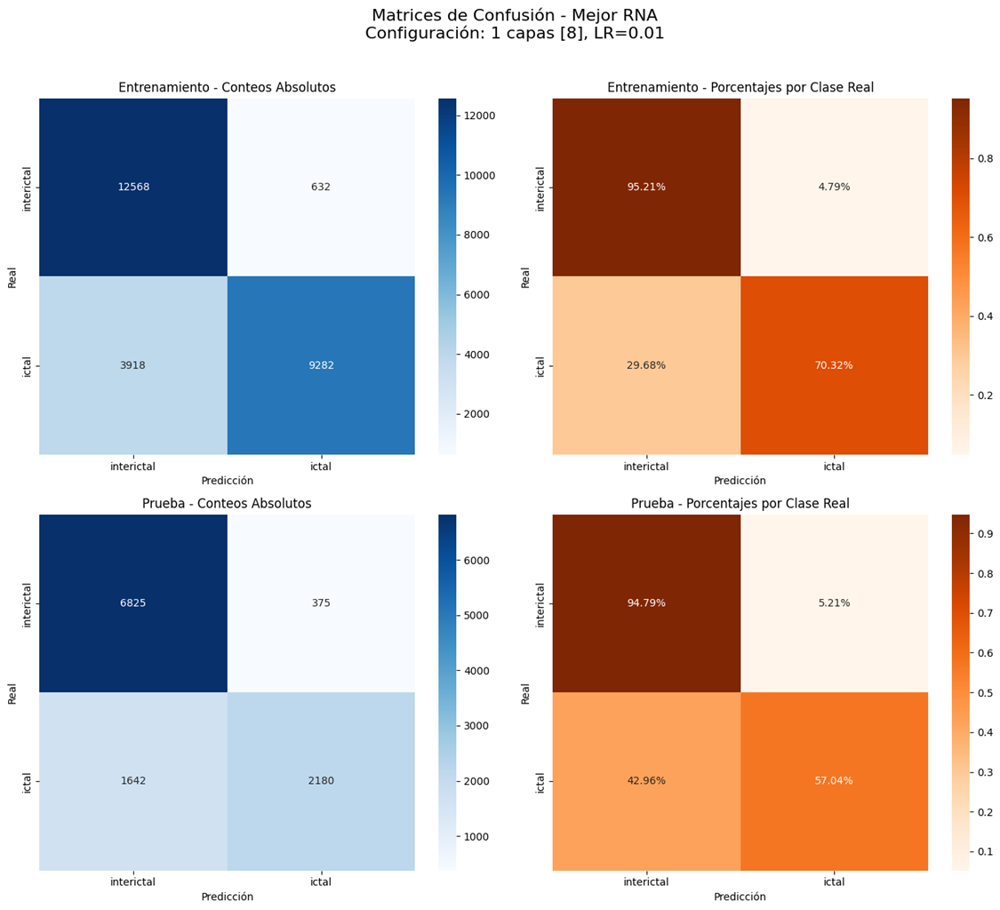

4. SMOTE & PCA

Hiperparámetros:

- Neuronas de capas ocultas: 1
- Learning rate: 0.01
- Configuración de capas ocultas: [32]

En entrenamiento:
- Accuracy: 84%
- Recall (Ictal): 74%

En prueba:
- Accuracy: 82%
- Recall (Ictal): 63%

Matriz de confusión:

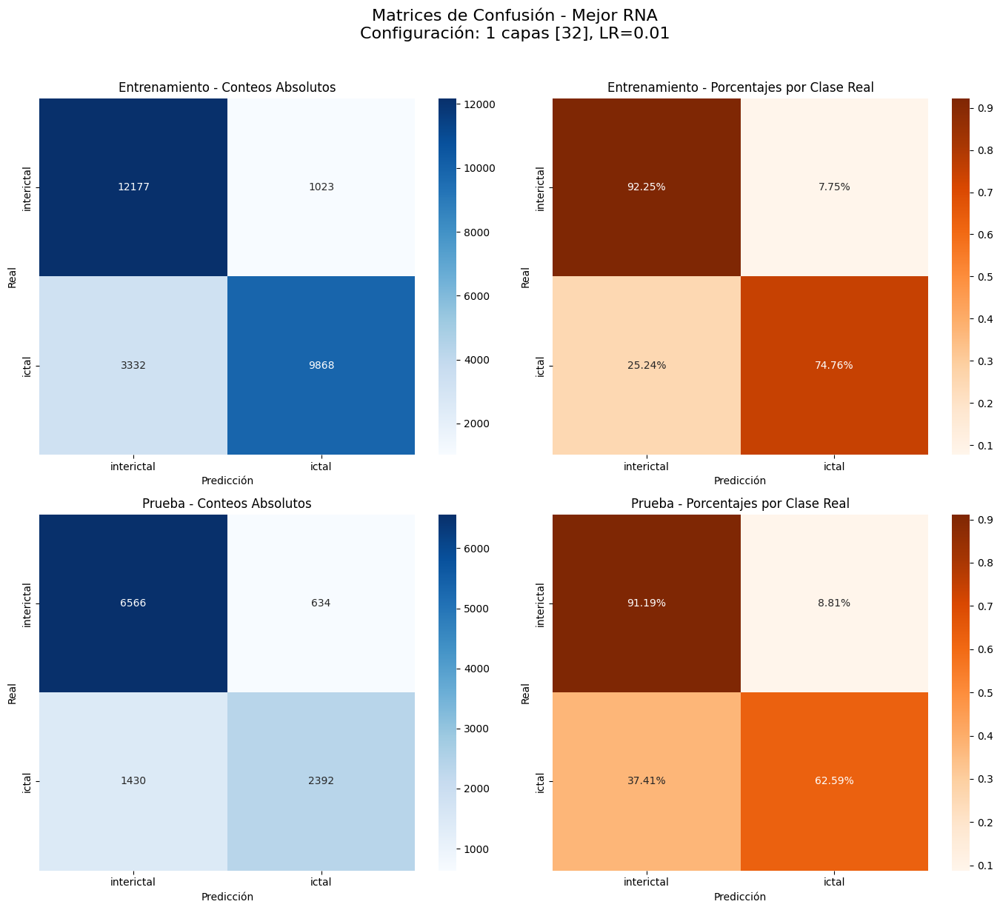

| Modelo                    | SMOTE | PCA | Conjunto      | Accuracy | Recall (Ictal) |
| ------------------------- | ----- | --- | ------------- | -------- | -------------- |
| **Regresión Logística**   | No    | —   | Entrenamiento | 86 %     | 60 %           |
|                           | No    | —   | Prueba        | 79 %     | 50 %           |
|                           | Sí    | —   | Entrenamiento | 83 %     | 76 %           |
|                           | Sí    | —   | Prueba        | 81 %     | 66 %           |
| **Random Forest**         | No    | No  | Entrenamiento | 88 %     | 81 %           |
|                           | No    | No  | Prueba        | 82 %     | 69 %           |
|                           | No    | Sí  | Entrenamiento | 87 %     | 80 %           |
|                           | No    | Sí  | Prueba        | 79 %     | 67 %           |
|                           | Sí    | No  | Entrenamiento | 85 %     | 81 %           |
|                           | Sí    | No  | Prueba        | 81 %     | 69 %           |
|                           | Sí    | Sí  | Entrenamiento | 84 %     | 79 %           |
|                           | Sí    | Sí  | Prueba        | 81 %     | 67 %           |
| **SVM**                   | No    | No  | Entrenamiento | 84 %     | 68 %           |
|                           | No    | No  | Prueba        | 83 %     | 66 %           |
|                           | No    | Sí  | Entrenamiento | 87 %     | 78 %           |
|                           | No    | Sí  | Prueba        | 79 %     | 67 %           |
|                           | Sí    | No  | Entrenamiento | 80 %     | 72 %           |
|                           | Sí    | No  | Prueba        | 80 %     | 61 %           |
|                           | Sí    | Sí  | Entrenamiento | 83 %     | 77 %           |
|                           | Sí    | Sí  | Prueba        | 81 %     | 66 %           |
| **RNA (Backpropagation)** | No    | No  | Entrenamiento | 82 %     | 67 %           |
|                           | No    | No  | Prueba        | 81 %     | 54 %           |
|                           | No    | Sí  | Entrenamiento | 88 %     | 68 %           |
|                           | No    | Sí  | Prueba        | 82 %     | 56 %           |
|                           | Sí    | No  | Entrenamiento | 83 %     | 70 %           |
|                           | Sí    | No  | Prueba        | 82 %     | 65 %           |
|                           | Sí    | Sí  | Entrenamiento | 84 %     | 74 %           |
|                           | Sí    | Sí  | Prueba        | 82 %     | 63 %           |


#### Tabla final

Por cuestiones prácticas y una comprensión mas sencilla de los modelos, se muestra un resumen de una serie de las métricas de desempeño que fueron consideradas para seleccionar la mejor variante de cada modelo para cumplir con el propósito de este proyecto.


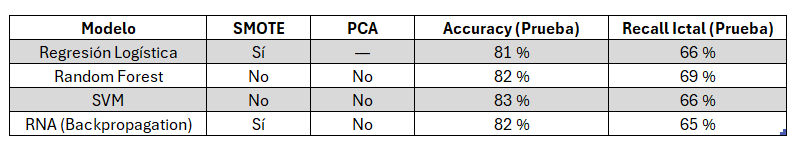


**Regresión Logística SMOTE**

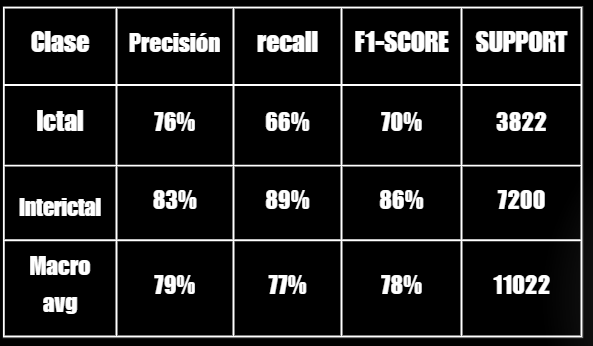

**Random Forest NO SMOTE & NO PCA**

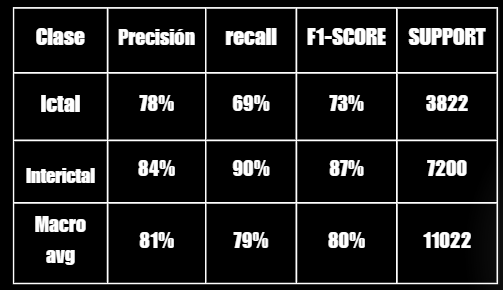


**SVM NO SMOTE & NO PCA**

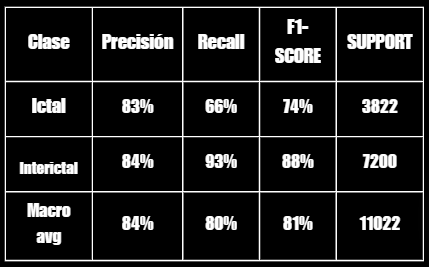

**RNA (Backpropagation) SI SMOTE & NO PCA**

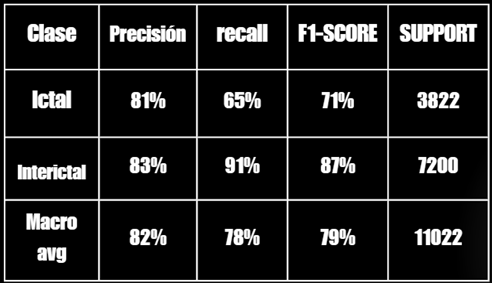

## Conclusiones

En cuanto al rendimiento de los modelos, observamos que la exactitud fue superior sin emplear la técnica de reducción de dimensionalidad (PCA). Al seleccionar los parámetros más adecuados y experimentar con variaciones de los modelos de ML, tanto con datos sintéticos como sin ellos, logramos una exactitud muy competente, alineada con las recomendaciones de los autores. Además, aun sin aplicar una arquitectura SIP o SDP (Spatially Independent/Dependent Processing), alcanzamos un recall diferenciador que nos permite detectar eventos clínicamente críticos.

Ahora del análsis del tablas nos encontramos que:

* La SVM sin SMOTE ni PCA alcanzó la mayor exactitud (83 %), lo que indica que es la más fiable a la hora de asignar correctamente las etiquetas en promedio.

* El Random Forest sin SMOTE ni PCA consiguió el mejor recall Ictal (69 %), lo que la convierte en la opción más efectiva para detectar verdaderamente los eventos críticos (minimizando los falsos negativos).

Entonces podemos que decir que, si objetivo principal es maximizar la exactitud general, la SVM es la más adecuada; pero si priorizamos la detección de todos los eventos críticos, el Random Forest resulta más robusto.

## Referencias Bibliográficas



[1] A. H. Shoeb, *Patient-Specific Seizure Onset Detection*. Massachusetts Institute of Technology, Department of Electrical Engineering and Computer Science, M.Eng. thesis, Aug. 2003.  

[2] Guttag, J. (2010). CHB-MIT Scalp EEG Database (version 1.0.0). PhysioNet. https://doi.org/10.13026/C2K01R.

[3] J.Gotman. *Automatic recognition of epileptic seizures in the eeg*. Electroencephalography and Clinical Neurophysiology, 54:530540, 1982

[4] D.W.Klass and D.D.Daly. Current Practice of Clinical Electroencephalography.Raven Press, 1979

[5]. *Building data presentation space*. Notas de clase. Departamento de ingeniería electrónica y
telecomunicaciones. Universidad de Antioquia, 2025